In [1]:
%%bigquery prd_meas_wide_analyzed
SELECT
*
FROM
`wbe-analysis.prd_dynamodb_processed.prd_meas_wide_analyzed`

Downloading: 100%|██████████| 2109/2109 [00:00<00:00, 3038.46rows/s]


In [2]:
%%bigquery prd_public_health_data_analyzed
SELECT
*
FROM
`wbe-analysis.prd_dynamodb_processed.prd_public_health_data_analyzed`

Downloading: 100%|██████████| 5664/5664 [00:00<00:00, 6819.94rows/s]


In [3]:
%%bigquery prd_sites
SELECT
*
FROM
`wbe-analysis.prd_dynamodb.prd_sites`
WHERE
_fivetran_deleted = False

Downloading: 100%|██████████| 128/128 [00:00<00:00, 169.15rows/s]


In [4]:
%%bigquery prd_geom_polygon
SELECT
*
FROM
`wbe-analysis.prd_dynamodb.prd_geom_polygon`
WHERE
_fivetran_deleted = False

Downloading: 100%|██████████| 38/38 [00:00<00:00, 49.82rows/s] 


In [5]:
%%bigquery df_geom_id_0
SELECT
*
FROM
`wbe-analysis.prd_dynamodb_processed.prd_geomean_all_geom_id_0`

Downloading: 100%|██████████| 2038/2038 [00:00<00:00, 2826.03rows/s]


In [6]:
%%bigquery df_geom_id_1
SELECT
*
FROM
`wbe-analysis.prd_dynamodb_processed.prd_geomean_all_geom_id_1`

Downloading: 100%|██████████| 5037/5037 [00:00<00:00, 7014.46rows/s]


In [27]:
%%bigquery df_geom_id_2
SELECT
*
FROM
`wbe-analysis.prd_dynamodb_processed.prd_geomean_all_geom_id_2`

Downloading: 100%|██████████| 5633/5633 [00:00<00:00, 6737.66rows/s]


In [28]:
prd_public_health_data_analyzed.columns
#prd_public_health_data_analyzed

Index(['phd_date', 'polygon_id', 'polygon_name', 'geom_id_0', 'geom_id_1',
       'geom_id_2', 'confirmed_case_oper', 'site_name', 'site_id',
       'val_conf_report_10', 'val_conf_report', 'val_conf_episode',
       'val_active', 'val_7_d_conf_report_10', 'val_7_d_conf_report',
       'val_7_d_conf_episode', 'val_7_d_active', 'val_14_d_conf_report_10',
       'val_14_d_conf_report', 'val_14_d_conf_episode', 'val_14_d_active',
       'val_30_d_conf_report_10', 'val_30_d_conf_report',
       'val_30_d_conf_episode', 'val_30_d_active', 'dateTime'],
      dtype='object')

In [29]:

print(df_geom_id_0.columns)
df_geom_id_0[df_geom_id_0["geom_id_0"]==1].head(5)[["val_7_d_conf_report_10","val_conf_report_10","val_7_d_conf_report"]]
df_geom_id_0[df_geom_id_0["phd_geom_id_0"]==5][["phd_date","geo_mean_usemeas_roll_3pts_centered"]]

Index(['sampling_date', 'confirmed_case_oper', 'geom_id_0', 'lab_id',
       'assay_method', 'cnt_blq', 'cnt_ud', 'cnt_det', 'geo_mean_usemeas',
       'geo_mean_uselloq', 'geo_mean_usetloq', 'geo_mean_normalized_usemeas',
       'geo_mean_normalized_uselloq', 'geo_mean_normalized_usetlop',
       'geo_mean_pmmov', 'sum_process_pop', 'avg_covn_1',
       'sum_covn_1_all_process_pop', 'string_agg_covn_1_process_pop',
       'site_ids', 'site_names', 'phd_date', 'phd_geom_id_0',
       'phd_confirmed_case_oper', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'val_conf_report', 'val_7_d_conf_report',
       'val_conf_episode', 'val_7_d_conf_episode', 'val_active',
       'val_7_d_active', 'polygon_ids', 'count_sites', 'str_agg_val',
       'covn_1_det_rate', 'covn_1_qua_rate',
       'geo_mean_usemeas_roll_3pts_centered',
       'geo_mean_uselloq_roll_3pts_centered',
       'geo_mean_usetloq_roll_3pts_centered',
       'geo_mean_normalized_usemeas_3pts_centered',
       'geo_mean_

,phd_date,geo_mean_usemeas_roll_3pts_centered
1556,2022-07-21,NaN
1557,2022-07-23,NaN
1558,2022-07-24,NaN
1559,2022-07-26,NaN
1560,2022-07-28,NaN
...,...,...
1620,2022-09-12,24060.932622
1621,2022-09-14,30742.477536
1622,2022-09-16,38100.203969
1623,2022-09-21,35255.705803


In [49]:
"""
This program onlys allows you do analysis by site
"""
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from scipy import stats
from sklearn.metrics import r2_score
import pandas as pd
import numpy as np
import datetime
import statistics
# Zipping results
import zipfile
import os, re, os.path


from itertools import cycle
# Japanese
import japanize_matplotlib

# Merge 
sel_cols = ['site_id','geom_id_0', 'geom_id_1', 'geom_id_2']
df = pd.merge(prd_meas_wide_analyzed,prd_geom_polygon[sel_cols], on="site_id", how="left")

# time type 処理
df["dateTime"] = pd.to_datetime(df["sampling_date"],format="%Y/%m/%d")
prd_public_health_data_analyzed["dateTime"] = pd.to_datetime(prd_public_health_data_analyzed["phd_date"],format="%Y/%m/%d")

sel_cols = ['site_id','val_conf_report','val_7_d_conf_report','dateTime']
# Merge phd
#df = pd.merge(df, prd_public_health_data_analyzed[sel_cols].copy(), on=["dateTime","site_id"],how="left")
df = pd.merge(prd_public_health_data_analyzed[sel_cols].copy(),df, on=["dateTime","site_id"],how="left")

# Copy 1 df_geom_src_id_0
df_geom_src_id_0 = df_geom_id_0.copy()
df_geom_src_id_1 = df_geom_id_1.copy()
df_geom_src_id_2 = df_geom_id_2.copy()

# Zero 処理 2022.09 研究開発部合意
"""
df["val_7_d_conf_report"] = np.where(df["val_7_d_conf_report"]<=0,1,df["val_7_d_conf_report"])
df_geom_src_id_0["val_7_d_conf_report"] = np.where(df_geom_src_id_0["val_7_d_conf_report"]<=0,1,df_geom_src_id_0["val_7_d_conf_report"])
df_geom_src_id_1["val_7_d_conf_report"] = np.where(df_geom_src_id_1["val_7_d_conf_report"]<=0,1,df_geom_src_id_1["val_7_d_conf_report"])
df_geom_src_id_0["val_7_d_conf_report_10"] = np.where(df_geom_src_id_0["val_7_d_conf_report_10"]<=0,1,df_geom_src_id_0["val_7_d_conf_report_10"])
df_geom_src_id_1["val_7_d_conf_report_10"] = np.where(df_geom_src_id_1["val_7_d_conf_report_10"]<=0,1,df_geom_src_id_1["val_7_d_conf_report_10"])
df_geom_src_id_0["val_7_d_conf_episode"] = np.where(df_geom_src_id_0["val_7_d_conf_episode"]<=0,1,df_geom_src_id_0["val_7_d_conf_episode"])
df_geom_src_id_1["val_7_d_conf_episode"] = np.where(df_geom_src_id_1["val_7_d_conf_episode"]<=0,1,df_geom_src_id_1["val_7_d_conf_episode"])
df_geom_src_id_0["val_7_d_active"] = np.where(df_geom_src_id_0["val_7_d_active"]<=0,1,df_geom_src_id_0["val_7_d_active"])
df_geom_src_id_1["val_7_d_active"] = np.where(df_geom_src_id_1["val_7_d_active"]<=0,1,df_geom_src_id_1["val_7_d_active"])
やってはいけないこと
df_geom_src_id_0["val_conf_report"] = np.where(df_geom_src_id_0["val_conf_report"]<=0,1,df_geom_src_id_0["val_conf_report"])
df_geom_src_id_1["val_conf_report"] = np.where(df_geom_src_id_1["val_conf_report"]<=0,1,df_geom_src_id_1["val_conf_report"])
df_geom_src_id_0["val_conf_report_10"] = np.where(df_geom_src_id_0["val_conf_report_10"]<=0,1,df_geom_src_id_0["val_conf_report_10"])
df_geom_src_id_1["val_conf_report_10"] = np.where(df_geom_src_id_1["val_conf_report_10"]<=0,1,df_geom_src_id_1["val_conf_report_10"])
df_geom_src_id_0["val_conf_episode"] = np.where(df_geom_src_id_0["val_conf_episode"]<=0,1,df_geom_src_id_0["val_conf_episode"])
df_geom_src_id_1["val_conf_episode"] = np.where(df_geom_src_id_1["val_conf_episode"]<=0,1,df_geom_src_id_1["val_conf_episode"])
df_geom_src_id_0["val_active"] = np.where(df_geom_src_id_0["val_active"]<=0,1,df_geom_src_id_0["val_active"])
df_geom_src_id_1["val_active"] = np.where(df_geom_src_id_1["val_active"]<=0,1,df_geom_src_id_1["val_active"])
"""

# OUTPUT PATH
OUTPUT_NAME_PATH = "output/"

# Definition dictionary for title
label_dicts = dict()

SELECT_LANG = "Japanese"
#SELECT_LANG = "English"

if SELECT_LANG=="Japanese":
    label_dicts["weighted_mean_usemeas"] = "下水中 SARS-CoV-2 RNA copies/L (加重平均)"
    label_dicts["geo_mean_usetloq"] = "下水中 SARS-CoV-2 RNA copies/L (幾何平均)"
    label_dicts["geo_mean_uselloq"] = "下水中 SARS-CoV-2 RNA copies/L (幾何平均)"
    label_dicts["geo_mean_usemeas"] = "下水中 SARS-CoV-2 RNA copies/L (幾何平均)"
    label_dicts["geo_mean_uselloq_roll_3pts_centered"] = "下水中 SARS-CoV-2 RNA copies/L (幾何平均) 3点平均(中心)"
    label_dicts["geo_mean_usemeas_roll_3pts_centered"] = "下水中 SARS-CoV-2 RNA copies/L (幾何平均) 3点平均(中心)"
    label_dicts["geo_mean_usemeas_roll_3pts_onesided"] = "下水中 SARS-CoV-2 RNA copies/L (幾何平均) 3点平均(過去2点含む)"

    label_dicts["geo_mean_usetloq_flow"] = "下水中 SARS-CoV-2 RNA copies/day (幾何平均)"
    label_dicts["geo_mean_normalized_usemeas"] = "下水中 SARS-CoV-2 RNA copies/PMMoV (幾何平均)"
    label_dicts["geo_mean_normalized_usetlop"] = "下水中 SARS-CoV-2 RNA copies/PMMoV (幾何平均)"
    label_dicts["geo_mean_normalized_usemeas_3pts_centered"] = "下水中 SARS-CoV-2 RNA copies/PMMoV (幾何平均) 3点平均(中心)"
    label_dicts["geo_mean_normalized_usemeas_3pts_onesided"] = "下水中 SARS-CoV-2 RNA copies/PMMoV (幾何平均) 3点平均(過去2点含む)"

    #label_dicts["geo_mean_usetloq_flow_pmmov"] = "下水中 Normalised SARS-CoV-2 RNA copies/PMMoV (geo. mean)"
    label_dicts["val_conf_report"] = "新規感染者数"
    label_dicts["val_conf_report_10"] = "10当たり新規感染者数"
    label_dicts["val_conf_episode"] = "新規感染者数(発症別日)"
    label_dicts["val_active"] = "療養者数"
    label_dicts["val_7_d_conf_report"] = "7日間移動平均 新規感染者数"
    label_dicts["val_7_d_conf_report_10"] = "10当たり7日間移動平均新規感染者数"

    label_dicts["val_7_d_conf_episode"] = "7日間移動平均 新規感染者数(発症別日)"
    label_dicts["val_7_d_active"] = "7日間移動平均 療養者数"
    label_dicts["val_7_d_conf_report_p10m"] = "10当たり7日間移動平均新規感染者数"
    label_dicts["geo_mean_pmmov"] = "下水中 PMMoV RNA copies/L (幾何平均)"
    label_dicts["pmmov_tbl"] = "下水中 PMMoV RNA copies/L"
    label_dicts["covn_1_tbl"] = "下水中 ARS-CoV-2 RNA copies/L"
    label_dicts["covn_1_usemeas"] = "下水中 SARS-CoV-2 RNA copies/L"
    label_dicts["covn_1_usemeas_rolling3"] = "下水中 SARS-CoV-2 RNA copies/L 3点平均(過去2点含む)"
    label_dicts["covn_1_usemeas_rolling3_pop1000"] = "処理人口正規化した下水中SARS-CoV-2 RNA copies/L 3点平均(過去2点含む)"

    label_dicts["log_covn_1_tbl"] = "下水中 SARS-CoV-2 RNA copies/L　(対数)"
    label_dicts["covn_1_tbl_p10m"] = "処理人口正規化した下水中 SARS-CoV-2 RNA copies/L (10万当たり)"
    label_dicts["covn_1_tbl_p10m_pmmov"] = "処理人口正規化した下水中 SARS-CoV-2 RNA 1/PMMoV (10万当たり)"

    label_dicts["covn_1_to_pmmov"] = "下水中 SARS-CoV-2 RNA copies/PMMoV"
    label_dicts["covn_1_to_pmmov_rolling3"] = "下水中 SARS-CoV-2 RNA copies/PMMoV (過去2点含む)"
    label_dicts["covn_1_pmmov"] = "下水中 SARS-CoV-2 RNA copies/PMMoV"
    label_dicts["covn_1_pmmov_1e4"] = "下水中 SARS-CoV-2 RNA copies/PMMoV x 10^{4}"
    label_dicts["sampling_date"] = "採水日"
    label_dicts["slope"] = "傾き"
    label_dicts["acceleration"] = "傾きの傾き"
    label_dicts["detected_flg"] = "検出率"
    label_dicts["covn_1_det_rate"] = "検出率"
    label_dicts["covn_1_det_rate_rolling3"] = "検出率 3点平均(過去3点含む)"
    label_dicts["covn_1_det_rate_rolling6"] = "検出率 6点平均(過去6点含む)"
    label_dicts["covn_1_qua_rate"] = "定量率"
    label_dicts["covn_1_qua_rate_rolling3"] = "定量率 3点平均(過去3点含む)"
    label_dicts["covn_1_qua_rate_rolling6"] = "定量率 7点平均(過去3点含む)"

    label_dicts["log_pmmov_tbl"] = "下水中 PMMoV RNA copies/L (対数)"
    label_dicts["process_pop_1000"] = "処理人口"
    label_dicts["diff_from_npts"]  = "N点前との差"
    
else:
    label_dicts["weighted_mean_usemeas"] = "SARS-CoV-2 RNA copies/L (Pop. weighted mean)"
    label_dicts["geo_mean_usetloq"] = "SARS-CoV-2 RNA copies/L (geo. mean)"
    label_dicts["geo_mean_uselloq"] = "SARS-CoV-2 RNA copies/L (geo. mean)"
    label_dicts["geo_mean_usemeas"] = "SARS-CoV-2 RNA copies/L (geo. mean)"
    label_dicts["geo_mean_uselloq_roll_3pts_centered"] = "SARS-CoV-2 RNA copies/L (geo. mean) 3 points averaged(centered)"
    label_dicts["geo_mean_usemeas_roll_3pts_centered"] = "SARS-CoV-2 RNA copies/L (geo. mean) 3 points averaged(centered)"
    label_dicts["geo_mean_usemeas_roll_3pts_onesided"] = "SARS-CoV-2 RNA copies/L (geo. mean) 3 points averaged(one-sided)"

    label_dicts["geo_mean_usetloq_flow"] = "Normalised SARS-CoV-2 RNA copies/L (geo. mean)"
    label_dicts["geo_mean_normalized_usemeas"] = "SARS-CoV-2 RNA copies/PMMoV (geo. mean)"
    label_dicts["geo_mean_normalized_usetlop"] = "SARS-CoV-2 RNA copies/PMMoV (geo. mean)"
    label_dicts["geo_mean_normalized_usemeas_3pts_centered"] = "SARS-CoV-2 RNA copies/PMMoV (geo. mean) 3 points averaged(centered)"
    label_dicts["geo_mean_normalized_usemeas_3pts_onesided"] = "SARS-CoV-2 RNA copies/PMMoV (geo. mean) 3 points averaged(one-sided)"

    label_dicts["geo_mean_usetloq_flow_pmmov"] = "Normalised SARS-CoV-2 RNA copies/PMMoV (geo. mean)"
    label_dicts["val_conf_report"] = "Daily cases"
    label_dicts["val_conf_report_10"] = "Daily active cases per 100K people "
    label_dicts["val_conf_episode"] = "Daily episode cases"
    label_dicts["val_active"] = "Daily active cases"
    label_dicts["val_7_d_conf_report"] = "Average daily cases for past 7 days"
    label_dicts["val_7_d_conf_report_10"] = "Average daily cases per 100K people for past 7 days"

    label_dicts["val_7_d_conf_episode"] = "Average daily episode cases for past 7 days"
    label_dicts["val_7_d_active"] = "Average daily active cases for past 7 days"
    label_dicts["val_7_d_conf_report_p10m"] = "Average daily cases per 100K people for past 7 day"
    label_dicts["geo_mean_pmmov"] = "PMMoV RNA copies/L (geo. mean)"
    label_dicts["pmmov_tbl"] = "PMMoV RNA copies/L"
    label_dicts["covn_1_tbl"] = "SARS-CoV-2 RNA copies/L"
    label_dicts["covn_1_usemeas"] = "SARS-CoV-2 RNA copies/L"
    label_dicts["covn_1_usemeas_rolling3"] = "SARS-CoV-2 RNA copies/L 3 points rolling"
    label_dicts["covn_1_usemeas_rolling3_pop1000"] = "SARS-CoV-2 RNA copies/L per processed pop. 3 points rolling"

    label_dicts["log_covn_1_tbl"] = "Log SARS-CoV-2 RNA copies/L"
    label_dicts["covn_1_tbl_p10m"] = "SARS-CoV-2 RNA copies/L for 100,000 people"
    label_dicts["covn_1_tbl_p10m_pmmov"] = "SARS-CoV-2 RNA 1/PMMoV for 100,000 people"

    label_dicts["covn_1_to_pmmov"] = "SARS-CoV-2 RNA copies/PMMoV"
    label_dicts["covn_1_to_pmmov_rolling3"] = "SARS-CoV-2 RNA copies/PMMoV 3 points rolling"
    label_dicts["covn_1_pmmov"] = "SARS-CoV-2 RNA copies/PMMoV"
    label_dicts["covn_1_pmmov_1e4"] = "SARS-CoV-2 RNA copies/PMMoV x 10^{4}"
    label_dicts["sampling_date"] = "Sampling date"
    label_dicts["slope"] = "Velocity"
    label_dicts["acceleration"] = "Acceleration"
    label_dicts["detected_flg"] = "Detection Probability(P)"
    label_dicts["covn_1_det_rate"] = "Detection Probability(P)"
    label_dicts["covn_1_det_rate_rolling3"] = "Detection Probability(P) 3 points avg"
    label_dicts["covn_1_det_rate_rolling6"] = "Detection Probability(P) 6 points avg"
    label_dicts["covn_1_qua_rate"] = "Quantification Probability(P)"
    label_dicts["covn_1_qua_rate_rolling3"] = "Quantification Probability(P) 3 points avg"
    label_dicts["covn_1_qua_rate_rolling6"] = "Quantification Probability(P) 6 points avg"

    label_dicts["log_pmmov_tbl"] = "Log PMMoV RNA copies/PMMoV"
    label_dicts["process_pop_1000"] = "Processed Population"
    label_dicts["diff_from_npts"]  = "Difference comparing N point before"


# GeomId 0 dictionary
geom_id_0_to_name = dict()
geom_id_0_to_name[0] = "miyazuwan"
geom_id_0_to_name[1] = "kyotoshi3pts"
geom_id_0_to_name[2] = "kanagawa2pts"
geom_id_0_to_name[3] = "kagawa2pts"
geom_id_0_to_name[4] = "yabu5pts"
geom_id_0_to_name[5] = "okinawa3pts"
geom_id_0_to_name[6] = "okinawa_dom"
geom_id_0_to_name[7] = "okinawa_int"
geom_id_0_to_name[8] = "saitama12pts"
geom_id_0_to_name[9] = "mito4pts"
geom_id_0_to_name[10] = "akita3pts"

# GeomId 1 dictionary
geom_id_1_to_name = dict()
geom_id_1_to_name[0] = "kyoto_miyazuwan"
geom_id_1_to_name[1] = "kyoto_toba1"
geom_id_1_to_name[2] = "kyoto_toba2"
geom_id_1_to_name[3] = "kyoto_ishida"
geom_id_1_to_name[4] = "kanagawa_sagan"
geom_id_1_to_name[5] = "kanagawa_ugan"
geom_id_1_to_name[6] = "kagawa_daisokugawa"
geom_id_1_to_name[7] = "kagawa_takamtsu"
geom_id_1_to_name[8] = "yabu_yashika"
geom_id_1_to_name[9] = "yabu_yabuchuou"
geom_id_1_to_name[10] = "yabu_oya"
geom_id_1_to_name[11] = "yabu_kanmiyachubu"
geom_id_1_to_name[12] = "yabu_kanmiyatobu"
geom_id_1_to_name[13] = "okinawa_naha"
geom_id_1_to_name[14] = "okinawa_ginowan"
geom_id_1_to_name[15] = "okinawa_gushikawa"
geom_id_1_to_name[16] = "okinawa_nishihara"
geom_id_1_to_name[17] = "okinawa_dom"
geom_id_1_to_name[18] = "okinawa_int"
geom_id_1_to_name[19] = "saitama8pts"
geom_id_1_to_name[20] = "saitama_hidakashi"
geom_id_1_to_name[21] = "saitama_chichibushi"
geom_id_1_to_name[22] = "saitama_saitama"
geom_id_1_to_name[23] = "saitama_hannnoushi"
geom_id_1_to_name[24] = "mito2pts"
geom_id_1_to_name[25] = "mito_nakagawa"
geom_id_1_to_name[26] = "akita2pts"
geom_id_1_to_name[27] = "akita_deto"

# GeomId 2 dictionary
geom_id_2_to_name = dict()
geom_id_2_to_name[0] = "kyoto_miyazuwan"
geom_id_2_to_name[1] = "kyoto_toba1"
geom_id_2_to_name[2] = "kyoto_toba2"
geom_id_2_to_name[3] = "kyoto_ishida"
geom_id_2_to_name[4] = "kanagawa_sagan"
geom_id_2_to_name[5] = "kanagawa_ugan"
geom_id_2_to_name[6] = "kagawa_daisokugawa"
geom_id_2_to_name[7] = "kagawa_takamtsu"
geom_id_2_to_name[8] = "yabu_yashika"
geom_id_2_to_name[9] = "yabu_yabuchuou"
geom_id_2_to_name[10] = "yabu_oya"
geom_id_2_to_name[11] = "yabu_kanmiyachubu"
geom_id_2_to_name[12] = "yabu_kanmiyatobu"
geom_id_2_to_name[13] = "okinawa_naha"
geom_id_2_to_name[14] = "okinawa_ginowan"
geom_id_2_to_name[15] = "okinawa_gushikawa"
geom_id_2_to_name[16] = "okinawa_nishihara"
geom_id_2_to_name[17] = "okinawa_dom"
geom_id_2_to_name[18] = "okinawa_int"
geom_id_2_to_name[19] = "saitama_nakagawa"
geom_id_2_to_name[20] = "saitama_motoarakawa"
geom_id_2_to_name[21] = "saitama_sinngasikawa"
geom_id_2_to_name[22] = "saitama_furutone"
geom_id_2_to_name[23] = "saitama_arakawajyouryuu"
geom_id_2_to_name[24] = "saitama_ichinokawa"
geom_id_2_to_name[25] = "saitama_oyamakawa"
geom_id_2_to_name[26] = "saitama_arakawa"
geom_id_2_to_name[27] = "saitama_hidakashi"
geom_id_2_to_name[28] = "saitama_chichibushi"
geom_id_2_to_name[29] = "saitama_saitama"
geom_id_2_to_name[30] = "saitama_hannnoushi"
geom_id_2_to_name[31] = "mito1"
geom_id_2_to_name[32] = "mito2"
geom_id_2_to_name[33] = "mito_nakagawa"
geom_id_2_to_name[34] = "mito_sakuragawa"
geom_id_2_to_name[35] = "akita_rinkai"
geom_id_2_to_name[36] = "akita_yabashi"
geom_id_2_to_name[37] = "akita_deto"

# Zero 処理
df["covn_1_tbl"] = np.where(df["covn_1_tbl"]==0,1,df["covn_1_tbl"])
df.head(5)
df_geom_src_id_1[df_geom_src_id_1["geom_id_1"]==19].head(100)[["site_ids","val_7_d_conf_report","lab_id"]]
df_geom_src_id_0[df_geom_src_id_0["geom_id_0"]==8].head(100)[["sampling_date","site_ids","val_7_d_conf_report","lab_id"]]

,sampling_date,site_ids,val_7_d_conf_report,lab_id
1841,2022-07-19,"f00095,f00031",3631.500000,RBI
1842,2022-07-22,"f00095,f00031",8750.000000,RBI
1843,2022-07-26,"f00095,f00031",11090.714286,RBI
1844,2022-07-29,"f00095,f00031",12492.285714,RBI
1845,2022-08-02,"f00095,f00031",13011.000000,RBI
1846,2022-08-05,"f00095,f00031",13271.428571,RBI
1847,2022-08-09,"f00095,f00031",12808.285714,RBI
1848,2022-08-19,"f00095,f00031",9867.714286,RBI
1849,2022-08-23,"f00095,f00031",11071.428571,RBI
1850,2022-08-26,"f00095,f00031",10522.714286,RBI


In [31]:
# Load flow data
#df_stream_type = pd.read_csv("settings_sites.csv")
df_stream_type = pd.read_csv("settings_sites_mod.csv")
print(df_stream_type.columns)
df_stream_type = df_stream_type.dropna()
df_stream_type

Index(['site_id', 'name', 'type_stream', 'type_stream_id'], dtype='object')


,site_id,name,type_stream,type_stream_id
0,f00088,秋田臨海処理センター,分流式,3.0
1,f00091,水戸市浄化センター・１,合流式,0.0
2,f00092,水戸市浄化センター・２（流域下水からの引き込み）,分流式,2.0
3,f00031,荒川水循環センター,合流式,0.0
4,f00096,元荒川水循環センター,合流式,0.0
5,f00097,新河岸川水循環センター,分流式,2.0
6,f00095,中川水循環センター,分流式,2.0
7,f00098,古利根川水循環センター,合流式,0.0
11,f00104,さいたま市下水処理センター,分流式,3.0
13,f00105,飯能市浄化センター,分流式,3.0


In [32]:
# USING wide table

# Set level of population 
df_wpop = df.copy()
df_wpop["process_pop_1000"] = np.round(df_wpop["process_pop"]/1e3,2)
df_wpop = df_wpop[df_wpop["process_pop_1000"]>0].copy()
df_wpop["site_class"] = \
        np.where(df_wpop["process_pop_1000"]>1000, '1.処理人口100-150万', \
             np.where(df_wpop['process_pop_1000']>500, '2.処理人口50-100万', \
                 np.where(df_wpop['process_pop_1000']>200, '3.処理人口20-50万', \
                     np.where(df_wpop['process_pop_1000']>100, '4.処理人口10-20万', \
                                                               '5.処理人口10万未満'))))
df_wpop = df_wpop.sort_values(by="site_class")
#
#df_wpop["pop_def"] = np.where(df_wpop["pop_1000"]/1000>=1.0, "LL", "")
#df_wpop["pop_def"] = np.where(df_wpop["pop_1000"]/1000<1.0 and df_wpop["pop_1000"]/100>=1.0 , "L", df_wpop["pop_def"])
#df_wpop["pop_def"] = np.where(df_wpop["pop_1000"]/100<1.0 and df_wpop["pop_1000"]/10>=1.0 , "M", df_wpop["pop_def"])
#df_wpop["pop_def"] = np.where(df_wpop["pop_1000"]/10<1.0 and df_wpop["pop_1000"]/1>=1.0 , "S", df_wpop["pop_def"])
df_wpop = df_wpop[df_wpop["pop_1000"].notna()].copy()
df_wpop_epi = df_wpop[df_wpop["assay_method"]=="HS"].copy()
df_wpop_epi.columns
df_wpop_epi = df_wpop_epi[df_wpop_epi["site_id"]!="f00120"].copy()
df_wpop_epi = df_wpop_epi[df_wpop_epi["site_id"]!="f00119"].copy()
#print(df_wpop_epi[df_wpop_epi["pmmov_tbl"]<1e4][["site_id","site_name"]])
#plot_time_series(df_wpop_epi, "sampling_date","pmmov_tbl", 
#                 break_idx="site_class",
#                 log=True,marker="o",
#                 min_lim_x=datetime.date(2022,6,1),max_lim_x=datetime.date(2022,10,30))
df_wpop_epi.columns

Index(['site_id', 'val_conf_report', 'val_7_d_conf_report', 'dateTime',
       'sample_id', 'event_name', 'lab_id', 'original_file_name',
       'analyzed_date', 'group_id', 'group_type', 'polygon_id', 'site_name',
       'registerd_name', 'process_pop', 'geo_coor', 'quality_flag', 'covn_1',
       'pmmov', 'covn_1_d', 'covn_1_ud', 'covn_1_blq', 'pmmov_d', 'pmmov_ud',
       'pmmov_blq', 'covn_1_pmmov', 'covn_1_pmmov_usetloq',
       'covn_1_pmmov_uselloq', 'covn_1_tbl', 'pmmov_tbl', 'covn_1_uselloq',
       'pmmov_uselloq', 'covn_1_usemeas', 'pmmov_usemeas', 'covn1_tloq',
       'covn1_lloq', 'pmmov_tloq', 'pmmov_lloq', 'assay_method', 'rmk_covn_1',
       'rmk_pmmov', 'unit', 'collection', 'sample_type', 'sampler',
       'sampling_date', 'polygon_name', 'pop_1000', 'pmmov_tbl_p10m',
       'covn_1_tbl_p10m', 'covn_1_pmmov_1e4', 'covn_1_pmmov_1e4_p10m',
       'covn_1_blq_tloq', 'geom_id_0', 'geom_id_1', 'geom_id_2',
       'process_pop_1000', 'site_class'],
      dtype='object')

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:39: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:49: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:59: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.


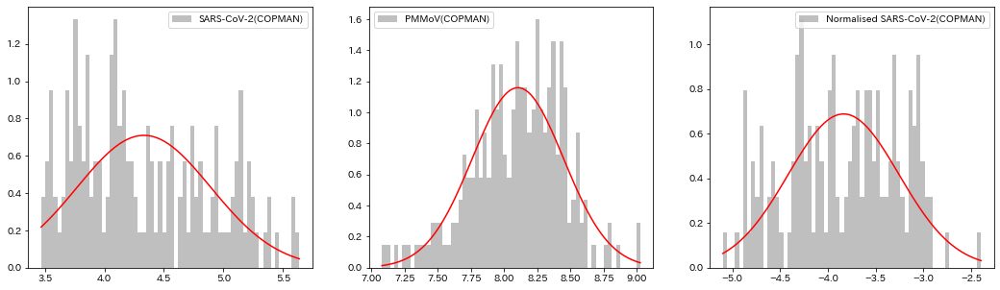

,site_id,site_name,sampling_date,pmmov_tbl,covn_1_tbl,val_conf_report,val_7_d_conf_report,wave_defintion,site_name_wave
59,f00011,右岸処理場,2021-11-01,2570000.0,1.000000,0.000000,0.000000,第6波,右岸処理場 第6波
63,f00011,右岸処理場,2021-11-05,1800000.0,1.000000,0.142857,0.057143,第6波,右岸処理場 第6波
66,f00011,右岸処理場,2021-11-08,8240000.0,1.000000,0.142857,0.102041,第6波,右岸処理場 第6波
68,f00011,右岸処理場,2021-11-10,3920000.0,1.000000,0.142857,0.142857,第6波,右岸処理場 第6波
70,f00011,右岸処理場,2021-11-12,2910000.0,231.481481,0.000000,0.102041,第6波,右岸処理場 第6波
...,...,...,...,...,...,...,...,...,...
5856,f00088,秋田臨海処理センター,2022-09-14,1710000.0,1490.000000,240.000000,270.000000,第7波,秋田臨海処理センター 第7波
5863,f00088,秋田臨海処理センター,2022-09-21,2280000.0,3020.000000,340.000000,186.571429,第7波,秋田臨海処理センター 第7波
5868,f00088,秋田臨海処理センター,2022-09-26,2860000.0,2530.000000,107.000000,172.000000,第7波,秋田臨海処理センター 第7波
5870,f00088,秋田臨海処理センター,2022-09-28,2440000.0,1100.000000,163.000000,169.000000,第7波,秋田臨海処理センター 第7波


In [50]:
# USING wide table

from scipy.stats import norm
# Set according lab
df_rbi = df[df["lab_id"]=="RBI"]
df_star = df[df["lab_id"]=="STAR"]
# Set according to assaymethod
df_com = df[df["assay_method"]=="CM"]
df_epi = df[df["assay_method"]=="HS"]
df_peg = df[df["assay_method"]=="PEG"]

# Select STAR さん
SELECTED_METHOD = "COPMAN"

df_tgt = df_star.copy()
if SELECTED_METHOD == "EPISENS":
    df_tgt = df_epi.copy()
elif SELECTED_METHOD == "COPMAN":
    df_tgt = df_com.copy()
elif SELECTED_METHOD == "PEG":
    df_tgt = df_peg.copy()
else:
    df_tgt = df_star.copy()

# get log info    
df_tgt["log_covn_1_d"] = np.log10(df_tgt["covn_1_d"])
df_tgt["log_pmmov_d"] = np.log10(df_tgt["pmmov_d"])
df_tgt["log_covn_1_pmmov"] = np.log10(df_tgt["covn_1_d"]/df_tgt["pmmov_d"]) #

num_bins=64
fig = plt.figure(figsize=(18,5))
ax = fig.add_subplot(1,3,1)
x = df_tgt["log_covn_1_d"].dropna()
ax.hist(x, num_bins,density = 1,color ='grey', alpha = 0.5, label="SARS-CoV-2("+SELECTED_METHOD+")")
param = norm.fit(x)
x = np.linspace(x.min(),x.max(),100)
pdf_fitted = norm.pdf(x,loc=param[0], scale=param[1])
pdf = norm.pdf(x)
plt.plot(x, pdf_fitted, 'b-', color="red")
ax.legend()

ax1 = fig.add_subplot(1,3,2)
x = df_tgt["log_pmmov_d"].dropna()
ax1.hist(x, num_bins,density = 1,color ='grey', alpha = 0.5, label="PMMoV("+SELECTED_METHOD+")")
param = norm.fit(x)
x = np.linspace(x.min(),x.max(),100)
pdf_fitted = norm.pdf(x,loc=param[0], scale=param[1])
pdf = norm.pdf(x)
plt.plot(x, pdf_fitted, 'b-', color="red")
ax1.legend()

ax2 = fig.add_subplot(1,3,3)
x = df_tgt["log_covn_1_pmmov"].dropna()
ax2.hist(x, num_bins,density = 1,color ='grey', alpha = 0.5, label="Normalised SARS-CoV-2("+SELECTED_METHOD+")")
param = norm.fit(x)
x = np.linspace(x.min(),x.max(),100)
pdf_fitted = norm.pdf(x,loc=param[0], scale=param[1])
pdf = norm.pdf(x)
plt.plot(x, pdf_fitted, 'b-', color="red")
ax2.legend()

plt.show()
# This script allows you select only 1 method
#df_src = df_epi.copy()
df_src = df_epi.copy()


sel_cols = ["site_id","site_name","sampling_date","pmmov_tbl","covn_1_tbl","val_conf_report","val_7_d_conf_report"]
df_ana = df_src[sel_cols].copy()
df_ana["sampling_date"] = pd.to_datetime(df_src["sampling_date"],format="%Y/%m/%d")

# Defining 6 and 7 waves
end_date_5_wave   = "2"
end_date_6_wave   = datetime.date(2022, 7, 1)
end_date_7_wave   = datetime.date(2022, 6, 1)

df_ana["wave_defintion"] = np.where(df_ana["sampling_date"]<"2022-6-1", "第6波","第7波")
df_ana["site_name_wave"] = df_ana.site_name.str.cat(df_ana.wave_defintion,sep=" ")
df_ana

In [52]:
from statistics import stdev
"""
Draw scatter plot from dataframe source
x_idx : 
y_idx : 
brek_idx : 
log :
120 colors
"""
def plot_hist(df_src, x_idx, \
                 break_idx="default", \
                 subplot=False, \
                 label="", \
                 title="", output_suffix="tmp", \
                 figure_size = (8,6), \
                 save=False,
                 num_bins=64,
                 percentile_cut=5,
                 draw=False, legend=True, fitting=True, cor_cal_flg=True):
    df_src=df_src.dropna()
        
    dict_rlts = dict()
    
    if break_idx=="default":
        # Draw histogram
        x = df_src[x_idx].dropna()
        t = x[x <= np.percentile(x, 100-percentile_cut)]
        c = t[t >= np.percentile(t, percentile_cut)]
        mean = c.mean()
        std = stdev(c)
        if draw==True:
            fig, ax1 = plt.subplots(figsize=figure_size)
            ax1.title.set_text(title)
            ax1.set_xlabel(label_dicts[x_idx])
            lbl = "mean:" + str(np.round(mean,3)) +  ",std:" + str(np.round(std,3))
            ax1.hist(x, num_bins,density = 1,color ='grey', alpha = 0.5, label=lbl)
            ax1.legend()
        if fitting==True:
            param = norm.fit(c)
            x = np.linspace(x.min(),x.max(),100)
            pdf_fitted = norm.pdf(x,loc=param[0], scale=param[1])
            pdf = norm.pdf(x)
            plt.plot(x, pdf_fitted, 'b-', color="red")
        dict_rlts["mean"] = mean
        dict_rlts["std"] = std
    else:
        break_idx_list = df_src[break_idx].unique()
        colour_codes = map('C{}'.format, cycle(range(120)))
        if subplot==False:
            if draw==True:
                fig, ax1 = plt.subplots(figsize=figure_size)
            n_cols = int(np.sqrt(len(break_idx_list)+1))
            print(break_idx_list)
            for idx in break_idx_list:
                df = df_src[df_src[break_idx] == idx]
                # Get correlation
                a_dict = dict()

                ilabel=str(idx)+str(",") + "N:" + str(len(df)) 
                # plot 
                if draw==True:
                    if legend==False:
                        ilabel = str(idx)
                    ax1.hist(df[x_idx], num_bins,density = 1,color=next(colour_codes), alpha = 0.5, label=idx)
                ax1.legend()
        else:
            if draw==True:
                fig = plt.figure(figsize=(20,20))
            n_list = len(break_idx_list)
            n_cols = int(np.sqrt(n_list)+1)
            print(n_cols,n_list)

            for i, idx in zip(range(n_list),break_idx_list):
                df = df_src[df_src[break_idx] == idx].dropna()
                # Draw histogram
                x = df[x_idx].dropna()
                t = x[x <= np.percentile(x, 100-percentile_cut)]
                c = t[t >= np.percentile(t, percentile_cut)]
                mean = c.mean()
                std = stdev(c)
                if draw==True:
                    ax1 = fig.add_subplot(n_cols,n_cols,i+1)
                    lbl = "mean:" + str(np.round(mean,3)) +  ",std:" + str(np.round(std,3))
                    ax1.hist(df[x_idx], num_bins,density = 1,color=next(colour_codes), alpha = 0.5, label=lbl)
                    ax1.title.set_text(idx)
                    if fitting==True:
                        param = norm.fit(c)
                        x = np.linspace(x.min(),x.max(),100)
                        pdf_fitted = norm.pdf(x,loc=param[0], scale=param[1])
                        pdf = norm.pdf(x)
                        plt.plot(x, pdf_fitted, 'b-', color="red")
                    ax1.legend()

    # Save figure
    if draw == True and save == True:
        fig.savefig(OUTPUT_NAME_PATH+ "hist_" + output_suffix, bbox_inches='tight')
    
    return dict_rlts
"""
Draw scatter plot from dataframe source
x_idx : 
y_idx : 
brek_idx : 
log :
120 colors
"""
def plot_scatter(df_src, x_idx,y_idx, \
                 break_idx="default", \
                 label="", \
                 title="", output_suffix="tmp", \
                 figure_size = (8,6), \
                 log_x=True, 
                 log_y=True, 
                 save=False,
                 draw=False, legend=True, fitting=True, cor_cal_flg=True):
    df_src=df_src.dropna()
    if draw == True:
        fig, ax1 = plt.subplots(figsize=figure_size)
        ax1.title.set_text(title)
        ax1.set_xlabel(label_dicts[x_idx])
        ax1.set_ylabel(label_dicts[y_idx])
        if log_x==True:
            ax1.set_xscale('log')
        if log_y==True:
            ax1.set_yscale('log')
        

    dict_rlts = dict()
    
    if break_idx=="default":
        # Get Correlation
        label="N:" + str(len(df_src)) 
        if cor_cal_flg==True:
            s_rlts    = stats.spearmanr(df_src[x_idx],df_src[y_idx])
            p_rlts    = stats.pearsonr(df_src[x_idx],df_src[y_idx])
            
            df_log = df_src.copy()
            df_log[y_idx] = np.where(df_log[y_idx]<=0,
                                     1e9,np.where(df_log[y_idx]==np.nan,1e9,df_log[y_idx]))
            get_min = df_log[y_idx].min()
            df_src[y_idx] = np.where(df_src[y_idx]<=0,get_min,df_src[y_idx])

            pl_rlts   = stats.pearsonr(np.log10(df_src[x_idx]),np.log10(df_src[y_idx]))
            dict_rlts["spearman"]    = s_rlts
            dict_rlts["pearson"]     = p_rlts
            dict_rlts["pearson_log"] = pl_rlts
            label+=" $ρ_{s}$:"  +str(np.round(s_rlts[0],3))
            label+=" $ρ_{p}$:"  +str(np.round(p_rlts[0],3))
            label+=" $ρ_{pl}$:" +str(np.round(pl_rlts[0],3))
        if draw == True:
            ax1.scatter(x=df_src[x_idx], y=df_src[y_idx],alpha=0.4,color="blue",label=label, \
                            )
            if legend==True:
                ax1.legend()
    else:
        break_idx_list = df_src[break_idx].unique()
        colour_codes = map('C{}'.format, cycle(range(120)))
        n_cols = int(np.sqrt(len(break_idx_list)+1))
        print(break_idx_list)
        for idx in break_idx_list:
            df = df_src[df_src[break_idx] == idx]
            # Get correlation
            a_dict = dict()
            
            ilabel=str(idx)+str(",") + "N:" + str(len(df)) 
            if cor_cal_flg==True:
                s_rlts    = stats.spearmanr(df[x_idx],df[y_idx])
                p_rlts    = stats.pearsonr(df[x_idx],df[y_idx])
                df_log = df_src.copy()
                df_log[y_idx] = np.where(df_log[y_idx]<=0,
                                         1e9,np.where(df_log[y_idx]==np.nan,1e9,df_log[y_idx]))
                get_min = df_log[y_idx].min()
                #if 
                #print(df_src[y_idx].min(),get_min)
                df_src[y_idx] = np.where(df_src[y_idx]==0,get_min,df_src[y_idx])
                pl_rlts   = stats.pearsonr(np.log10(df[x_idx]),np.log10(df[y_idx]))
                a_dict["spearman"] = s_rlts
                a_dict["pearson"] = p_rlts
                a_dict["pearson_log"] = pl_rlts
                ilabel+=" $ρ_{s}$:"  +str(np.round(s_rlts[0],3))
                ilabel+=" $ρ_{p}$:"  +str(np.round(p_rlts[0],3))
                ilabel+=" $ρ_{pl}$:" +str(np.round(pl_rlts[0],3))
                dict_rlts[idx] = a_dict
            # plot 
            if draw == True:
                if legend==False:
                    ilabel = str(idx)
                ax1.scatter(x=df[x_idx], y=df[y_idx], \
                        color=next(colour_codes), \
                        label=ilabel, \
                        alpha=0.4)
            #if legend==True:
            ax1.legend()
    
    # Save figure
    if draw == True and save == True:
        fig.savefig(OUTPUT_NAME_PATH+ "scatter_" + output_suffix, bbox_inches='tight')

    return dict_rlts


"""
Draw time series with var
"""
def draw_geom_phd_data(df,time_idx, mean_idx, phd_idx, phd_moving_avg_idx, \
                       date_interval=60, \
                       title="", output_suffix="tmp", \
                       interpolate=False, log=True, save=False, weight=True,traffic_interpolate=True,
                       pmmov=True,
                       linestyle="solid",
                       figsize=(18,16),
                       min_lim_y=1, max_lim_y=1e5,
                       min_lim_x=datetime.date(2022,1,1),max_lim_x=datetime.date(2022,9,1), auto_t_lim=True, 
                      ):
    if (len(df) == 0):
        print("Empty dataframe")
        return

    # interpolate
    if interpolate == True:
        df_int=df.interpolate(method='linear')
    
    # Creating plot with dataset_1
    fig, ax = plt.subplots(6, 1, gridspec_kw={'height_ratios': [5, 1, 1, 1, 1, 1]}, figsize=figsize)

    # Set date formats
    years_fmt = mdates.DateFormatter('%Y-%m')
    ax[0].xaxis.set_major_formatter(years_fmt)

    # Set title
    ax[0].title.set_text(title)
    
    # Draw confirmed case by day
    color = 'lightgrey'
    ax[0].set_xlabel('DateTime')
    ax[0].set_ylabel(label_dicts[phd_idx])
    print(len(df[time_idx]), len(df[phd_idx]))
    ax[0].bar(df[time_idx],df[phd_idx], color = color,label=label_dicts[phd_idx],width=1.0)
    # Draw confirmed case moving average
    #print(df[time_idx]phd_moving_avg_idx]])
    df_drop = df[[time_idx,phd_moving_avg_idx]].dropna(how="all").sort_values(by=time_idx)
    ax[0].plot(df_drop[time_idx],df_drop[phd_moving_avg_idx], color = "silver",label=label_dicts[phd_moving_avg_idx])
    if auto_t_lim==False:
        ax[0].set_xlim(min_lim_x,max_lim_x)

    # Adding Twin Axes to plot using RNA Concentration
    ax1 = ax[0].twinx()
    ax1.set_ylim(min_lim_y,max_lim_y)
    color = 'tomato'
    ax1.set_ylabel(label_dicts[mean_idx], color = color)
    # Draw geometric mean
    if interpolate == True:
        ax2.plot(df_int[time_idx],df_int[mean_idx], color = color, label=label_dicts[mean_idx])
    ax1.plot(df[time_idx],df[mean_idx], color=color, marker='o', linestyle=linestyle, label=label_dicts[mean_idx])
    ax[0].plot(np.nan, '-r', color=color, label=label_dicts[mean_idx])

    ax1.tick_params(axis ='y', labelcolor = color)
    # Configure graphs
    if log == True:
        ax1.set_yscale('log')
        ax1ylim_max = df[mean_idx].max()*10.0
    else:
        ax1ylim_max = df[mean_idx].max()*1.5
    ax1ylim_min = df[mean_idx].min()*0.5
    ax1.set_ylim(ax1ylim_min,ax1ylim_max)
    
    # Draw pmmov 
    if pmmov==True:
        ax3 = ax[0].twinx()
        color = "green"
        ax3.set_ylabel(label_dicts["geo_mean_pmmov"], color =color)
        ax3.plot(df[time_idx],df["geo_mean_pmmov"], color = color, marker='.',label=label_dicts["geo_mean_pmmov"])
        ax[0].plot(np.nan, '-r', label=label_dicts["geo_mean_pmmov"], color=color)

        df_int_pmmov = df.copy()
        if interpolate == True:
            df_int_pmmov = df.interpolate(method='linear')

        ax3.plot(df_int_pmmov[time_idx],df_int_pmmov["geo_mean_pmmov"], color = color)
        ax3.tick_params(axis ='y', labelcolor = color)
        ax3.set_yscale('log')
        ax3.set_ylim(1e2,1e10)
        ax3.spines['right'].set_position(('outward', 60))
    
    # Adding title
    df_tmp = df["site_names"].replace('None', np.nan)
    df_tmp = df_tmp.dropna()
    # legend
    ax[0].legend(loc=(0,0.7))
    xmin, xmax = ax1.get_xlim()
    
    def make_ma_slope(s_x, s_y, fitting=True, npts=3, x_date_opt=True):
        ma_slope = []
        for i in range(npts):
            ma_slope.append(0)
        if len(s_x)!=len(s_y):
            print("Error: List length difference ")
            return -1
        if fitting==True:
            for i in range(len(s_x)):
                if i<+npts:
                    continue
                xs = s_x.iloc[i-npts:i]
                ys = s_y.iloc[i-npts:i]
                # Convert days to int x
                xc = []
                for j in range(len(xs)):
                    if j<1:
                        xc.append(0)
                    else:
                        dd = (xs.iloc[j] - xs.iloc[j-1]).days
                        xc.append(xc[j-1]+dd)
                # 3pts average,it is possible to have nan, so just skip it
                if np.isnan(ys).any():
                    ma_slope.append(0)
                    continue
                a, b = np.polyfit(xc, ys, 1)
                ma_slope.append(a)
        else:
            for i in range(len(s_x)):
                y_diff=0
                x_diff=1
                if i==0:
                    ma_slope.append(0)
                    continue
                else:            
                    y_diff = s_y.iloc[i]-s_y.iloc[i-1]
                    x_diff = s_x.iloc[i]-s_x.iloc[i-1]
                    if x_date_opt == True:
                        days = x_diff.days
                ma_slope.append(y_diff/days)
        return ma_slope

    # Plot velocity
    slope_log = False
    df_drop = df[[mean_idx,time_idx,"covn_1_det_rate","covn_1_qua_rate"]].dropna()
    if slope_log==True:
        df_drop["slope"] = make_ma_slope(df_drop[time_idx],np.log10(df_drop[mean_idx]))
    else:
        df_drop["slope"] = make_ma_slope(df_drop[time_idx],df_drop[mean_idx])
    ax[1].set_ylabel(label_dicts["slope"])
    
    x = df_drop["slope"]
    if weight == True:
        # TODO, if normalised
        x = df_drop["slope"]*np.exp(-df_drop[mean_idx]/232.5)
    df_drop["slope_3pts"] = x.rolling(3).mean()
    ax[1].bar(df_drop[time_idx], x , color=[('red' if i > 0 else 'blue') for i in df_drop['slope']], label=label_dicts["slope"])
    ax[1].plot(df_drop[time_idx],df_drop["slope_3pts"] , linestyle="dashed" ,label=label_dicts["slope"])
    ax[1].set_xlim(xmin,xmax)
    ax[1].axhline(0, color='black')
    
    # Output
    df_out = pd.merge(df,df_drop[[time_idx,"slope","slope_3pts"]],on=time_idx,how="left")
    
    # Plot acceleration
    df_drop["acceleration"] = make_ma_slope(df_drop[time_idx],df_drop["slope"])
    df_drop["acceleration_3pts"] = make_ma_slope(df_drop[time_idx],df_drop["slope_3pts"])
    ax[2].set_ylabel(label_dicts["acceleration"])
    ax[2].plot(df_drop[time_idx],df_drop["acceleration"], color="red",label=label_dicts["acceleration"])
    ax[2].plot(df_drop[time_idx],df_drop["acceleration_3pts"], color="blue", linestyle="dashed",label=label_dicts["acceleration"])
    ax[2].set_xlim(xmin,xmax)
    ax[2].axhline(0, color='black')
    #print(df_drop)
    # Output
    df_out = pd.merge(df_out,df_drop[[time_idx,"acceleration","acceleration_3pts"]],on=time_idx,how="left")

    # Plot detection rate
    def plot_rate_time_series(ax, df, mean_idx, time_idx,det_rate_idx, color="grey",linestyle="None",ylabel=""):
        df_drop = df[[mean_idx,time_idx,det_rate_idx]].dropna()
        ax.set_ylabel(label_dicts[ylabel])
        ax.plot(df_drop[time_idx],df_drop[det_rate_idx], color=color,linestyle=linestyle, marker=".",label=label_dicts[det_rate_idx])
        ax.set_xlim(xmin,xmax)
        ax.axhline(0, color='black')
        # merge
        ax.legend(loc=0)

        return df_out
    # Detection rate
    plot_rate_time_series(ax[3], df,mean_idx,time_idx,"covn_1_det_rate"         , color="grey" ,linestyle="None", ylabel="covn_1_det_rate")
    plot_rate_time_series(ax[3], df,mean_idx,time_idx,"covn_1_det_rate_rolling3", color="blue" ,linestyle="solid", ylabel="covn_1_det_rate")
    plot_rate_time_series(ax[3], df,mean_idx,time_idx,"covn_1_det_rate_rolling6", color="green",linestyle="solid", ylabel="covn_1_det_rate")
    # Quantification rate
    plot_rate_time_series(ax[4], df,mean_idx,time_idx,"covn_1_qua_rate"         , color="grey" ,linestyle="None", ylabel="covn_1_qua_rate")
    plot_rate_time_series(ax[4], df,mean_idx,time_idx,"covn_1_qua_rate_rolling3", color="blue" ,linestyle="solid", ylabel="covn_1_qua_rate")
    plot_rate_time_series(ax[4], df,mean_idx,time_idx,"covn_1_qua_rate_rolling6", color="green",linestyle="solid", ylabel="covn_1_qua_rate")

    
    def draw_difference(ax, df,df_out,mean_idx, time_idx, period=1, color="grey", born_color="red", log=True, relative=False):
        # Plot difference of 1 pt, 3 pt, 6 pt before
        df_drop = df[[mean_idx,time_idx]].dropna()
        if log==True:
            df_drop["log_"+mean_idx] = np.log10(df[mean_idx])
        else:
            df_drop["log_"+mean_idx] = df[mean_idx]
        df_drop["val_diff_"+str(period)] = df_drop["log_"+mean_idx].diff(periods=period)
        # get percentage
        if relative==True:
            df_drop["val_diff_rel_"+str(period)] = np.where(df_drop["log_"+mean_idx].diff(periods=period)==0,0,df_drop["log_"+mean_idx].diff(periods=period)/df_drop.shift(periods=period)["log_"+mean_idx]*100)
            df_drop["inf_flag_"+str(period)] = np.where(df_drop["val_diff_rel_"+str(period)]==np.inf,1,0)
            df_drop["val_diff_rel_"+str(period)] = np.where(df_drop["inf_flag_"+str(period)]==1,0,df_drop["val_diff_rel_"+str(period)])
        else:
            df_drop["val_diff_rel_"+str(period)] = np.where(df_drop["log_"+mean_idx].diff(periods=period)==0,0,df_drop["log_"+mean_idx].diff(periods=period))
            df_drop["inf_flag_"+str(period)] = np.where(df_drop["val_diff_rel_"+str(period)]==np.inf,1,0)
            df_drop["val_diff_rel_"+str(period)] = np.where(df_drop["inf_flag_"+str(period)]==1,0,df_drop["val_diff_rel_"+str(period)])

        #print(df_drop[df_drop[time_idx]>datetime.date(2021,12,23)].head(10))
        
        df_noninf = df_drop[df_drop["inf_flag_"+str(period)]!=1]
        df_explode = df_drop[df_drop["inf_flag_"+str(period)]!=0] # Change from UD to BLQ/detected value
        ax.set_ylabel(label_dicts["diff_from_npts"])
        ax.plot(df_noninf[time_idx],df_noninf["val_diff_rel_"+str(period)], color=color, marker=".",label="Diff. "+str(period)+" point")
        if relative==True:
            ax.plot(df_explode[time_idx],df_explode["val_diff_rel_"+str(period)], color=born_color, linestyle="None", marker=".",label="Born point")
        ax.legend(loc=0, ncol=3)
        ax.set_xlim(xmin,xmax)
    
        # Output
        df_out = pd.merge(df_out,df_drop[[time_idx,"val_diff_rel_"+str(period),"inf_flag_"+str(period),"log_"+mean_idx]],on=time_idx,how="left")

        return df_out

    df_out = draw_difference(ax[5],df,df_out,mean_idx,time_idx, period=1,color="grey", born_color="red", log=False)
    df_out = draw_difference(ax[5],df,df_out,mean_idx,time_idx, period=3,color="black", born_color="blue", log=False)
    df_out = draw_difference(ax[5],df,df_out,mean_idx,time_idx, period=6,color="green", born_color="yellow", log=False)
    
    df_out.to_csv(OUTPUT_NAME_PATH+ "time_series_" + output_suffix.split(".")[0] + ".csv", header=True,encoding="shift_jis")

    ###########################
    # Plot traffic light
    ###########################
    # Kuroita condition
    df_drop = df[[mean_idx,time_idx,"covn_1_det_rate_rolling3","covn_1_qua_rate_rolling3"]]
    df_drop["light_b"] = np.where(df_drop["covn_1_det_rate_rolling3"]<=0, 
                                     np.where(df_drop["covn_1_qua_rate_rolling3"]<=0,1,0),0)
    df_drop["light_y"] = np.where(df_drop["covn_1_det_rate_rolling3"]>0, 
                                     np.where(df_drop["covn_1_qua_rate_rolling3"]>0,0,1),0)
    df_drop["light_r"] = np.where(df_drop["covn_1_det_rate_rolling3"]>0, 
                                     np.where(df_drop["covn_1_qua_rate_rolling3"]>0,1,0),0)
    
    df_drop["light_nodata"] = np.where(np.isnan(df_drop["covn_1_det_rate_rolling3"]),1,0)
    
    start_date  = df_drop.head(1)[time_idx].iloc[0]
    latest_date = df_drop.tail(1)[time_idx].iloc[0]
    ndays = ( latest_date- start_date).days
    datetimelist=[]
    blist=[]
    ylist=[]
    rlist=[]
    bp=-1
    yp=-1
    rp=-1
    for i in range(ndays):
        if i>0:
            next_date = start_date + datetime.timedelta(days=i)
            if next_date>latest_date:
                continue
            try:
                b = df_drop[df_drop[time_idx]==next_date].iloc[0]["light_b"]
                y = df_drop[df_drop[time_idx]==next_date].iloc[0]["light_y"]
                r = df_drop[df_drop[time_idx]==next_date].iloc[0]["light_r"]
            except:
                b = 0
                y = 0
                r = 0
            if bp==1 and y!=1 and r!=1:
                b=1
            if yp==1 and b!=1 and r!=1:
                y=1
            if rp==1 and y!=1 and b!=1:
                r=1    
            datetimelist.append(next_date)
            blist.append(b)
            ylist.append(y)
            rlist.append(r)
            bp = b
            yp = y
            rp = r
    df_traf = pd.DataFrame()
    df_traf[time_idx] = datetimelist
    df_traf["light_b"] = blist
    df_traf["light_y"] = ylist
    df_traf["light_r"] = rlist
    #print(df_traf.head(10))
    ax4 = ax[0].twinx()
    ax4.set_ylim(-20,1)
    num_bins = len(df_drop)
    #ax4.bar(df_drop[time_idx],df_drop["light_nodata"],color="black",alpha=0.1)
    if traffic_interpolate == True:
        ax4.bar(df_traf[time_idx],df_traf["light_b"],color="blue",alpha=0.7, width=1.0)
        ax4.bar(df_traf[time_idx],df_traf["light_y"],color="yellow",alpha=0.7,width=1.0)
        ax4.bar(df_traf[time_idx],df_traf["light_r"],color="red",alpha=0.7,width=1.0)
    else:
        ax4.bar(df_drop[time_idx],df_drop["light_b"],color="blue",alpha=0.7,width=1.0)
        ax4.bar(df_drop[time_idx],df_drop["light_y"],color="yellow",alpha=0.7,width=1.0)
        ax4.bar(df_drop[time_idx],df_drop["light_r"],color="red",alpha=0.7,width=1.0)
    ax4.tick_params(axis='both', which='both', length=0)
    plt.setp(ax4.get_yticklabels(), visible=False)
    
    
    
    print(df_out.columns)
    if save == True:
        fig.savefig(OUTPUT_NAME_PATH+ "time_series_" + output_suffix)
    #TODOS
    # Alert traffic light
    #last_date = df_drop.head(1)[time_idx].iloc[0] +  datetime.timedelta(days=14)
    #print(last_date)
    #for i in len(df_drop):
    #    if df_drop[time_idx]<=last_date:
    #        df_drop["uq_rate"] = 0
    #        df_drop["blq_rate"] = 0
    #        df_drop["det_rate"] = 0
            
 #   df_drop["det_flg"] = np.where(if(df_drop[mean_idx])
 #   cnt=0
 #   MAX_CONTINUE_UD = 2
 #   for i in df_drop[mean_idx]:
 #       # Start from 2
 #       if cnt<2:
 #           continue
        # Search 14 days
 #       print(i)
#    df_drop["traffic_light"] = 

"""
Draw time series plot from dataframe source
x_idx : 
y_idx : 
brek_idx : 
log :
120 colors
"""
def plot_time_series(df_src, x_idx, y_idx, z_idx="default", break_idx="default", \
                     interpolate=False, subplot=False, log=False, grid=False,\
                     marker="o",\
                     aggregation="mean", \
                     n_cut=10, \
                     title="", output_suffix="tmp", \
                     min_lim_y=0, max_lim_y=1e5,
                     min_lim_x=datetime.date(2022,1,1),max_lim_x=datetime.date(2022,9,1), auto_t_lim=True):
    cor_dicts = dict()    
    if interpolate == True:
        # interpolate
        df_int=df_src.interpolate(method='linear')
        # Creating plot with dataset_1
    if break_idx=="default":
        fig, ax1 = plt.subplots(figsize=(15,5))
        ax1.title.set_text(title)
        ax1.set_xlabel('DateTime')
        ax1.set_ylabel(label_dicts[y_idx])
        
        df_src = df_src.sort_values(by=[x_idx])
        # Group
        if aggregation =="mean":
            df_src = df_src.groupby(x_idx).mean().reset_index()
            # TODO add geomean
        else:
            df_src = df_src.groupby(x_idx).mean().reset_index()
        if interpolate == True:
            ax1.plot(df_int[x_idx],df_int[y_idx])
            #ax1.plot(df_int[x_idx],df_int[y_idx],label="interpolate")
        ax1.plot(df_src[x_idx],df_src[y_idx],marker=marker,label=aggregation)
        if auto_t_lim==False:
            ax1.set_xlim(min_lim_x,max_lim_x)
            ax1.set_ylim(min_lim_y,max_lim_y)
    
        if z_idx!="default":
            ax2 = ax1.twinx()
            color = 'grey'
            ax2.set_ylabel(label_dicts[z_idx])
            ax2.bar(df_src[x_idx],df_src[z_idx], color = color)
            
        #ax1.legend()
    else:
        df_src = df_src.sort_values(by=[x_idx,break_idx])
        break_idx_list = df_src[break_idx].unique()
        # subplot
        if subplot == False:
            fig, ax1 = plt.subplots(figsize=(15,5))
            ax1.title.set_text(title)
            colour_codes = map('C{}'.format, cycle(range(120)))
            for idx in break_idx_list:
                # Break down
                df = df_src[df_src[break_idx] == idx]
                # Plot
                ax1.plot(df[x_idx],df[y_idx], \
                         color=next(colour_codes), \
                         label=str(idx), \
                         marker=marker)
            ax1.legend(ncol=int(np.sqrt(len(break_idx_list))))
            plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=30))
            if z_idx!="default":
                ax2 = ax1.twinx()
                color = 'grey'
                ax2.set_ylabel(label_dicts[z_idx])
                ax2.bar(df_src[x_idx],df_src[z_idx], color = color)
            ax1.set_xlim(min_lim_x,max_lim_x)
        else:
            fig = plt.figure(figsize=(20,20))
            n_list = len(break_idx_list)
            n_cols = int(np.sqrt(n_list+1))
            lim_y_max_auto = df_src[y_idx].max()*1.2
            for i, idx in zip(range(n_list),break_idx_list):
                ax1 = fig.add_subplot(n_cols,n_cols,i+1)
                df = df_src[df_src[break_idx] == idx].dropna()
                if len(df)<n_cut:
                    continue
                ax1.plot(df[x_idx],df[y_idx],marker=marker)
                ax1.title.set_text(idx)
                xax = plt.gca().axes.get_xaxis()
                xax = xax.set_visible(False)
                yax = plt.gca().axes.get_yaxis()
                yax = yax.set_visible(False)
                if log==True:
                    ax1.set_yscale('log')
                if auto_t_lim==False:
                    ax1.set_ylim(min_lim_y,max_lim_y)
                else:
                    ax1.set_ylim(0,lim_y_max_auto)
                # Plot z-axis
                if z_idx!="default":
                    ax2 = ax1.twinx()
                    yax = plt.gca().axes.get_yaxis()
                    yax = yax.set_visible(False)
                    color = 'grey'
                    ax2.plot(df[x_idx],df[z_idx], color = color)

    # Prepare
    if log==True:
        ax1.set_yscale('log')
    if grid==True:
        plt.grid(True)
    plt.show()
    return cor_dicts



"""
"""
def time_window_scan(df_src,
                     date_idx,
                     mean_idx, phd_moving_avg_idx,
                     time_window=14, start_time_offset=0, 
                     debug=False, draw=True, save=False,
                     title="", output_suffix="tmp",
                     lim_min_cor=-0.5, lim_max_cor=1.0):
    # Drop N.A.
    df_geo_shift = df_src[[date_idx,"covn_1_det_rate","covn_1_det_rate_rolling3","covn_1_det_rate_rolling6",mean_idx]].dropna()
    #df_geo_shift = df_src[[date_idx,mean_idx]].dropna()
    df_val_conf  = df_src[[date_idx,phd_moving_avg_idx]].dropna()
        
    if (len(df_geo_shift) == 0 or len(df_val_conf) == 0 ):
        print("Empty dataframe")
        return
    
    # Info of the data
    latest_geo_data  = df_geo_shift.tail(1)[date_idx].iloc[0]
    latest_conf_data = df_val_conf.tail(1)[date_idx].iloc[0]
    oldest_geo_data  = df_geo_shift.head(1)[date_idx].iloc[0]
    oldest_conf_data = df_val_conf.head(1)[date_idx].iloc[0]
    max_time = int((start_time_offset+time_window)/2)
    min_time = int((start_time_offset-time_window)/2)
    remove_date_threshold_latest = latest_conf_data - datetime.timedelta(days=max_time)
    remove_date_threshold_oldest = oldest_conf_data - datetime.timedelta(days=min_time)

    if debug:
        print("latest_geo_data",latest_geo_data)
        print("latest_conf_data",latest_conf_data)
        print("oldest_geo_data",oldest_geo_data)
        print("oldest_conf_data",oldest_conf_data)
        print("remove_date_threshold_latest",remove_date_threshold_latest)
        print("remove_date_threshold_oldest",remove_date_threshold_oldest)
        print("===========================================")
        print("Time shift:",min_time,max_time)
        print("before shift")
        print(pd.merge(df_geo_shift, df_val_conf, on=date_idx, how='right'))
    
    # Remove data points that will be over the time window
    df_cut = df_geo_shift.copy()
    df_cut.drop(df_cut[df_cut[date_idx] > remove_date_threshold_latest].index, inplace = True)
    df_cut.drop(df_cut[df_cut[date_idx] < remove_date_threshold_oldest].index, inplace = True)
    if debug:
        print(df_cut)
    
    df_shift = df_cut.copy()
    #fig = plt.figure(figsize=(20, 5))
    nrow = 1
    ncol = time_window
    sub_title=""
    best_time_shifted = -1
    best_corr = -1
    best_prob = -1
    best_rlts = None
    df_best = pd.DataFrame()
    gr_x = []
    gr_y = []
    gr_x_pearson = []
    gr_y_pearson = []
    gr_x_pearson_log = []
    gr_y_pearson_log = []
    # OFFset
    df_shift[date_idx] -= datetime.timedelta(days=int((time_window-start_time_offset)/2)+1)   
    if debug==True:
        print("~~~")
        print("After moving offset")
        print(df_shift)
        print("====================================")
        print("Start time window sliding")
    # Loop over time window
    for i in range(time_window):
        # Calculate time shifted
        time_shifted = i-int((time_window-start_time_offset)/2)
        # Shift phd data to the later time
        df_shift[date_idx] += datetime.timedelta(days=1)
        # Merge WW data with phd data after shifting
        df_cor = pd.merge(df_shift, df_val_conf, on=date_idx, how='left')
        if debug == True:
            print("+",time_shifted,"day",df_shift[date_idx].iloc[0])
            print("df_cor:\n",df_cor)
        # Get correlation
        rlts = plot_scatter(df_cor, mean_idx,phd_moving_avg_idx, title="title")   
        # Fill results
        gr_x.append(time_shifted)
        gr_x_pearson.append(time_shifted)
        gr_x_pearson_log.append(time_shifted)
        gr_y.append(rlts["spearman"][0])
        gr_y_pearson.append(rlts["pearson"][0])
        gr_y_pearson_log.append(rlts["pearson_log"][0])
        if rlts["spearman"][0]>best_corr:
            df_best=df_cor.copy()
            best_time_shifted = time_shifted
            best_corr = rlts["spearman"][0]
        if rlts["pearson"][0]>best_corr:
            df_best=df_cor.copy()
            best_time_shifted = time_shifted
            best_corr = rlts["pearson"][0]
        if rlts["pearson_log"][0]>best_corr:
            df_best=df_cor.copy()
            best_time_shifted = time_shifted
            best_corr = rlts["pearson_log"][0]
    if draw == True:
        # Graph scanning results
        fig = plt.figure(figsize=(10, 8))
        ax1 = fig.add_subplot(211)
        ax1.title.set_text(title + "N: " + str(len(df_best)) + ",Days:" + str(best_time_shifted))
        color = "blue"
        ax1.set_xlabel('time-shift(d)')
        ax1.set_ylabel('correlation', color = color)
        ax1.plot(gr_x,gr_y, color = color, marker='o',label="Spearman")
        color="grey"
        ax1.plot(gr_x_pearson,gr_y_pearson, color = color, marker='o',label="Pearson")
        color="lightskyblue"
        ax1.plot(gr_x_pearson_log,gr_y_pearson_log, color = color, marker='o',label="Pearson(LOG)")
        ax1.set_ylim(lim_min_cor,lim_max_cor)
        ax1.legend(loc=(0.0,0.15))
        #fig.savefig(OUTPUT_NAME_PATH + "_" + mean_idx  + "_" + phd_moving_avg_idx + "_scan.jpg")
        
        # Table
        val1 = [ str(i) + " d" for i in gr_x ] 
        val2 = ["Spearman","Pearson","Pearson(Log)"] # rows lable
        val3 = [[ np.round(i,3) for i in gr_y],[np.round(i,3) for i in gr_y_pearson],[np.round(i,3) for i in gr_y_pearson_log] ] 
        ax = fig.add_subplot(212)
        ax.set_axis_off() 
        table = ax.table( 
            cellText = val3,  
            rowLabels = val2,  
            colLabels = val1, 
            cellLoc ='center',  
            loc ='upper left')
        if save==True:
            fig.savefig(OUTPUT_NAME_PATH+ "timeshifted_" + output_suffix)

    return df_best


def plot_corr_time_series(df_tgt, time_idx, phd_idx, mean_idx, window_list = [30]):
    df_tgt = df_tgt[[time_idx,phd_idx,mean_idx]].dropna()
    s_date=df_tgt.head(1)[time_idx].iloc[0]
    e_date=df_tgt.tail(1)[time_idx].iloc[0]
    
    df_compare = pd.DataFrame()
    for iwindow in window_list:
        # Loop over windows
        gr_x_sp = []
        gr_x_nd = []
        gr_y_sp = []
        gr_y_lp = []
        i=0
        this_date = s_date
        next_date = s_date + datetime.timedelta(days=iwindow)
        while(True):
            this_date=s_date+datetime.timedelta(days=i)
            next_date=s_date+datetime.timedelta(days=i + iwindow)
            if next_date>e_date:
                break
            # time cut
            df_tmp = df_tgt[df_tgt[time_idx]>this_date]
            df_tmp = df_tmp[df_tmp[time_idx]<=next_date]
            # Get columns
            df_monthly = df_tmp[[time_idx,phd_idx,mean_idx]]        
            # Plot correlations
            if(len(df_monthly)>1):
                rlts = plot_scatter(df_monthly,mean_idx,phd_idx, draw=False, title="Monthly"+str(this_date), figure_size=(10,8),legend=False)
                gr_x_sp.append(this_date)
                gr_y_sp.append(rlts["spearman"][0])
                gr_y_lp.append(rlts["pearson_log"][0])
            i=i+1
          # Creating a dictionary
        d = {'corSp':gr_y_sp,
             time_idx:gr_x_sp,
             'window':[ str(iwindow)+" days" for i in gr_x_sp]}
        # Creating dataframe
        df_cor = pd.DataFrame(d)
        # Append data frame
        df_compare = df_compare.append(df_cor)

    plot_time_series(df_compare, time_idx, "corSp", break_idx="window",subplot=False,log=False, marker=".",title="相関性", 
                    min_lim_x=datetime.date(2022,6,1),max_lim_x=datetime.date(2022,10,1))

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:91: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "b-" (-> color='b'). The keyword argument will take precedence.


     pmmov_tbl sampling_date     site_class  process_pop_1000 site_name  \
59   2570000.0    2021-11-01  2.処理人口50-100万             541.2     右岸処理場   
298  5770000.0    2022-06-28  2.処理人口50-100万             541.2     右岸処理場   
291  4450000.0    2022-06-21  2.処理人口50-100万             541.2     右岸処理場   
287  8850000.0    2022-06-17  2.処理人口50-100万             541.2     右岸処理場   
284  4930000.0    2022-06-14  2.処理人口50-100万             541.2     右岸処理場   
..         ...           ...            ...               ...       ...   
413  4180000.0    2022-09-30  2.処理人口50-100万             541.2     右岸処理場   
422  1500000.0    2022-10-07  2.処理人口50-100万             541.2     右岸処理場   
387  4190000.0    2022-09-09  2.処理人口50-100万             541.2     右岸処理場   
418  9340000.0    2022-10-04  2.処理人口50-100万             541.2     右岸処理場   
383  4120000.0    2022-09-06  2.処理人口50-100万             541.2     右岸処理場   

    site_id  log_pmmov_tbl  
59   f00011       6.409933  
298  f00011       6.761176  
291  f00011 

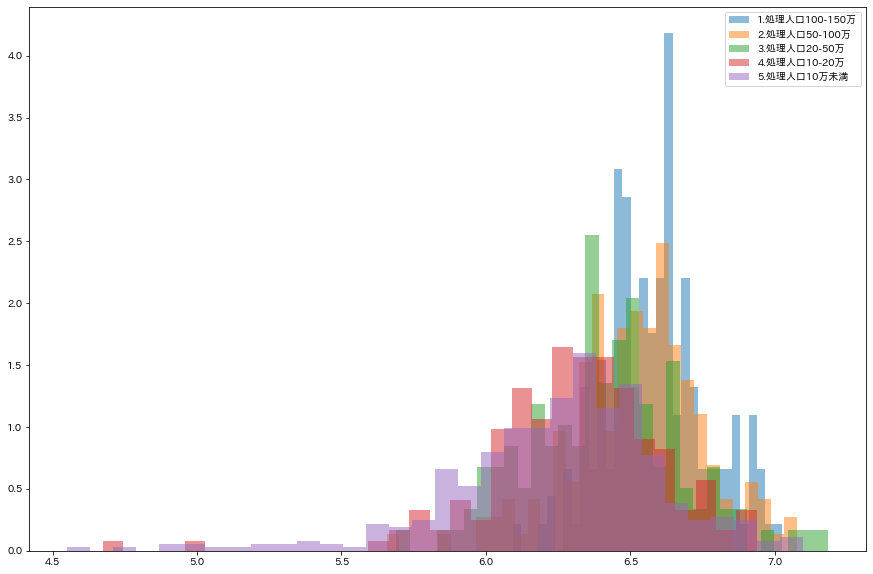

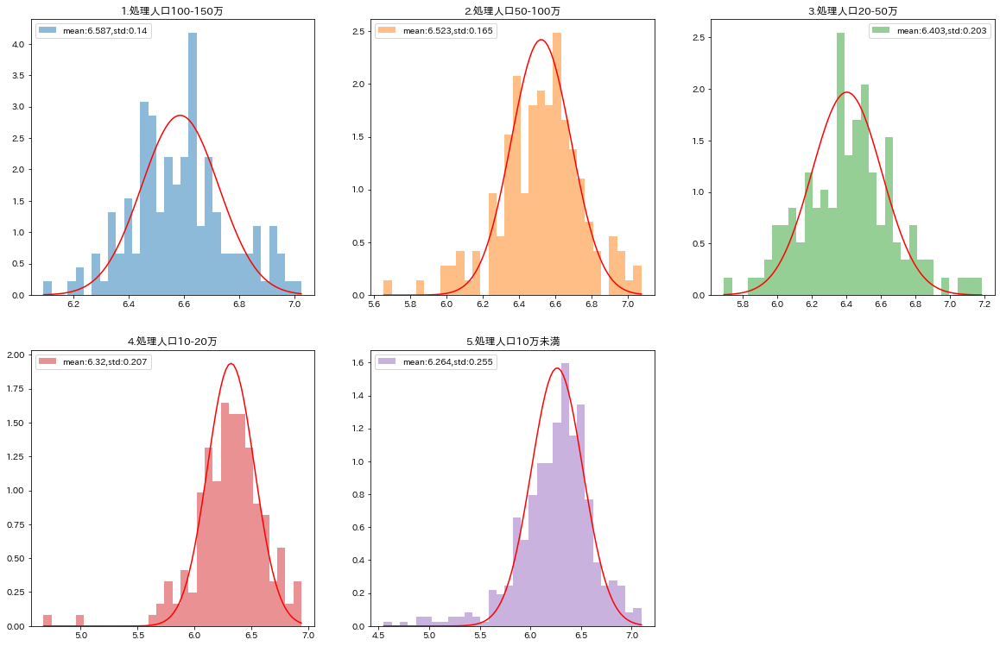

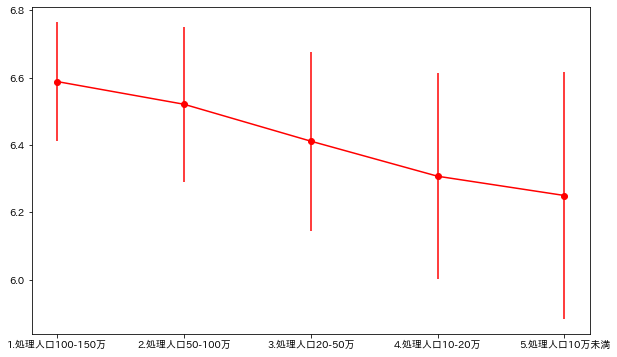

(array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
        18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
        35, 36]),
 [Text(1, 0, '関宮東部浄化センター'),
  Text(2, 0, '大屋浄化センター'),
  Text(3, 0, '関宮中部浄化センター'),
  Text(4, 0, '養父中央浄化センター'),
  Text(5, 0, '八鹿浄化センター'),
  Text(6, 0, 'さいたま市下水処理センター'),
  Text(7, 0, '荒川上流水循環センター'),
  Text(8, 0, '桜川第1ポンプ場'),
  Text(9, 0, '那珂川ポンプ場'),
  Text(10, 0, '八橋下水道終末処理場'),
  Text(11, 0, '宮津湾浄化センター'),
  Text(12, 0, '日高市浄化センター'),
  Text(13, 0, '秩父市下水道センター'),
  Text(14, 0, '市野川水循環センター'),
  Text(15, 0, '大束川浄化センター'),
  Text(16, 0, '小山川水循環センター'),
  Text(17, 0, '飯能市浄化センター'),
  Text(18, 0, '西原浄化センター'),
  Text(19, 0, '出戸中継ポンプ場'),
  Text(20, 0, '水戸浄化センター2'),
  Text(21, 0, '古利根川水循環センター'),
  Text(22, 0, '具志川浄化センター'),
  Text(23, 0, '水戸浄化センター1'),
  Text(24, 0, '東部下水処理場'),
  Text(25, 0, '石田水環境センター'),
  Text(26, 0, '宜野湾浄化センター'),
  Text(27, 0, '元荒川水循環センター'),
  Text(28, 0, '秋田臨海処理センター'),
  Text(29, 0, '那覇浄化センター'),
  Text(30, 0, '右岸処理場

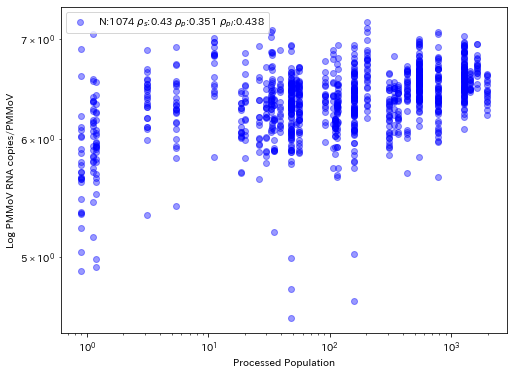

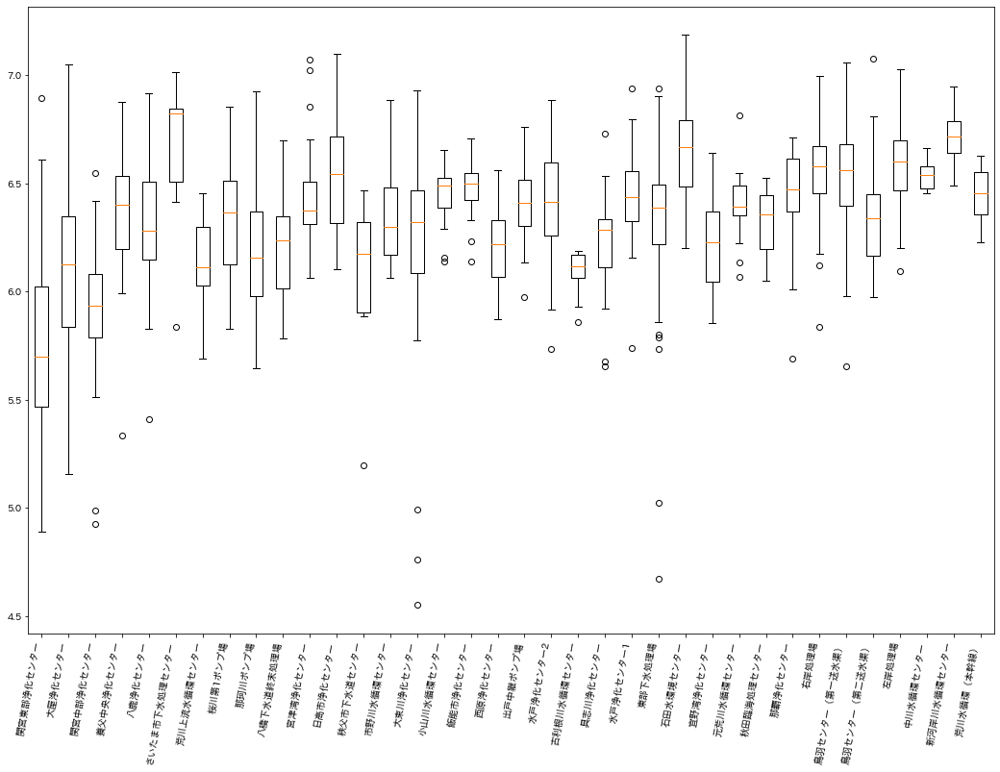

In [35]:
# PMMoV

df_wpop_epi_pmmov = df_wpop_epi[["pmmov_tbl","sampling_date","site_class","process_pop_1000","site_name","site_id"]]
df_wpop_epi_pmmov["log_pmmov_tbl"] = np.log10(df_wpop_epi_pmmov["pmmov_tbl"])
print(df_wpop_epi_pmmov[df_wpop_epi_pmmov["site_id"]=="f00011"])

plot_hist(df_wpop_epi_pmmov, "log_pmmov_tbl", \
                 break_idx="site_class",
                 title="", output_suffix="tmp", \
                 figure_size = (15,10), \
                 save=False, \
                 num_bins=32, \
                 draw=True, legend=True, fitting=True, cor_cal_flg=True)

plot_hist(df_wpop_epi_pmmov, "log_pmmov_tbl", \
                 break_idx="site_class",
                 title="", output_suffix="tmp", \
                 figure_size = (8,6), \
                 subplot=True, \
                 save=False, \
                 num_bins=32, \
                 draw=True, legend=True, fitting=True, cor_cal_flg=True)



gr_x = []
gr_mean = []
gr_std = []
for iclass in df_wpop_epi_pmmov["site_class"].unique():
    df_tmp = df_wpop_epi_pmmov[df_wpop_epi_pmmov["site_class"]==iclass].copy()
    rlts = plot_hist(df_tmp, "log_pmmov_tbl", \
                 title=iclass, output_suffix="tmp", \
                 figure_size = (4,3), \
                 save=False, \
                 num_bins=32, \
                 percentile_cut=0, \
                 draw=False, legend=True, fitting=False, cor_cal_flg=True)
    gr_x.append(iclass)
    gr_mean.append(rlts["mean"])
    gr_std.append(rlts["std"])

plt.show()

fig = plt.figure(figsize=(10, 6))

plt.errorbar(gr_x,gr_mean,color="red",marker="o",yerr=gr_std)
#plt.plot(gr_x,gr_mean,color="red",marker="o",yerr=gr_std)
plt.show()
#plt.plot(gr_x,gr_std,color="red",marker="o")
#plt.show()

# processed pop vs pmmov
plot_scatter(df_wpop_epi_pmmov, "process_pop_1000","log_pmmov_tbl",draw=True)


# 点数のタプル
# align by process pop
df_wpop_epi_pmmov = df_wpop_epi_pmmov.sort_values(by="process_pop_1000")

list_of_site_data = []
for isite in df_wpop_epi_pmmov["site_name"].unique():
    df_tmp = df_wpop_epi_pmmov[df_wpop_epi_pmmov["site_name"]==isite]
    if isite=="f00011":
        print(df_tmp)
    list_of_site_data.append(df_tmp["log_pmmov_tbl"])
points = tuple(list_of_site_data)
# 箱ひげ図
fig, ax = plt.subplots(figsize=(18,12))
bp = ax.boxplot(points) # 複数指定する場合はタプル型で渡します。

ax.set_xticklabels(df_wpop_epi_pmmov["site_name"].unique())
plt.xticks(rotation=80, ha='right')

#plt.title('exam')
#plt.grid() # 横線ラインを入れることができます。

# 描画
#plt.show()




In [73]:
df_wpop_epi.columns


Index(['site_id', 'val_conf_report', 'val_7_d_conf_report', 'dateTime',
       'sample_id', 'event_name', 'lab_id', 'original_file_name',
       'analyzed_date', 'group_id', 'group_type', 'polygon_id', 'site_name',
       'registerd_name', 'process_pop', 'geo_coor', 'quality_flag', 'covn_1',
       'pmmov', 'covn_1_d', 'covn_1_ud', 'covn_1_blq', 'pmmov_d', 'pmmov_ud',
       'pmmov_blq', 'covn_1_pmmov', 'covn_1_pmmov_usetloq',
       'covn_1_pmmov_uselloq', 'covn_1_tbl', 'pmmov_tbl', 'covn_1_uselloq',
       'pmmov_uselloq', 'covn_1_usemeas', 'pmmov_usemeas', 'covn1_tloq',
       'covn1_lloq', 'pmmov_tloq', 'pmmov_lloq', 'assay_method', 'rmk_covn_1',
       'rmk_pmmov', 'unit', 'collection', 'sample_type', 'sampler',
       'sampling_date', 'polygon_name', 'pop_1000', 'pmmov_tbl_p10m',
       'covn_1_tbl_p10m', 'covn_1_pmmov_1e4', 'covn_1_pmmov_1e4_p10m',
       'covn_1_blq_tloq', 'geom_id_0', 'geom_id_1', 'geom_id_2',
       'process_pop_1000', 'site_class'],
      dtype='object')

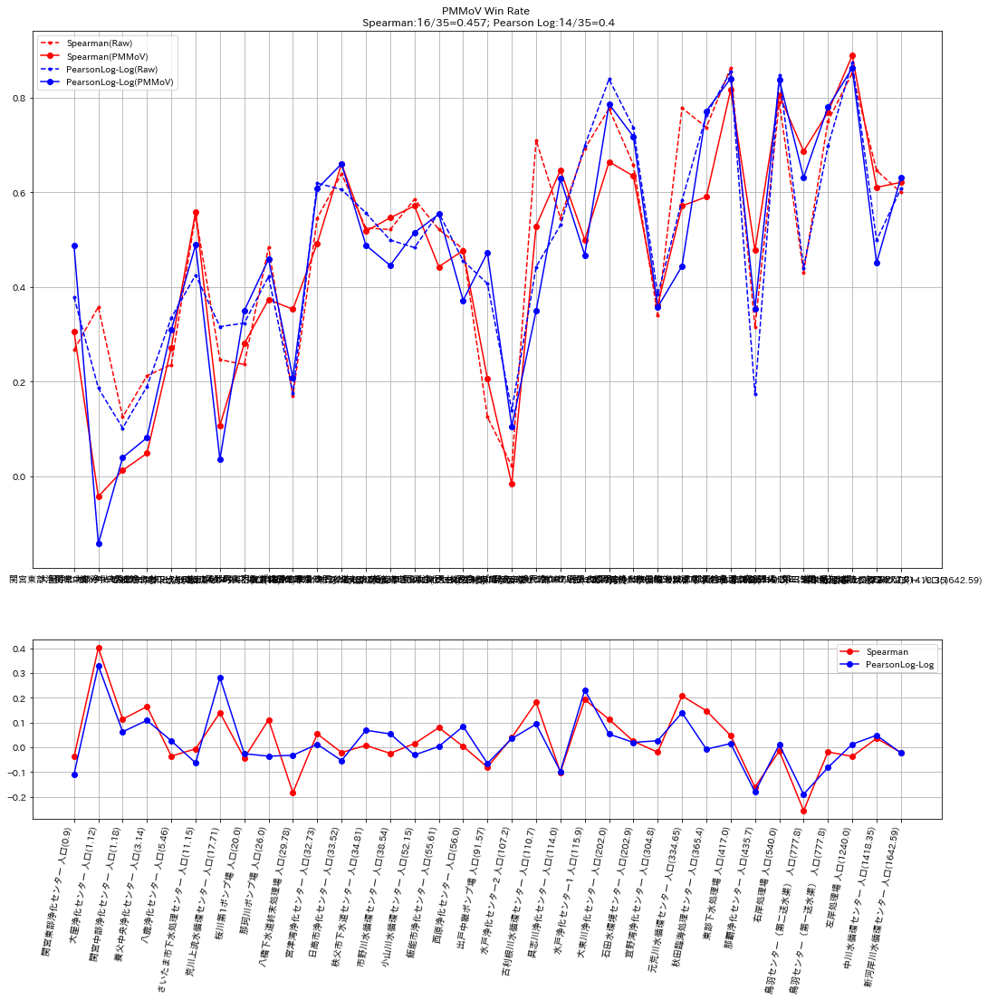

In [146]:
# Plot site time series
df_t_series = df_wpop_epi.copy()
df_t_series["covn_1_usemeas_rolling3"] = df_t_series['covn_1_usemeas'].rolling(3).mean()
df_t_series["covn_1_to_pmmov"] = df_t_series["covn_1_usemeas"]/df_t_series["pmmov_tbl"]
df_t_series["covn_1_to_pmmov_rolling3"] = df_t_series['covn_1_to_pmmov'].rolling(3).mean()
df_t_series["covn_1_usemeas_rolling3_pop1000"] = np.where(df_t_series["process_pop_1000"]>=0,df_t_series["covn_1_usemeas_rolling3"]/df_t_series["process_pop_1000"],0)

sel_cols = ["sampling_date","covn_1_usemeas","covn_1_to_pmmov","covn_1_to_pmmov_rolling3","covn_1_usemeas_rolling3_pop1000","covn_1_usemeas_rolling3","site_name","val_7_d_conf_report"]
# Plot time series raw
#plot_time_series(df_t_series[sel_cols], "sampling_date","covn_1_usemeas_rolling3", z_idx="val_7_d_conf_report", break_idx="site_name",subplot=True, log=False,marker="")
# Plot time series pmmov normalised
#plot_time_series(df_t_series[sel_cols], "sampling_date","covn_1_to_pmmov_rolling3", z_idx="val_7_d_conf_report", break_idx="site_name",subplot=True, log=False,marker="")
# Plot time series processed popolution normalised
#plot_time_series(df_t_series[sel_cols], "sampling_date","covn_1_usemeas_rolling3_pop1000", z_idx="val_7_d_conf_report", break_idx="site_name",subplot=True, log=False,marker="")


# align by process pop
df_wpop_epi = df_wpop_epi.sort_values(by="process_pop_1000")

# Loop over sites and get normalised/raw data's correlation and compare their difference
# Plot site's
gr_x = []
gr_y_s_nc = [] # Spearman
gr_y_s_yc = [] # Spearman
gr_y_p_nc = [] # Pearson Log
gr_y_p_yc = [] # Pearson Log
cnt_pmmov_win_s = 0
cnt_pmmov_win_p = 0
gr_y_s_df = []
gr_y_p_df = []
for isite in df_wpop_epi["site_id"].unique():
    #print("Site: ",isite)
    df_tmp = df_wpop_epi[df_wpop_epi["site_id"]==isite].copy()
    df_tmp["covn_1_tbl_rolling3"] = df_tmp['covn_1_tbl'].rolling(3).mean()
    df_tmp = df_tmp.sort_values(by="pop_1000")
    site_name = df_tmp.site_name.iloc[0]
    # Raw data
    sel_cols = ["val_7_d_conf_report","covn_1_tbl","covn_1_tbl_rolling3"]
    rlts_nc = plot_scatter(df_tmp[sel_cols],sel_cols[0],sel_cols[1], draw=False,title=site_name + "補正なし")
#    rlts_nc = plot_scatter(df_tmp[sel_cols],sel_cols[0],sel_cols[2], draw=False,title=site_name + "補正なし")
    # PMMoV data
    df_tmp["covn_1_to_pmmov"] = df_tmp["covn_1_tbl"]/df_tmp["pmmov_tbl"]
    df_tmp["covn_1_to_pmmov_rolling3"] = df_tmp['covn_1_to_pmmov'].rolling(3).mean()
    sel_cols = ["val_7_d_conf_report","covn_1_to_pmmov","covn_1_to_pmmov_rolling3"]
    rlts_yc = plot_scatter(df_tmp[sel_cols],sel_cols[0],sel_cols[1], draw=False,title=site_name + "補正あり")
#    rlts_yc = plot_scatter(df_tmp[sel_cols],sel_cols[0],sel_cols[2], draw=False,title=site_name + "補正あり")
    gr_x.append(site_name + " 人口("+str(df_tmp["process_pop_1000"].iloc[0])+")")
    gr_y_s_nc.append(rlts_nc["spearman"][0])
    gr_y_s_yc.append(rlts_yc["spearman"][0])
    gr_y_s_df.append(rlts_nc["spearman"][0]-rlts_yc["spearman"][0])
    gr_y_p_nc.append(rlts_nc["pearson_log"][0])
    gr_y_p_yc.append(rlts_yc["pearson_log"][0])
    gr_y_p_df.append(rlts_nc["pearson_log"][0]-rlts_yc["pearson_log"][0])
    
    if rlts_nc["spearman"][0]<rlts_yc["spearman"][0] :
        cnt_pmmov_win_s+=1
    if rlts_nc["pearson_log"][0]<rlts_yc["pearson_log"][0] :
        cnt_pmmov_win_p+=1

        
n_sites = len(df_wpop_epi["site_id"].unique())
fig, ax = plt.subplots(2, 1, gridspec_kw={'height_ratios': [3, 1]}, figsize=(18,16))
#   fig = plt.figure(figsize=(15, 20))
#ax = fig.add_subplot(211)
ax[0].title.set_text("PMMoV Win Rate \n Spearman:" + str(cnt_pmmov_win_s)  + "/"  + str(n_sites) + "=" + str(np.round(cnt_pmmov_win_s/n_sites,3)) + \
                                  "; Pearson Log:" + str(cnt_pmmov_win_p)  + "/"  + str(n_sites) + "=" + str(np.round(cnt_pmmov_win_p/n_sites,3)))
ax[0].errorbar(gr_x,gr_y_s_nc,color="red",marker=".",linestyle="dashed",label="Spearman(Raw)")
ax[0].errorbar(gr_x,gr_y_s_yc,color="red",marker="o",label="Spearman(PMMoV)")
ax[0].errorbar(gr_x,gr_y_p_nc,color="blue",marker=".",linestyle="dashed",label="PearsonLog-Log(Raw)")
ax[0].errorbar(gr_x,gr_y_p_yc,color="blue",marker="o",label="PearsonLog-Log(PMMoV)")
ax[0].grid(True)
plt.xticks(rotation=80, ha='right')
ax[0].legend()

#ax = fig.add_subplot(212)
ax[1].errorbar(gr_x,gr_y_s_df,color="red",marker="o",label="Spearman")
ax[1].errorbar(gr_x,gr_y_p_df,color="blue",marker="o",label="PearsonLog-Log")
plt.xticks(rotation=80, ha='right')
ax[1].grid(True)
ax[1].legend()

plt.show()



['分流式' '合流式']


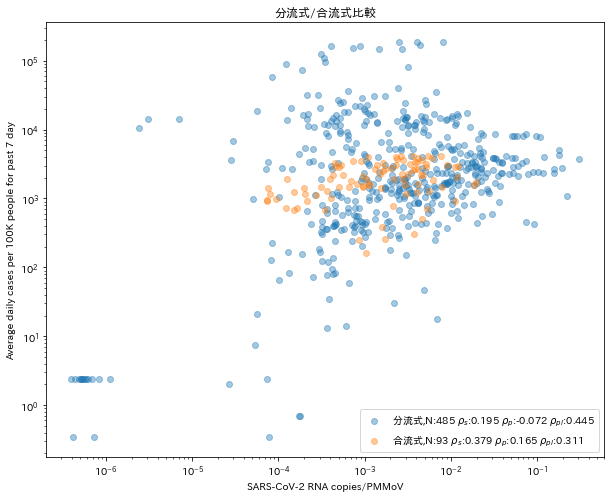

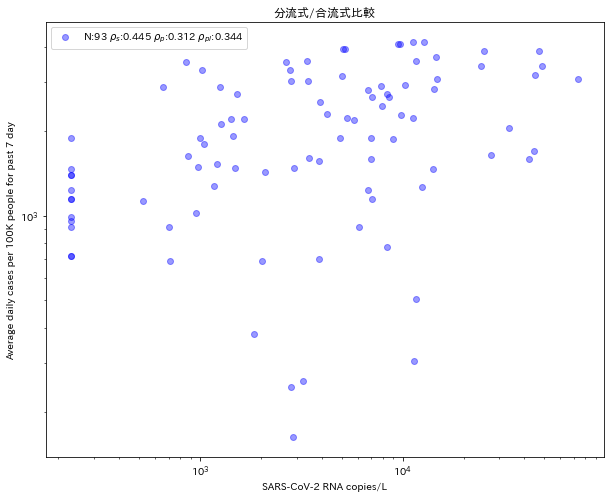

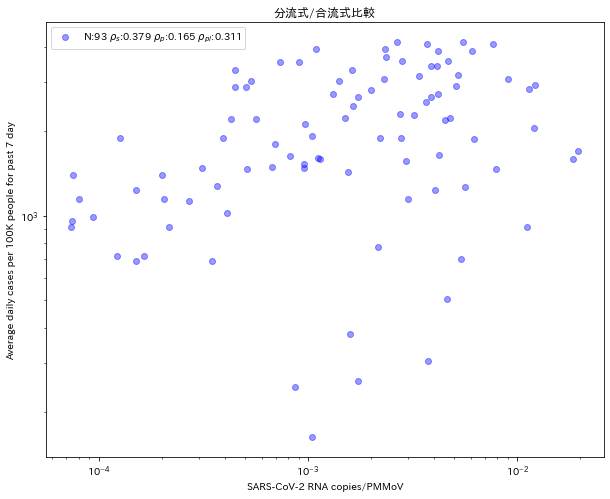

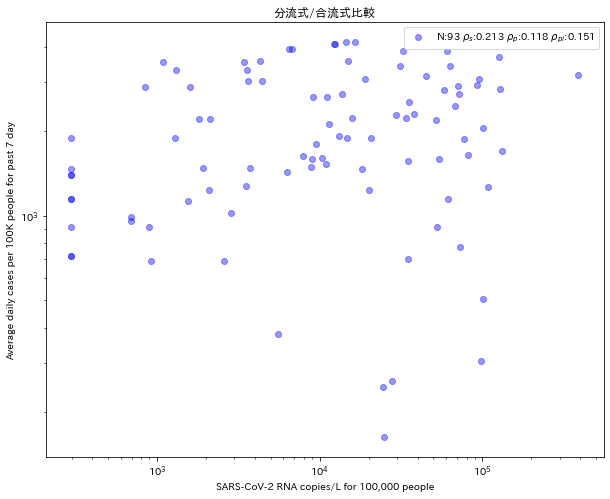

In [141]:
# Analysis for stream type
#df_stream_type
df_tmp = df_wpop_epi[["site_id","site_name","covn_1_tbl","pmmov_tbl","process_pop_1000","val_7_d_conf_report","site_class","sampling_date","pop_1000"]].copy()
df_tmp["covn_1_tbl_p10m"] = df_tmp["covn_1_tbl"]/(df_tmp["process_pop_1000"]*1e3/1e6)
df_tmp["covn_1_to_pmmov"] = df_tmp["covn_1_tbl"]/df_tmp["pmmov_tbl"]
df_tmp["covn_1_tbl_p10m_pmmov"] = df_tmp["covn_1_tbl"]/(df_tmp["process_pop_1000"]*1e3/1e6)/df_tmp["pmmov_tbl"]
df_tmp["val_7_d_conf_report_p10m"] = df_tmp["val_7_d_conf_report"]/(df_tmp["process_pop_1000"]*1e3/1e6)
df_tmp["log_pmmov_tbl"] = np.log10(df_tmp["pmmov_tbl"])
df_tmp["log_covn_1_tbl"] = np.log10(df_tmp["covn_1_tbl"])
df_tmp["log_covn_1_tbl_p10m"] = np.log10(df_tmp["covn_1_tbl_p10m"])
df_tmp["log_covn_1_to_pmmov"] = np.log10(df_tmp["covn_1_to_pmmov"])

# Merging with geom table
df_merged = pd.merge(df_tmp, df_stream_type, on=["site_id"], how="left")
df_merged.columns
df_merged = df_merged.dropna()

#plot_time_series(df_merged, "sampling_date","covn_1_tbl_p10m",break_idx="",subplot=False, log=True,marker="", 
#                 min_lim_x=datetime.date(2022,7,1),max_lim_x=datetime.date(2022,9,27))


#plot_scatter(df_merged,"covn_1_tbl","val_7_d_conf_report", break_idx="type_stream", draw=True, title="分流式/合流式比較", figure_size=(10,8))
#plot_scatter(df_merged,"covn_1_to_pmmov","val_7_d_conf_report", break_idx="type_stream", draw=True, title="分流式/合流式比較", figure_size=(10,8))
#plot_scatter(df_merged,"covn_1_tbl_p10m","val_7_d_conf_report", break_idx="type_stream", draw=True, title="分流式/合流式比較", figure_size=(10,8))

#plot_scatter(df_merged,"covn_1_tbl","val_7_d_conf_report_p10m", break_idx="type_stream", draw=True, title="分流式/合流式比較", figure_size=(10,8))
plot_scatter(df_merged,"covn_1_to_pmmov","val_7_d_conf_report_p10m", break_idx="type_stream", draw=True, title="分流式/合流式比較", figure_size=(10,8))
#plot_scatter(df_merged,"covn_1_tbl_p10m","val_7_d_conf_report_p10m", break_idx="type_stream", draw=True, title="分流式/合流式比較", figure_size=(10,8))


#plot_scatter(df_merged[df_merged["type_stream"]=="分流式"],"covn_1_tbl_p10m","val_7_d_conf_report_p10m", draw=True, title="分流式/合流式比較", figure_size=(10,8))
#plot_scatter(df_merged[df_merged["type_stream"]=="分流式"],"covn_1_tbl","val_7_d_conf_report_p10m", draw=True, title="分流式/合流式比較", figure_size=(10,8))
#plot_scatter(df_merged[df_merged["type_stream"]=="分流式"],"covn_1_to_pmmov","val_7_d_conf_report_p10m", draw=True, title="分流式/合流式比較", figure_size=(10,8))
#plot_scatter(df_merged[df_merged["type_stream"]=="分流式"],"covn_1_to_pmmov","val_7_d_conf_report_p10m",break_idx="site_name", draw=True, title="分流式/合流式比較", figure_size=(10,8))

plot_scatter(df_merged[df_merged["type_stream"]=="合流式"],"covn_1_tbl","val_7_d_conf_report_p10m", draw=True, title="分流式/合流式比較", figure_size=(10,8))
plot_scatter(df_merged[df_merged["type_stream"]=="合流式"],"covn_1_to_pmmov","val_7_d_conf_report_p10m", draw=True, title="分流式/合流式比較", figure_size=(10,8))
plot_scatter(df_merged[df_merged["type_stream"]=="合流式"],"covn_1_tbl_p10m","val_7_d_conf_report_p10m", draw=True, title="分流式/合流式比較", figure_size=(10,8))
#plot_scatter(df_merged[df_merged["type_stream"]=="合流式"],"covn_1_tbl","val_7_d_conf_report_p10m",break_idx="site_name", draw=True, title="分流式/合流式比較", figure_size=(10,8))
#plot_scatter(df_merged[df_merged["type_stream"]=="合流式"],"covn_1_to_pmmov","val_7_d_conf_report_p10m",break_idx="site_name", draw=True, title="分流式/合流式比較", figure_size=(10,8))
#plot_scatter(df_merged[df_merged["type_stream"]=="合流式"],"covn_1_tbl_p10m","val_7_d_conf_report_p10m",break_idx="site_name", draw=True, title="分流式/合流式比較", figure_size=(10,8))

df_merged_mix = df_merged[df_merged["type_stream"]=="分流式"].copy()
#plot_scatter(df_merged_mix[~df_merged_mix["site_id"].str.contains("f00025|f00091")],"covn_1_to_pmmov","val_7_d_conf_report_p10m",break_idx="site_name", draw=True, title="", figure_size=(10,8))
#plot_scatter(df_merged_mix[~df_merged_mix["site_id"].str.contains("f00025|f00091")],"covn_1_tbl","val_7_d_conf_report_p10m", draw=True, title="", figure_size=(10,8))
#plot_scatter(df_merged_mix[~df_merged_mix["site_id"].str.contains("f00025|f00091")],"covn_1_to_pmmov","val_7_d_conf_report_p10m", draw=True, title="", figure_size=(10,8))
#plot_scatter(df_merged_mix[~df_merged_mix["site_id"].str.contains("f00025|f00091")],"covn_1_tbl_p10m","val_7_d_conf_report_p10m", draw=True, title="", figure_size=(10,8))
#plot_scatter(df_merged[df_merged["type_stream"]=="合流式"],"covn_1_to_pmmov","val_7_d_conf_report_p10m",break_idx="site_name", draw=True, title="分流式/合流式比較", figure_size=(10,8))



In [142]:
prd_public_health_data_analyzed.columns

Index(['phd_date', 'polygon_id', 'polygon_name', 'geom_id_0', 'geom_id_1',
       'geom_id_2', 'confirmed_case_oper', 'site_name', 'site_id',
       'val_conf_report_10', 'val_conf_report', 'val_conf_episode',
       'val_active', 'val_7_d_conf_report_10', 'val_7_d_conf_report',
       'val_7_d_conf_episode', 'val_7_d_active', 'val_14_d_conf_report_10',
       'val_14_d_conf_report', 'val_14_d_conf_episode', 'val_14_d_active',
       'val_30_d_conf_report_10', 'val_30_d_conf_report',
       'val_30_d_conf_episode', 'val_30_d_active', 'dateTime'],
      dtype='object')

103860.78422580866
0.9957081611085538


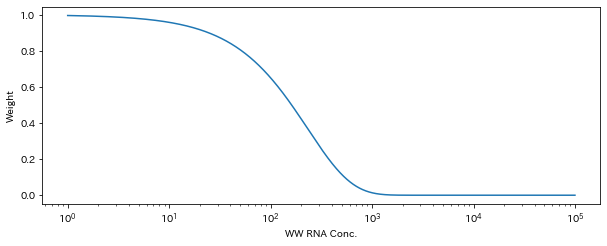

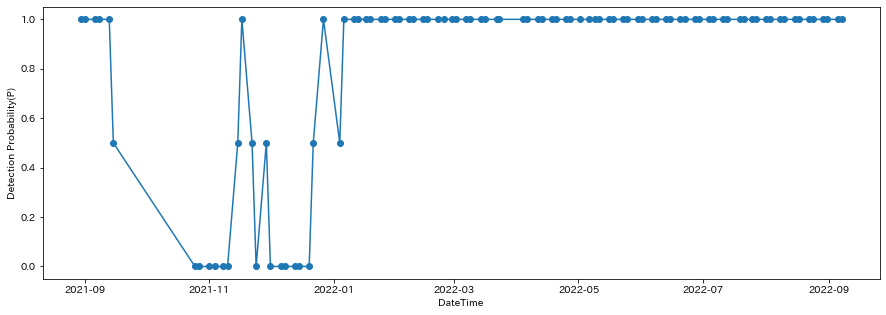

In [143]:
# visualisation 
geom_id_0_list = df_geom_src_id_0["geom_id_0"].unique()
geom_id_0_list_nonan = [x for x in geom_id_0_list if np.isnan(x) == False]

for igeom in geom_id_0_list_nonan:
    #if igeom!=2 and igeom!=3:
    if igeom!=3:
        continue
    
    # Get geomId data
    df_geom = df_geom_src_id_0[df_geom_src_id_0["geom_id_0"]==igeom].copy()
    print(df_geom.geo_mean_usemeas.max()*1.5)
    
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(211)
    x= np.arange(1, 1e5, 0.1)
    y=np.exp(-x/232.5)
    ax.plot(x,y)
    print(np.exp(-1/232.5))
    ax.set_xscale("log")
    ax.set_xlabel("WW RNA Conc.")
    ax.set_ylabel("Weight")
    
    #plot detection rate
    plot_time_series(df_geom, "phd_date","covn_1_det_rate", 
                     subplot=False, 
                     log=False,marker="o",
                     min_lim_x=datetime.date(2021,11,1),max_lim_x=datetime.date(2022,9,30))

    plt.show()


In [401]:
df_tmp = df_wpop_epi.sort_values(by=["site_id","sampling_date"])


df_tmp["covn_1_tbl_p10m_rolling3"] = df_tmp['covn_1_tbl_p10m'].rolling(3).mean()

df_tmp[["site_id","sampling_date","covn_1_tbl_p10m","covn_1_tbl_p10m_rolling3"]]

,site_id,sampling_date,covn_1_tbl_p10m,covn_1_tbl_p10m_rolling3
402,f00010,2021-11-01,0.000000,NaN
406,f00010,2021-11-05,0.000000,NaN
409,f00010,2021-11-08,0.000000,0.000000
411,f00010,2021-11-10,0.000000,0.000000
413,f00010,2021-11-12,18.667861,6.222620
...,...,...,...,...
3383,f00118,2022-09-12,16521.739130,32826.086957
3385,f00118,2022-09-14,24239.130435,33405.797101
3387,f00118,2022-09-16,11086.956522,17282.608696
3392,f00118,2022-09-21,13152.173913,16159.420290


Index(['site_id', 'val_conf_report', 'val_7_d_conf_report', 'dateTime',
       'sample_id', 'event_name', 'lab_id', 'original_file_name',
       'analyzed_date', 'group_id', 'group_type', 'polygon_id', 'site_name',
       'registerd_name', 'process_pop', 'geo_coor', 'quality_flag', 'covn_1',
       'pmmov', 'covn_1_d', 'covn_1_ud', 'covn_1_blq', 'pmmov_d', 'pmmov_ud',
       'pmmov_blq', 'covn_1_pmmov', 'covn_1_pmmov_usetloq',
       'covn_1_pmmov_uselloq', 'covn_1_tbl', 'pmmov_tbl', 'covn_1_uselloq',
       'pmmov_uselloq', 'covn_1_usemeas', 'pmmov_usemeas', 'covn1_tloq',
       'covn1_lloq', 'pmmov_tloq', 'pmmov_lloq', 'assay_method', 'rmk_covn_1',
       'rmk_pmmov', 'unit', 'collection', 'sample_type', 'sampler',
       'sampling_date', 'polygon_name', 'pop_1000', 'pmmov_tbl_p10m',
       'covn_1_tbl_p10m', 'covn_1_pmmov_1e4', 'covn_1_pmmov_1e4_p10m',
       'covn_1_blq_tloq', 'geom_id_0', 'geom_id_1', 'geom_id_2',
       'process_pop_1000', 'site_class'],
      dtype='object')
['5

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if __name__ == "__main__":
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pand

,covn_1_tbl,process_pop_1000,val_7_d_conf_report_p10m,sum_process_pop_1000
0,231.481481,0.90,31746.031746,11.80
1,231.481481,0.90,11746.031746,11.80
2,483.000000,0.90,18253.968254,11.80
3,545.000000,0.90,39841.269841,11.80
4,534.000000,0.90,16507.936508,11.80
...,...,...,...,...
1015,4930.000000,1642.59,935.456461,3749.78
1016,41200.000000,1642.59,1095.830365,3749.78
1017,17100.000000,1642.59,850.181725,3749.78
1018,67700.000000,1642.59,1697.928272,3749.78


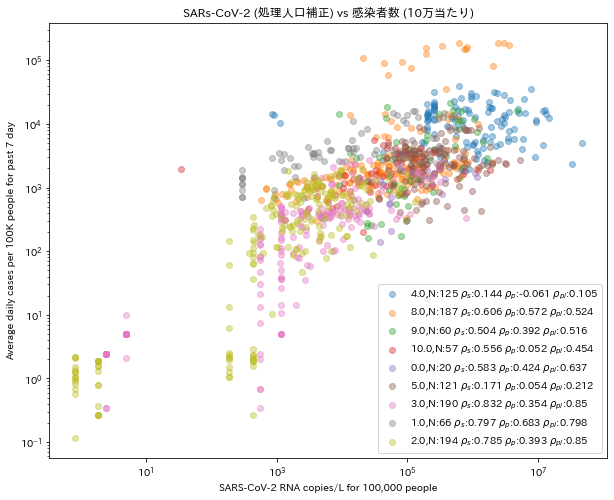

In [38]:
# plot site class difference
print(df_wpop_epi.columns)
print(df_wpop_epi["site_class"].unique())


df_tmp = df_wpop_epi[["geom_id_0","geom_id_1","site_name","covn_1_tbl","pmmov_tbl","process_pop_1000","val_7_d_conf_report","site_class","sampling_date"]]

df_tmp["covn_1_tbl_p10m"] = df_tmp["covn_1_tbl"]/(df_tmp["process_pop_1000"]*1e3/1e6)
df_tmp["covn_1_to_pmmov"] = df_tmp["covn_1_tbl"]/df_tmp["pmmov_tbl"]
df_tmp["covn_1_tbl_p10m_pmmov"] = df_tmp["covn_1_tbl"]/(df_tmp["process_pop_1000"]*1e3/1e6)/df_tmp["pmmov_tbl"]
df_tmp["val_7_d_conf_report_p10m"] = df_tmp["val_7_d_conf_report"]/(df_tmp["process_pop_1000"]*1e3/1e6)

#plot_scatter(df_tmp,"covn_1_tbl","val_7_d_conf_report", break_idx="site_class", draw=True, title="サイトClass比較", figure_size=(10,8))
#plot_scatter(df_tmp,"covn_1_tbl","val_7_d_conf_report_p10m", break_idx="site_class", draw=True, title="サイトClass比較", figure_size=(10,8))
#plot_scatter(df_tmp,"covn_1_tbl_p10m","val_7_d_conf_report", break_idx="site_class", draw=True, title="サイトClass比較", figure_size=(10,8))
#plot_scatter(df_tmp,"covn_1_tbl_p10m","val_7_d_conf_report_p10m", break_idx="site_class", draw=True, title="サイトClass比較", figure_size=(10,8))
#plot_scatter(df_tmp,"covn_1_to_pmmov","val_7_d_conf_report", break_idx="site_class", draw=True, title="サイトClass比較", figure_size=(10,8))
#plot_scatter(df_tmp,"covn_1_to_pmmov","val_7_d_conf_report_p10m", break_idx="site_class", draw=True, title="サイトClass比較", figure_size=(10,8))


#plot_scatter(df_tmp,"covn_1_tbl","val_7_d_conf_report", draw=True, title="SARs-CoV-2 (Raw) vs 感染者数 (Raw)", figure_size=(10,8))
#plot_scatter(df_tmp,"covn_1_tbl","val_7_d_conf_report_p10m", draw=True, title="SARs-CoV-2 (Raw) vs 感染者数 (10万当たり)", figure_size=(10,8))
#plot_scatter(df_tmp,"covn_1_to_pmmov","val_7_d_conf_report", draw=True, title="SARs-CoV-2 (PMMoV補正) vs 感染者数 (Raw)", figure_size=(10,8))
#plot_scatter(df_tmp,"covn_1_to_pmmov","val_7_d_conf_report_p10m", draw=True, title="SARs-CoV-2 (PMMoV補正) vs 感染者数 (10万当たり)", figure_size=(10,8))
#plot_scatter(df_tmp,"covn_1_tbl_p10m","val_7_d_conf_report", draw=True, title="SARs-CoV-2 (処理人口補正) vs 感染者数 (Raw)", figure_size=(10,8))
#plot_scatter(df_tmp,"covn_1_tbl_p10m","val_7_d_conf_report_p10m",draw=True, title="SARs-CoV-2 (処理人口補正) vs 感染者数 (10万当たり)", figure_size=(10,8))
#plot_scatter(df_tmp,"covn_1_tbl_p10m","val_7_d_conf_report_p10m", break_idx="site_class", draw=True, title="SARs-CoV-2 (処理人口補正) vs 感染者数 (10万当たり)", figure_size=(10,8))

#plot_scatter(df_tmp,"covn_1_tbl_p10m_pmmov","val_7_d_conf_report_p10m",draw=True, title="SARs-CoV-2 (処理人口+PMMoV補正) vs 感染者数 (10万当たり)", figure_size=(10,8))

#plot_scatter(df_tmp[df_tmp["geom_id_0"]==8],"covn_1_tbl","val_7_d_conf_report_p10m", break_idx="geom_id_0", draw=True, title="SARs-CoV-2 (処理人口補正) vs 感染者数 (10万当たり)", figure_size=(10,8))
#plot_scatter(df_tmp[df_tmp["geom_id_1"]==19],"covn_1_tbl","val_7_d_conf_report_p10m", break_idx="geom_id_1", draw=True, title="SARs-CoV-2 (処理人口補正) vs 感染者数 (10万当たり)", figure_size=(10,8))


plot_scatter(df_tmp,"covn_1_tbl_p10m","val_7_d_conf_report_p10m", break_idx="geom_id_0", draw=True, title="SARs-CoV-2 (処理人口補正) vs 感染者数 (10万当たり)", figure_size=(10,8))

df_grp = df_tmp[["sampling_date","geom_id_0","site_name","covn_1_tbl","process_pop_1000","val_7_d_conf_report_p10m"]].copy()
df_proc = df_grp[["site_name","geom_id_0","process_pop_1000"]].groupby(["geom_id_0","process_pop_1000"]).count().reset_index().groupby("geom_id_0").sum().reset_index()
df_proc.rename(columns={"process_pop_1000":"sum_process_pop_1000"}, inplace=True)
df_grp = pd.merge(df_grp,df_proc[["geom_id_0","sum_process_pop_1000"]],how="left")
df_grp["pop_weight"] = df_grp["process_pop_1000"]/df_grp["sum_process_pop_1000"]

df_grp.groupby(['geom_id_0','sampling_date','site_name','pop_weight']).transform("mean")

['処理人口50-100万' '処理人口100万超え' '処理人口10万未満' '処理人口20-50万' '処理人口10-20万']


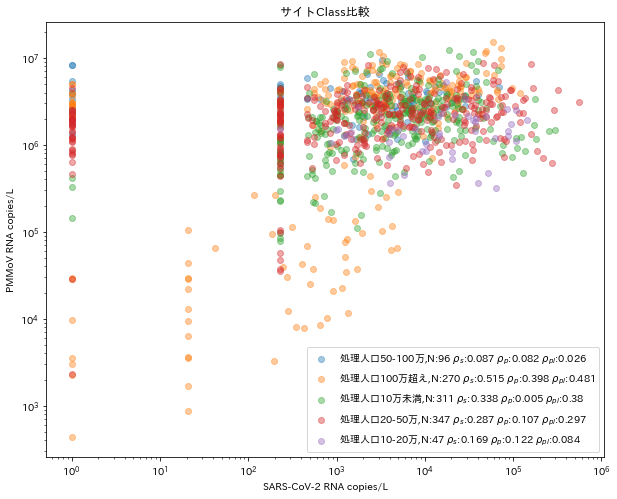

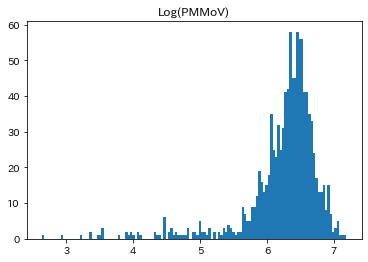

,site_name,covn_1_tbl,pmmov_tbl,pop_1000,val_7_d_conf_report,site_class,covn_1_tbl_p10m,covn_1_to_pmmov,val_7_d_conf_report_p10m
1281,水戸浄化センター1,231.481481,37100.000000,300.0,324.428571,処理人口20-50万,771.604938,0.006239,1081.428571
1296,那珂川ポンプ場,1.000000,28500.000000,300.0,285.428571,処理人口20-50万,3.333333,0.000035,951.428571
1313,水戸浄化センター1,1.000000,2314.814815,300.0,133.428571,処理人口20-50万,3.333333,0.000432,444.761905
1426,那覇空港-国際線,20.576132,44000.000000,1467.0,5160.000000,処理人口100万超え,14.025993,0.000468,3517.382413
1427,那覇空港-国際線,20.576132,863.000000,1467.0,5160.000000,処理人口100万超え,14.025993,0.023843,3517.382413
...,...,...,...,...,...,...,...,...,...
2274,東部下水処理場,231.481481,106000.000000,417.0,12.857143,処理人口20-50万,555.111466,0.002184,30.832477
2722,大束川浄化センター,231.481481,57600.000000,202.0,10.333333,処理人口20-50万,1145.947928,0.004019,51.155116
2727,大束川浄化センター,231.481481,98800.000000,202.0,7.285714,処理人口20-50万,1145.947928,0.002343,36.067893
2729,大束川浄化センター,231.481481,35600.000000,202.0,5.285714,処理人口20-50万,1145.947928,0.006502,26.166902


In [76]:
# PMMoV 
plot_scatter(df_tmp,"covn_1_tbl","pmmov_tbl", break_idx="site_class", draw=True, title="サイトClass比較", figure_size=(10,8))

s = np.log10(df_tmp["pmmov_tbl"]).dropna()
plt.show()

fig = plt.figure()
ax = fig.add_subplot(1,1,1)
ax.hist(s, bins=128)
ax.title.set_text("Log(PMMoV)")
plt.show()
df_tmp[df_tmp["pmmov_tbl"]<2e5]

#plot_scatter(df_tmp,"covn_1_pmmov","val_7_d_conf_report", draw=True, break_idx="site_name", title="補正なしデータ (全て)", figure_size=(20,20))

#plot_scatter(df_tmp,"covn_1_to_pmmov","val_7_d_conf_report_p10m", draw=True, title="補正したデータ (全て)", figure_size=(10,8))

#plot_scatter(df_tmp[df_tmp["site_class"]!="処理人口10万未満"],"covn_1_to_pmmov","val_7_d_conf_report_p10m", draw=True, title="補正したデータ (10万以上)", figure_size=(10,8))

Index(['sampling_date', 'confirmed_case_oper', 'geom_id_0', 'lab_id',
       'assay_method', 'cnt_blq', 'cnt_ud', 'cnt_det', 'geo_mean_usemeas',
       'geo_mean_uselloq', 'geo_mean_usetloq', 'geo_mean_normalized_usemeas',
       'geo_mean_normalized_uselloq', 'geo_mean_normalized_usetlop',
       'geo_mean_pmmov', 'sum_process_pop', 'avg_covn_1',
       'sum_covn_1_all_process_pop', 'string_agg_covn_1_process_pop',
       'site_ids', 'site_names', 'phd_date', 'phd_geom_id_0',
       'phd_confirmed_case_oper', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'val_conf_report', 'val_7_d_conf_report',
       'val_conf_episode', 'val_7_d_conf_episode', 'val_active',
       'val_7_d_active', 'polygon_ids', 'count_sites', 'str_agg_val',
       'covn_1_det_rate', 'covn_1_qua_rate',
       'geo_mean_usemeas_roll_3pts_centered',
       'geo_mean_uselloq_roll_3pts_centered',
       'geo_mean_usetloq_roll_3pts_centered',
       'geo_mean_normalized_usemeas_3pts_centered',
       'geo_mean_

Index(['site_id', 'val_conf_report', 'val_7_d_conf_report', 'dateTime',
       'sample_id', 'event_name', 'lab_id', 'original_file_name',
       'analyzed_date', 'group_id', 'group_type', 'polygon_id', 'site_name',
       'registerd_name', 'process_pop', 'geo_coor', 'quality_flag', 'covn_1',
       'pmmov', 'covn_1_d', 'covn_1_ud', 'covn_1_blq', 'pmmov_d', 'pmmov_ud',
       'pmmov_blq', 'covn_1_pmmov', 'covn_1_pmmov_usetloq',
       'covn_1_pmmov_uselloq', 'covn_1_tbl', 'pmmov_tbl', 'covn_1_uselloq',
       'pmmov_uselloq', 'covn_1_usemeas', 'pmmov_usemeas', 'covn1_tloq',
       'covn1_lloq', 'pmmov_tloq', 'pmmov_lloq', 'assay_method', 'rmk_covn_1',
       'rmk_pmmov', 'unit', 'collection', 'sample_type', 'sampler',
       'sampling_date', 'polygon_name', 'pop_1000', 'pmmov_tbl_p10m',
       'covn_1_tbl_p10m', 'covn_1_pmmov_1e4', 'covn_1_pmmov_1e4_p10m',
       'covn_1_blq_tloq', 'geom_id_0', 'geom_id_1', 'geom_id_2'],
      dtype='object')

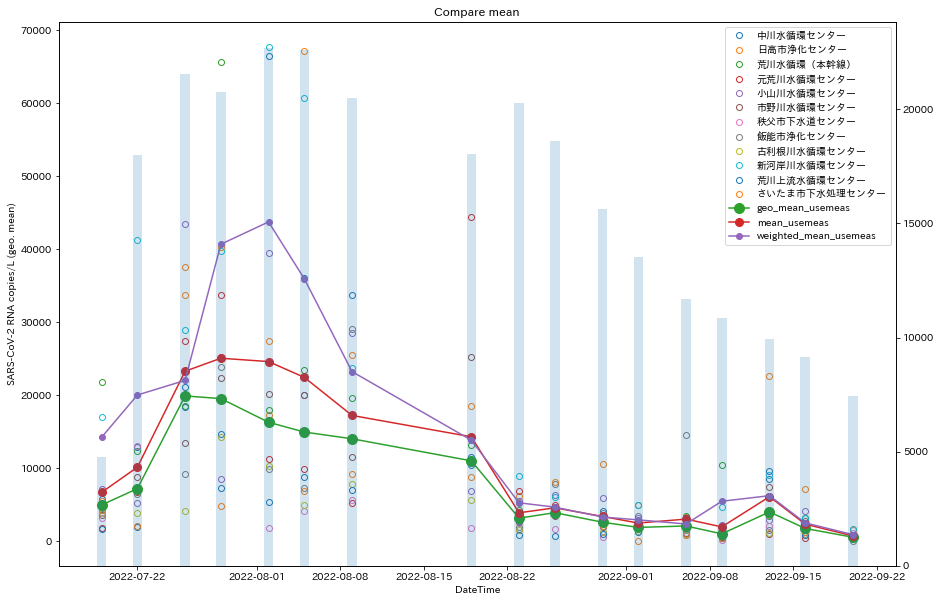

In [18]:
#####################################################################################################
#####################################################################################################
# 各平均の比較をしたい
# 
#####################################################################################################
#####################################################################################################
#print(prd_meas_long_analyzed)

sel_columns=['sampling_date',"geom_id_0","assay_method",
             'geo_mean_usemeas','geo_mean_uselloq', 'mean_usemeas','geo_mean_usetloq','weighted_mean_usemeas','val_7_d_conf_report_10'
            ]
print(df_geom_src_id_0.columns)
PICK_ONE_GEOM_ID = 8
df_geo_picked = df_geom_src_id_0[df_geom_src_id_0["assay_method"] == "HS"]
df_geo_picked = df_geo_picked[df_geo_picked["geom_id_0"]==PICK_ONE_GEOM_ID][sel_columns]

df_geo_picked = pd.merge(df_epi[["sampling_date","site_name","covn_1_usemeas","geom_id_0"]], df_geo_picked, on=["sampling_date","geom_id_0"],how="left")

df_tmp = df_geo_picked[df_geo_picked["geom_id_0"]==PICK_ONE_GEOM_ID]
df_tmp = df_tmp[df_tmp["assay_method"] == "HS"]

list_site = df_tmp["site_name"].unique()
"""
fig, ax1 = plt.subplots(figsize=(15,10))
ax1.title.set_text("Compare mean")
ax1.set_xlabel('DateTime')
ax1.set_ylabel(label_dicts["geo_mean_usemeas"])
cnt=0
for i in ['geo_mean_usemeas','geo_mean_uselloq', 'mean_usemeas','geo_mean_usetloq','weighted_mean_usemeas']:
    ax1.plot(df_geo_picked["sampling_date"],df_geo_picked[i],label=i,marker="o",markersize=10-cnt)
    cnt+=2

ax1.legend()
df_epi.columns
"""
fig, ax1 = plt.subplots(figsize=(15,10))
ax1.title.set_text("Compare mean")
ax1.set_xlabel('DateTime')
ax1.set_ylabel(label_dicts["geo_mean_usemeas"])
for i in list_site:
    _df = df_tmp[df_tmp["site_name"]==i].copy()
    ax1.plot(_df["sampling_date"],_df["covn_1_usemeas"],linestyle="None",label=i,marker="o",mfc='none')
cnt=0
_df = df_geo_picked[df_geo_picked["site_name"]=="中川水循環センター"].copy()
#for i in ['geo_mean_usemeas','geo_mean_uselloq', 'mean_usemeas','geo_mean_usetloq','weighted_mean_usemeas']:
for i in ['geo_mean_usemeas', 'mean_usemeas','weighted_mean_usemeas']:
    ax1.plot(_df["sampling_date"],_df[i],label=i,marker="o",markersize=10-cnt)
    cnt+=2
ax2 = ax1.twinx()
ax2.bar(_df["sampling_date"],_df["val_7_d_conf_report_10"],label="感染者数 per 100K(-7d)",alpha=0.2)
ax1.legend()
df_epi.columns


Index(['sampling_date', 'confirmed_case_oper', 'geom_id_0', 'lab_id',
       'assay_method', 'cnt_blq', 'cnt_ud', 'cnt_det', 'geo_mean_usemeas',
       'geo_mean_uselloq', 'geo_mean_usetloq', 'geo_mean_normalized_usemeas',
       'geo_mean_normalized_uselloq', 'geo_mean_normalized_usetlop',
       'geo_mean_pmmov', 'sum_process_pop', 'avg_covn_1',
       'sum_covn_1_all_process_pop', 'string_agg_covn_1_process_pop',
       'site_ids', 'site_names', 'phd_date', 'phd_geom_id_0',
       'phd_confirmed_case_oper', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'val_conf_report', 'val_7_d_conf_report',
       'val_conf_episode', 'val_7_d_conf_episode', 'val_active',
       'val_7_d_active', 'polygon_ids', 'count_sites', 'str_agg_val',
       'covn_1_det_rate', 'covn_1_qua_rate',
       'geo_mean_usemeas_roll_3pts_centered',
       'geo_mean_uselloq_roll_3pts_centered',
       'geo_mean_usetloq_roll_3pts_centered',
       'geo_mean_normalized_usemeas_3pts_centered',
       'geo_mean_

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:255: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "-r" (-> color='r'). The keyword argument will take precedence.
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:435: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:437: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:439: Set

Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


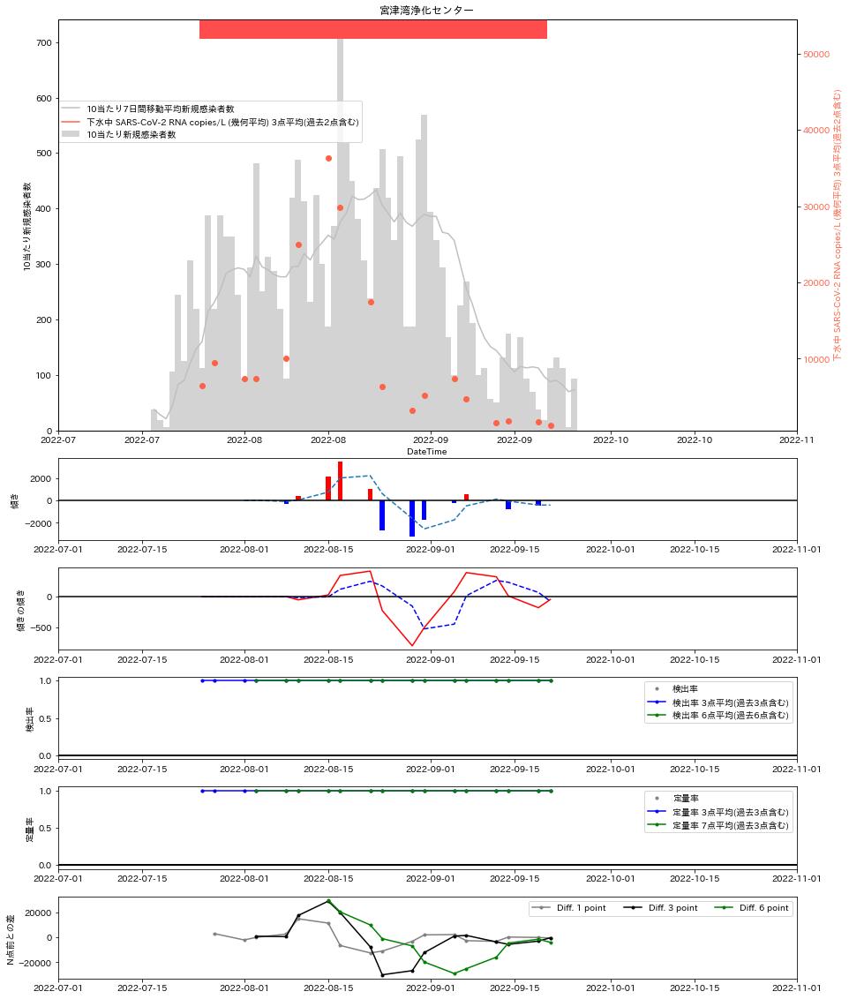

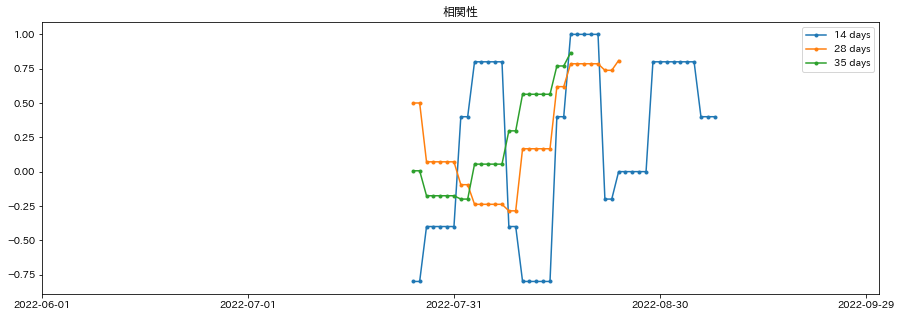

2022-07-20 2099-01-01 <class 'datetime.date'>
591 591
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


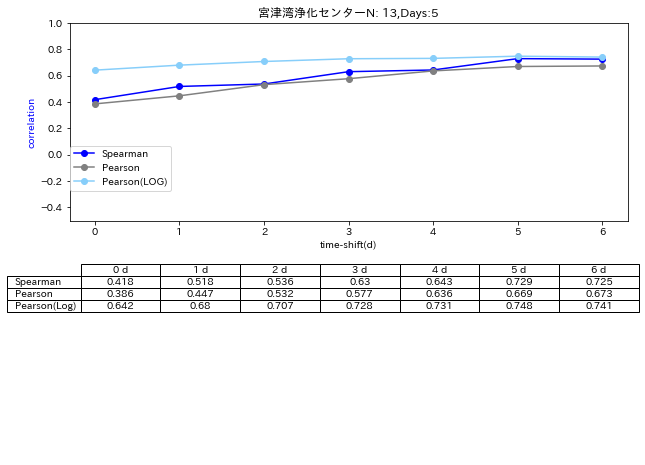

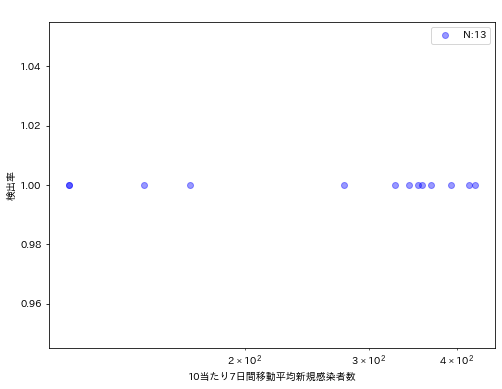

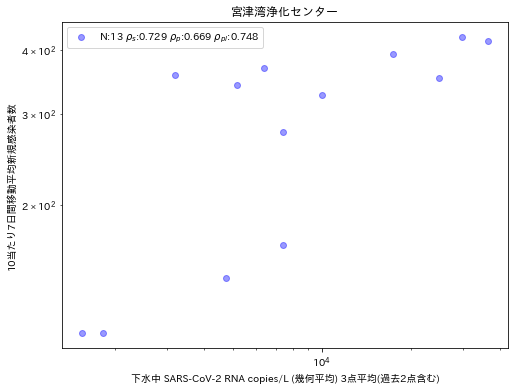

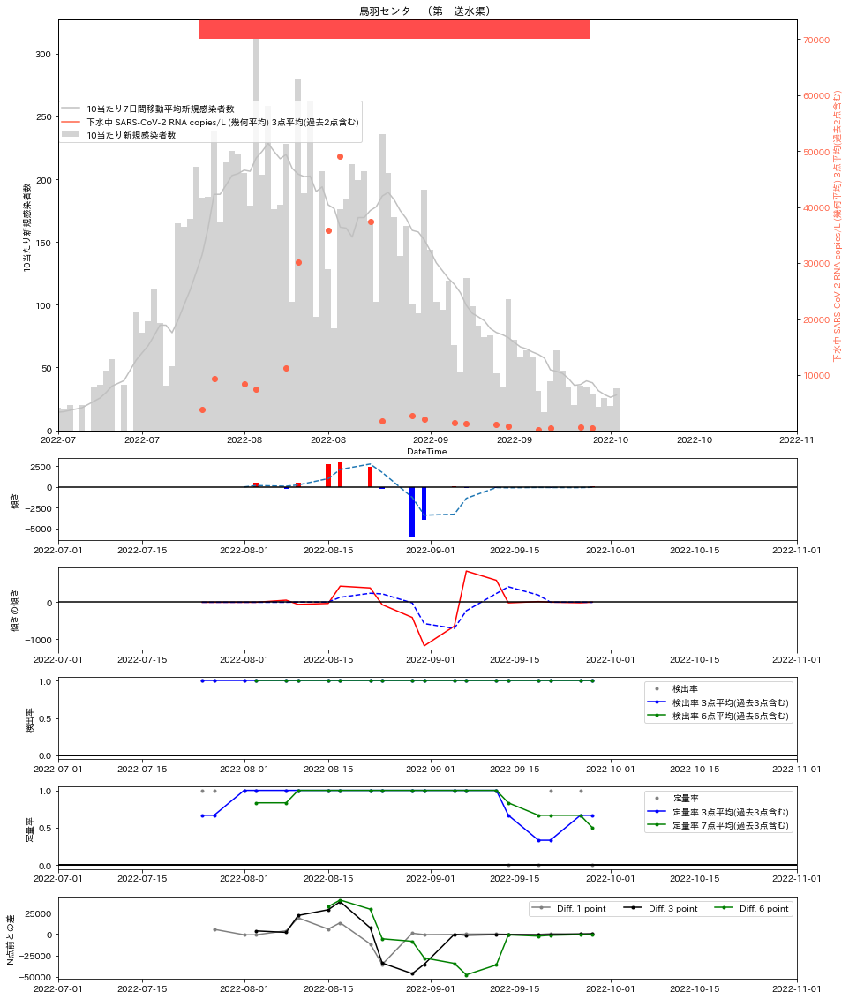

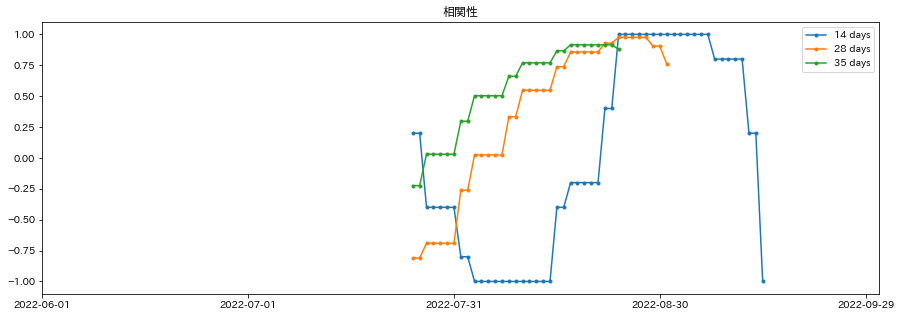

2022-07-20 2099-01-01 <class 'datetime.date'>
592 592
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


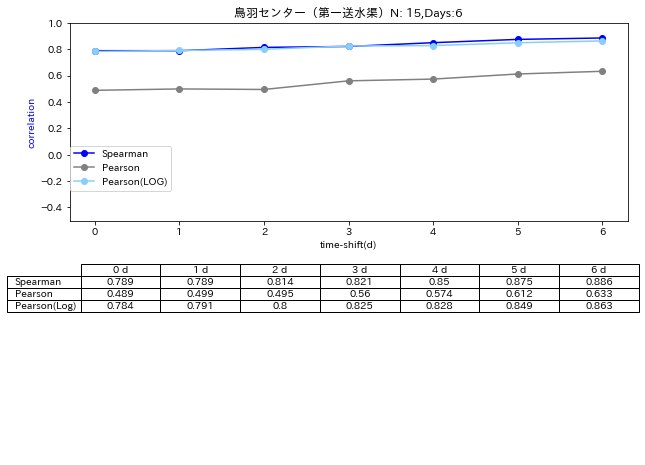

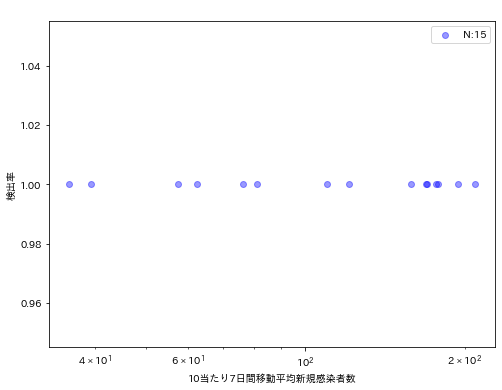

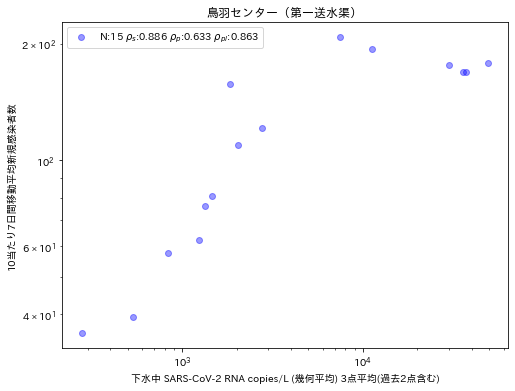

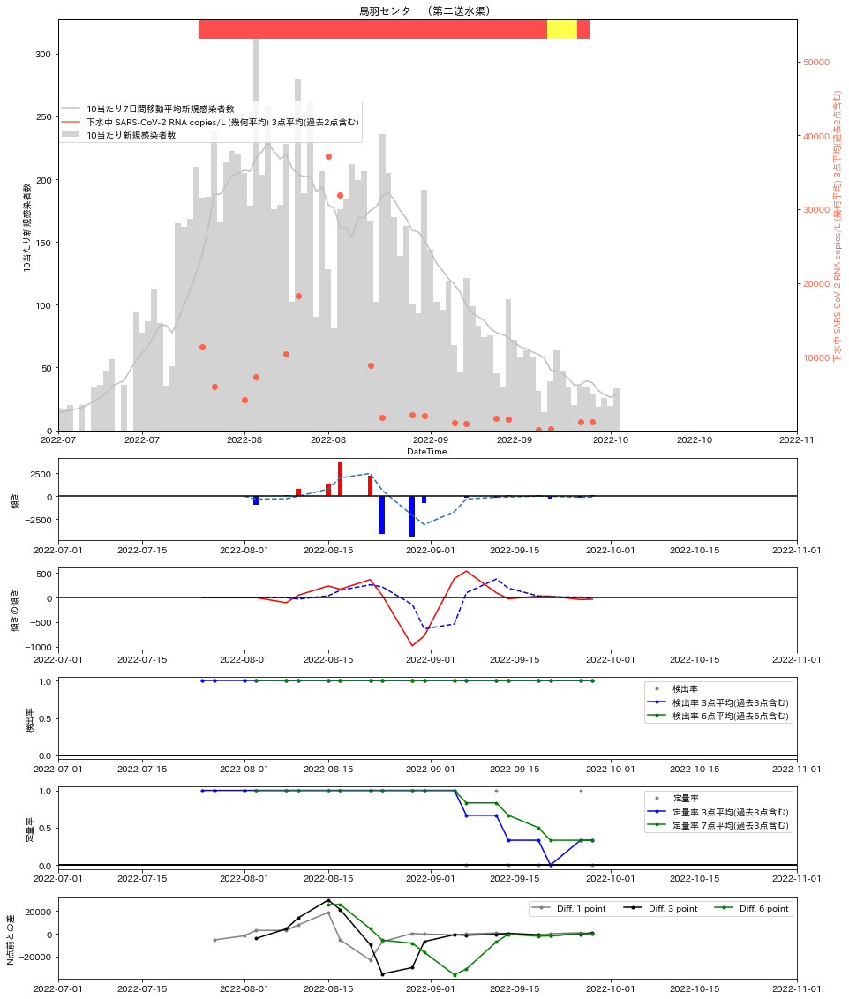

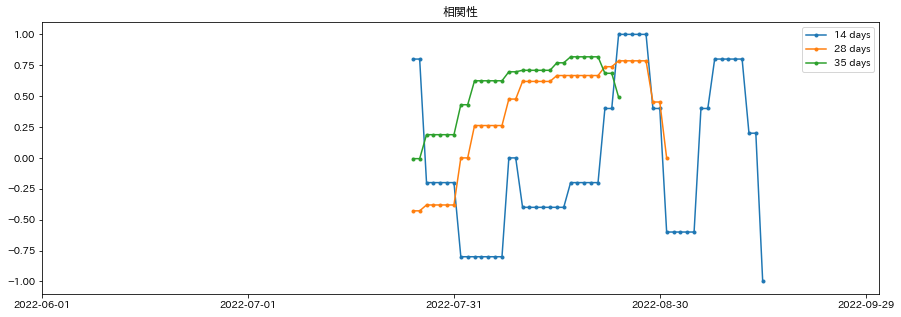

2022-07-20 2099-01-01 <class 'datetime.date'>
591 591
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


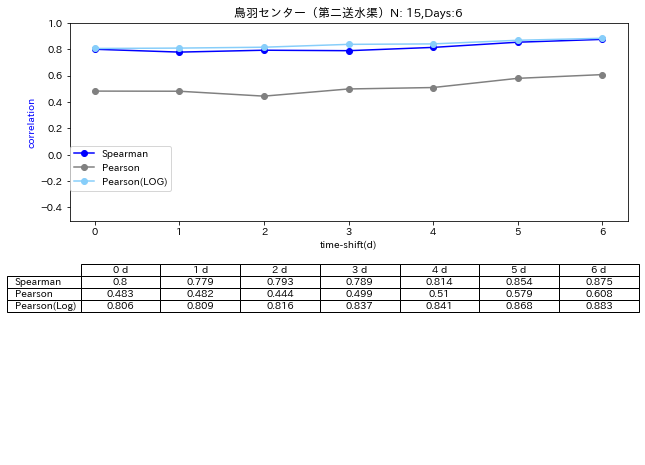

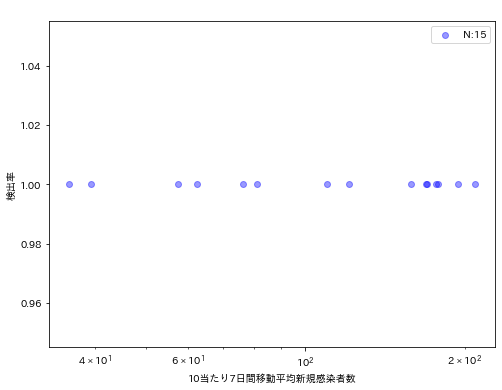

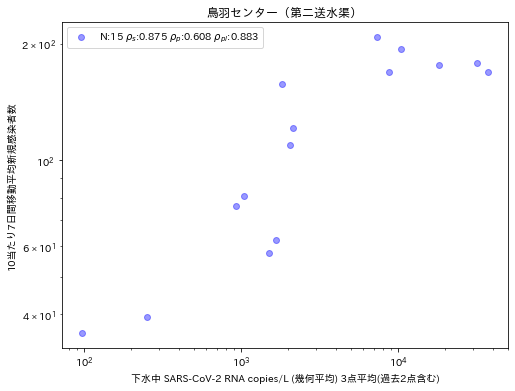

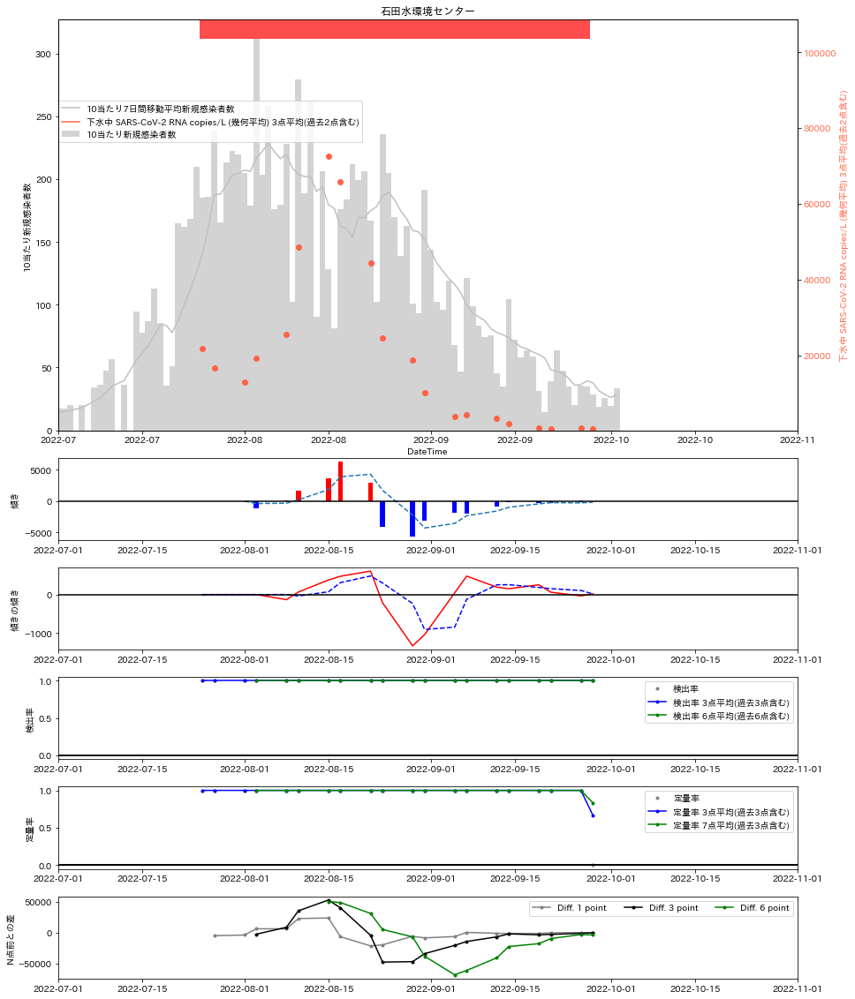

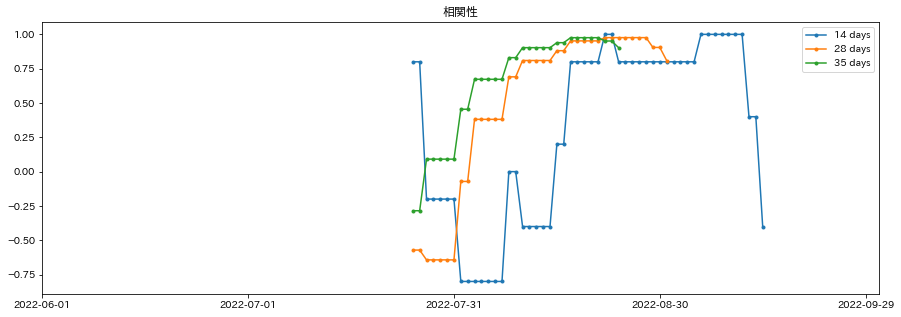

2021-11-05 2099-01-01 <class 'datetime.date'>
329 329
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


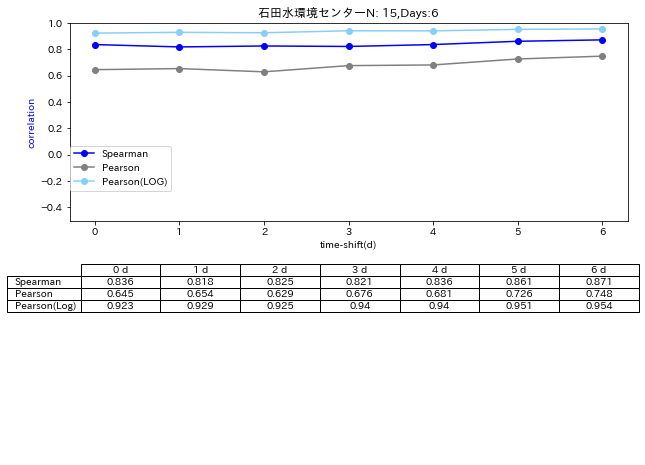

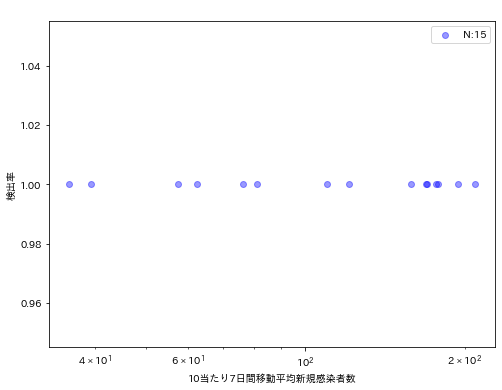

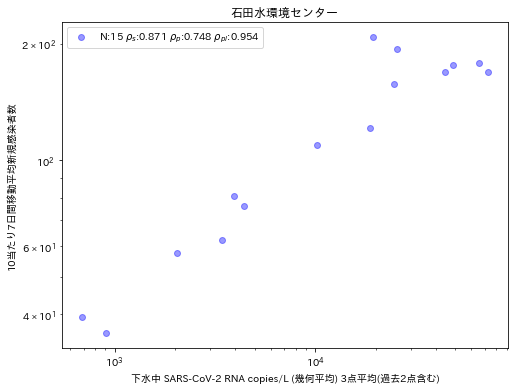

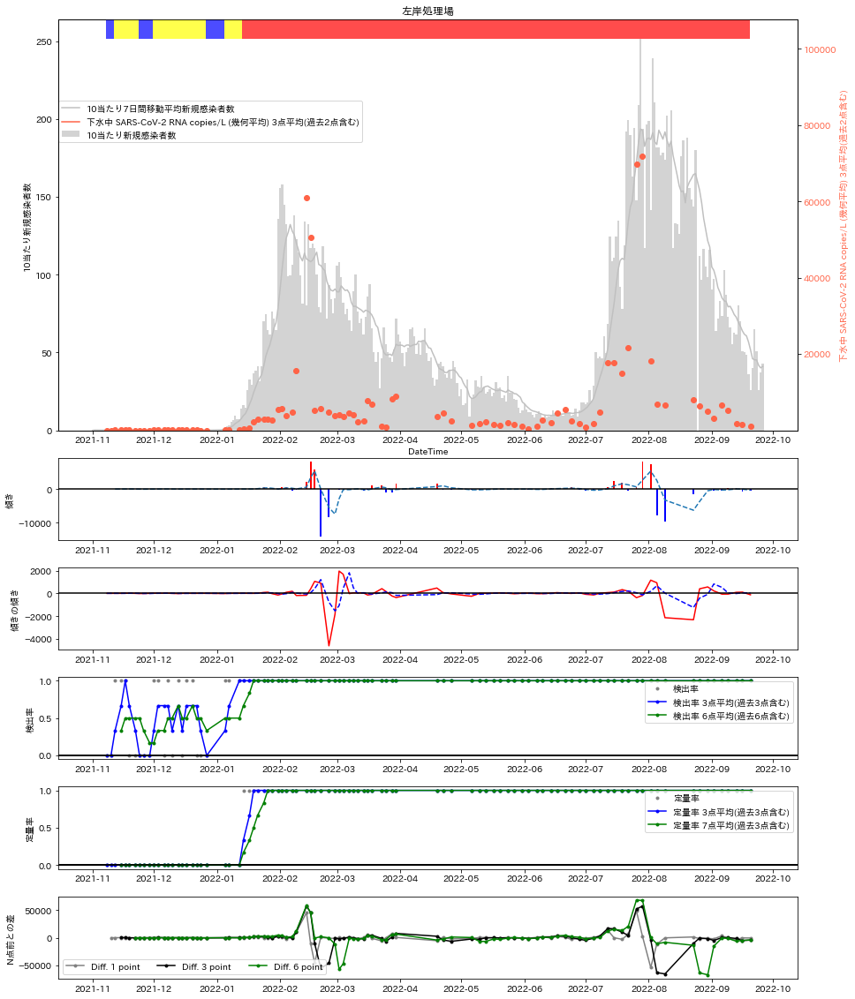

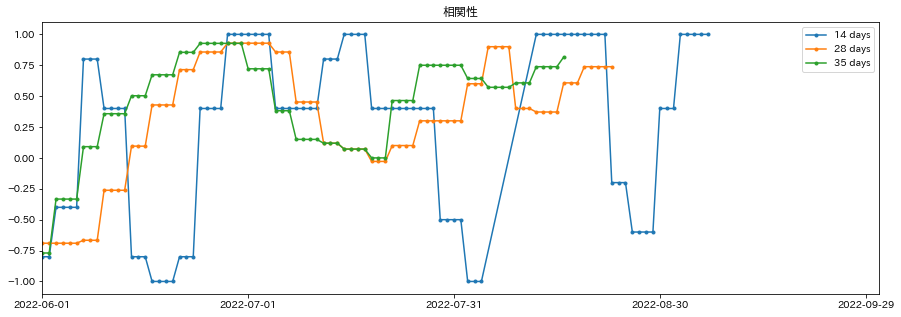

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:141: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy


2021-11-05 2099-01-01 <class 'datetime.date'>
330 330
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


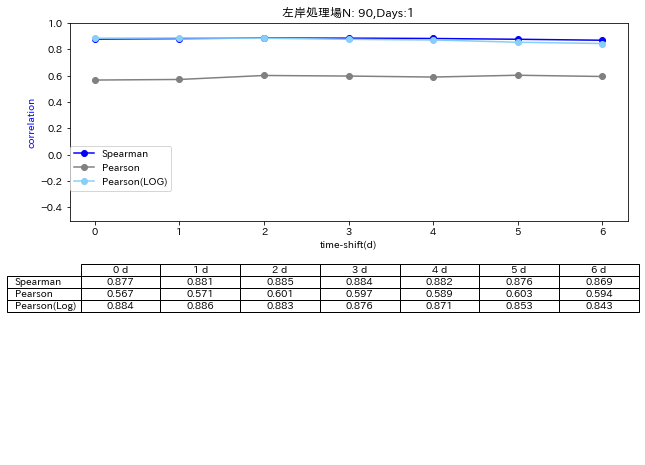

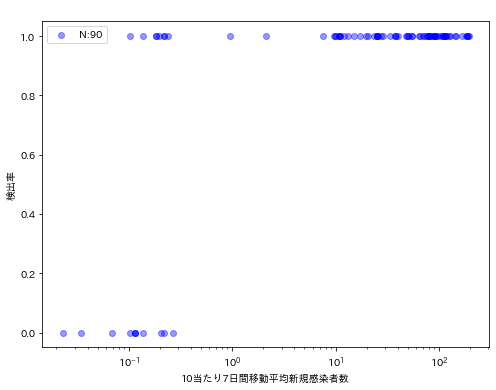

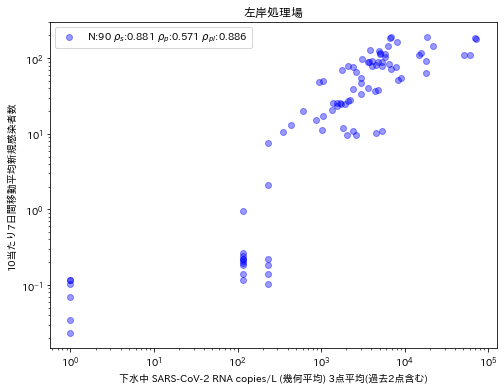

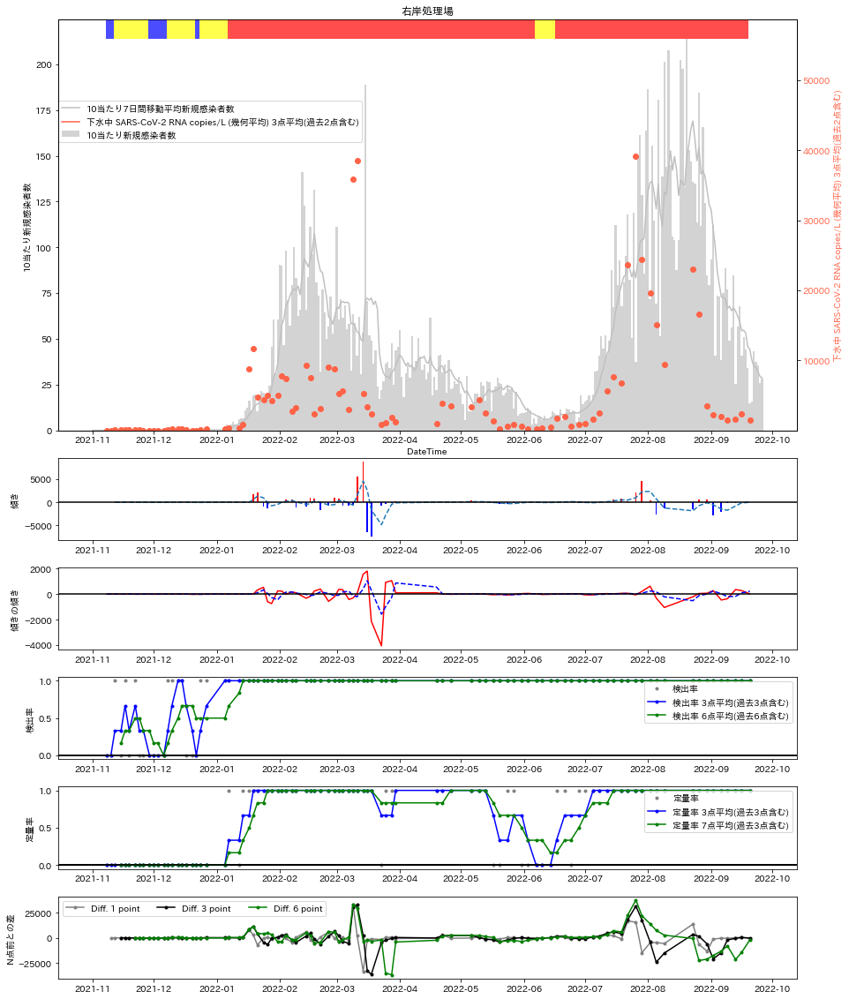

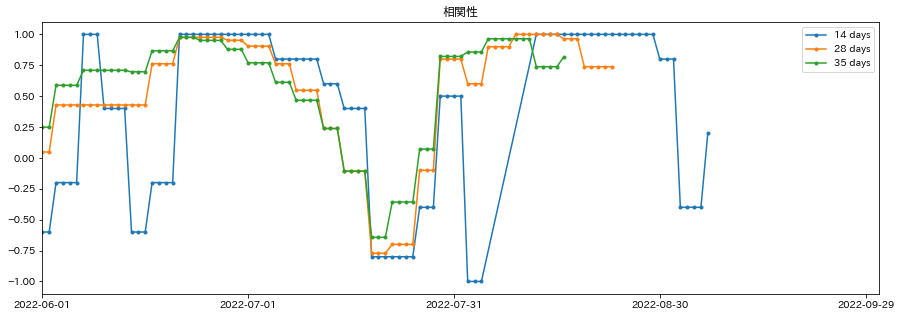

2021-09-01 2099-01-01 <class 'datetime.date'>
374 374
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


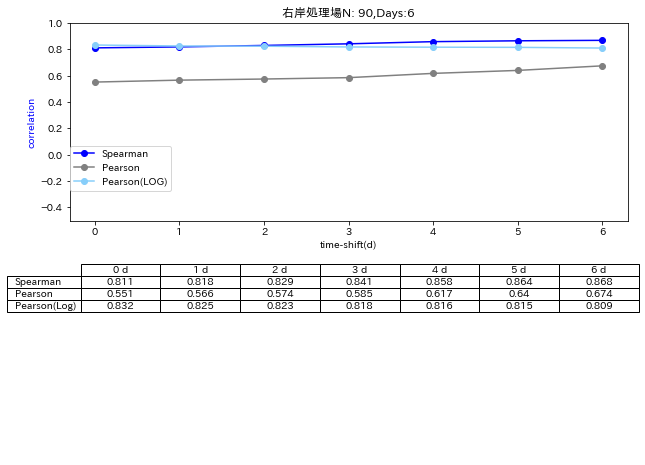

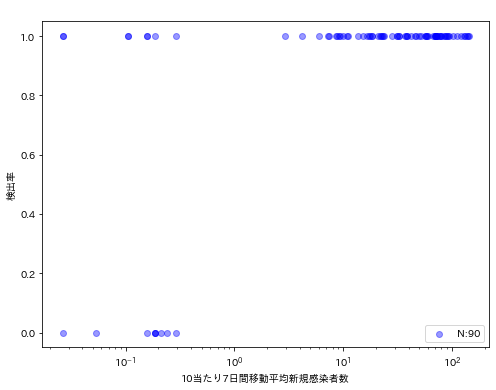

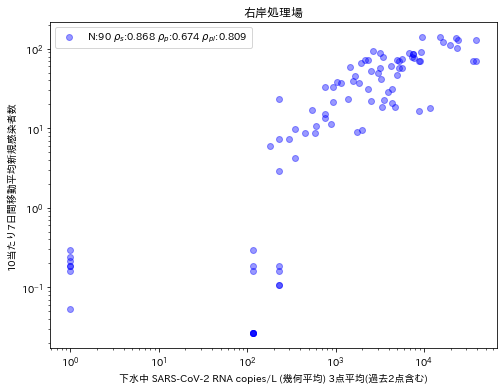

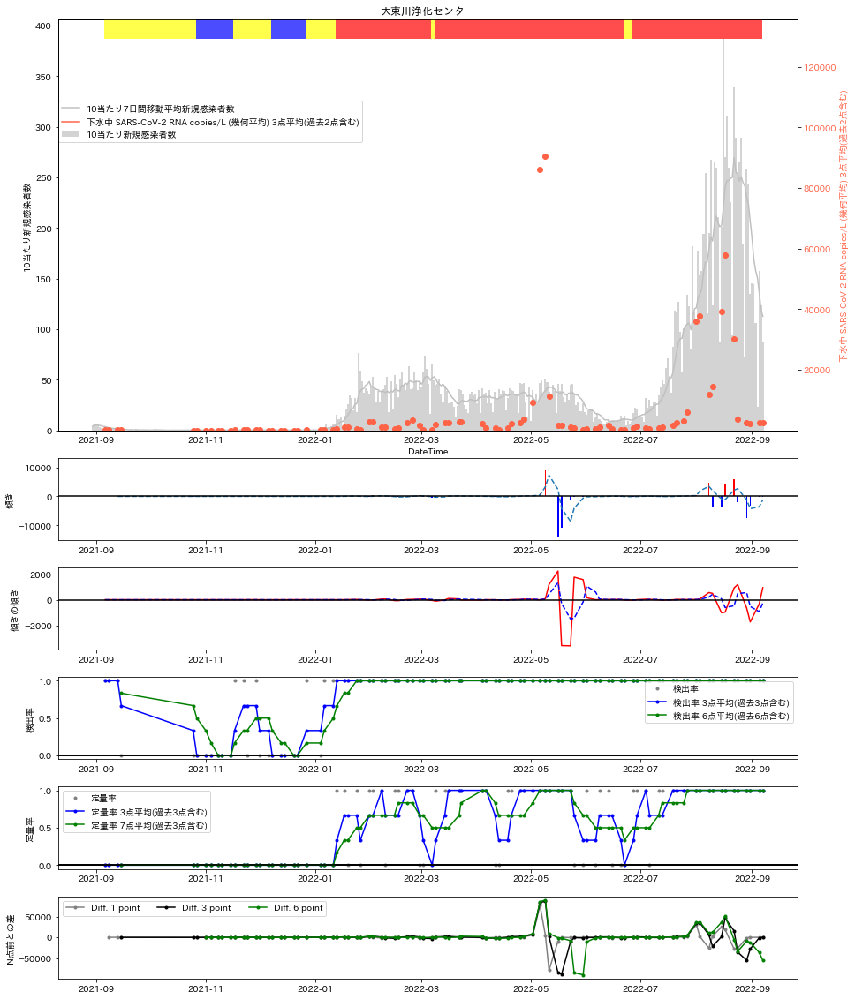

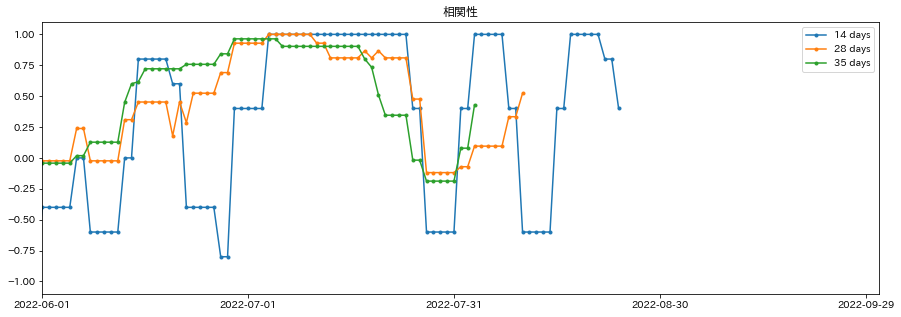

2021-09-01 2099-01-01 <class 'datetime.date'>
374 374
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


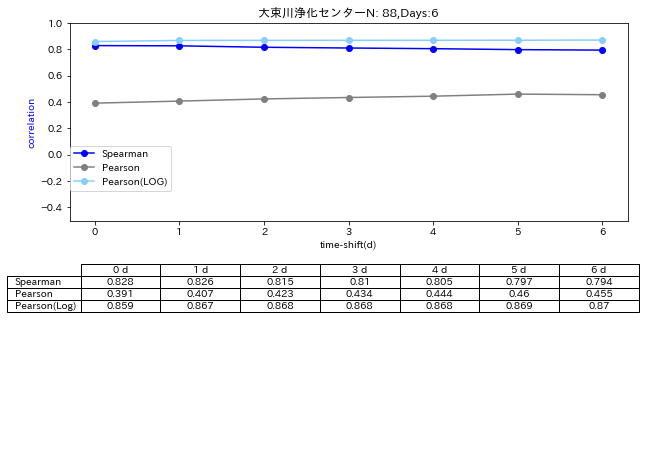

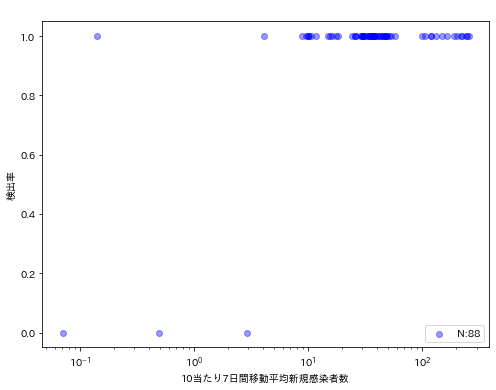

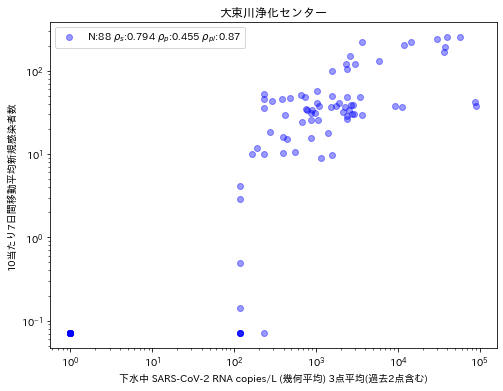

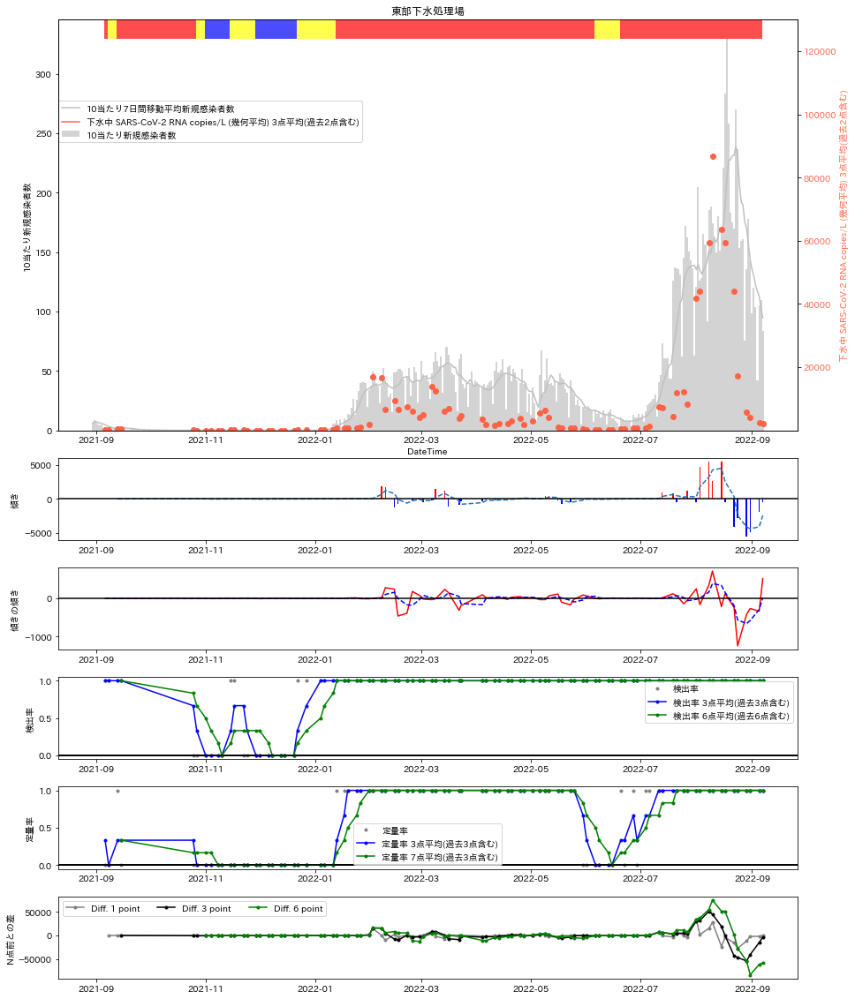

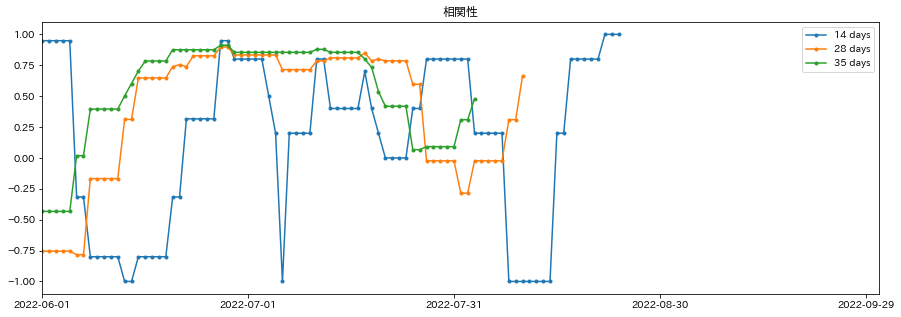

2022-07-22 2099-01-01 <class 'datetime.date'>
67 67
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


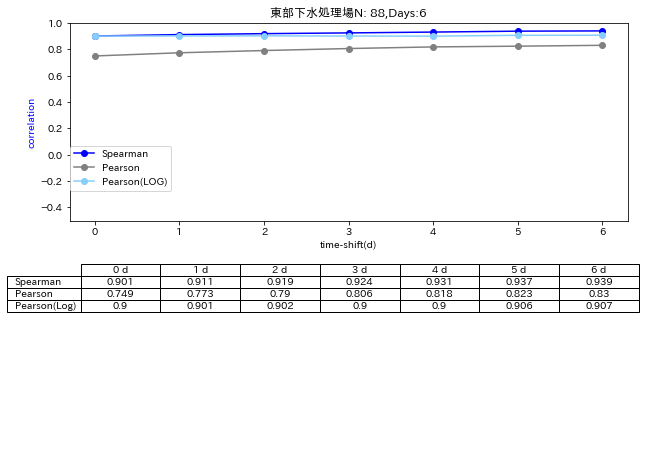

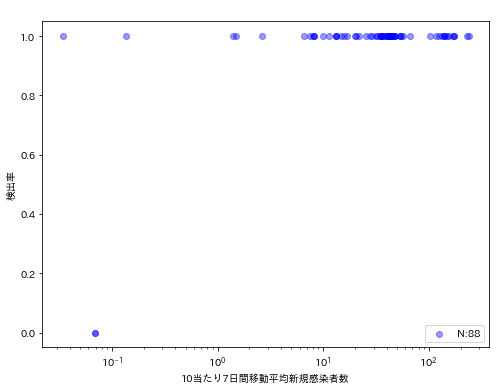

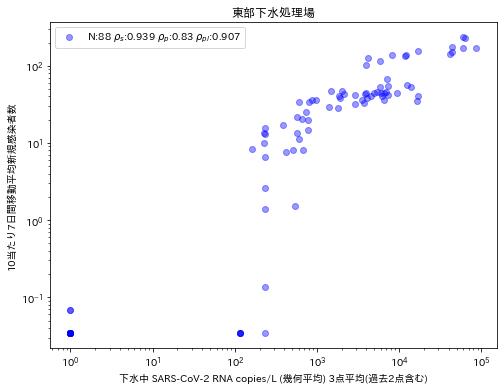

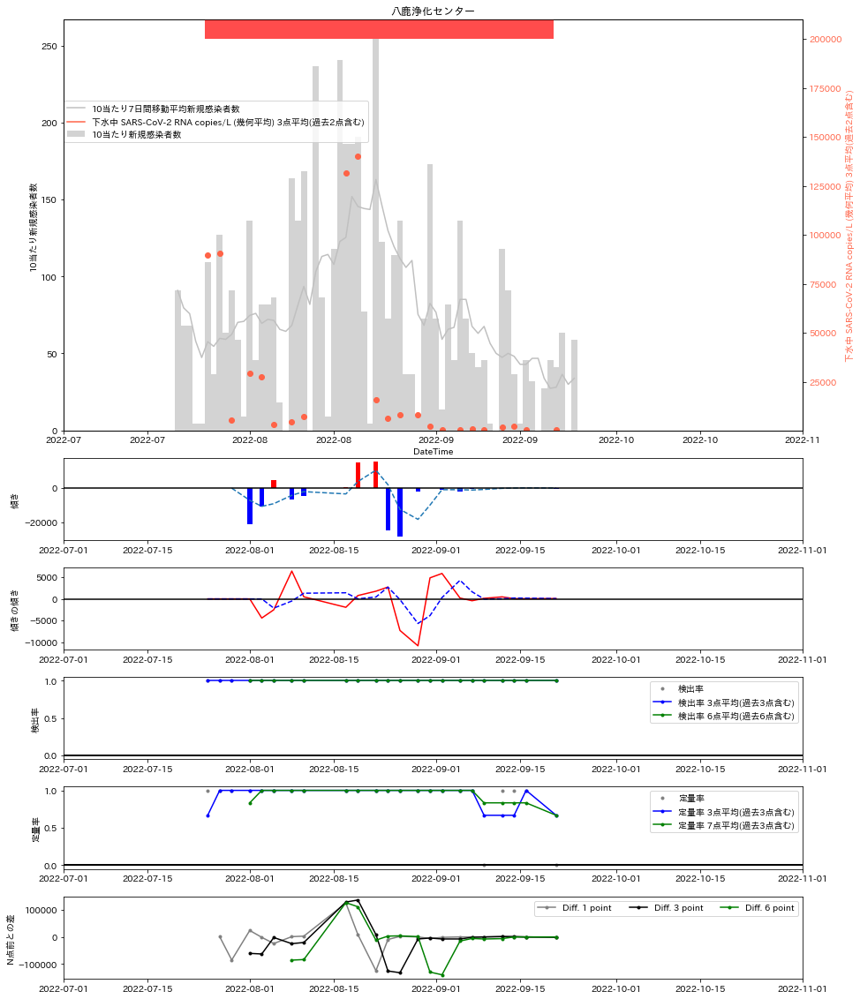

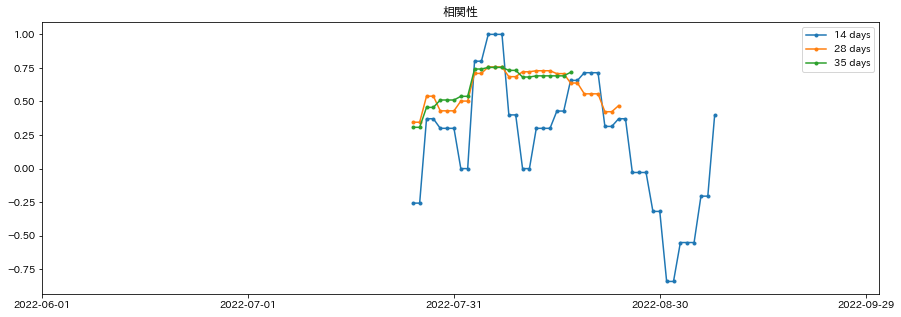

2022-07-22 2099-01-01 <class 'datetime.date'>
67 67
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


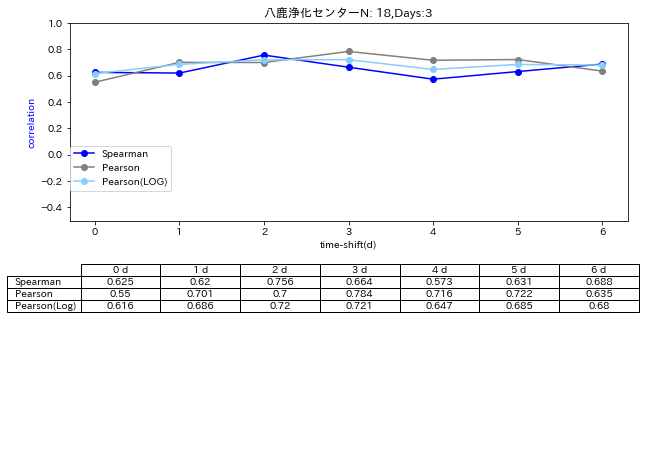

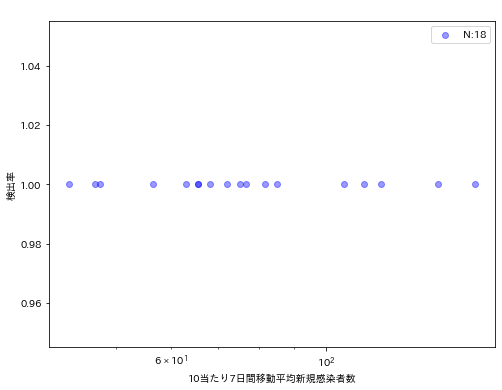

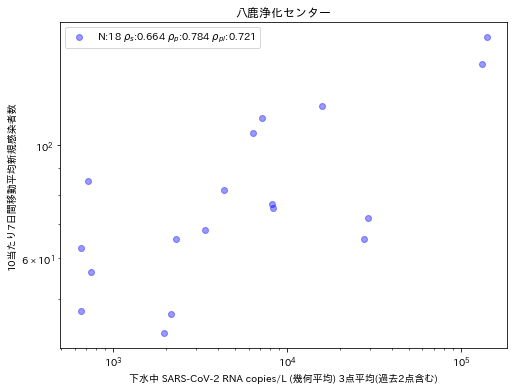

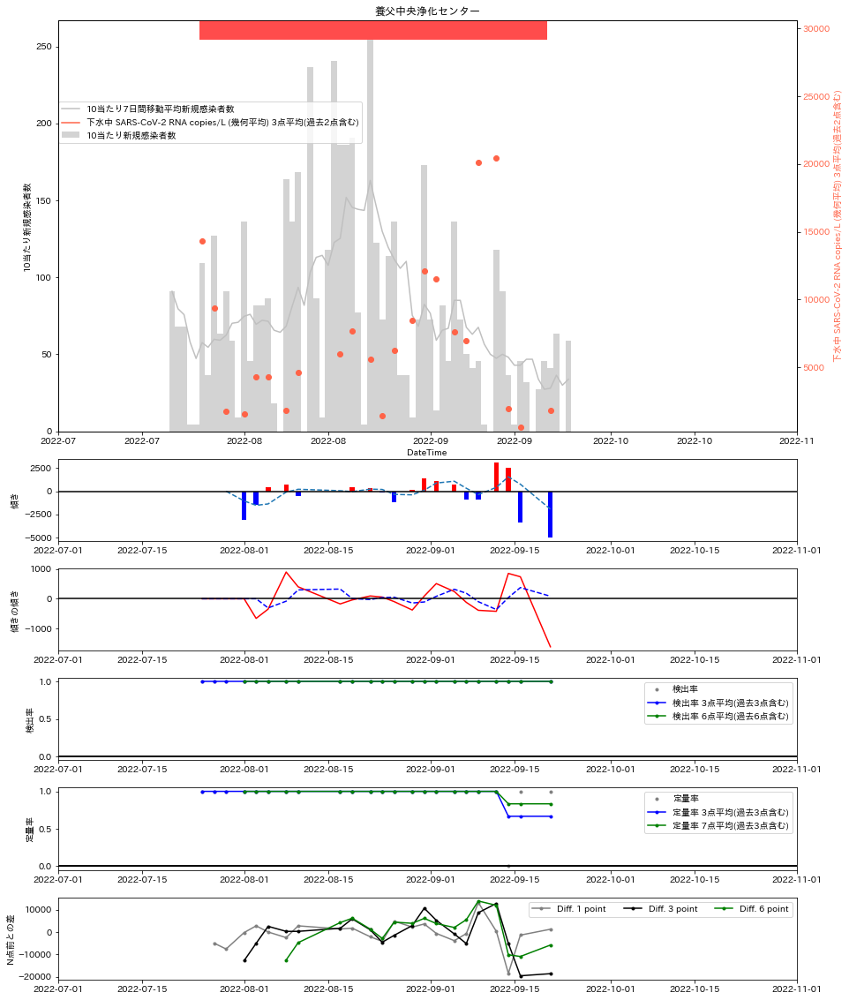

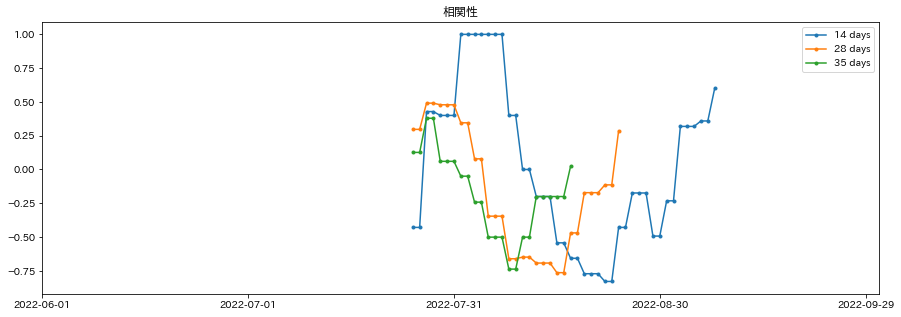

2022-07-22 2099-01-01 <class 'datetime.date'>
67 67
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


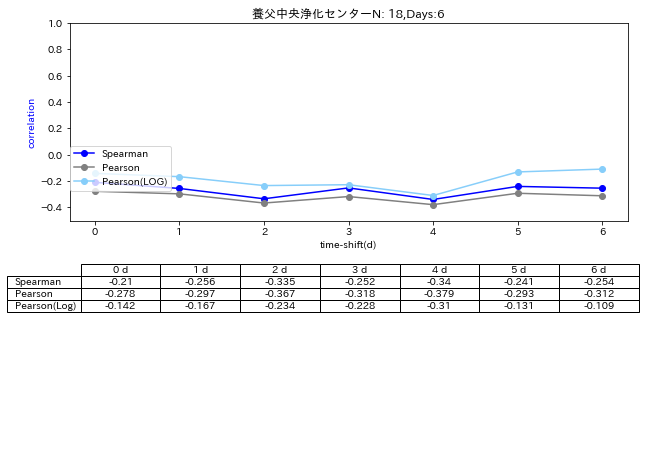

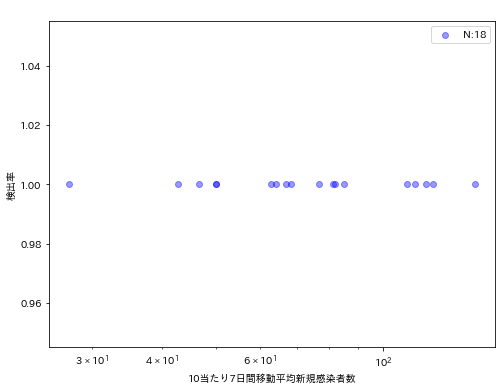

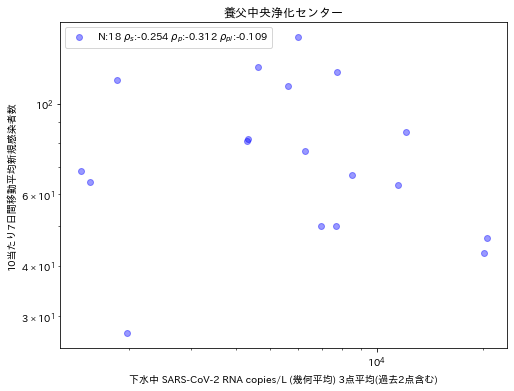

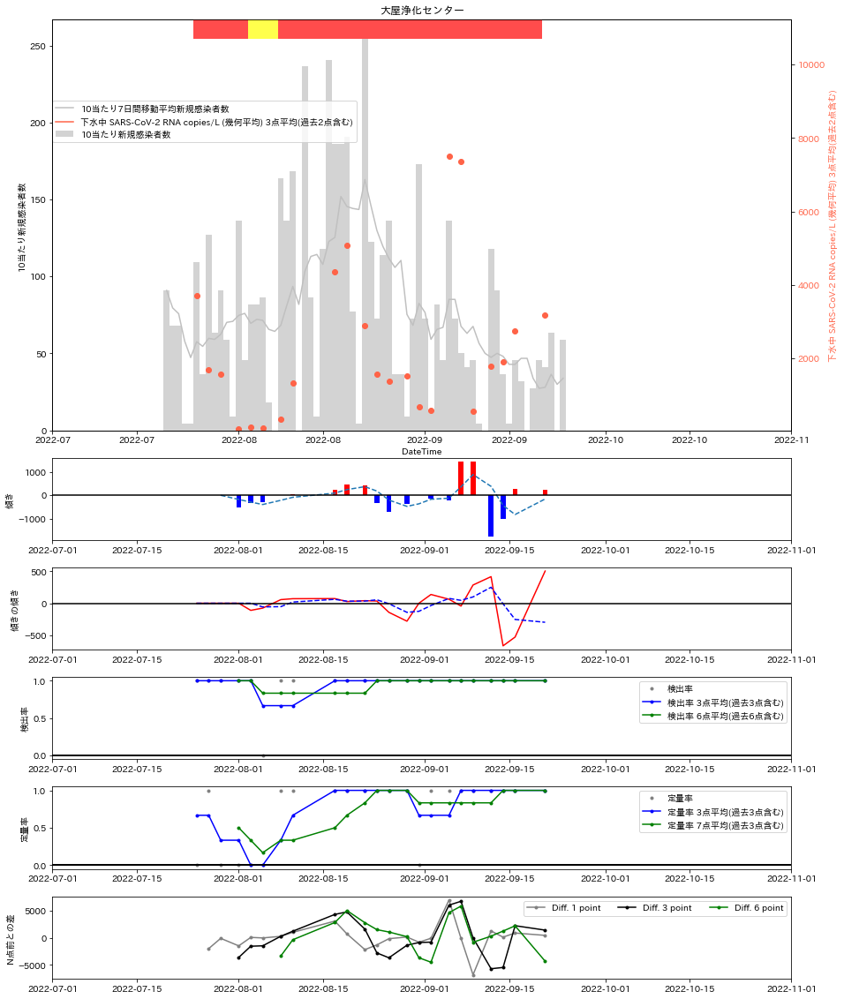

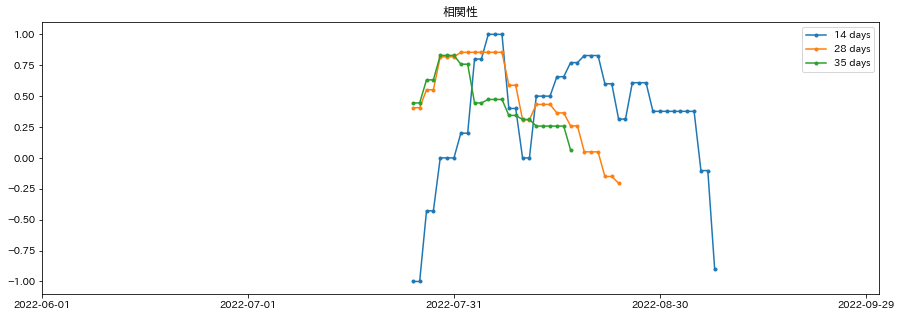

2022-07-22 2099-01-01 <class 'datetime.date'>
67 67
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


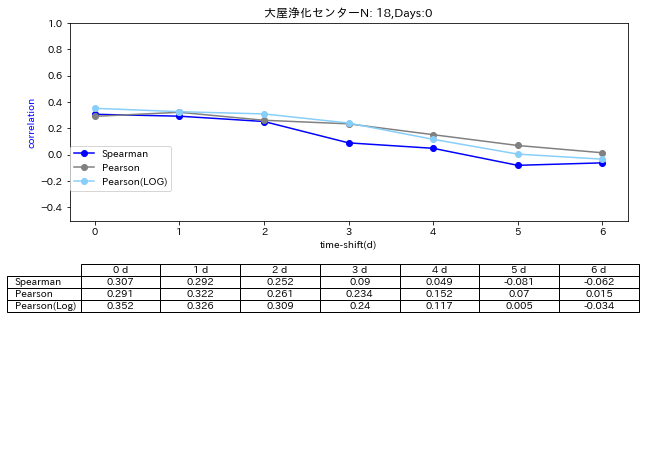

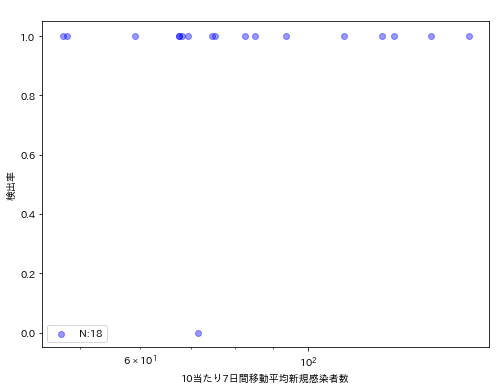

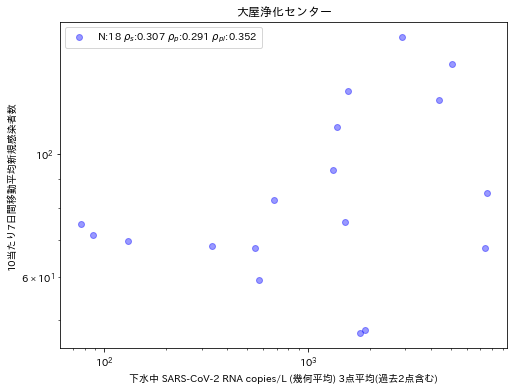

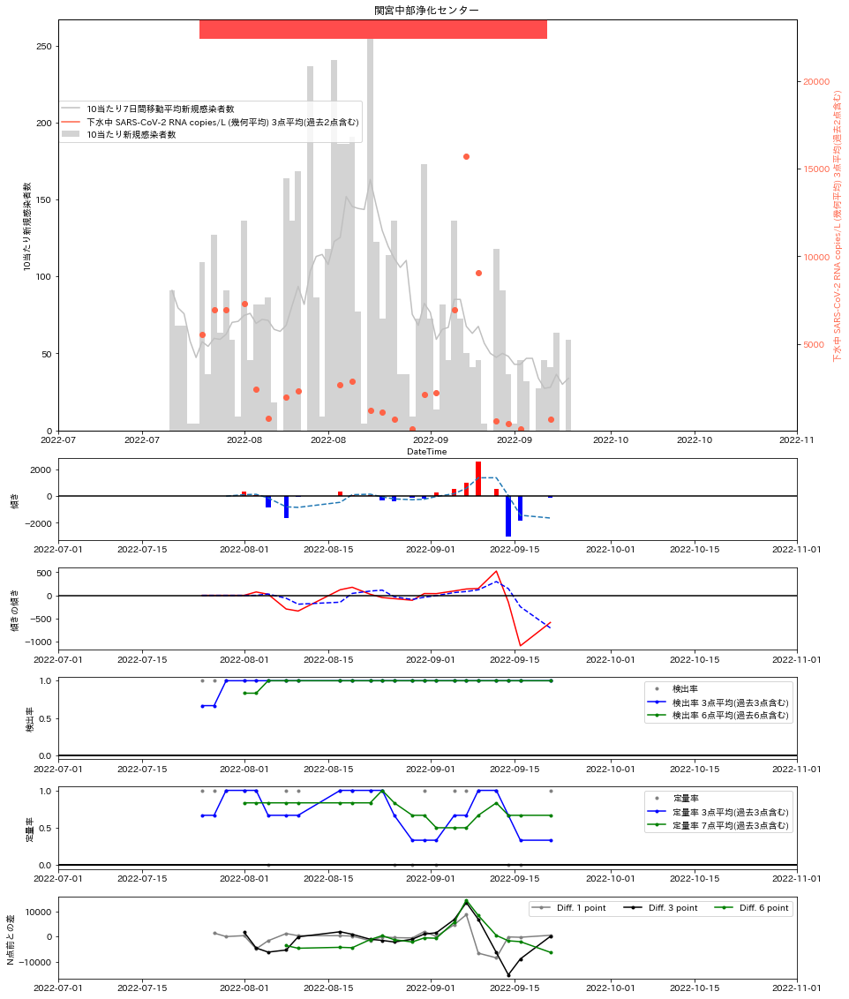

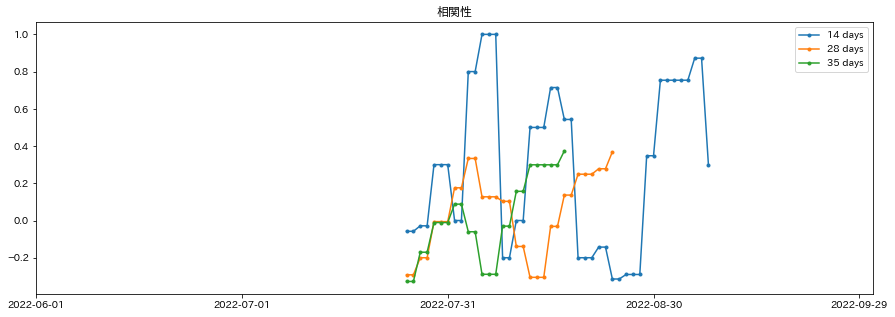

2022-07-22 2099-01-01 <class 'datetime.date'>
67 67
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


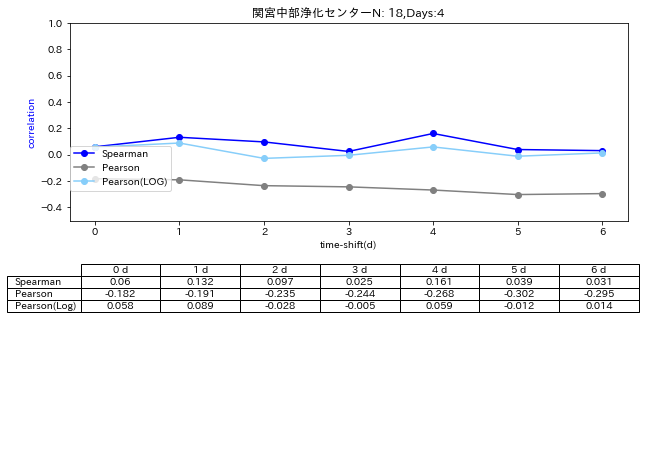

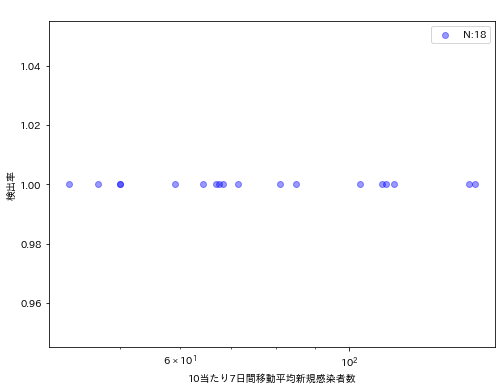

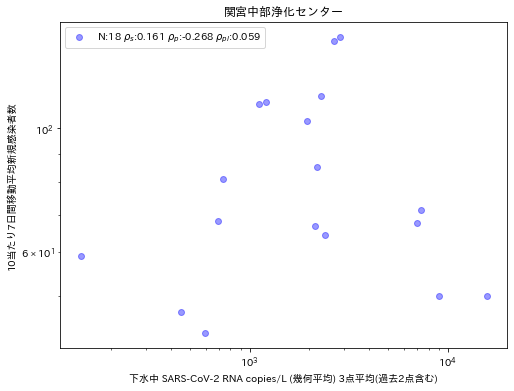

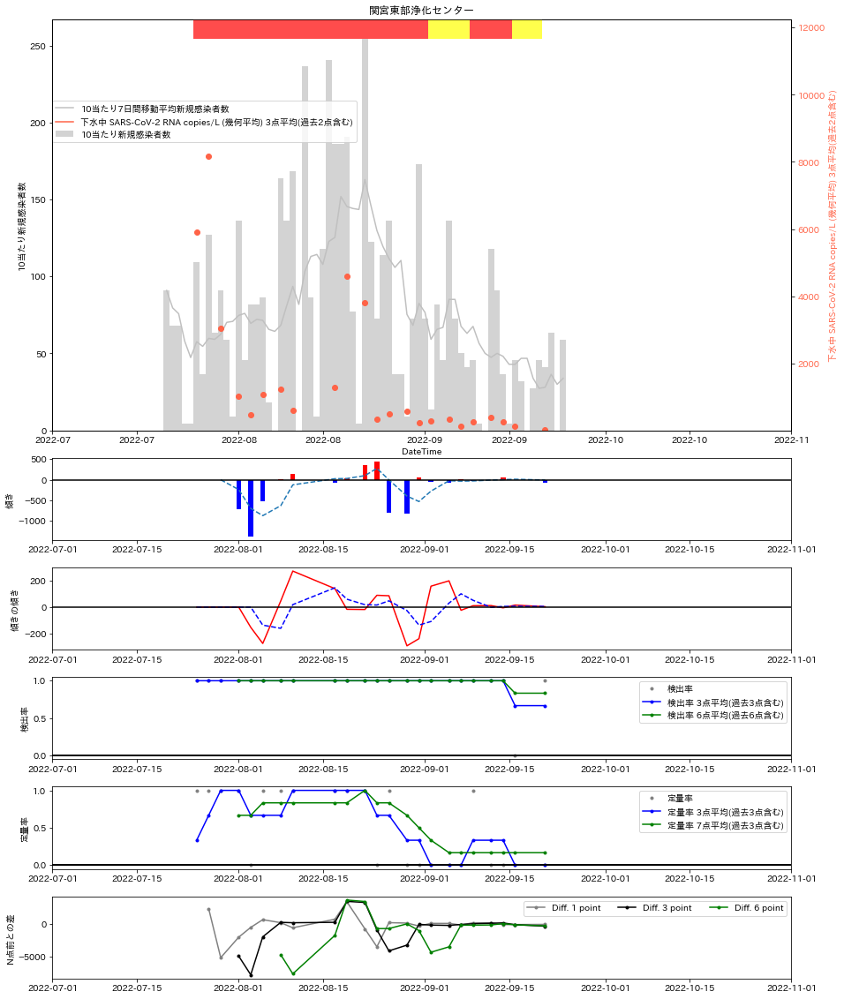

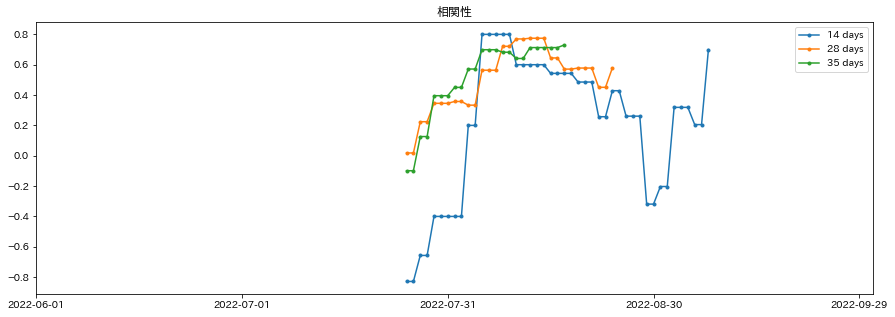

2022-07-22 2099-01-01 <class 'datetime.date'>
69 69
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


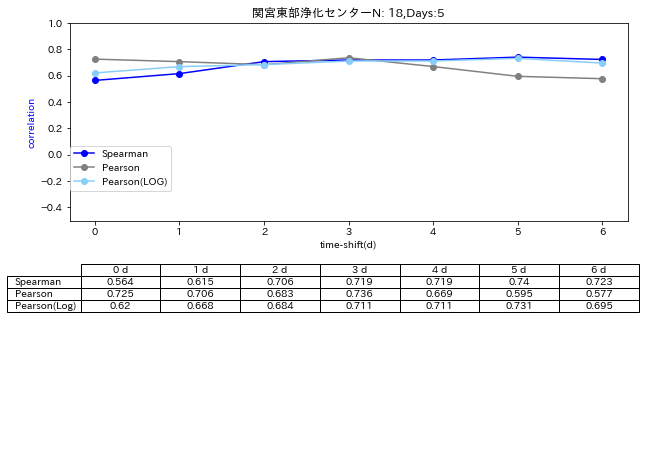

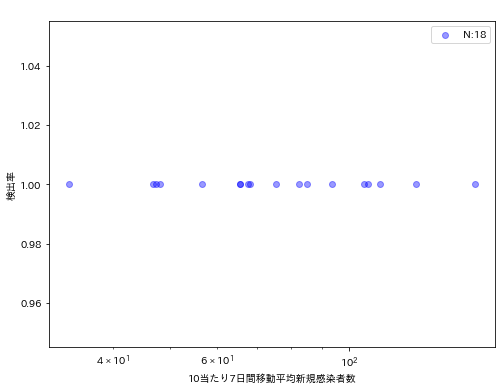

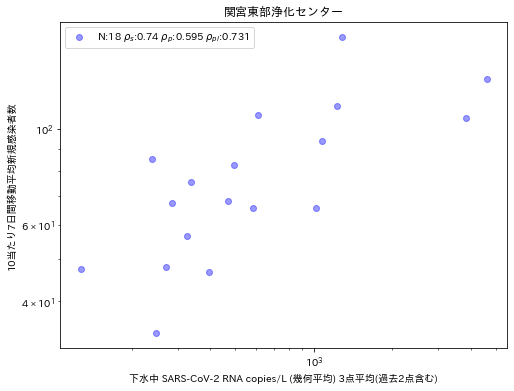

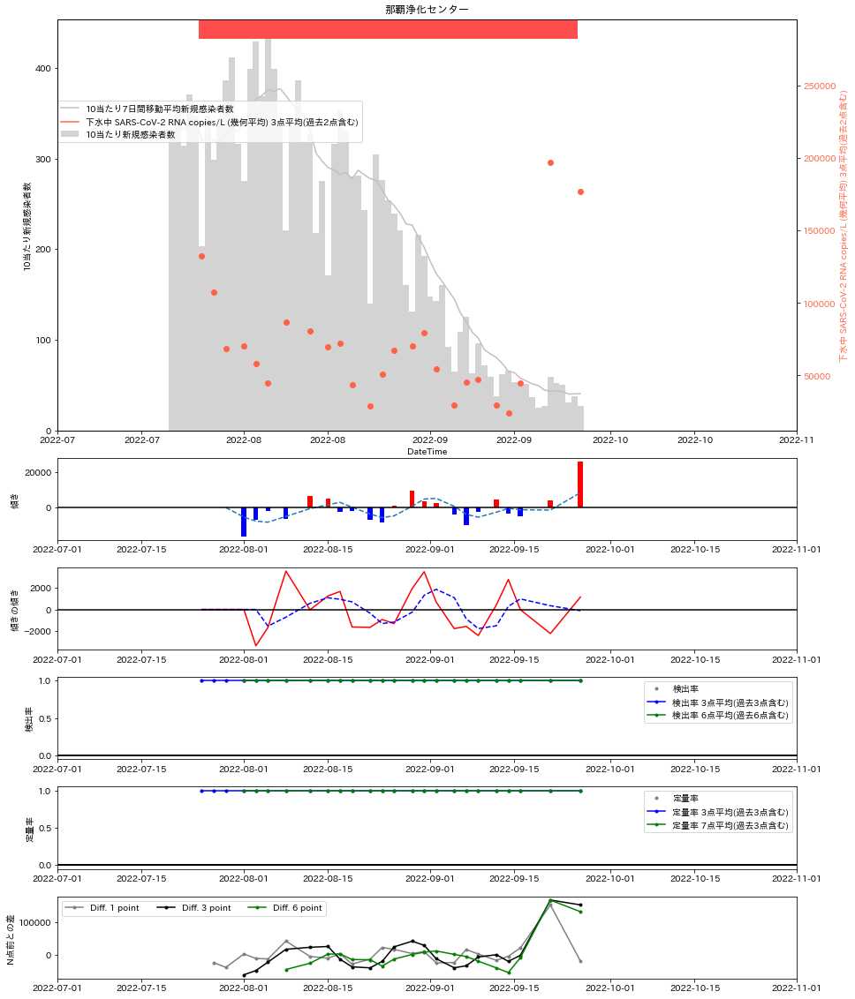

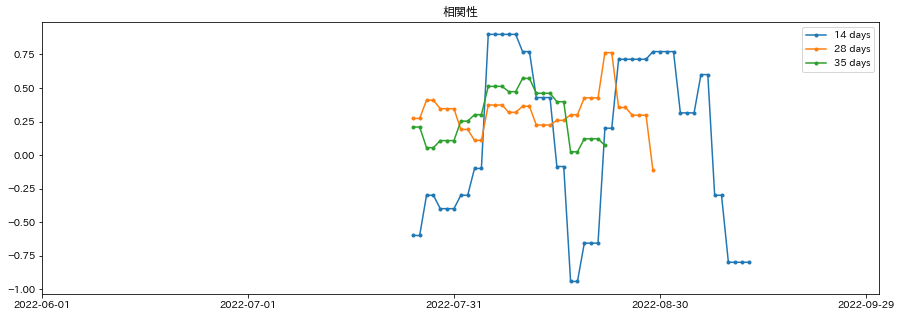

2022-07-22 2099-01-01 <class 'datetime.date'>
69 69
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


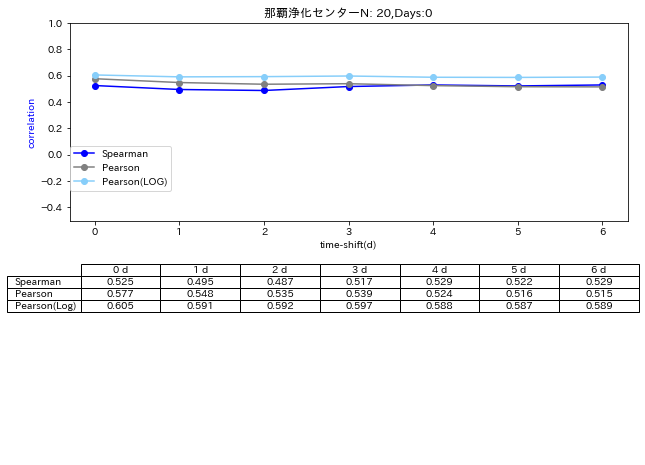

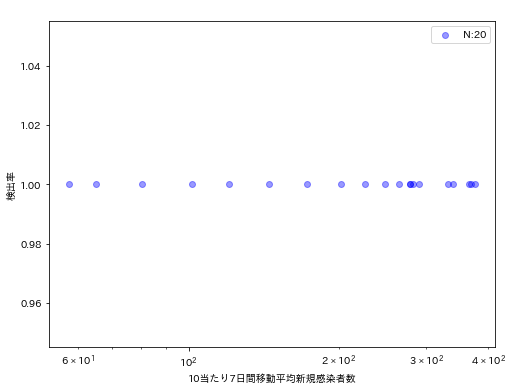

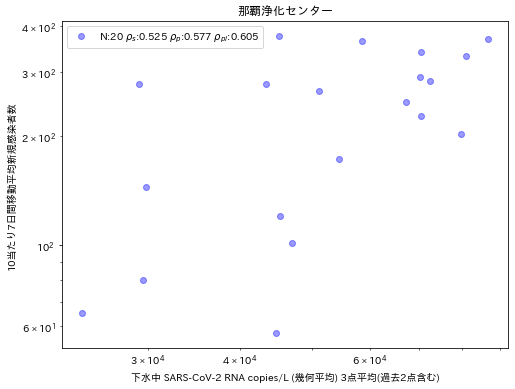

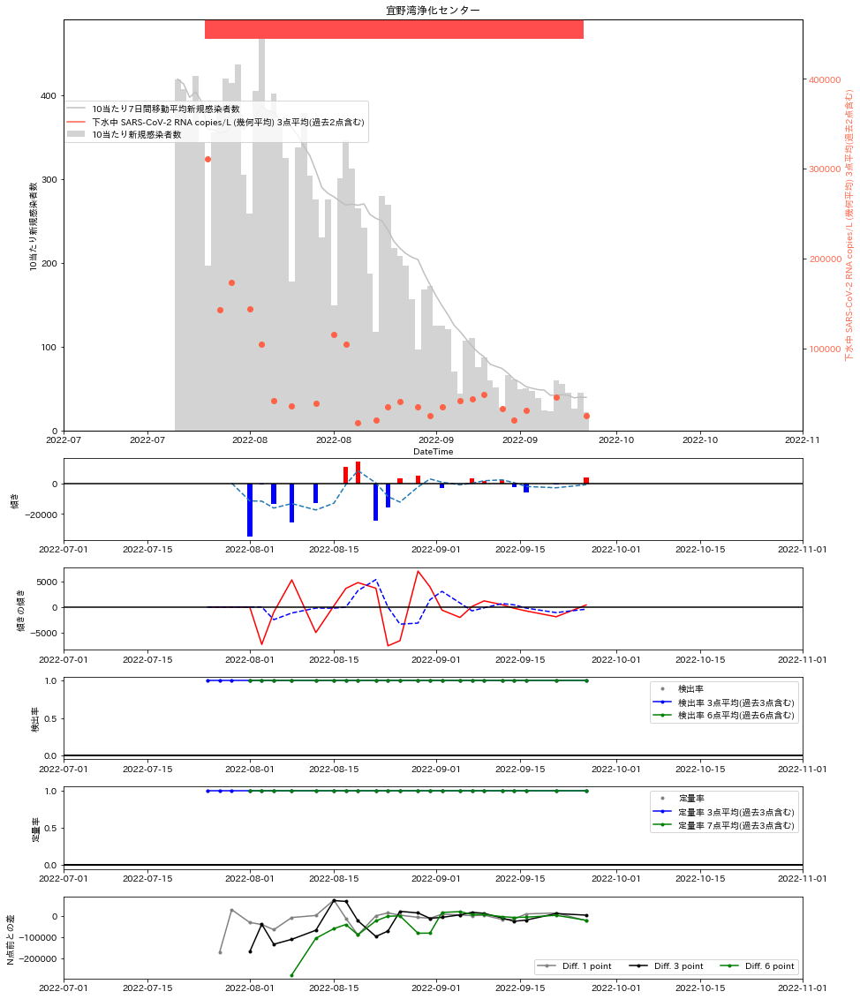

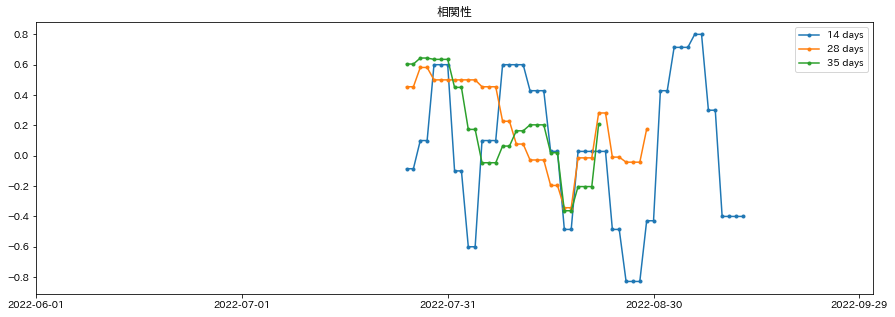

2022-07-22 2099-01-01 <class 'datetime.date'>
69 69
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


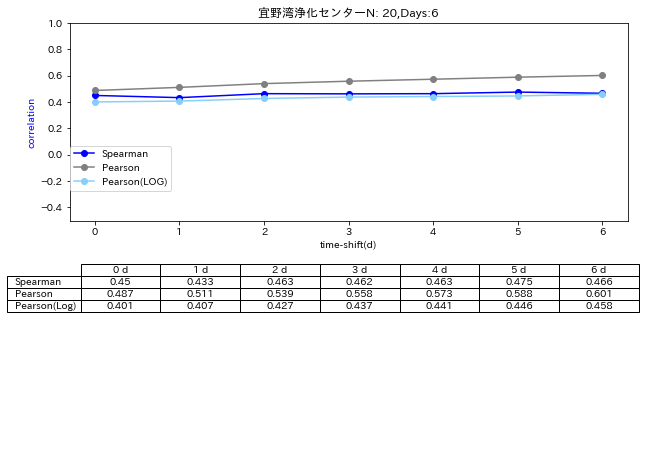

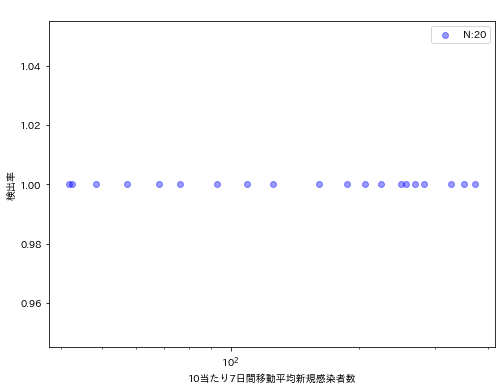

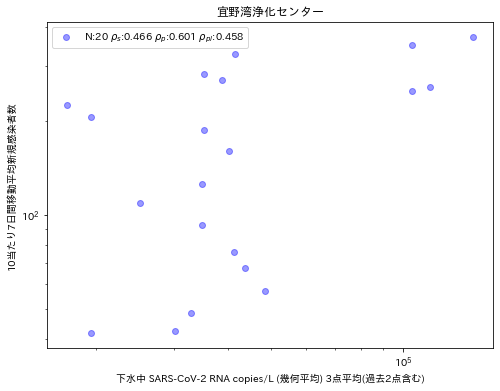

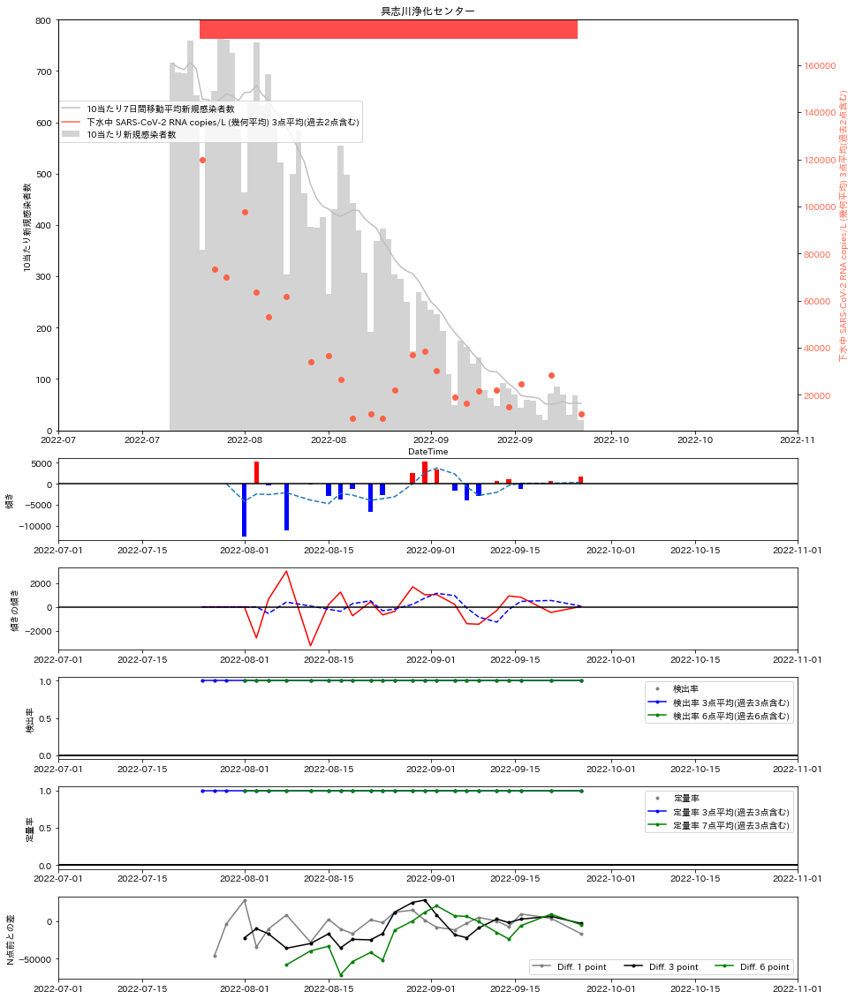

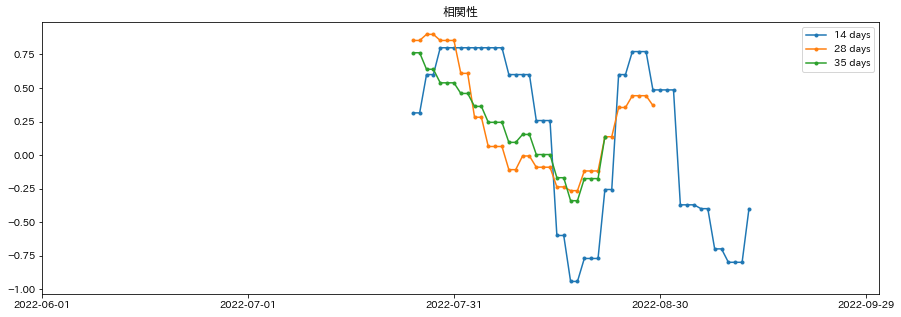

2022-07-22 2099-01-01 <class 'datetime.date'>
69 69
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


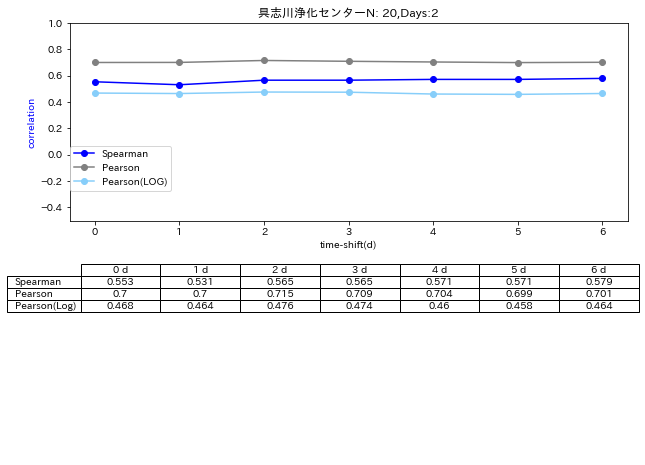

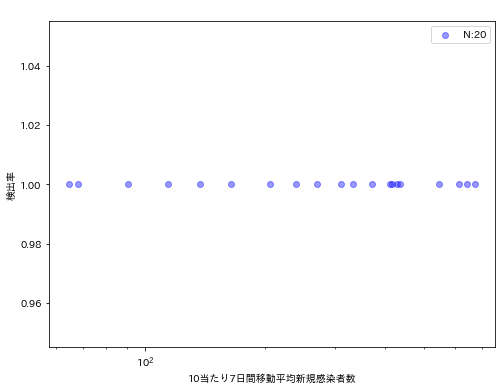

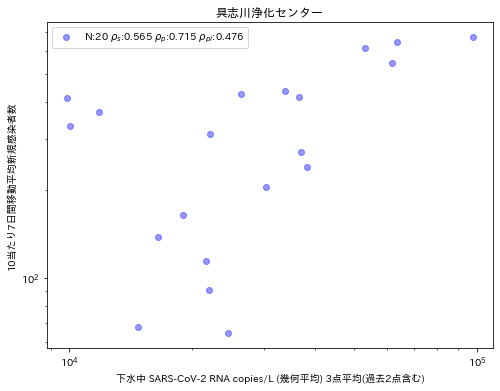

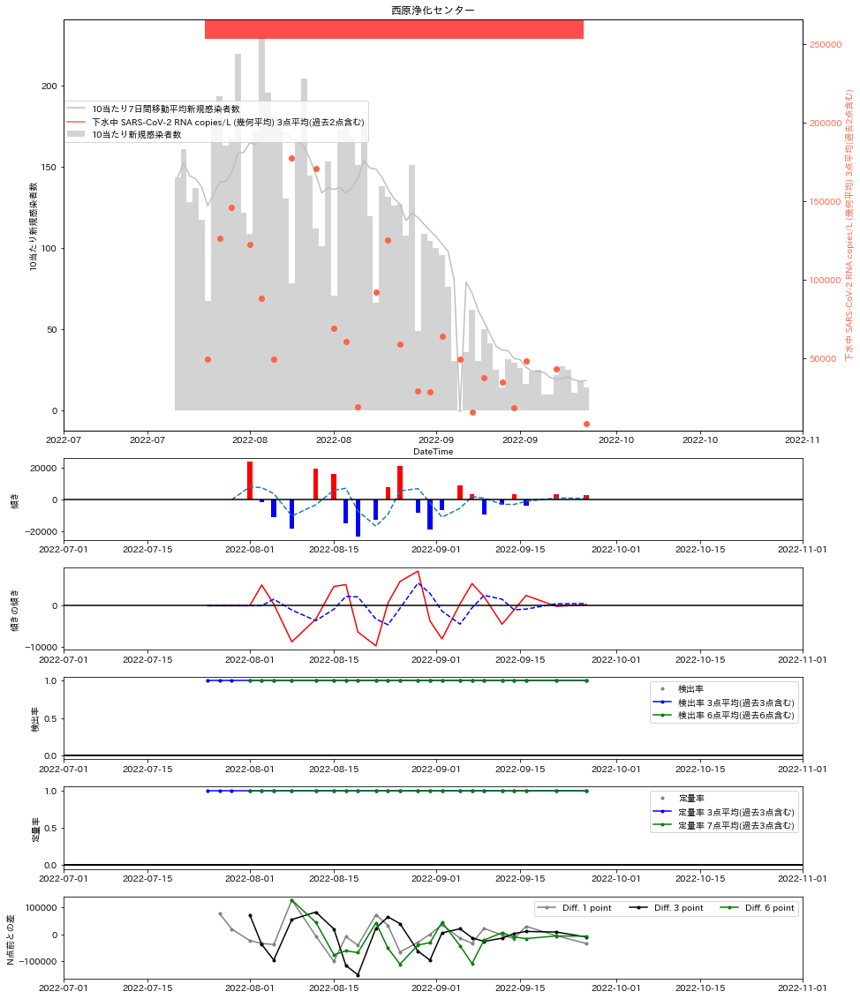

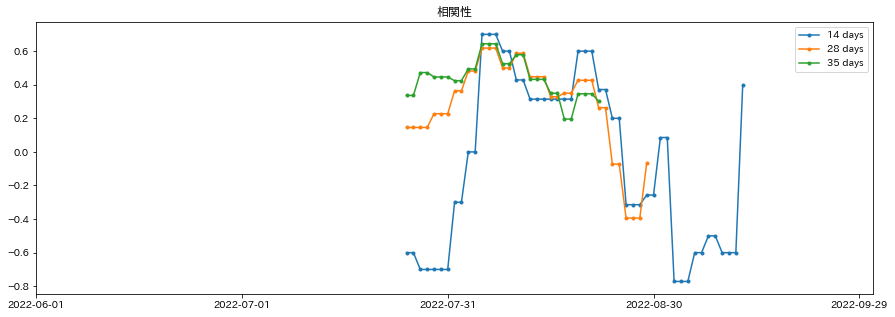

2022-07-22 2099-01-01 <class 'datetime.date'>
81 81
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


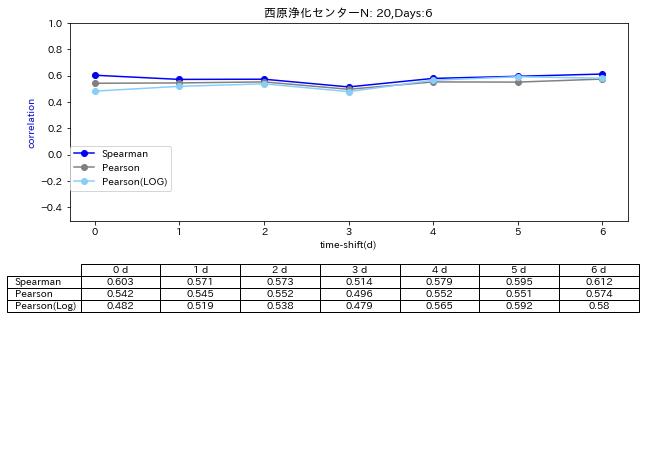

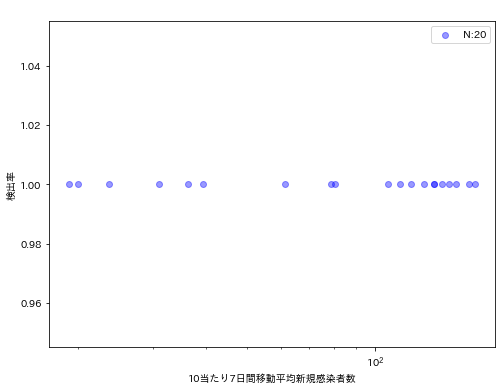

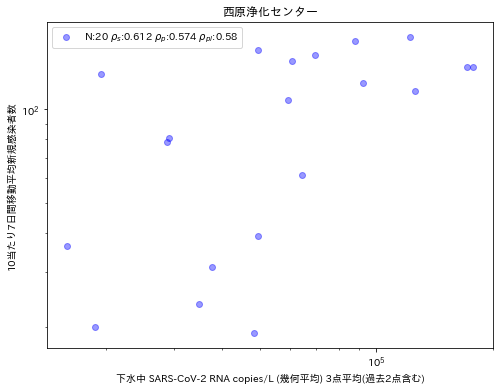

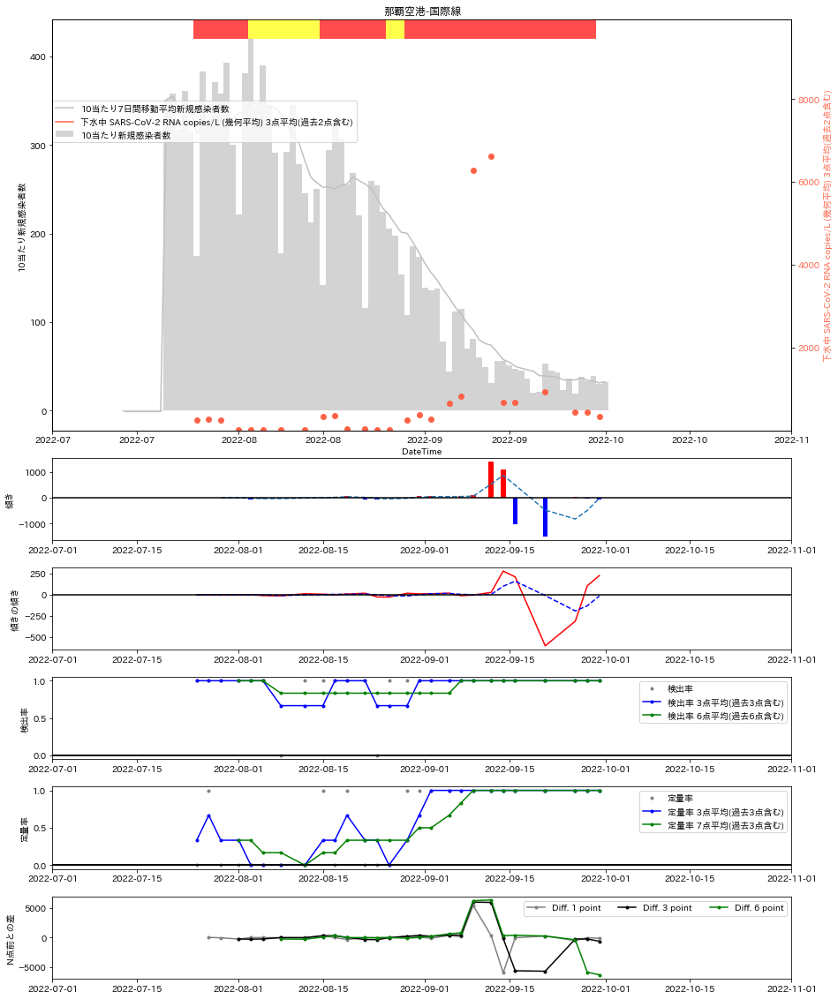

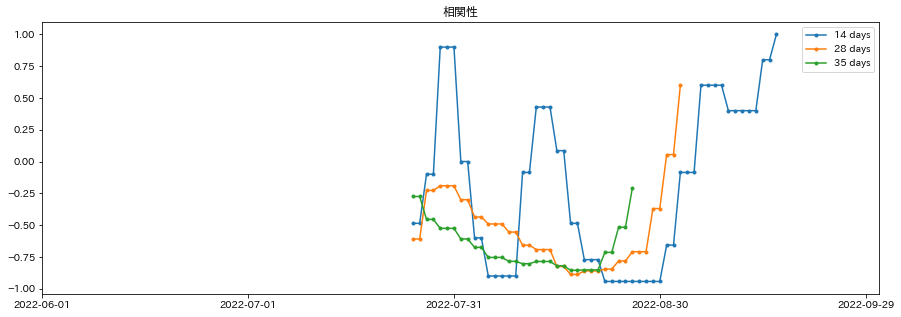

2022-07-22 2099-01-01 <class 'datetime.date'>
81 81
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


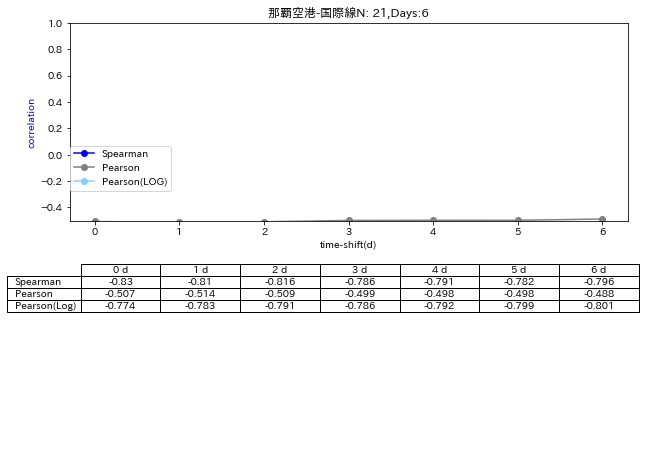

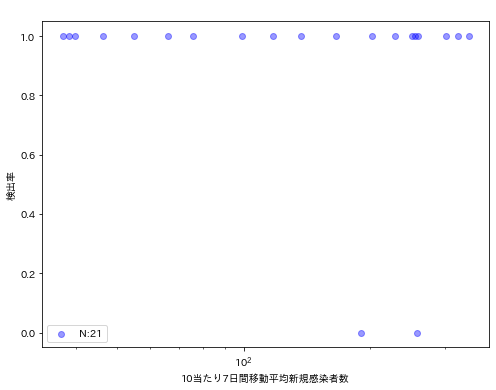

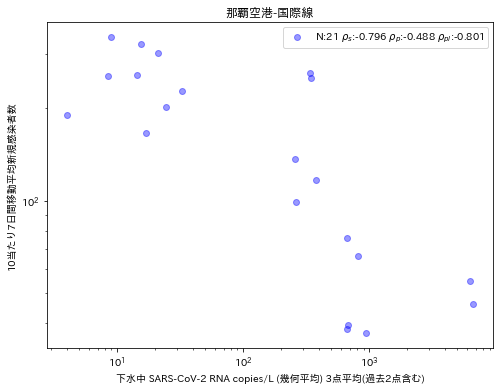

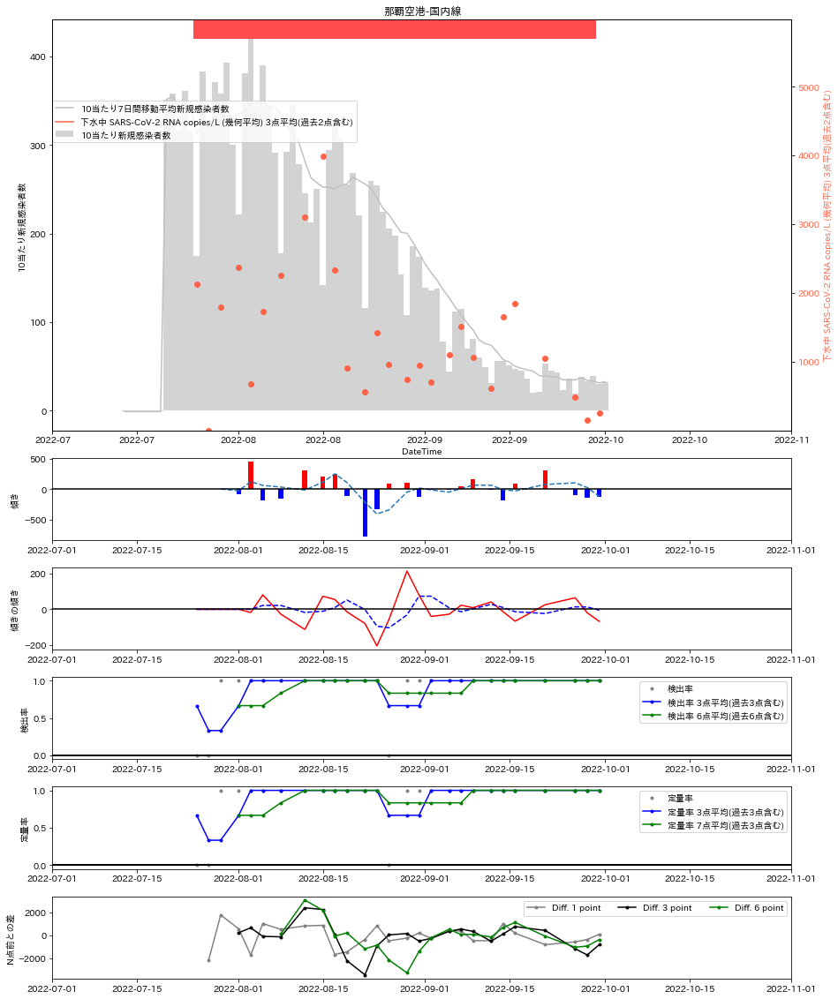

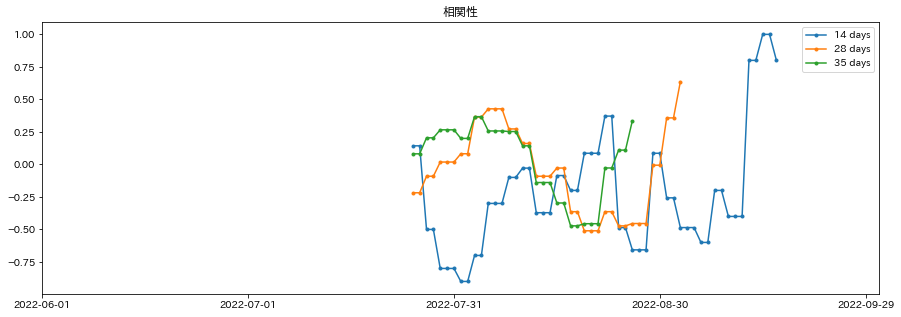

2022-07-22 2099-01-01 <class 'datetime.date'>
70 70
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


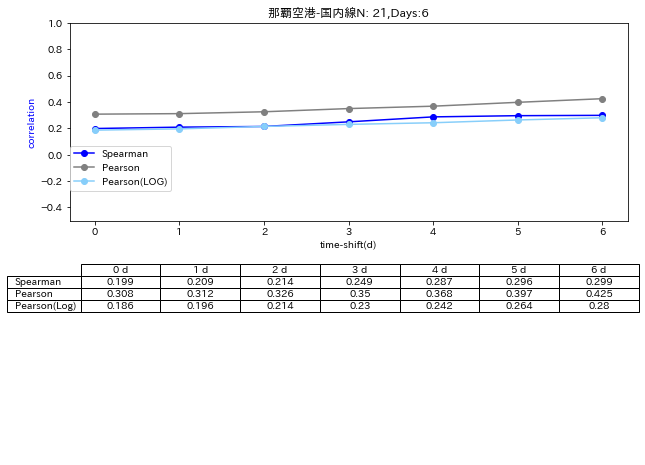

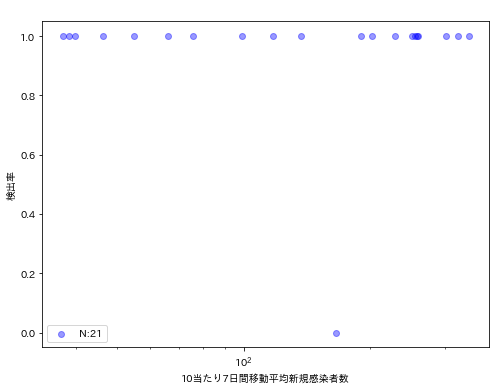

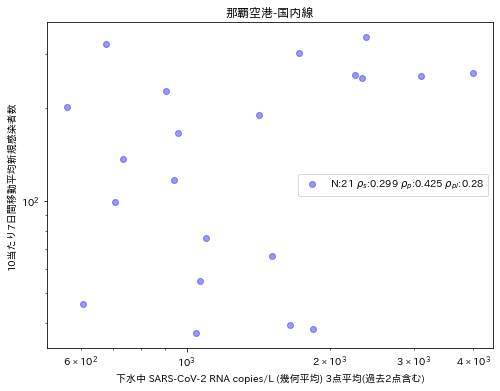

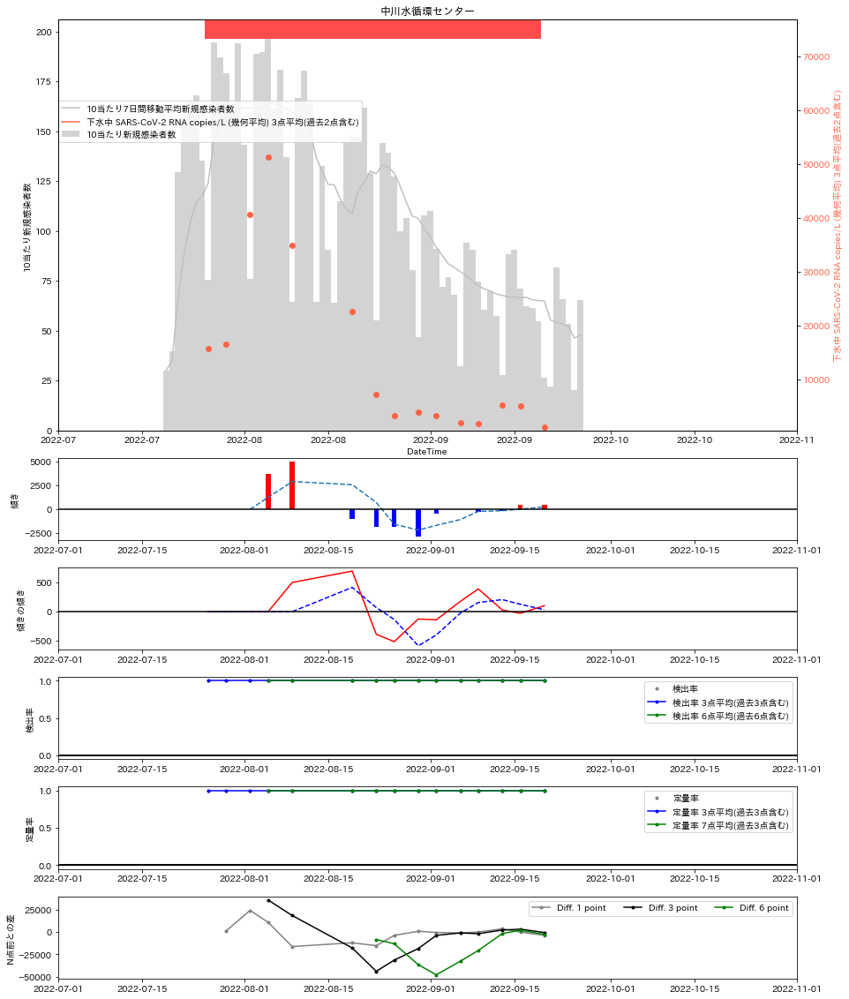

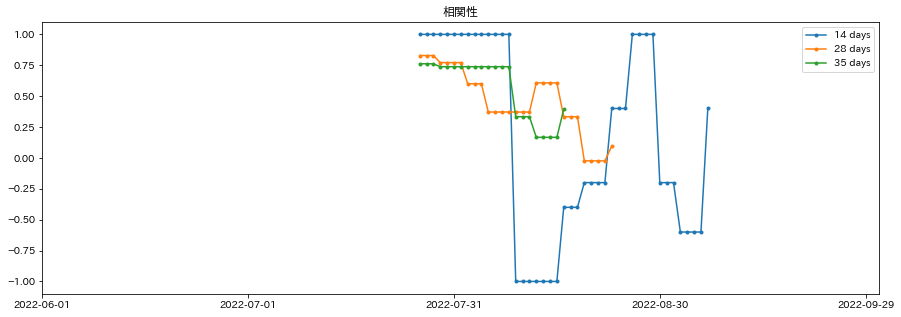

2022-07-22 2099-01-01 <class 'datetime.date'>
70 70
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


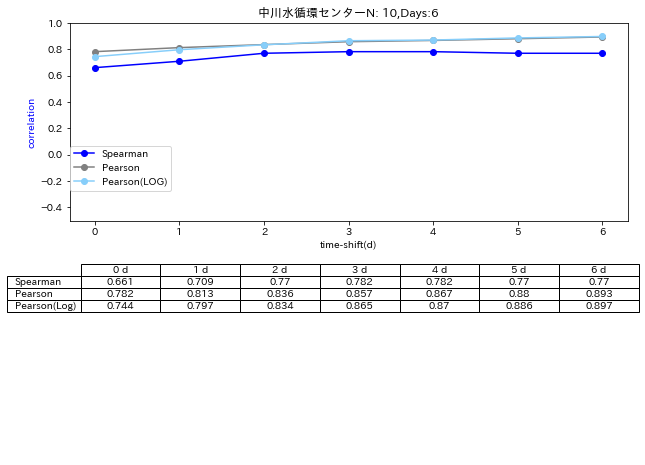

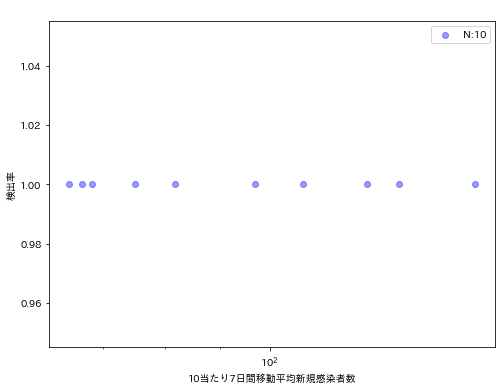

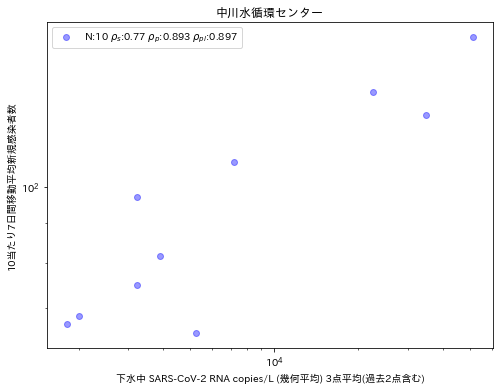

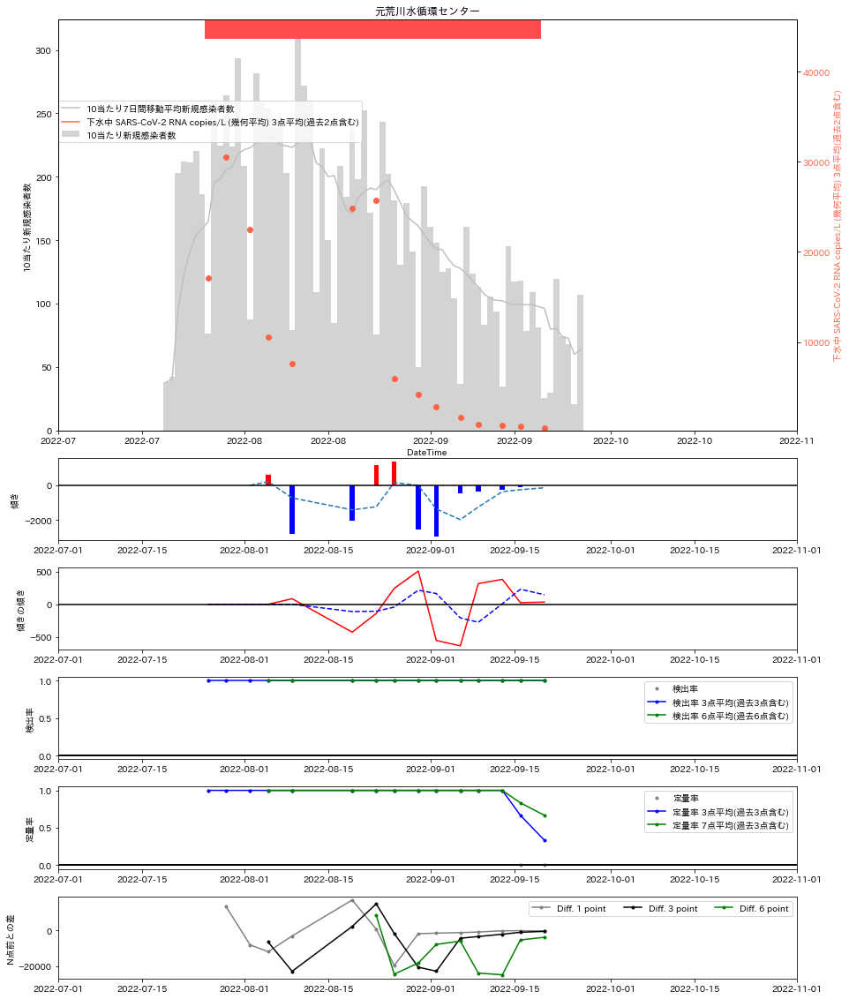

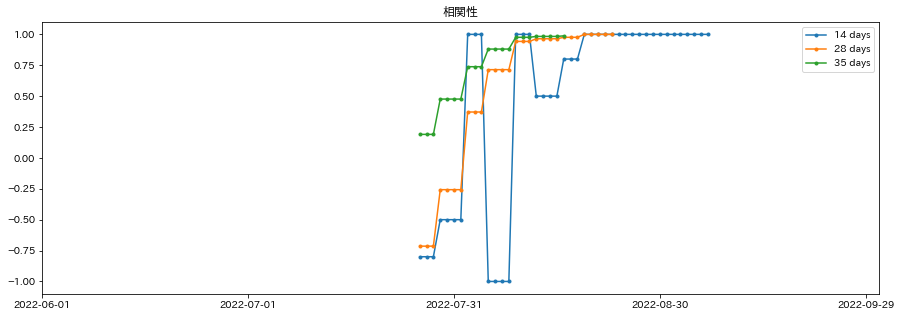

2022-07-22 2099-01-01 <class 'datetime.date'>
71 71
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


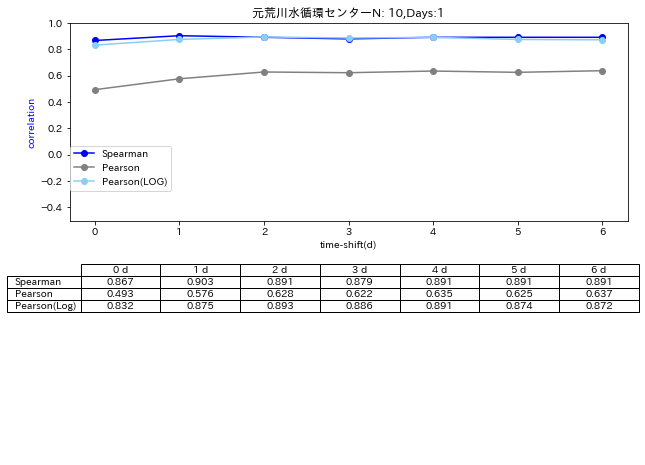

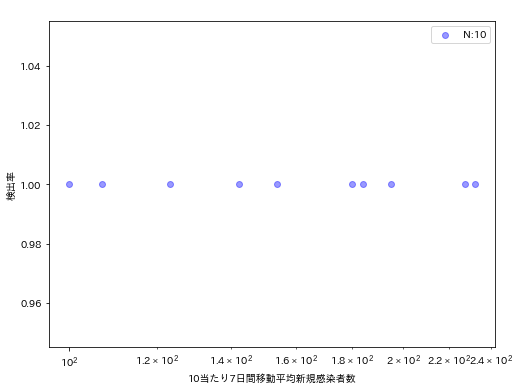

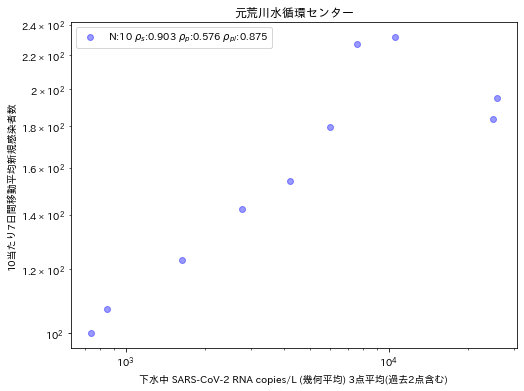

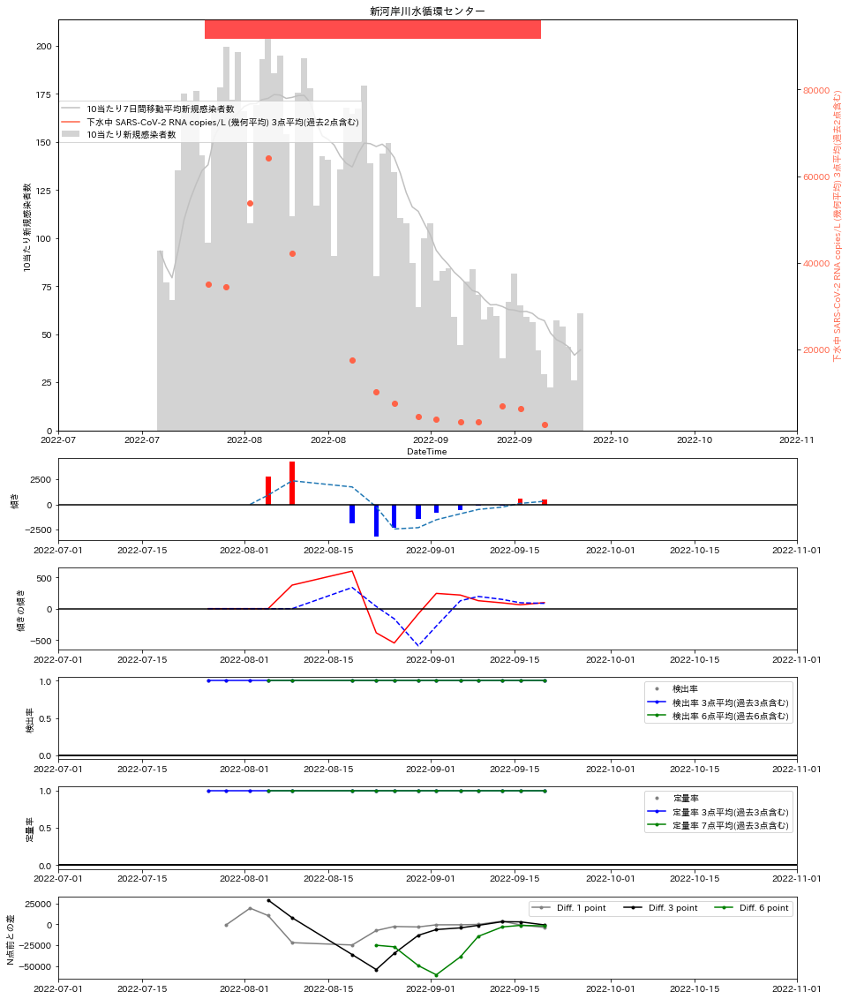

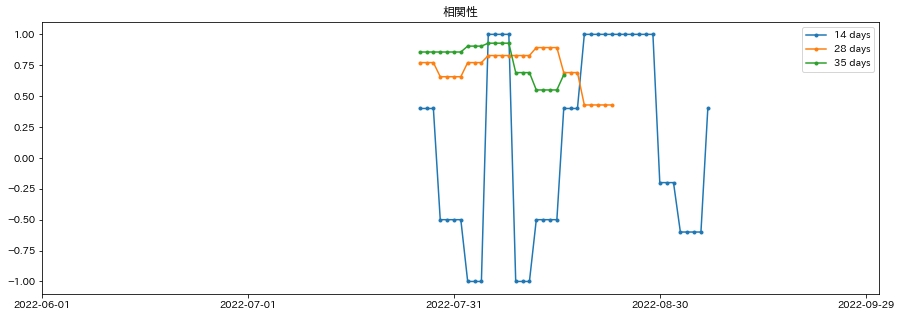

2022-07-22 2099-01-01 <class 'datetime.date'>
70 70
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


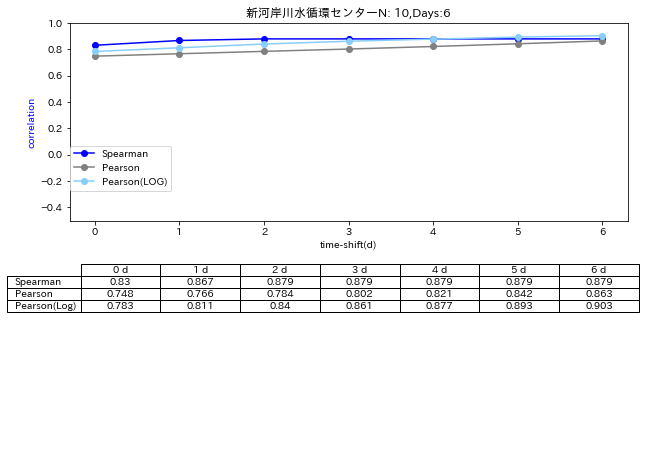

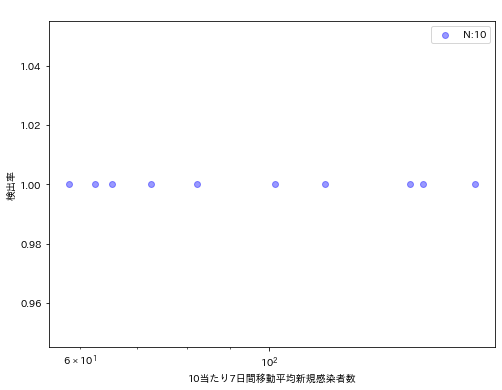

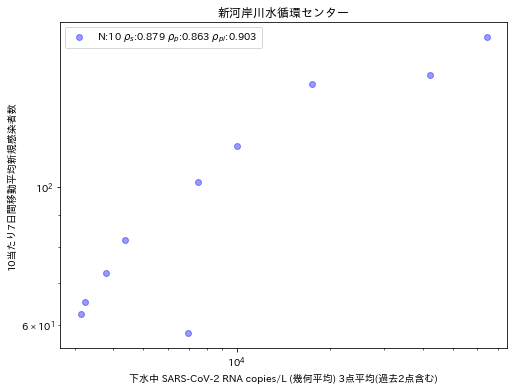

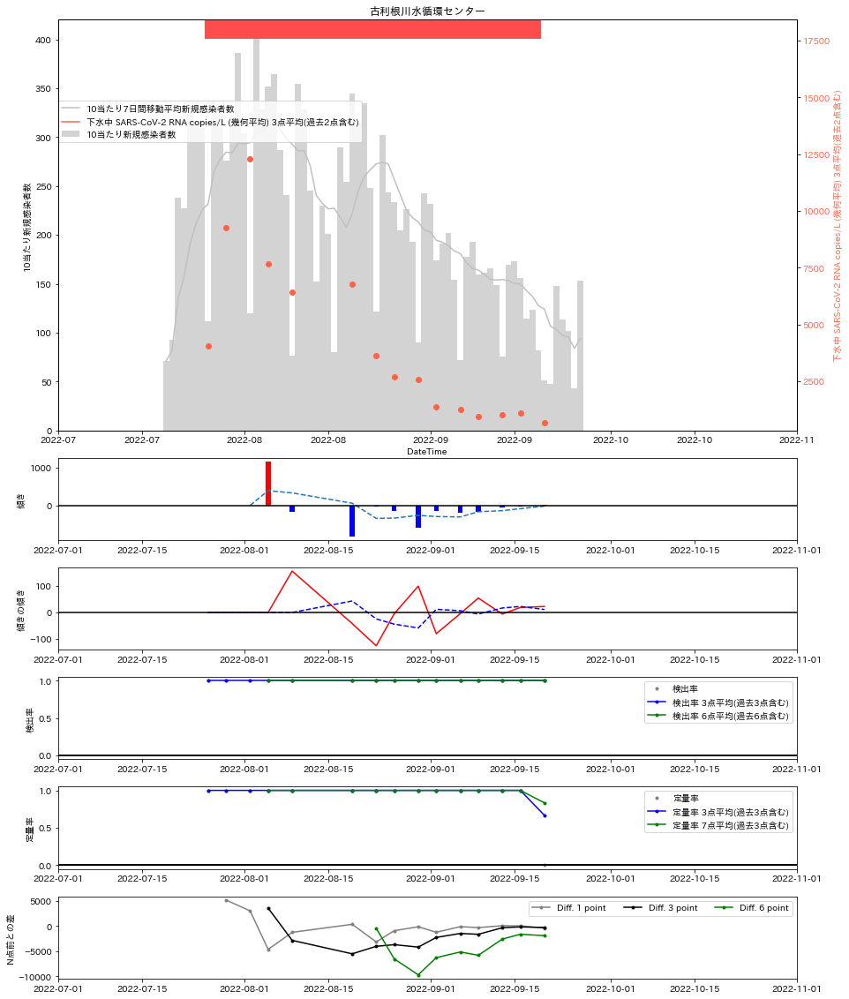

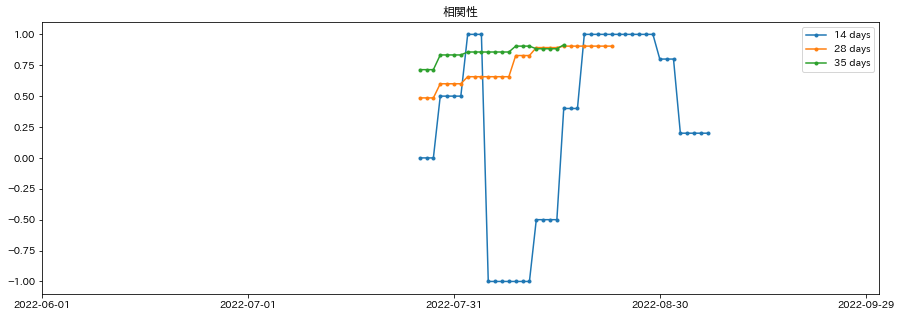

2022-07-22 2099-01-01 <class 'datetime.date'>
70 70
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


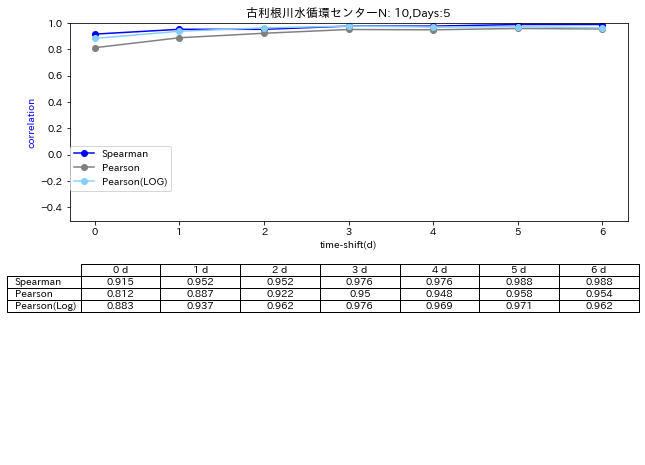

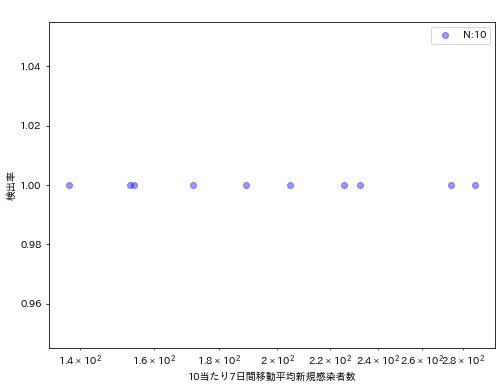

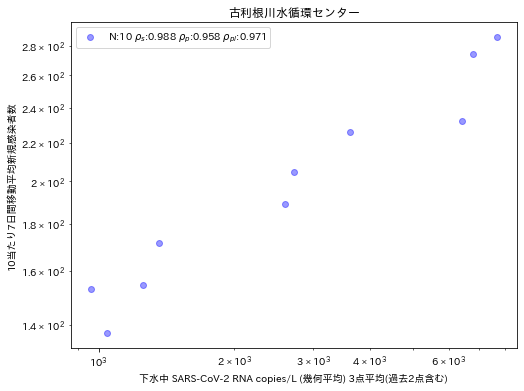

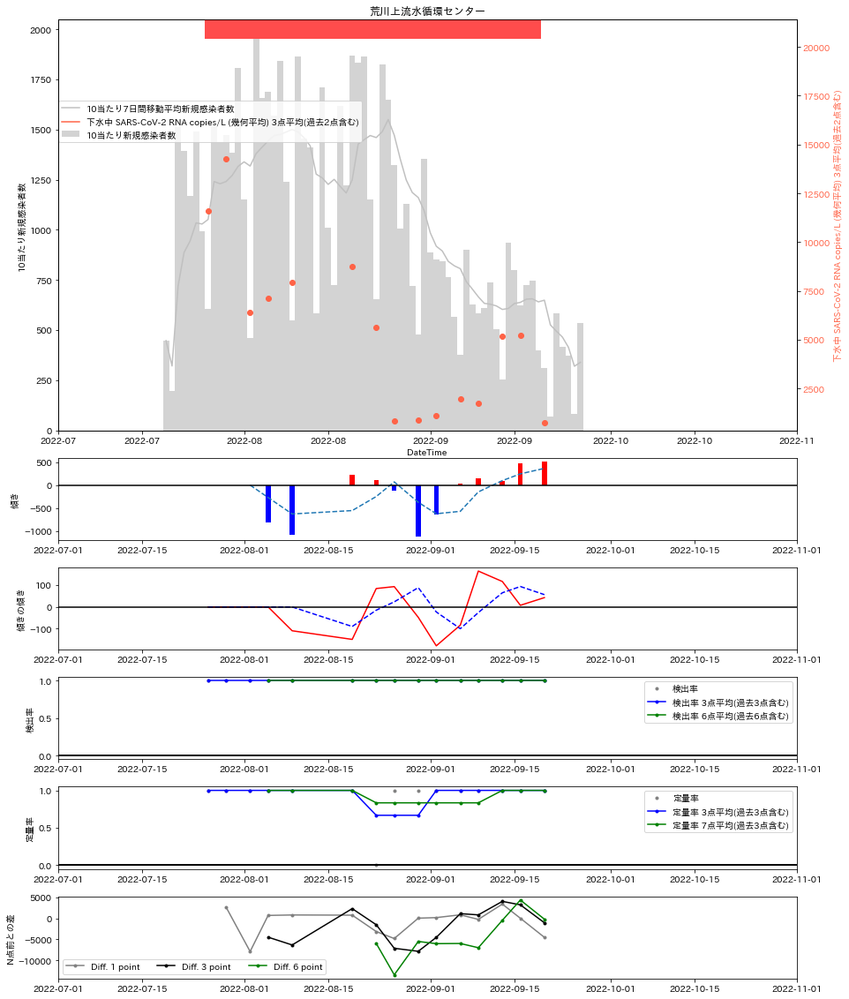

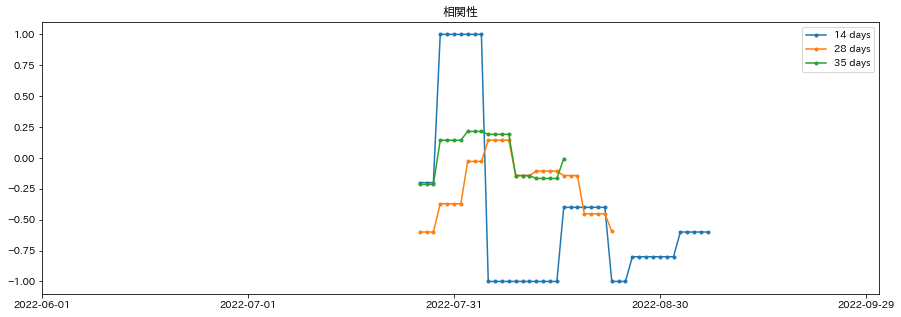

2022-07-22 2099-01-01 <class 'datetime.date'>
70 70
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


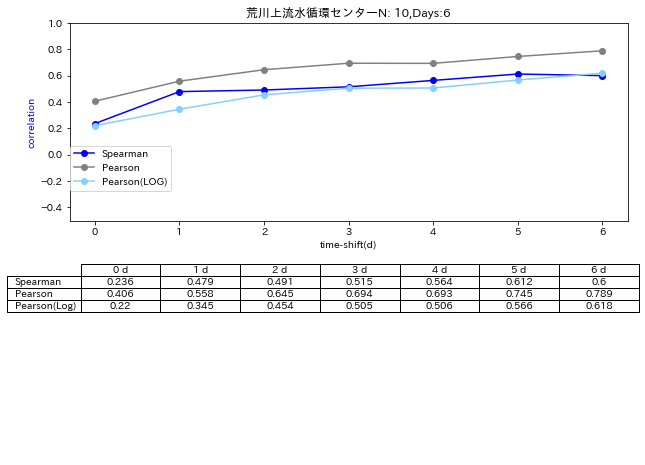

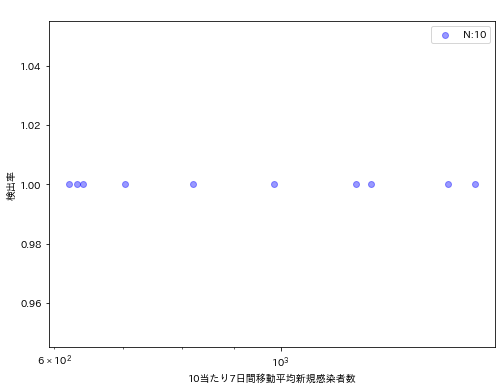

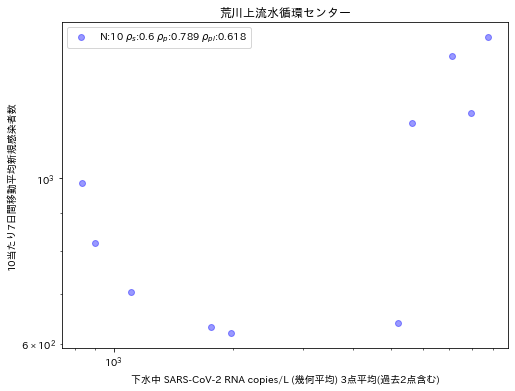

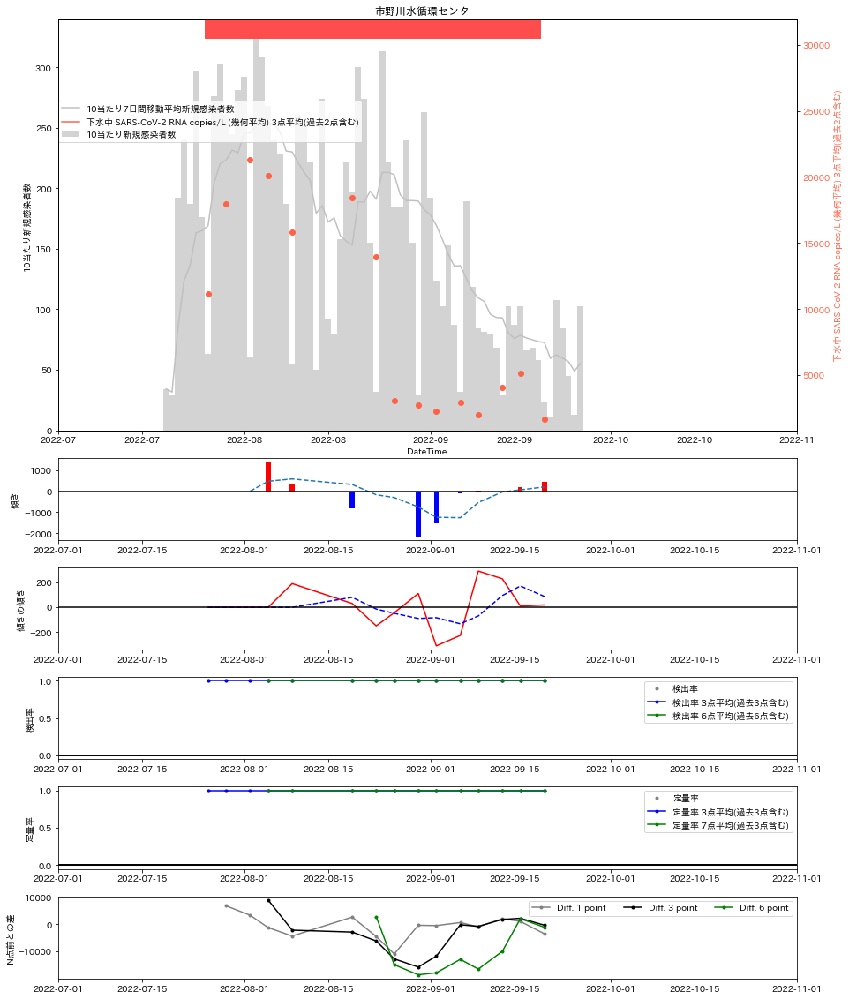

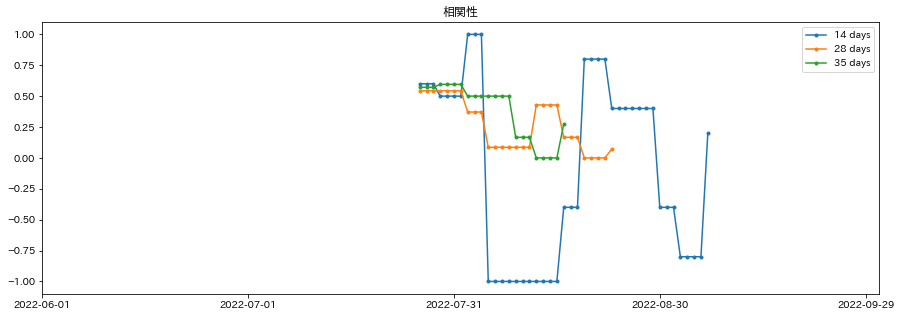

2022-07-22 2099-01-01 <class 'datetime.date'>
70 70
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


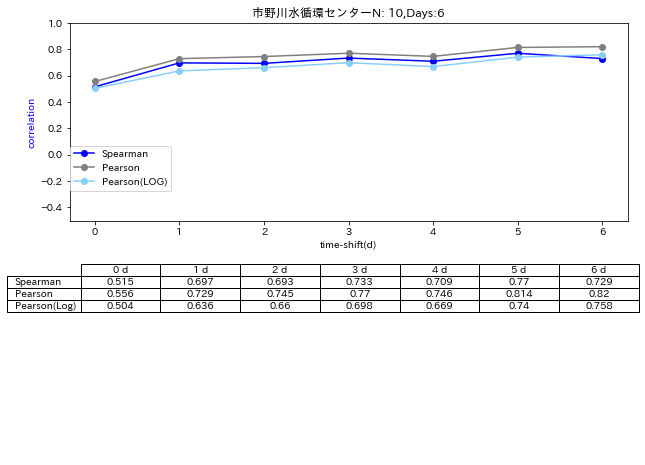

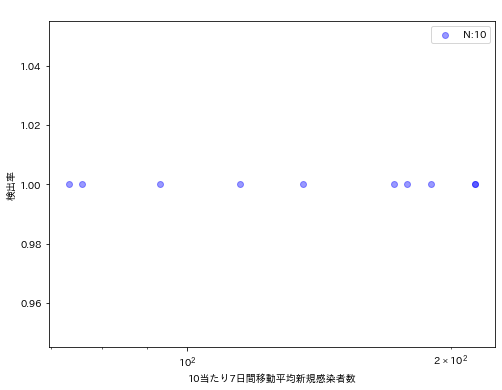

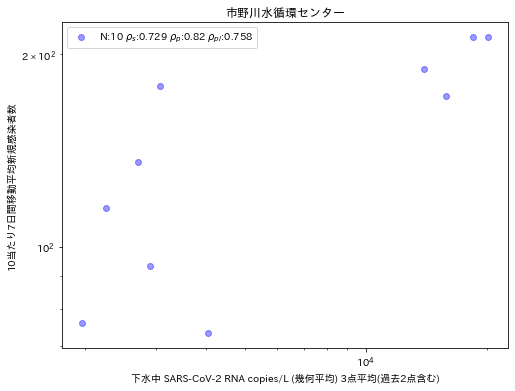

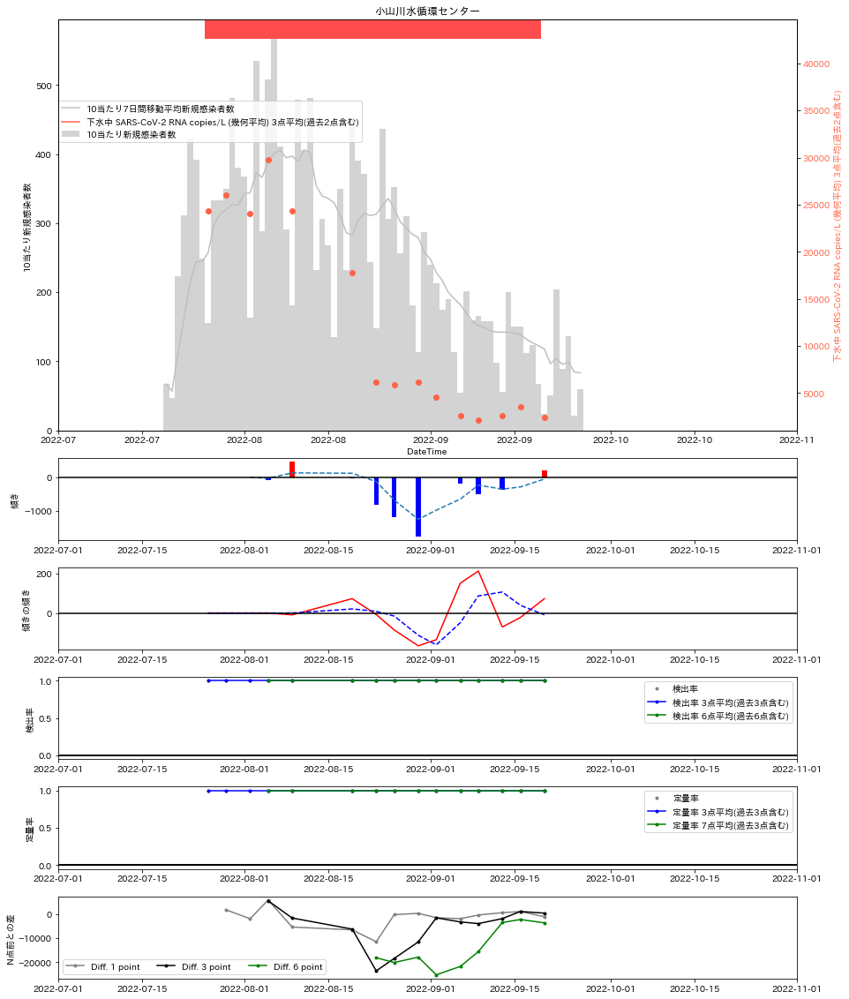

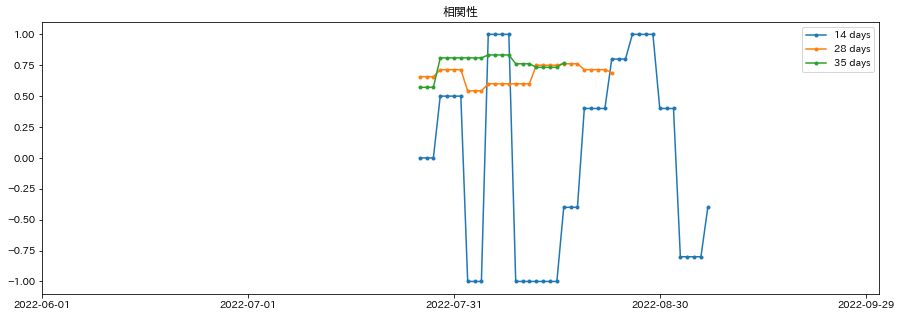

2022-07-22 2099-01-01 <class 'datetime.date'>
70 70
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


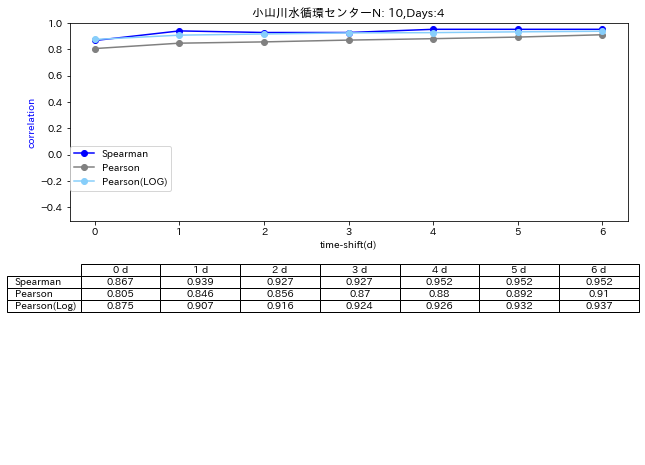

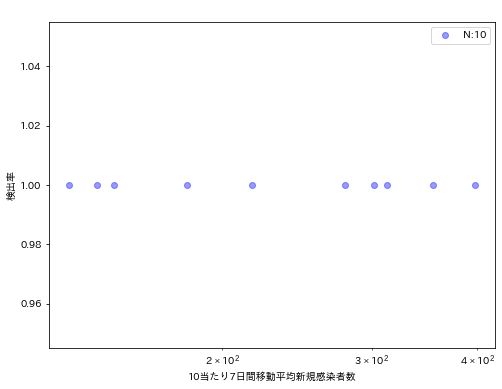

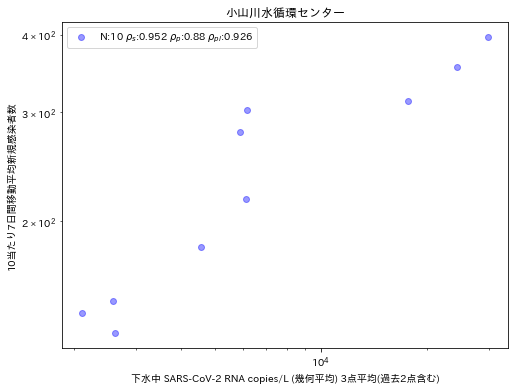

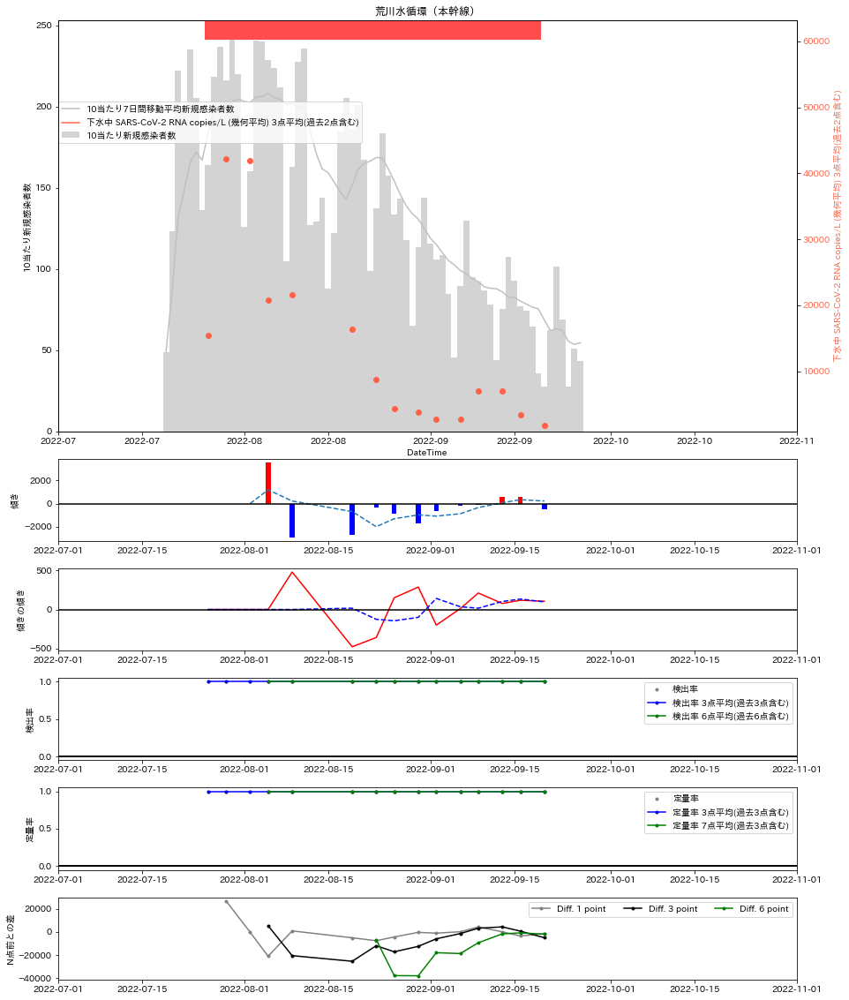

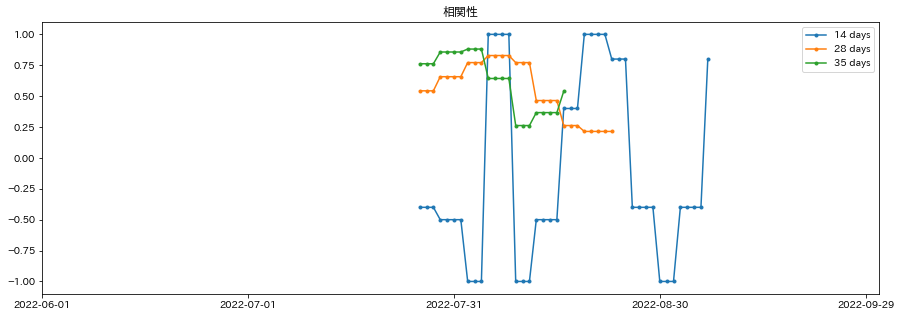

2022-07-22 2099-01-01 <class 'datetime.date'>
70 70
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


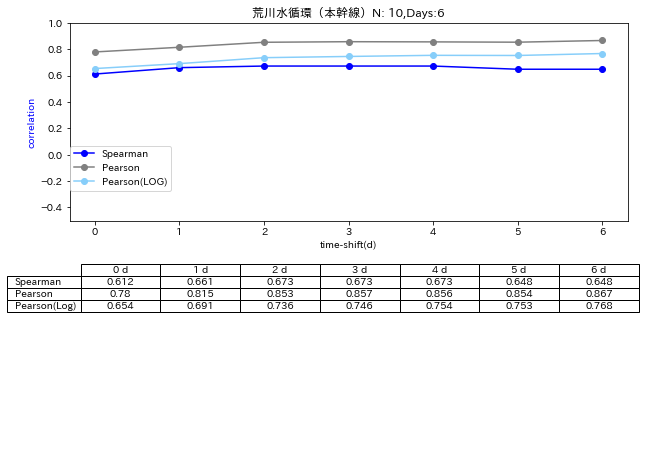

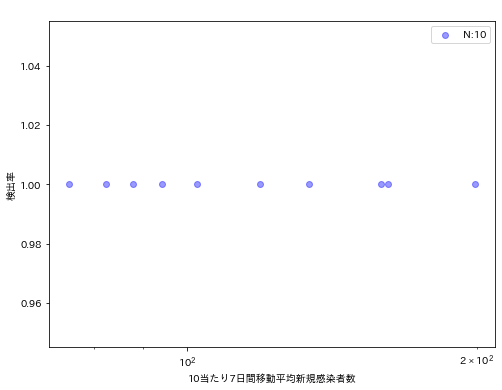

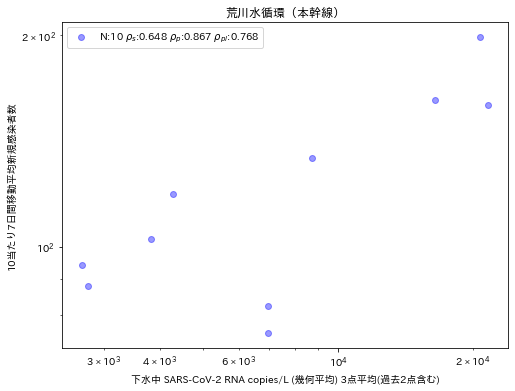

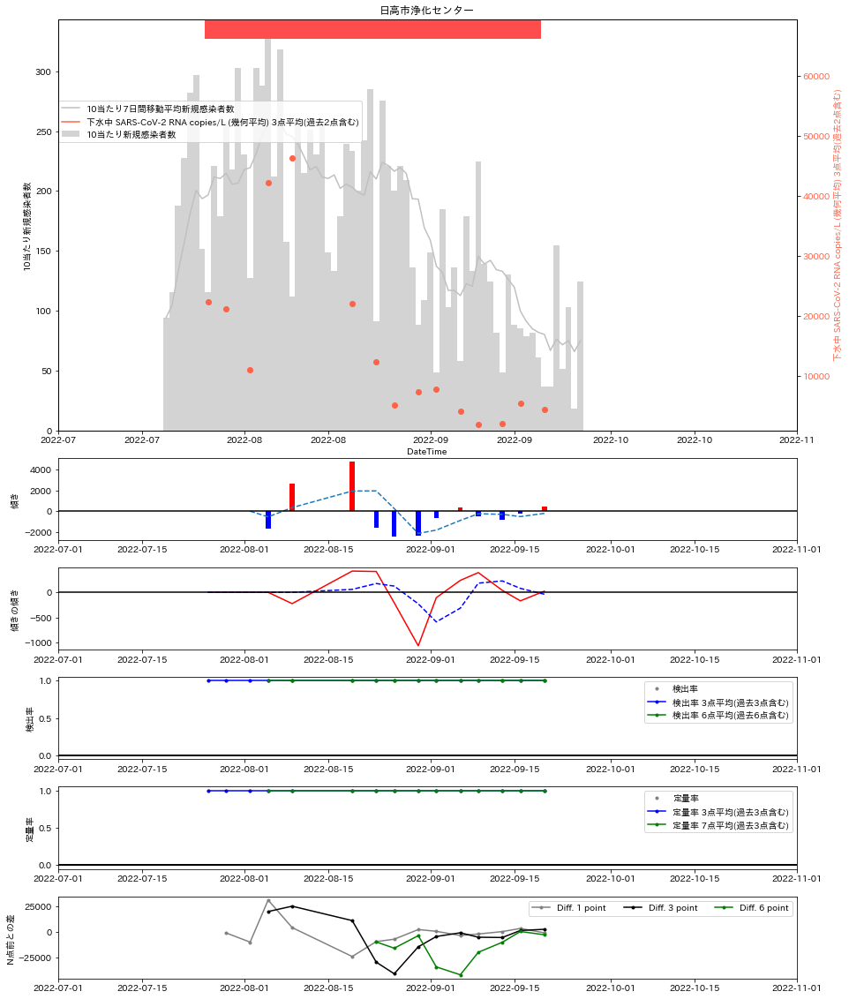

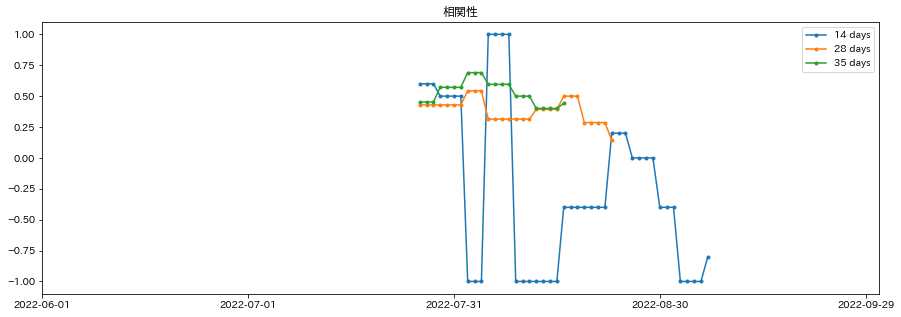

2022-07-22 2099-01-01 <class 'datetime.date'>
70 70
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


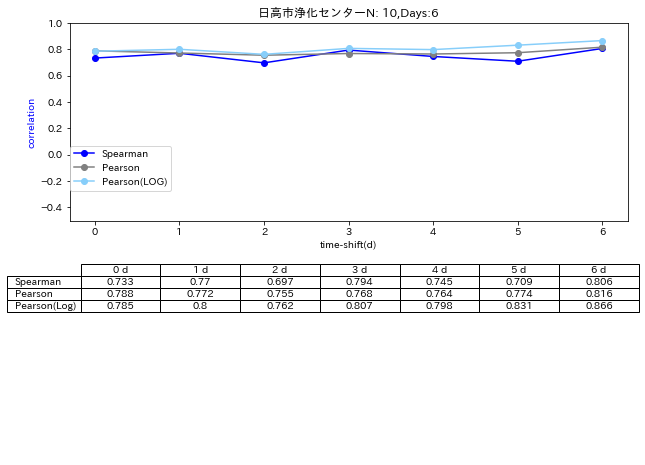

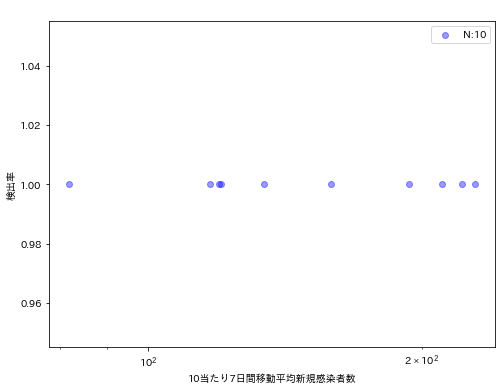

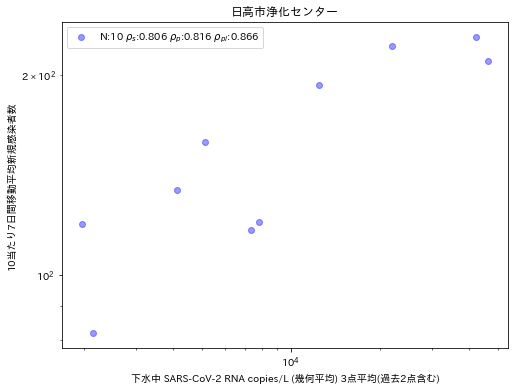

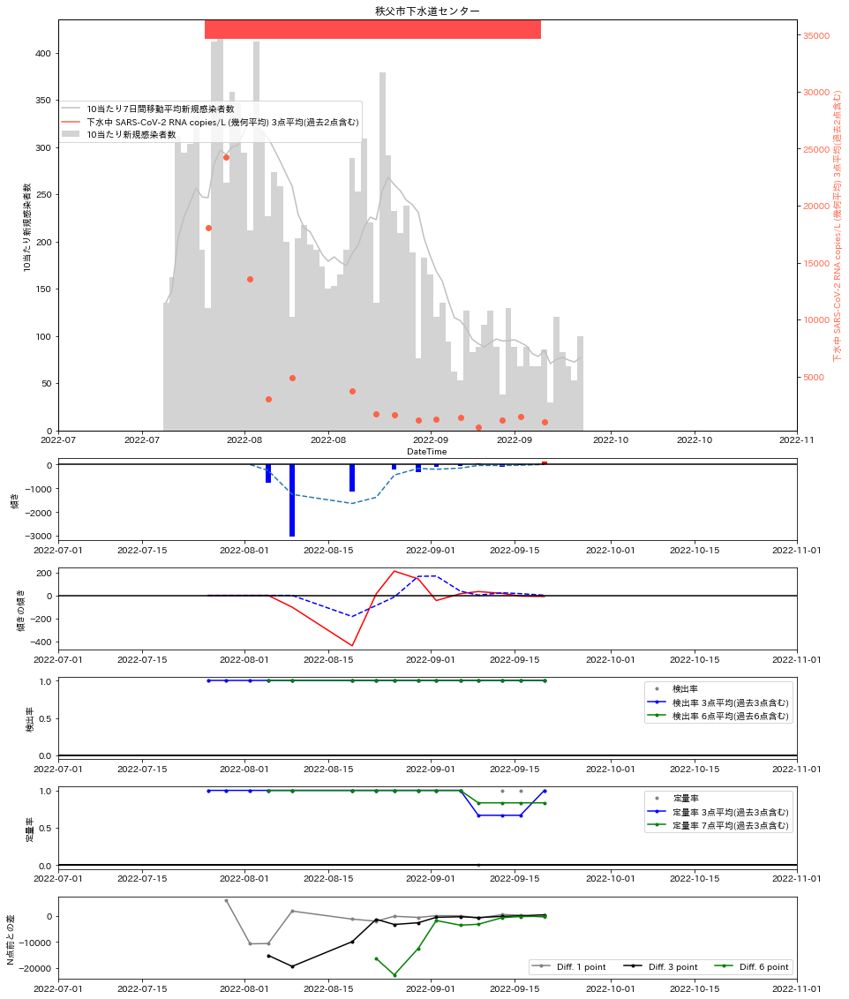

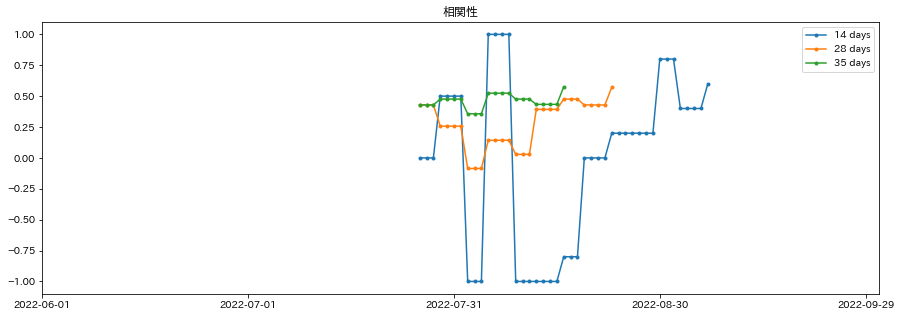

2022-07-22 2099-01-01 <class 'datetime.date'>
70 70
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


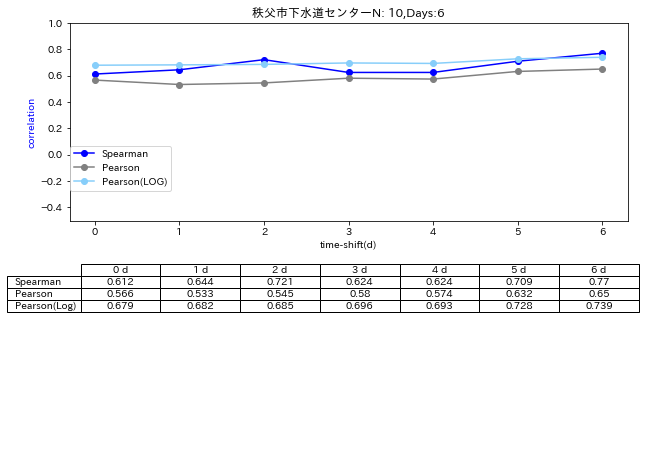

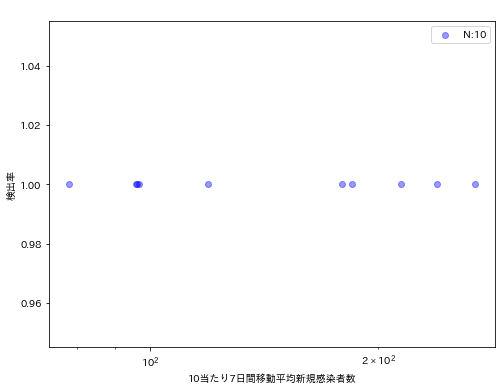

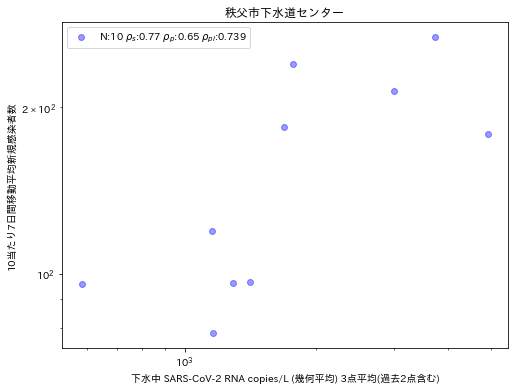

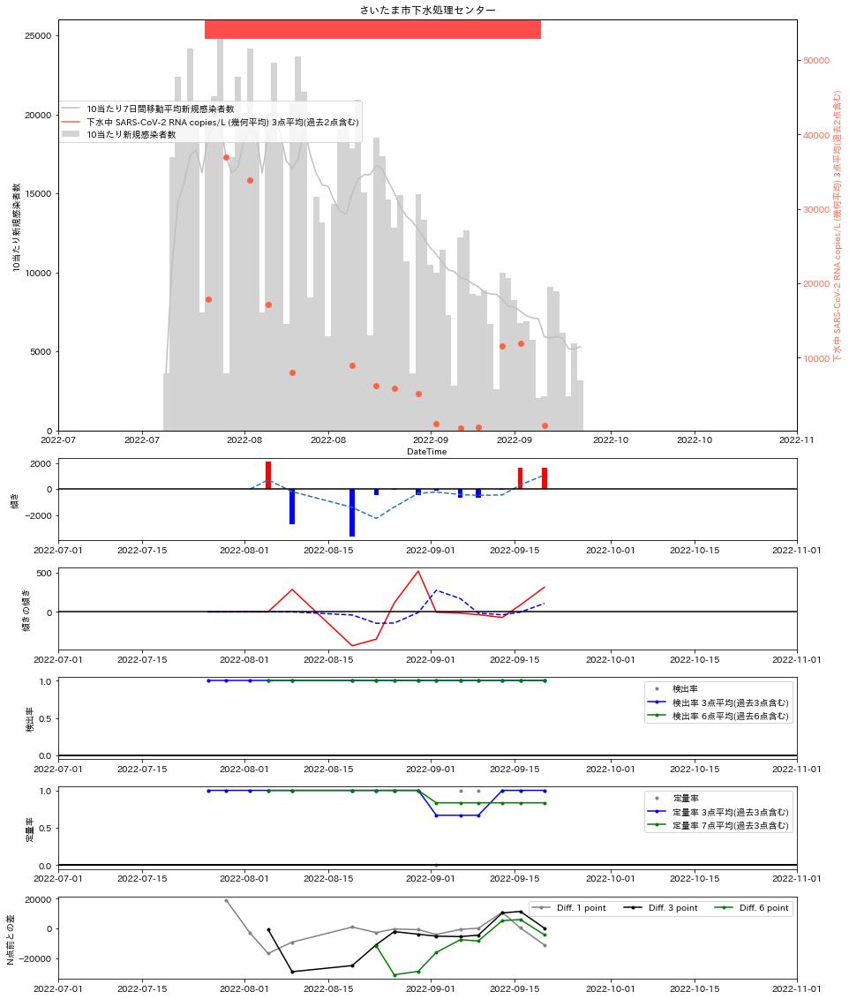

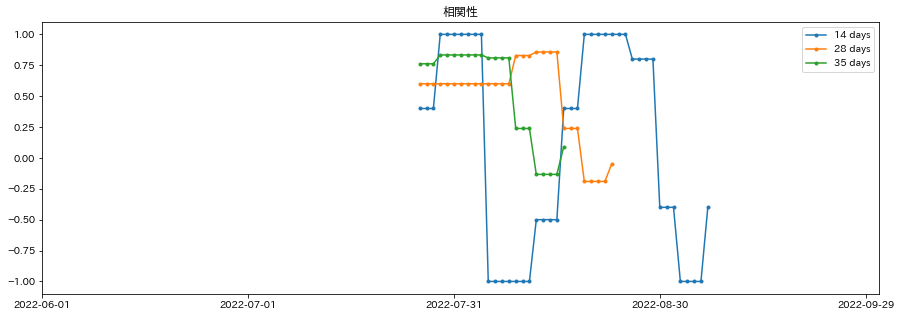

2022-07-22 2099-01-01 <class 'datetime.date'>
70 70
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


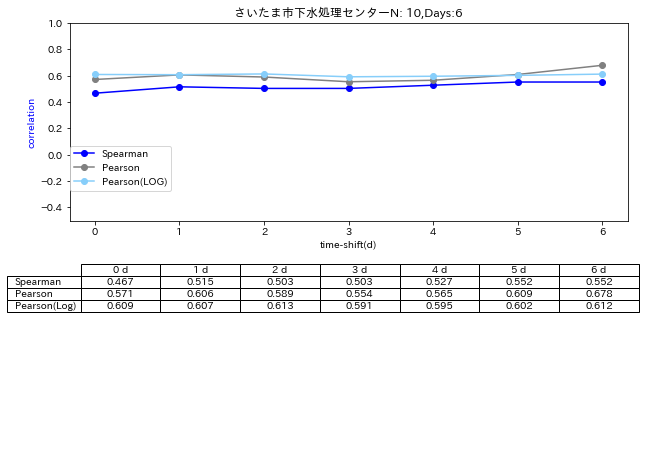

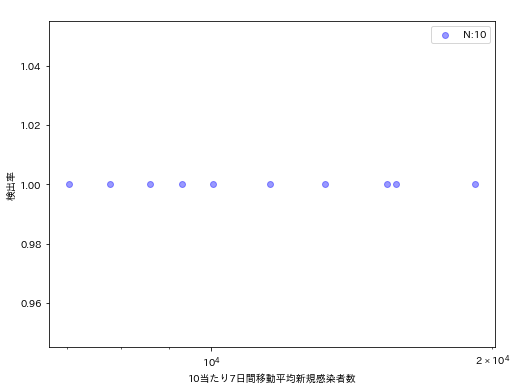

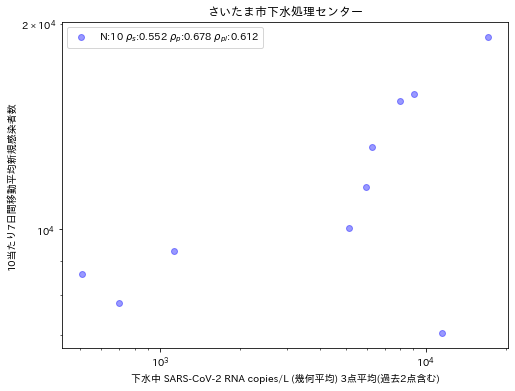

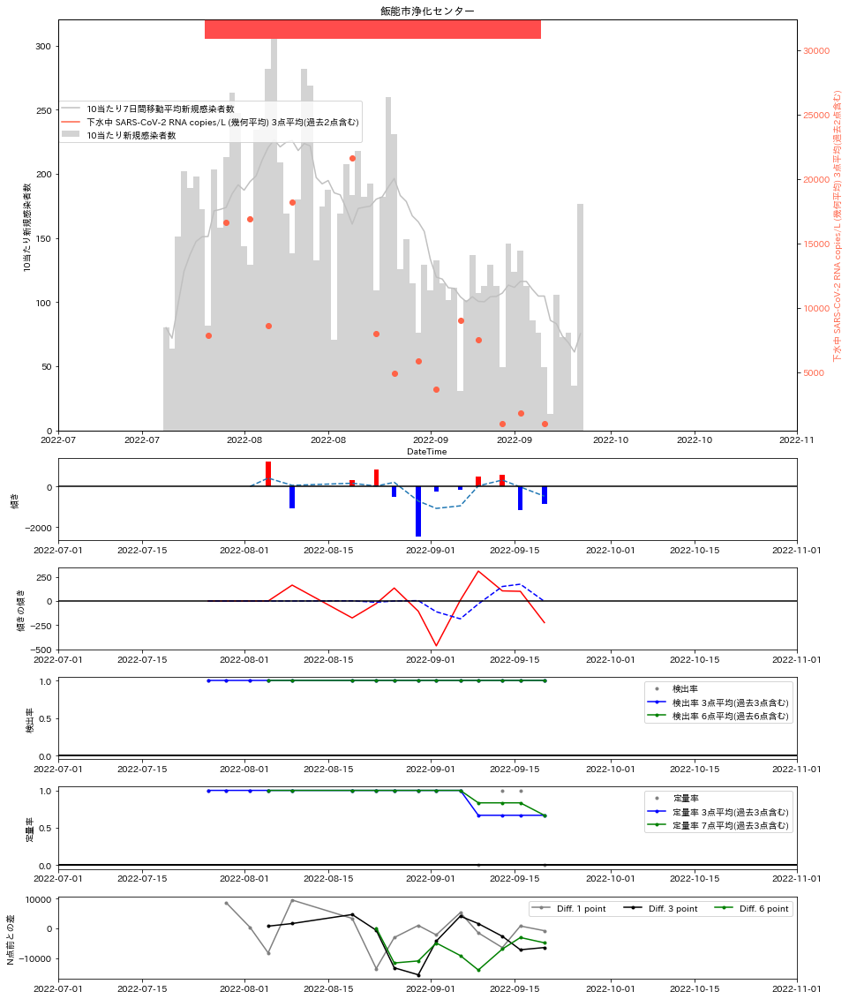

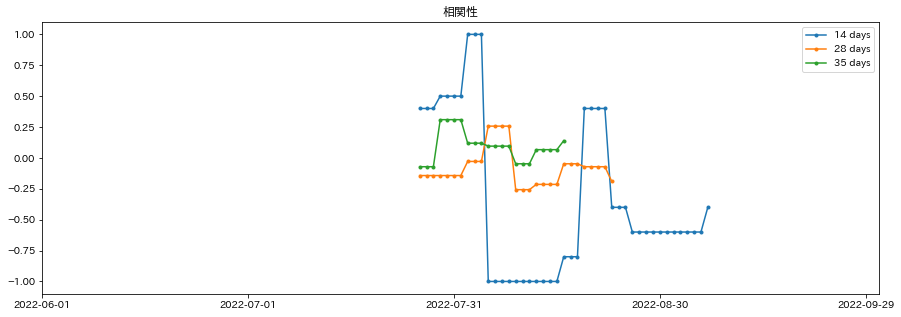

2022-07-25 2099-01-01 <class 'datetime.date'>
69 69
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


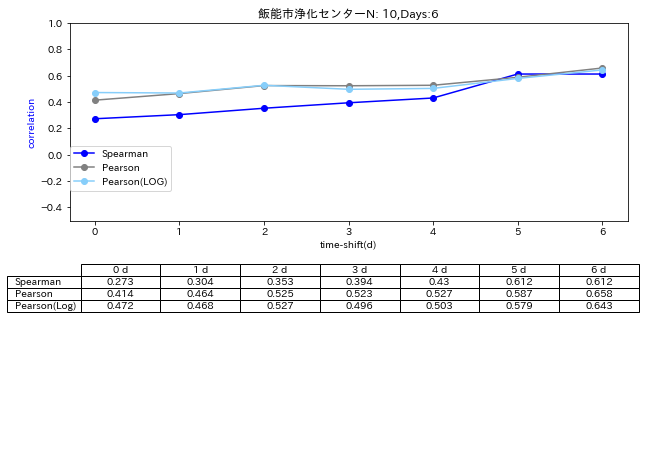

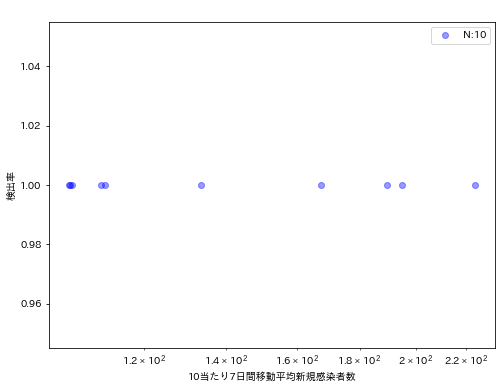

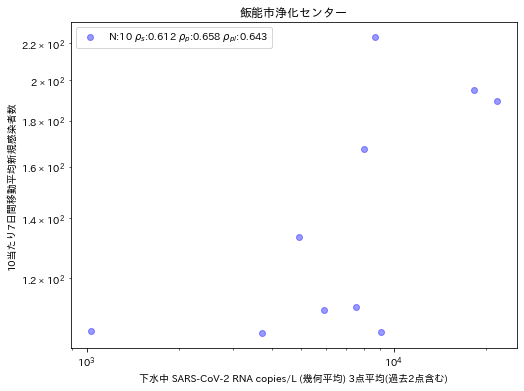

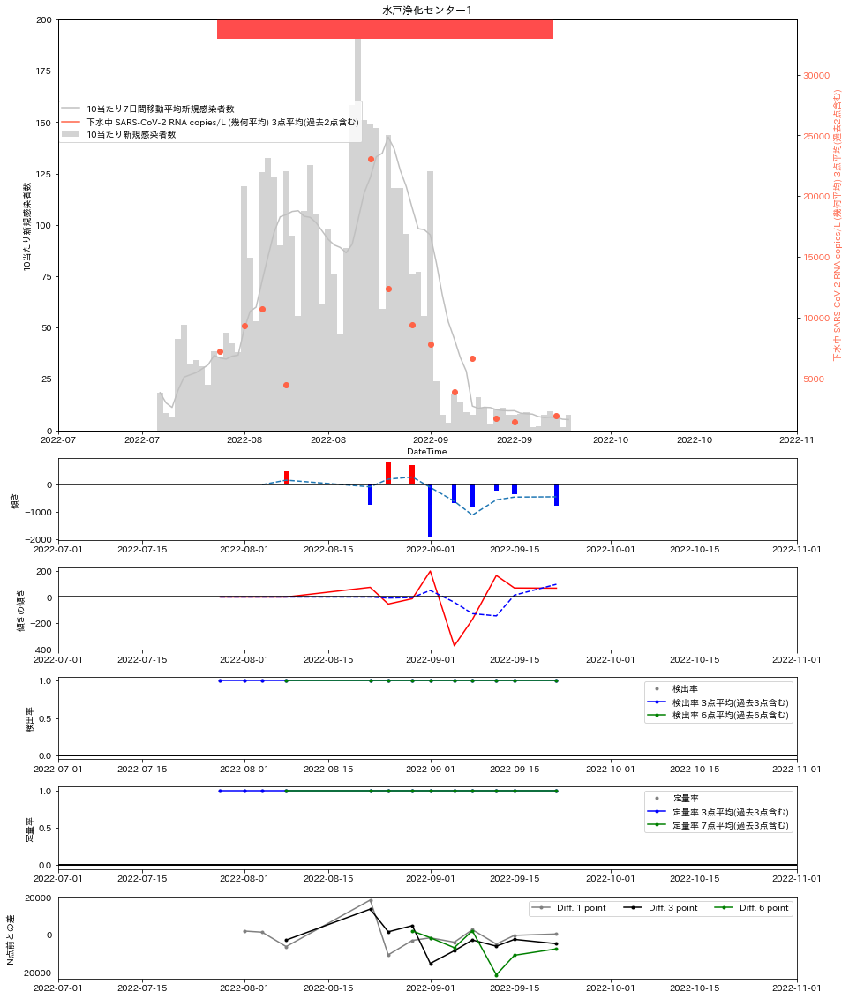

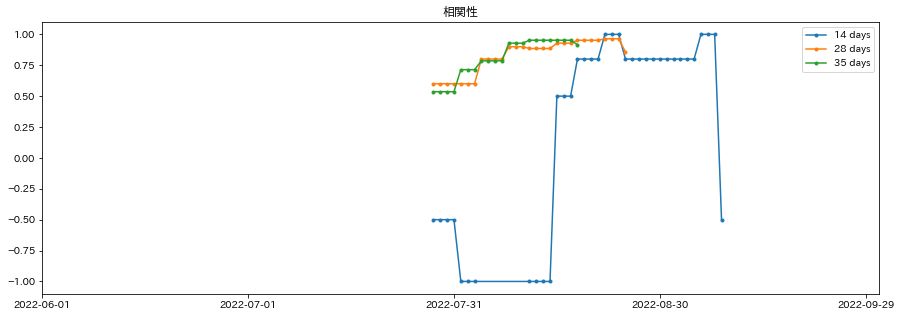

2022-07-25 2099-01-01 <class 'datetime.date'>
69 69
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


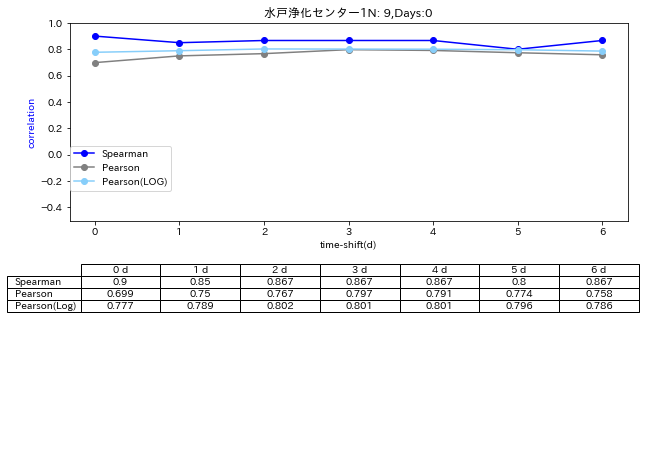

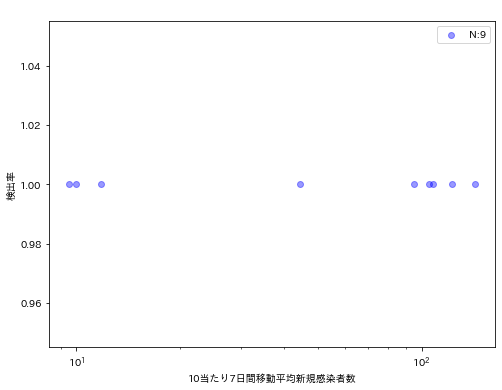

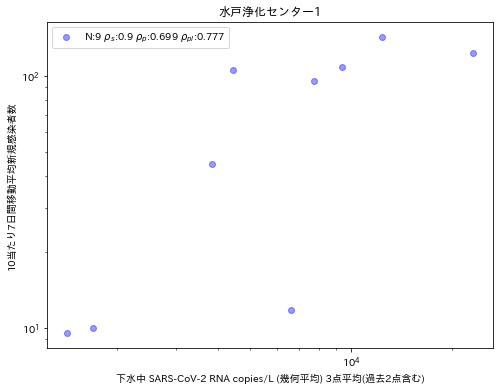

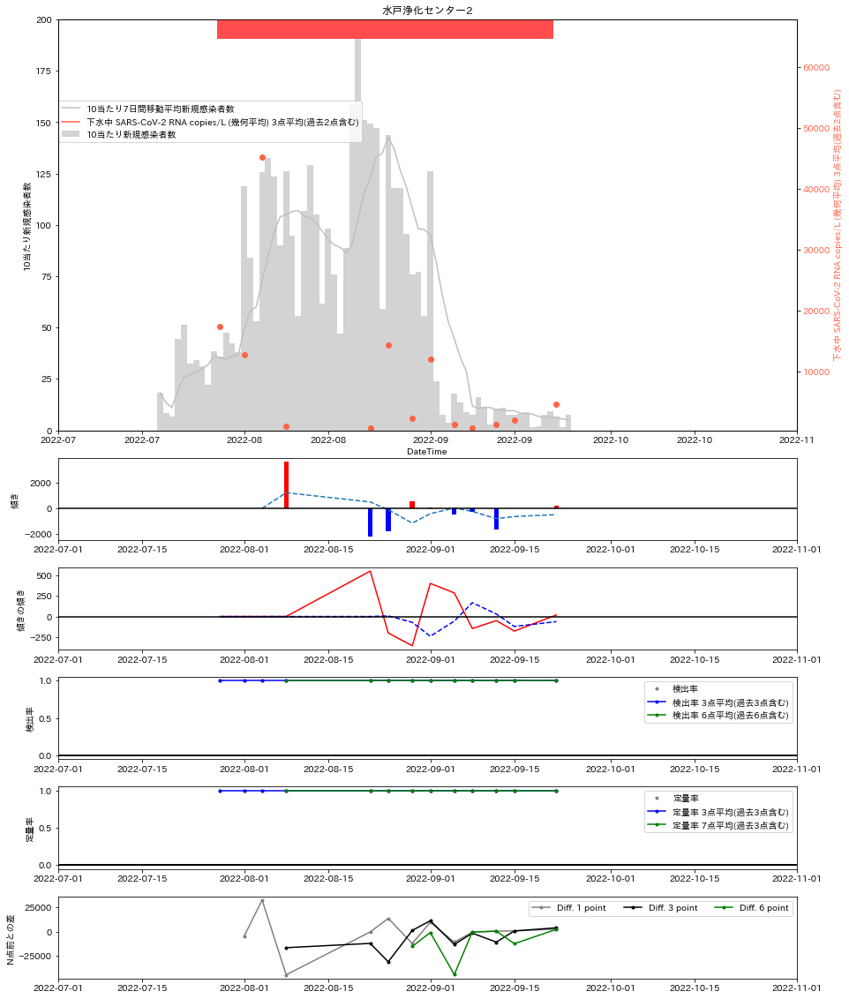

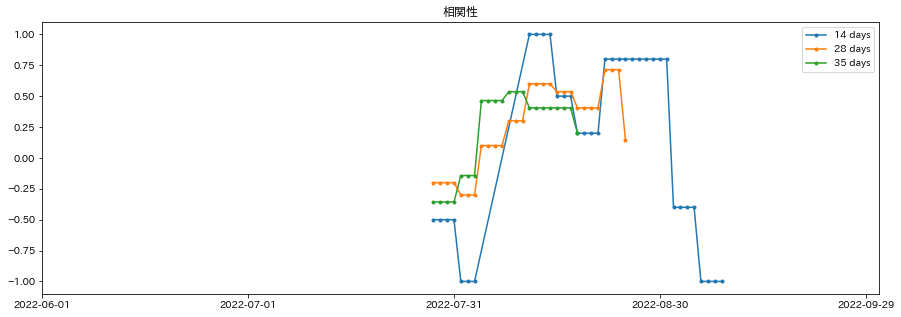

2022-07-25 2099-01-01 <class 'datetime.date'>
69 69
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


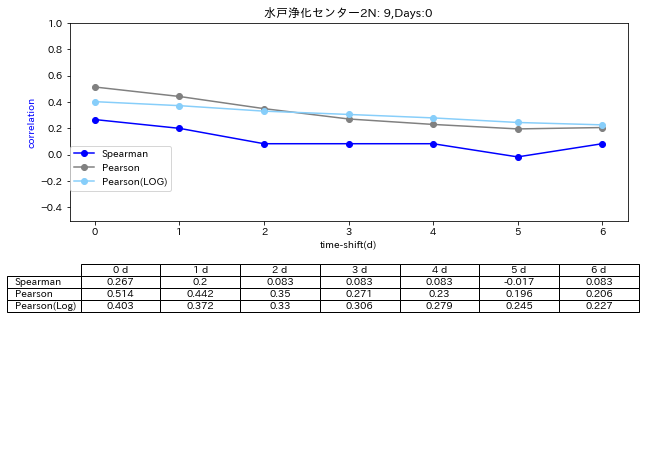

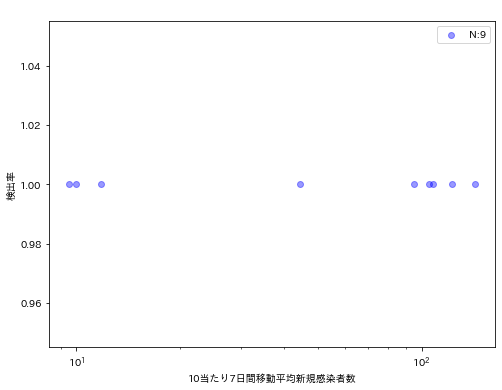

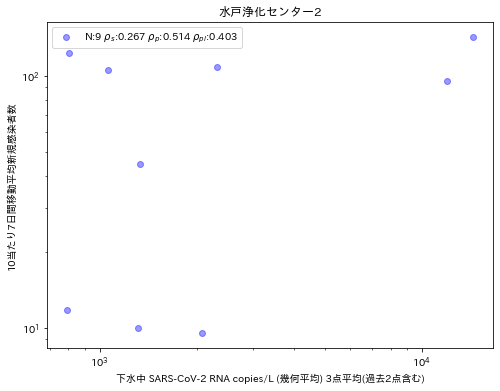

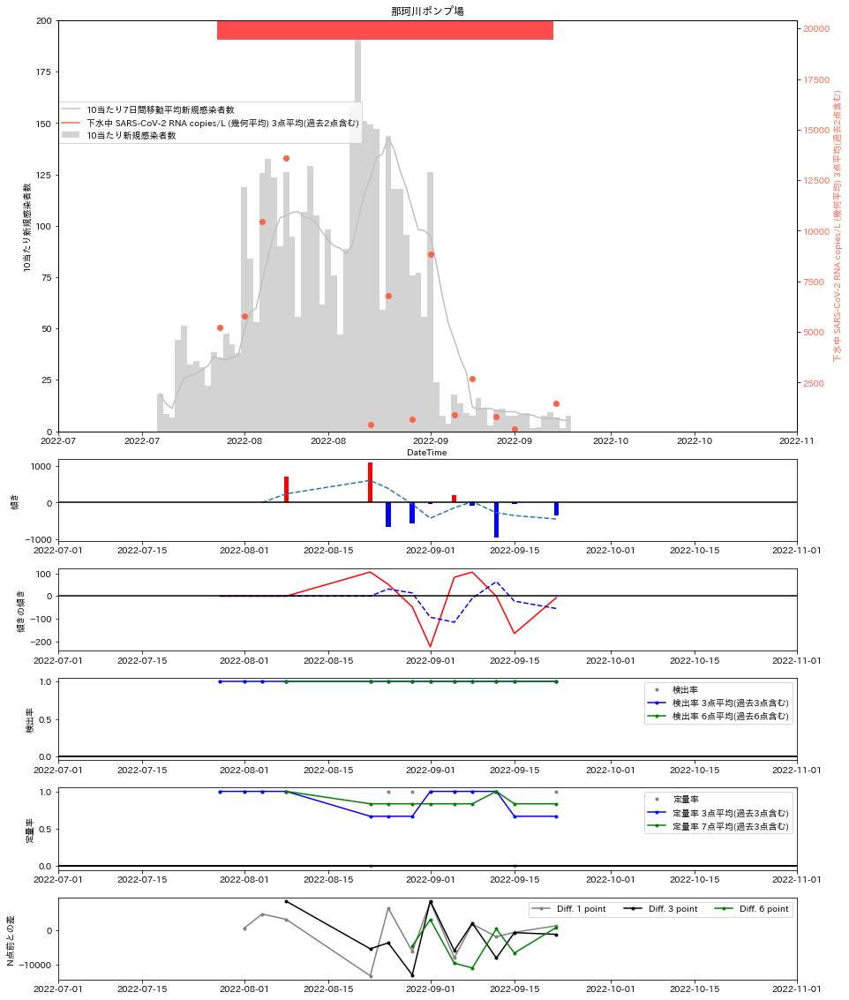

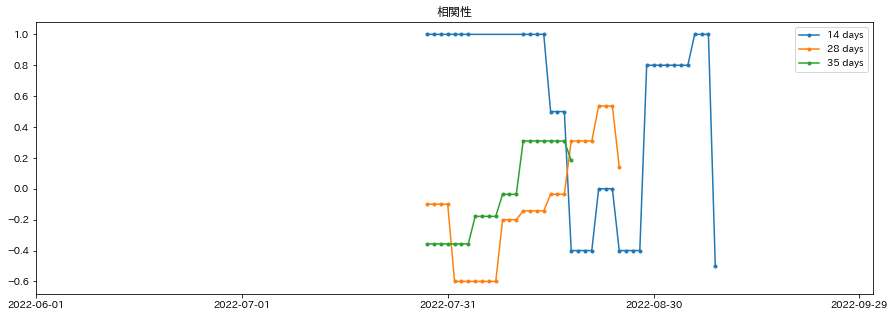

2022-07-25 2099-01-01 <class 'datetime.date'>
69 69
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


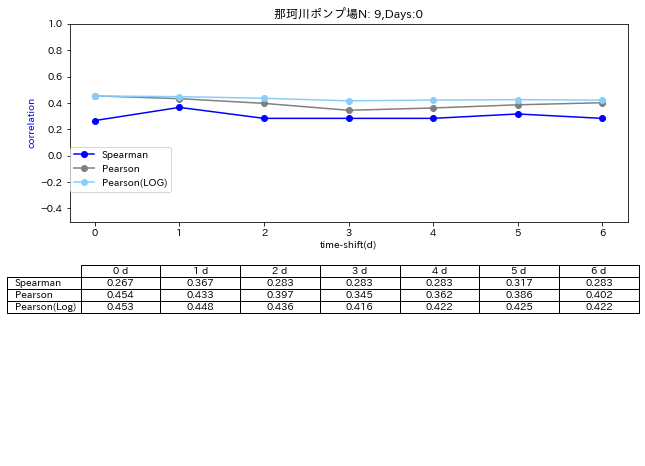

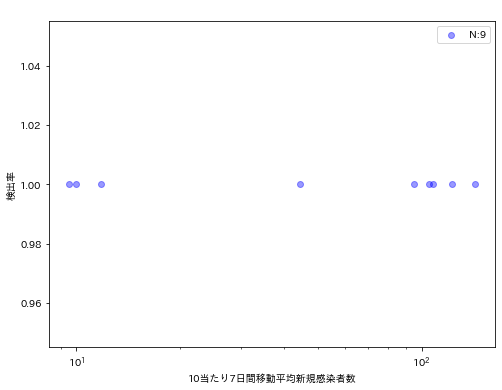

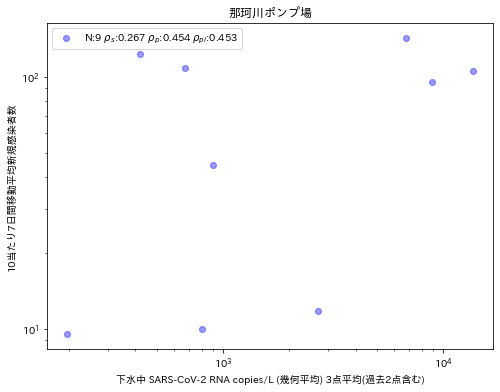

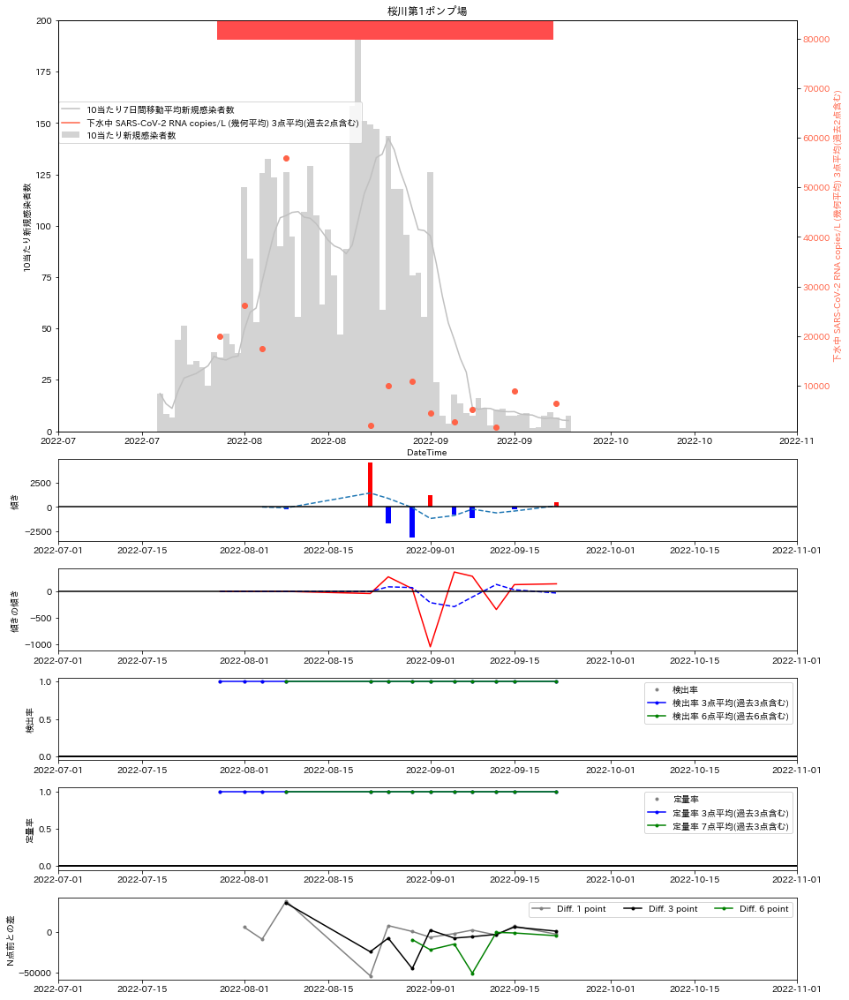

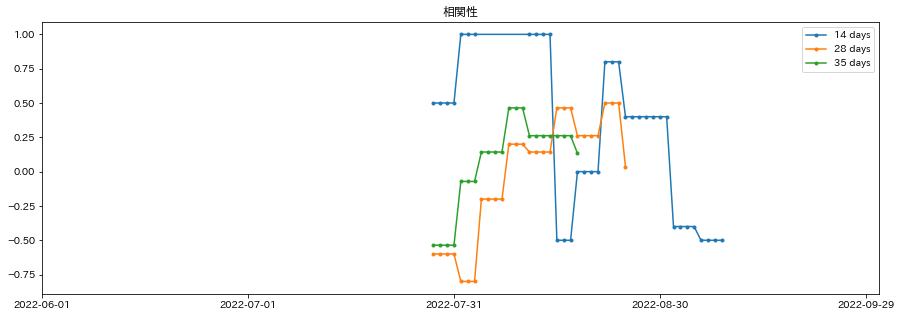

2022-07-25 2099-01-01 <class 'datetime.date'>
79 79
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


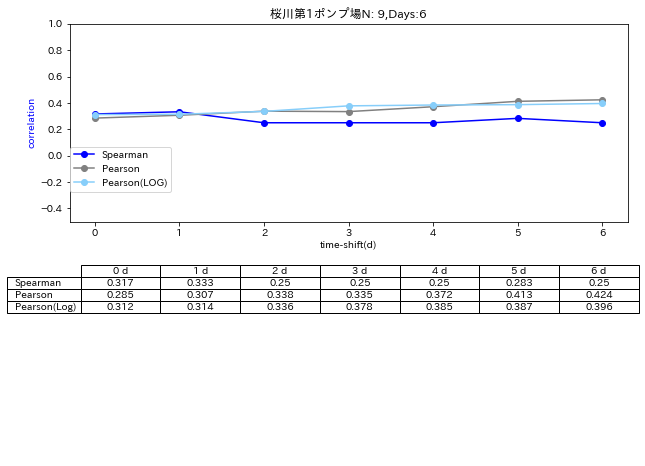

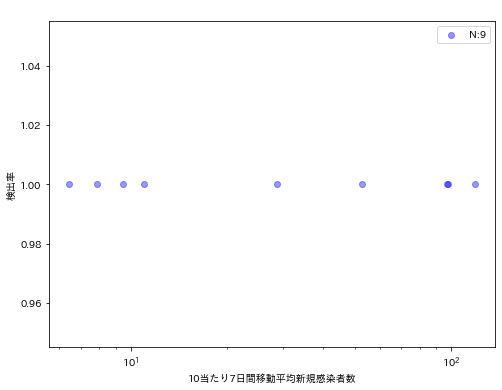

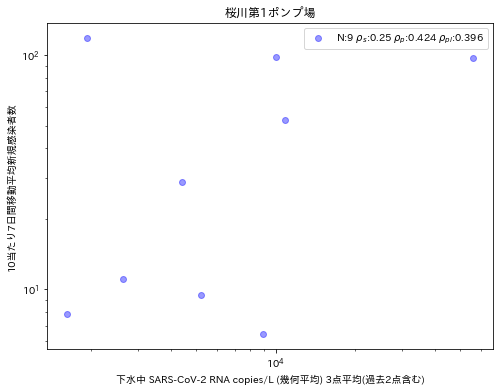

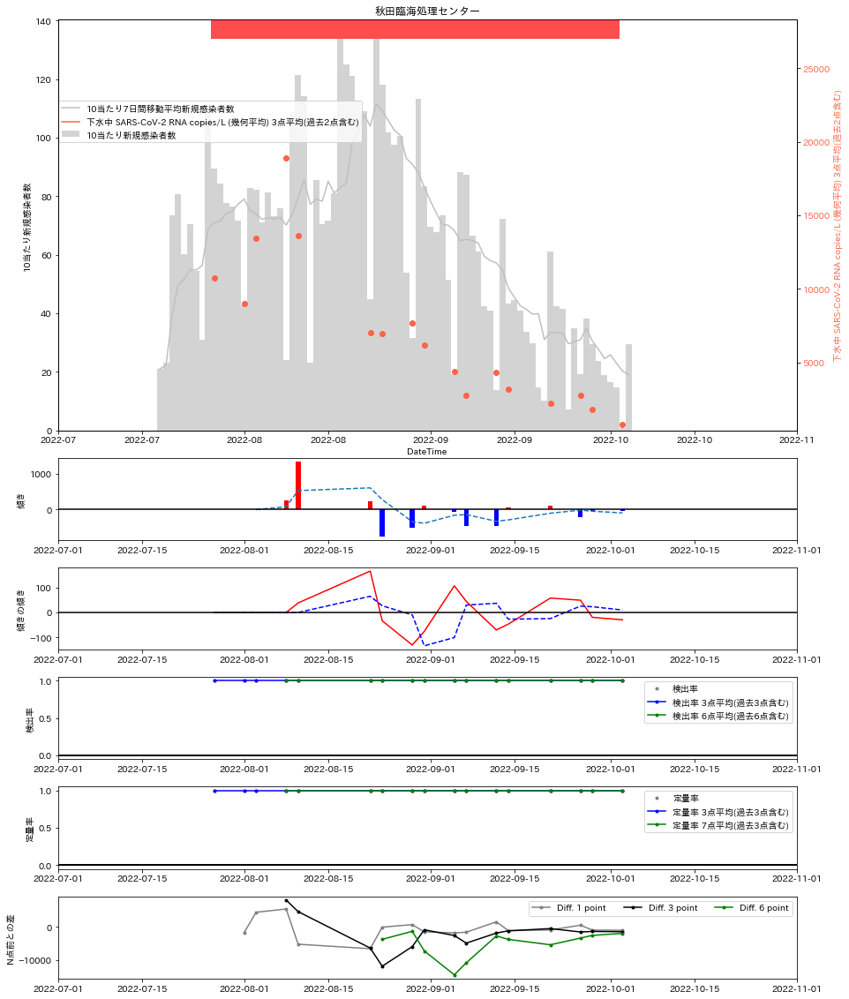

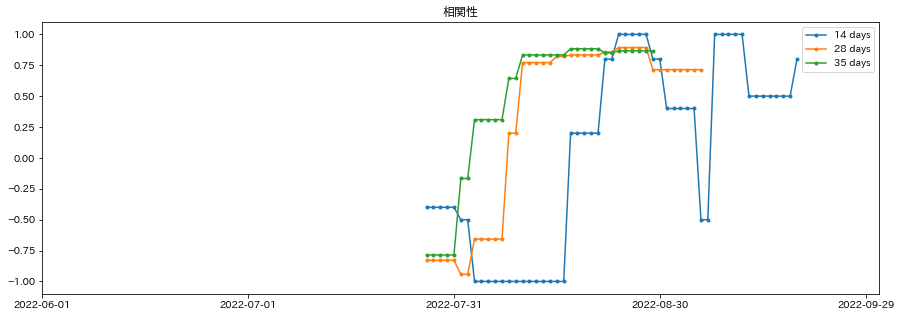

2022-07-25 2099-01-01 <class 'datetime.date'>
79 79
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


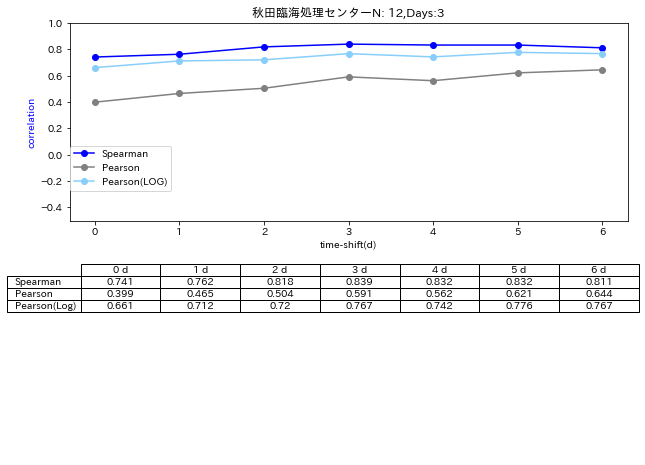

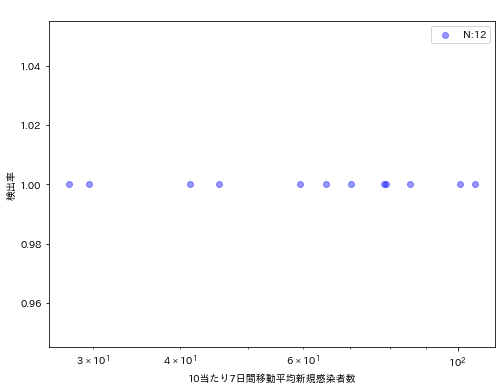

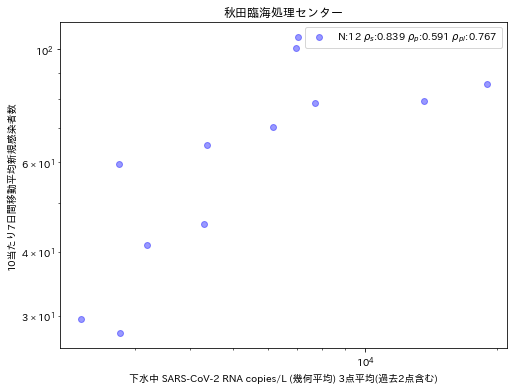

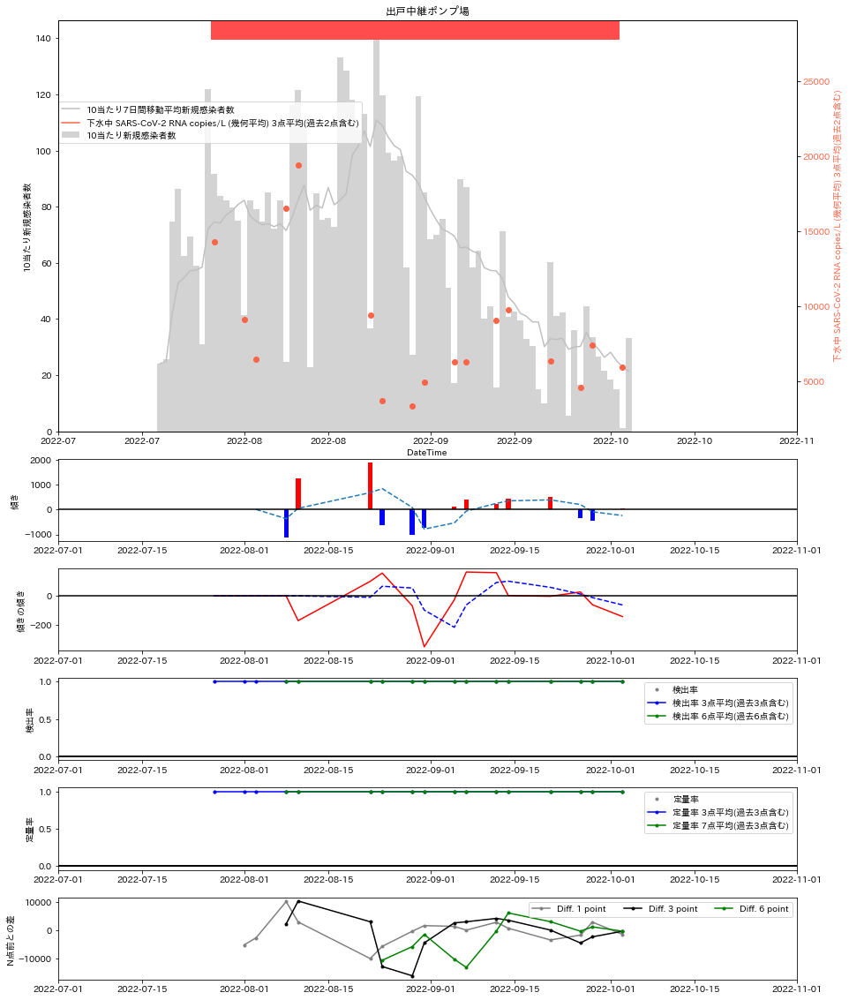

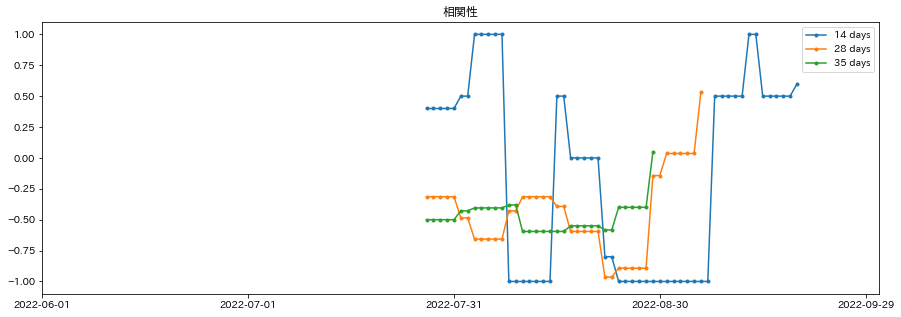

2022-07-25 2099-01-01 <class 'datetime.date'>
79 79
Index(['assay_method', 'site_names', 'geo_mean_pmmov', 'phd_date', 'lab_id',
       'geo_mean_usemeas_roll_3pts_onesided', 'val_conf_report_10',
       'val_7_d_conf_report_10', 'covn_1_det_rate', 'covn_1_qua_rate',
       'sampling_date', 'covn_1_det_rate_rolling3', 'covn_1_det_rate_rolling6',
       'covn_1_qua_rate_rolling3', 'covn_1_qua_rate_rolling6', 'slope',
       'slope_3pts', 'acceleration', 'acceleration_3pts', 'val_diff_rel_1',
       'inf_flag_1', 'log_geo_mean_usemeas_roll_3pts_onesided_x',
       'val_diff_rel_3', 'inf_flag_3',
       'log_geo_mean_usemeas_roll_3pts_onesided_y', 'val_diff_rel_6',
       'inf_flag_6', 'log_geo_mean_usemeas_roll_3pts_onesided'],
      dtype='object')


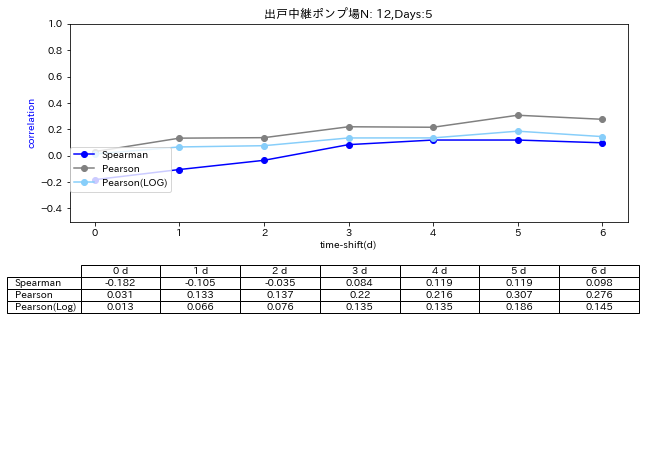

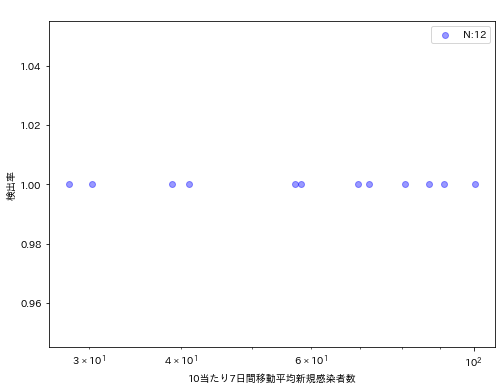

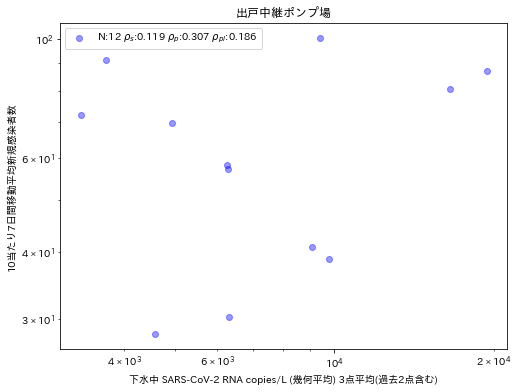

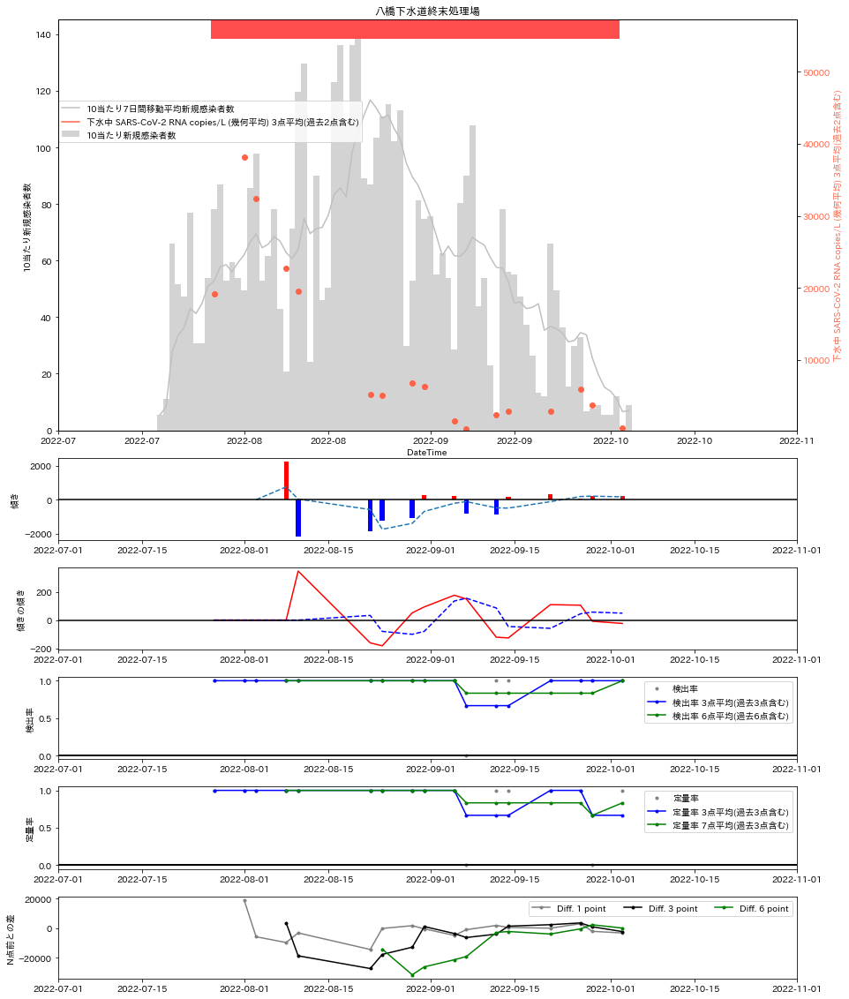

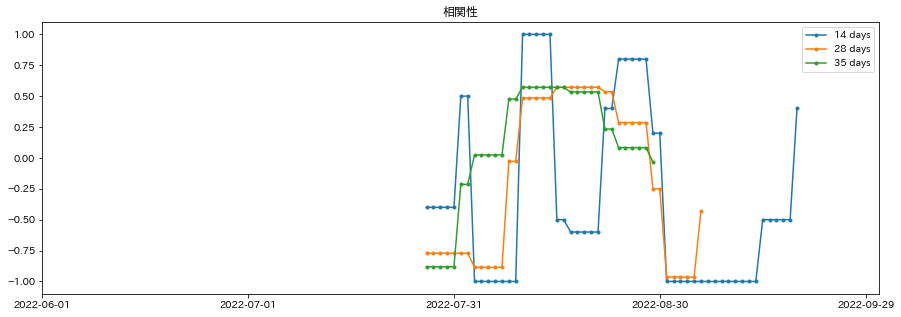

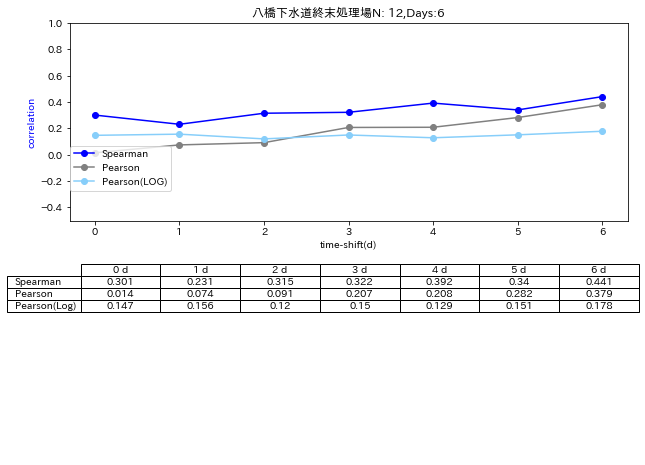

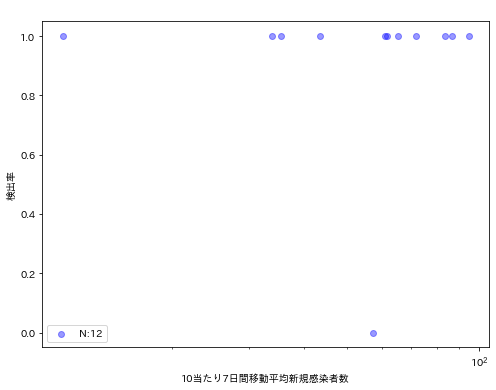

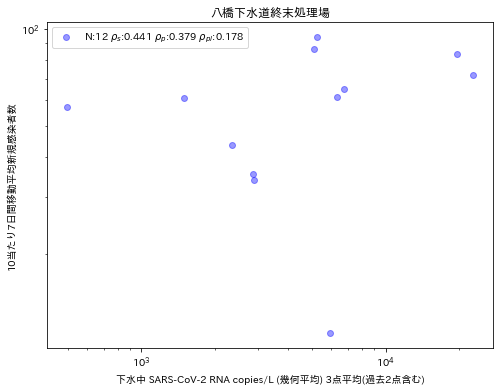

In [55]:
#####################################################################################################
#####################################################################################################
# Update: 2022-10-03
# Analysis: Geom_id_0
# Abstract: 
#  - Time series plot 
#  - time shifted result plot
#  - detection rate plot
#  - correlation
#####################################################################################################
#####################################################################################################
from scipy.optimize import curve_fit

def df_get_only_episens_data(df, sel_cols):
    # Remove PEG data
    df_geom = df[df["assay_method"]!="PEG"][sel_cols]
    # Remove COPMAN data
    df_geom = df_geom[df_geom["assay_method"]!="CM"][sel_cols]
    return df_geom

def df_get_only_copman_data(df, sel_cols):
    # Remove PEG data
    df_geom = df[df["assay_method"]!="PEG"][sel_cols]
    # Remove COPMAN data
    df_geom = df_geom[df_geom["assay_method"]!="HS"][sel_cols]
    return df_geom

def get_data_from_method(df, sel_cols, method):
    if method == "COPMAN":
        return df_get_only_copman_data(df, sel_cols)
    if method == "EPISENS":
        return df_get_only_episens_data(df, sel_cols)

def sigmoid(x, a, b):
    y = np.exp(-b*(x-a)) / (1 + np.exp(-b*(x-a)))
    return y
    

def rolling_to_average_by_date(s_x, s_y,npts):
    ma_slope = []
    for i in range(len(df)):
        x_diff=1
        if i<npts:
            continue
        if i==0:
            ma_slope.append(0)
            continue
        else:
            print(i,s_y,s_x,i-npts)
            y_diff = s_y.iloc[i]*npts
            x_diff = s_x.iloc[i]-s_x.iloc[i-npts]
            days = x_diff.days
        ma_slope.append(y_diff/days)
    return ma_slope
# plot site class difference average
print(df_geom_src_id_0.columns)

#SELECTED_METHOD = "COPMAN"
SELECTED_METHOD = "EPISENS"
SELECTED_GEOM_ID = "geom_id_2"
#SELECTED_GEOM_ID = "geom_id_1"
#SELECTED_GEOM_ID = "geom_id_0"

# visualisation 
geom_id_0_list = df_geom_src_id_0["geom_id_0"].unique()
geom_id_0_list_nonan = [x for x in geom_id_0_list if np.isnan(x) == False]
if SELECTED_GEOM_ID == "geom_id_1":
    geom_id_0_list = df_geom_src_id_1["geom_id_1"].unique()
    geom_id_0_list_nonan = [x for x in geom_id_0_list if np.isnan(x) == False]
elif SELECTED_GEOM_ID == "geom_id_2":
    geom_id_0_list = df_geom_src_id_2["geom_id_2"].unique()
    geom_id_0_list_nonan = [x for x in geom_id_0_list if np.isnan(x) == False]
#mean_idx = "geo_mean_usemeas"
#mean_idx = "geo_mean_usetloq"
#mean_idx = "geo_mean_normalized_usemeas"
#mean_idx = "geo_mean_usemeas_roll_3pts_centered"
#mean_idx = "geo_mean_normalized_usemeas_3pts_centered"
mean_idx = "geo_mean_usemeas_roll_3pts_onesided"
#mean_idx = "geo_mean_normalized_usemeas_3pts_onesided"
#mean_idx = "weighted_mean_usemeas"
#phd_idx = "val_conf_report"
#phd_roll_idx = "val_7_d_conf_report"
phd_idx = "val_conf_report_10"
phd_roll_idx = "val_7_d_conf_report_10"

# Change the order since SHOULD NOT look at 7 days average
#phd_idx = "val_7_d_conf_episode"
#phd_roll_idx = "val_conf_episode"
#phd_idx = "val_7_d_active"
#phd_roll_idx = "val_active"


detection_rate_cut = {
                      "weighted_mean_usemeas":1,
                      "geo_mean_usemeas":1,
                      "geo_mean_usetloq":1,
                      "geo_mean_normalized_usemeas":1e-9,
                      "geo_mean_usemeas_roll_3pts_centered":1,
                      "geo_mean_usemeas_roll_3pts_onesided":1,                      
                      "geo_mean_normalized_usemeas_3pts_centered":1e-9,
                      "geo_mean_normalized_usemeas_3pts_onesided":1e-9
                     }


# Loop over geom id
sel_cols = ["assay_method","site_names","geo_mean_pmmov","phd_date","lab_id",mean_idx,phd_idx,phd_roll_idx,"covn_1_det_rate","covn_1_qua_rate","sampling_date"]

"""
説明 #1
SELECTED_GEOM_ID = "geom_id_0" の場合は　geomId0 を選択してください

geomId0	geomId1	geomId2	polygonId	siteId	siteName
0	0	0	kyoto_miyazu_0	f00111	宮津湾浄化センター
1	1	1	kyoto_kyotoshi_0	f00024	鳥羽センター（第一送水渠）
1	2	2	kyoto_kyotoshi_0	f00025	鳥羽センター（第二送水渠）
1	3	3	kyoto_kyotoshi_0	f00049	石田水環境センター
2	4	4	kanagawa_sagan_0	f00010	左岸処理場
2	5	5	kanagawa_ugan_0	f00011	右岸処理場
3	6	6	kagawa_daisokugawa_0	f00018	大束川浄化センター
3	7	7	kagawa_takamatsu_0	f00019	東部下水処理場
4	8	8	yabu_city_0	f00106	八鹿浄化センター
4	9	9	yabu_city_0	f00107	養父中央浄化センター
4	10	10	yabu_city_0	f00108	大屋浄化センター
4	11	11	yabu_city_0	f00109	関宮中部浄化センター
4	12	12	yabu_city_0	f00110	関宮東部浄化センター
5	13	13	okinawa_naha_0	f00115	沖縄-那覇-那覇
5	14	14	okinawa_ginowan_0	f00116	沖縄-宜野湾-宜野湾
5	15	15	okinawa_gushikawa_0	f00117	沖縄-うるま-具志川
5	16	16	okinawa_nishihara_0	f00118	沖縄-西原-西原
6	17	17	okinawa_prefecture_0	f00119	沖縄-那覇-空港・国際
7	18	18	okinawa_prefecture_0	f00120	沖縄-那覇-空港・国内
8	19	19	saitama_nakagawa_0	f00095	中川水循環センター
8	19	20	saitama_motoarakawa_0	f00096	元荒川水循環センター
8	19	21	saitama_sinngasikawa_0	f00097	新河岸川水循環センター
8	19	22	saitama_furutone_0	f00098	古利根川水循環センター
8	19	23	saitama_arakawajyouryuu_0	f00099	荒川上流水循環センター
8	19	24	saitama_ichinokawa_0	f00100	市野川水循環センター
8	19	25	saitama_oyamakawa_0	f00101	小山川水循環センター
8	19	26	saitama_arakawa_0	f00031	荒川水循環（本幹線）
8	20	27	saitama_hidakashi_0	f00102	日高市浄化センター
8	21	28	saitama_chichibushi_0	f00103	秩父市下水道センター
8	22	29	saitama_saitamashi_0	f00104	さいたま市下水処理センター
8	23	30	saitama_hannnoushi_0	f00105	飯能市浄化センター
9	24	31	mitoshi_mitoshi_0	f00091	水戸浄化センター1
9	24	32	mitoshi_mitoshi_0	f00092	水戸浄化センター2
9	25	33	mitoshi_mitoshi_0	f00093	那珂川ポンプ場
9	25	34	mitoshi_mitoshi_0	f00094	桜川第1ポンプ場
10	26	35	akita_akitashi_chuuou_0	f00088	秋田臨海処理センター
10	26	36	akita_akitashi_0	f00089	八橋下水道終末処理場
10	27	37	akita_akitachuuou_0	f00090	出戸中継ポンプ場
"""
for igeom in geom_id_0_list_nonan:
    # 説明 #1を参照してください
    #if igeom!=2 and igeom!=3:
    #if igeom<13 or igeom>16:
    #if igeom!=20:
    #    continue
    
    # Get geomId data
    df_geom = df_geom_src_id_0[df_geom_src_id_0["geom_id_0"]==igeom].copy()
    if SELECTED_GEOM_ID == "geom_id_1":
        df_geom = df_geom_src_id_1[df_geom_src_id_1["geom_id_1"]==igeom].copy()
    elif SELECTED_GEOM_ID == "geom_id_2":
        df_geom = df_geom_src_id_2[df_geom_src_id_2["geom_id_2"]==igeom].copy()
    df_geom = get_data_from_method(df_geom, sel_cols, SELECTED_METHOD)
    
    # Remove data at the front and back since this centered average
    try:
        if "centered" in mean_idx:
            f_datum = df_geom["phd_date"].iloc[0]
            l_datum = df_geom["phd_date"].iloc[len(df_geom)-1]
            print(f_datum,l_datum)
            dropped_df = df_geom.iloc[1:len(df_geom)-1]
        elif "side" in mean_idx:
            f_datum = df_geom["phd_date"].iloc[1]
            l_datum = datetime.date(2099, 1, 1)  # No cut on l_datum
            print(f_datum,l_datum,type(f_datum))
            dropped_df = df_geom.iloc[2:len(df_geom)]
        else:
            dropped_df = df_geom.iloc[0:len(df_geom)]
    except:
        continue
    # Set pdf output suufix
    df_lbl_name = geom_id_0_to_name
    if SELECTED_GEOM_ID == "geom_id_1":
        df_lbl_name = geom_id_1_to_name
    elif SELECTED_GEOM_ID == "geom_id_2":
        df_lbl_name = geom_id_2_to_name
    output_suffix = mean_idx + "_" + phd_roll_idx + SELECTED_GEOM_ID + "_" + str(df_lbl_name[int(igeom)]) + ".jpg"
    # Set title
    title = str(dropped_df.site_names.unique()[0])
    if len(title)>20:
        title = title[0:int(len(title)/2)] + "\n" + title[int(len(title)/2):len(title)-1]
    
    # debug
    #draw_geom_phd_data(dropped_df,"phd_date",mean_idx,phd_idx,phd_roll_idx, interpolate=False, log =True, save=False)
    
    # Get geomId data
    df_geom = df_geom_src_id_0[df_geom_src_id_0["phd_geom_id_0"]==igeom].copy()
    if SELECTED_GEOM_ID == "geom_id_1":
        df_geom = df_geom_src_id_1[df_geom_src_id_1["phd_geom_id_1"]==igeom].copy()
    elif SELECTED_GEOM_ID == "geom_id_2":
        df_geom = df_geom_src_id_2[df_geom_src_id_2["phd_geom_id_2"]==igeom].copy()
    #print(df_geom_src_id_0[df_geom_src_id_0["geom_id_0"]==igeom].copy())
    df_geom = get_data_from_method(df_geom, sel_cols, SELECTED_METHOD)
    #    df_geom[mean_idx] = np.where(df_geom['phd_date']>datetime.date(2022, 3, 1) ,float('nan'),df_geom[mean_idx])

#    df_geom[mean_idx] = np.where(df_geom['phd_date']>datetime.date(2022, 3, 1) ,float('nan'),df_geom[mean_idx])
#    df_geom[mean_idx] = np.where(df_geom['phd_date']<datetime.date(2022, 6, 1) ,float('nan'),df_geom[mean_idx])
#   df_geom[mean_idx] = np.where(df_geom['phd_date']>datetime.date(2022, 6, 1) ,float('nan'),df_geom[mean_idx])
#    df_geom[mean_idx] = np.where(df_geom['phd_date']<datetime.date(2021, 12, 1) ,float('nan'),df_geom[mean_idx])
#    df_geom[mean_idx] = np.where(df_geom['phd_date']<datetime.date(2021, 12, 1) ,float('nan'),df_geom[mean_idx])
#    if igeom==4:
#        df_geom[mean_idx] = np.where(df_geom['phd_date']>datetime.date(2022, 9, 1) ,float('nan'),df_geom[mean_idx])
    #df_geom[mean_idx] = np.where(df_geom['sampling_date']==datetime.date(2022,8,29),117584,df_geom[mean_idx])
    
    
    #print(df_geom[['sampling_date',mean_idx]][df_geom["sampling_date"]<datetime.date(2022, 9, 1)])
    # Only if using centered, one-sided method we should remove the data
    if "centered" in mean_idx or "side" in mean_idx:
        # Set first and last datum to nan
        set_to_nan_idxes = ["geo_mean_pmmov",mean_idx ]
        for inan_idx in set_to_nan_idxes:
            df_geom[inan_idx] = np.where(df_geom["phd_date"]<=f_datum,float("nan"),df_geom[inan_idx])
            df_geom[inan_idx] = np.where(df_geom["phd_date"]>=l_datum,float("nan"),df_geom[inan_idx])
    #print(df_geom[["lab_id","assay_method","phd_date",mean_idx,"site_names"]].sort_values(by=["phd_date"]))
    
    # Set rolling
    df_geom['covn_1_det_rate_rolling3'] = df_geom['covn_1_det_rate'].rolling(3).mean()
    df_geom['covn_1_det_rate_rolling6'] = df_geom['covn_1_det_rate'].rolling(6).mean()
    df_geom['covn_1_qua_rate_rolling3'] = df_geom['covn_1_qua_rate'].rolling(3).mean()
    df_geom['covn_1_qua_rate_rolling6'] = df_geom['covn_1_qua_rate'].rolling(6).mean()
    
    #df_geom["covn_1_det_rate_rolling3_mod"] = rolling_to_average_by_date(df_geom["phd_date"],df_geom["covn_1_det_rate_rolling3"],3)
    #print(df["covn_1_det_rate_rolling3_mod"])
    
    # Set range for difference places
    if igeom<=3 or igeom>=8:
        auto_t_lim_flag = False
    else:
        auto_t_lim_flag = True
    #auto_t_lim_flag=False
    # Draw virus conc. virus public health data
    #print(df_geom[df_geom[mean_idx]>0])
    draw_geom_phd_data(df_geom,"phd_date", mean_idx, phd_idx, phd_roll_idx, \
                       title=title, output_suffix=output_suffix, \
                       linestyle="None", \
                       pmmov=False, \
                       figsize=(15,20), \
                       interpolate=False, log=False, save=True, weight=False, date_interval=30,
                       min_lim_x=datetime.date(2022,7,1),max_lim_x=datetime.date(2022,11,1),auto_t_lim=auto_t_lim_flag
                      )
    
    plot_corr_time_series(df_geom, "sampling_date", phd_roll_idx,mean_idx, window_list=[14,28,35])
    
    # Scan time window
    df_best = time_window_scan(df_geom, "phd_date", mean_idx,phd_roll_idx, \
                     time_window=7, \
                     start_time_offset=7, \
                     debug=False, save=True, \
                     title=title, output_suffix=output_suffix)
#                     lim_min_cor=0.2, lim_max_cor=0.96)
    
    # Draw detection efficiency
    eff_idx = "covn_1_det_rate"
    plot_scatter(df_best,phd_roll_idx,eff_idx, draw=True,figure_size=(8,6), \
                 title=" ", \
#                 title=title+"\n"+"Detection rate:" + str(det_rate) + "/" + str(n) + "=" + str(det_rate/n*100) + "%", \
                 output_suffix="detection_rate_"+output_suffix, \
                 cor_cal_flg=False,log_y=False, save=True)

    #fitting a sigmoid curve
    #df_best["sigma"] = np.where(df_best[eff_idx]>50,0.1,1)
    #popt, pcov = curve_fit(sigmoid, df_best[phd_roll_idx], df_best[eff_idx],  method='dogbox', p0=[-1.5, 1.7], sigma=df_best["sigma"])
    #estimated_k, estimated_x0 = popt
    #print("sigmoid inflection point:", estimated_x0)
    #x = np.linspace(0, int(max(df_best[phd_roll_idx])), len( df_best[eff_idx])*10)
    #y = sigmoid(x, *popt)*max( df_best[eff_idx])
    #plt.plot(x,y, label='sigmoid')
    
    # Draw best
    #print(df_best.head(20))

    plot_scatter(df_best,mean_idx,phd_roll_idx, draw=True, save=True,
                 title=title,
                 output_suffix="correlation_"+output_suffix,
                 figure_size=(8,6))

output_filename = "summary_" + SELECTED_GEOM_ID + "_" + mean_idx + "_" + phd_roll_idx + ".zip"
input_filename = 'output'
with zipfile.ZipFile(output_filename, 'w') as zipF:
    list_files = []
    for root, dirs, files in os.walk(input_filename):
        for file in files:
            list_files.append("output/"+file)
    for file in list_files:
        zipF.write(file, compress_type=zipfile.ZIP_DEFLATED)

# Delete data
mypath = "output"
for root, dirs, files in os.walk(mypath):
    for file in files:
        os.remove(os.path.join(root, file))


In [696]:
# Zipping results
import zipfile
import os, re, os.path

output_filename = "summary_geom_id_1" + "_" + mean_idx + "_" + phd_roll_idx + ".zip"
input_filename = 'output'
with zipfile.ZipFile(output_filename, 'w') as zip:
    list_files = []
    for root, dirs, files in os.walk(input_filename):
        for file in files:
            if "checkpoint" in file:
                continue
            if "scattered" in file:
                continue
            list_files.append("output/"+file)
    for file in list_files:
        zip.write(file, compress_type=zipfile.ZIP_DEFLATED)
        
ypath = "output"
for root, dirs, files in os.walk(mypath):
    for file in files:
        os.remove(os.path.join(root, file))

In [331]:
def make_ma_slope(s_x, s_y, fitting=True, npts=3, x_date_opt=True):
    ma_slope = []
    if len(s_x)!=len(s_y):
        print("Error: List length difference ")
        return -1
    if fitting==True:
        for i in range(len(s_x)-npts):
            if i<+npts:
                continue
            xs = s_x.iloc[i-npts:i]
            ys = s_y.iloc[i-npts:i]
            # Convert days to int x
            xc = []
            for j in range(len(xs)):
                if j<1:
                    xc.append(0)
                else:
                    dd = (xs.iloc[j] - xs.iloc[j-1]).days
                    xc.append(xc[j-1]+dd)                
            a, b = np.polyfit(xc, ys, 1)
            ma_slope.append(a)
    else:
        for i in range(len(s_x)):
            y_diff=0
            x_diff=1
            if i==0:
                ma_slope.append(0)
                continue
            else:            
                y_diff = s_y.iloc[i]-s_y.iloc[i-1]
                x_diff = s_x.iloc[i]-s_x.iloc[i-1]
                if x_date_opt == True:
                    days = x_diff.days
            ma_slope.append(y_diff/days)
    return ma_slope

df_tmp = pd.DataFrame()
x_list = [ datetime.date(2022,9,1) + datetime.timedelta(days=i*2) for i in range(10) ] 
x_list
y_list = np.random.rand(10)*10
df_tmp["x"] = x_list
df_tmp["y"] = y_list
df_tmp
make_ma_slope(df_tmp["x"],df_tmp["y"])

[2.209287079670319,
 0.7833648496262455,
 -0.29216247897418307,
 -1.2334957964675552]

In [ ]:
#20220926 Kyoto analysis
df_geom = df_geom_src_id_0[df_geom_src_id_0["phd_geom_id_0"]==1].copy()
df_geom = df_geom[df_geom["lab_id"]!="RBI"]

# seperate data into 4 sections
df_geom.columns
print(len(df_geom))
mean_idx = "geo_mean_normalized_usemeas"
phd_idx = "val_7_d_conf_report_10"

df_geom_src_id_0

71


,sampling_date,confirmed_case_oper,geom_id_0,lab_id,assay_method,geo_mean_usemeas,geo_mean_uselloq,geo_mean_usetloq,geo_mean_normalized_usemeas,geo_mean_normalized_uselloq,...,val_conf_report,val_7_d_conf_report,val_conf_episode,val_7_d_conf_episode,val_active,val_7_d_active,polygon_ids,site_names,count_sites,str_agg_val
0,None,None,NaN,None,None,NaN,NaN,NaN,NaN,NaN,...,6.0,6.000000,-1.0,-1.0,-1.0,-1.0,kyoto_miyazu_0,宮津湾浄化センター,1,6
1,2022-07-18,-,0.0,STAR,HS,1230.000000,1230.000000,1230.000000,0.000426,0.000426,...,3.0,4.500000,-1.0,-1.0,-1.0,-1.0,kyoto_miyazu_0,宮津湾浄化センター,1,3
2,None,None,NaN,None,None,NaN,NaN,NaN,NaN,NaN,...,1.0,3.333333,-1.0,-1.0,-1.0,-1.0,kyoto_miyazu_0,宮津湾浄化センター,1,1
3,2022-07-20,-,0.0,STAR,HS,1810.000000,1810.000000,1810.000000,0.000938,0.000938,...,17.0,6.750000,-1.0,-1.0,-1.0,-1.0,kyoto_miyazu_0,宮津湾浄化センター,1,17
4,None,None,NaN,None,None,NaN,NaN,NaN,NaN,NaN,...,39.0,13.200000,-1.0,-1.0,-1.0,-1.0,kyoto_miyazu_0,宮津湾浄化センター,1,39
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1392,None,None,NaN,None,None,NaN,NaN,NaN,NaN,NaN,...,236.0,120.285714,-1.0,-1.0,-1.0,-1.0,"akita_akitachuuou_0,akita_akitashi_0,akita_aki...","出戸中継ポンプ場,八橋下水道終末処理場,秋田臨海処理センター",3,"45,191,0"
1393,None,None,NaN,None,None,NaN,NaN,NaN,NaN,NaN,...,230.0,122.476190,-1.0,-1.0,-1.0,-1.0,"akita_akitachuuou_0,akita_akitashi_0,akita_aki...","出戸中継ポンプ場,八橋下水道終末処理場,秋田臨海処理センター",3,"33,197,0"
1394,None,None,NaN,None,None,NaN,NaN,NaN,NaN,NaN,...,40.0,109.523810,-1.0,-1.0,-1.0,-1.0,"akita_akitachuuou_0,akita_akitashi_0,akita_aki...","出戸中継ポンプ場,八橋下水道終末処理場,秋田臨海処理センター",3,"14,26,0"
1395,None,None,NaN,None,None,NaN,NaN,NaN,NaN,NaN,...,194.0,112.285714,-1.0,-1.0,-1.0,-1.0,"akita_akitachuuou_0,akita_akitashi_0,akita_aki...","出戸中継ポンプ場,八橋下水道終末処理場,秋田臨海処理センター",3,"27,167,0"


93


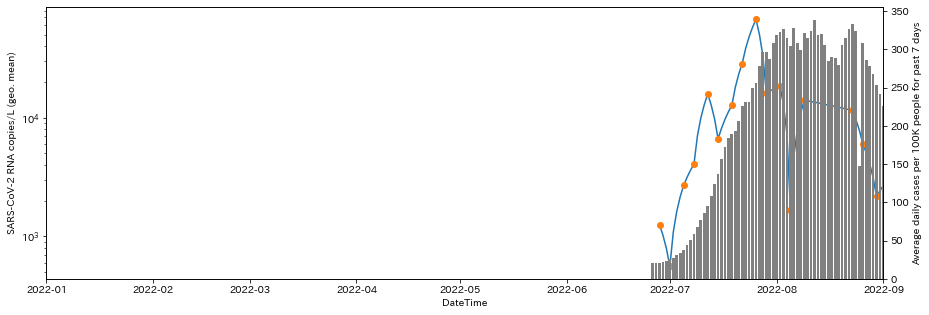

       phd_date  geo_mean_usetloq  val_7_d_conf_report_10
395  2022-06-28       1248.999600               20.910992
398  2022-07-01        556.000000               25.595238
402  2022-07-05       2683.318841               37.624595
405  2022-07-08       4063.065345               58.868408
410  2022-07-12      15846.387601               94.802014
414  2022-07-15       6620.830764              137.398020
419  2022-07-19      12724.110971              189.860471
423  2022-07-22      28601.398567              226.453746
428  2022-07-26      67422.548157              255.472777
432  2022-07-29      16256.998493              296.956392
437  2022-08-02      18338.484125              322.301161
441  2022-08-05       1673.290172              304.657365
446  2022-08-09      14043.503836              321.989247
461  2022-08-23      11502.477994              333.338027
465  2022-08-26       6036.091451              309.037378
470  2022-08-30       2166.102491              253.044035
474  2022-09-0

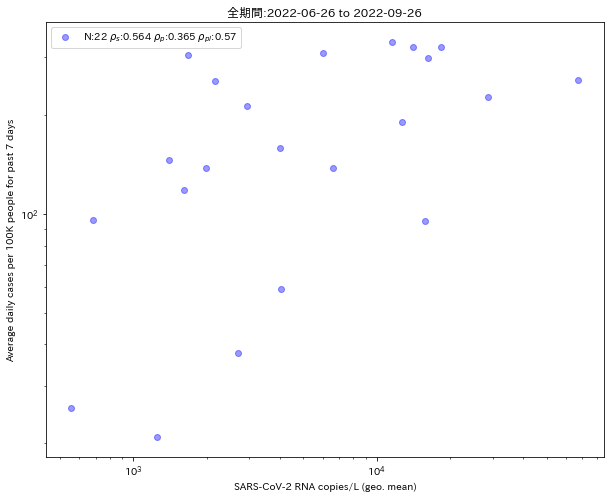

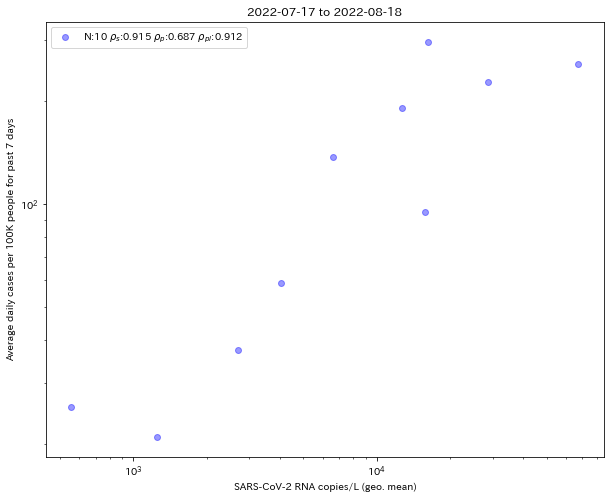

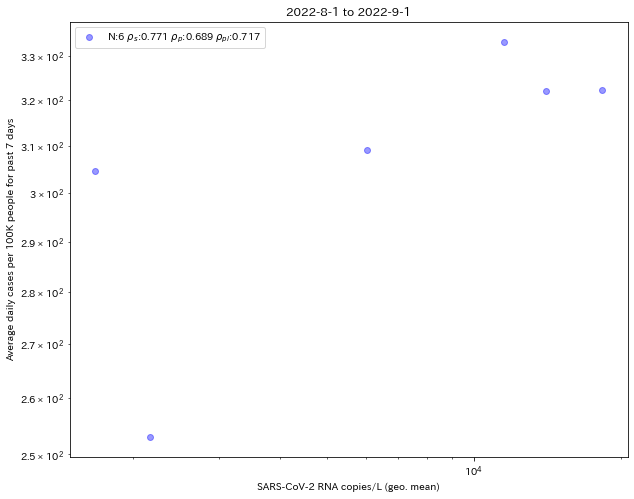

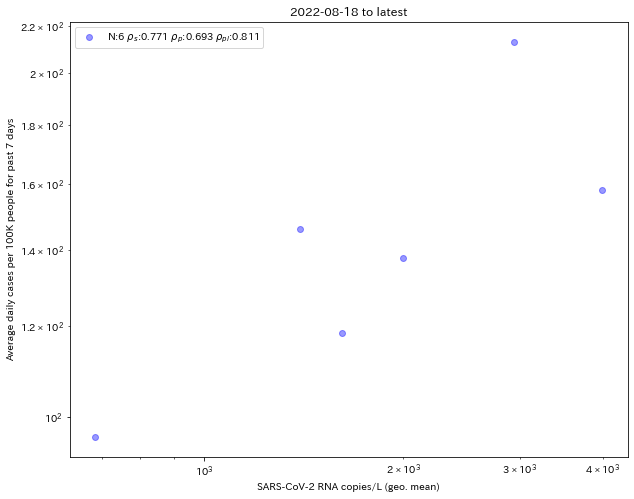

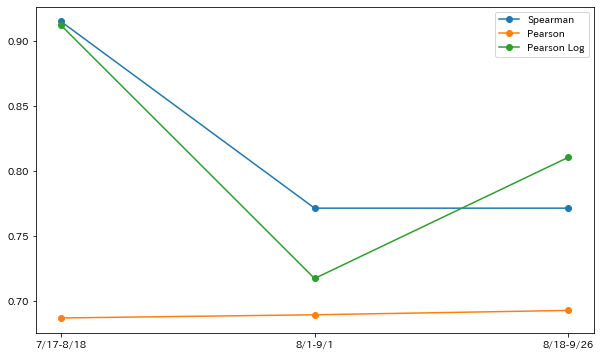

In [334]:
#20220926 Kyoto analysis
df_geom = df_geom_src_id_0[df_geom_src_id_0["phd_geom_id_0"]==2].copy()
df_geom = df_geom[df_geom["lab_id"]!="RBI"]
df_geom = df_geom[df_geom["phd_date"]>datetime.date(2022,6,25)]

# seperate data into 4 sections
df_geom.columns
print(len(df_geom))
#mean_idx = "geo_mean_usemeas"
mean_idx = "geo_mean_normalized_usemeas"
mean_idx = "geo_mean_usetloq"
#mean_idx = "geo_mean_normalized_usetlop"
#phd_idx = "val_7_d_conf_report_10"
#phd_idx = "val_7_d_conf_report"

plot_time_series(df_geom,"phd_date",mean_idx,z_idx=phd_idx,log=True,interpolate=True)
print(df_geom[["phd_date",mean_idx,phd_idx]].dropna())

# All period
s_date = df_geom.head(1)["phd_date"].iloc[0]
e_date = df_geom.tail(1)["phd_date"].iloc[0]
print(s_date, e_date)
rlt_all = plot_scatter(df_geom,mean_idx,phd_idx,  draw=True, title="全期間:"+str(s_date)+" to "+str(e_date), figure_size=(10,8))

# before 7/31
df_1 = df_geom.copy()
df_1[mean_idx] = np.where(df_1['phd_date']<datetime.date(2022, 6, 25) ,float('nan'),df_1[mean_idx])
df_1[mean_idx] = np.where(df_1['phd_date']>=datetime.date(2022, 8, 1) ,float('nan'),df_1[mean_idx])
rlt_1 = plot_scatter(df_1,mean_idx,phd_idx,  draw=True, title="2022-07-17 to 2022-08-18", figure_size=(10,8))

# 7/31 - 8/31
df_2 = df_geom.copy()
df_2[mean_idx] = np.where(df_2['phd_date']<datetime.date(2022, 8, 1),float('nan'),df_2[mean_idx])
df_2[mean_idx] = np.where(df_2['phd_date']>=datetime.date(2022, 9, 1),float('nan'),df_2[mean_idx])
rlt_2 = plot_scatter(df_2,mean_idx,phd_idx,  draw=True, title="2022-8-1 to 2022-9-1", figure_size=(10,8))

# 8/31 - latest
df_3 = df_geom.copy()
df_3[mean_idx] = np.where(df_3['phd_date']<datetime.date(2022, 9, 1),float('nan'),df_3[mean_idx])
rlt_3 = plot_scatter(df_3,mean_idx,phd_idx,  draw=True, title="2022-08-18 to latest", figure_size=(10,8))

#gr_y_s   = [rlt_all["spearman"][0],rlt_1["spearman"][0],rlt_2["spearman"][0],rlt_3["spearman"][0] ]
#gr_y_p   = [rlt_all["pearson"][0],rlt_1["pearson"][0],rlt_2["pearson"][0],rlt_3["pearson"][0] ]
#gr_y_pl  = [rlt_all["pearson_log"][0],rlt_1["pearson_log"][0],rlt_2["pearson_log"][0],rlt_3["pearson_log"][0] ]
#gr_x = ["all","7/17-7/31","7-31-8/31","8/31-latest"]
gr_y_s   = [rlt_1["spearman"][0],rlt_2["spearman"][0],rlt_3["spearman"][0] ]
gr_y_p   = [rlt_1["pearson"][0],rlt_2["pearson"][0],rlt_3["pearson"][0] ]
gr_y_pl  = [rlt_1["pearson_log"][0],rlt_2["pearson_log"][0],rlt_3["pearson_log"][0] ]
gr_x = ["7/17-8/18","8/1-9/1","8/18-9/26"]

fig, ax1 = plt.subplots(figsize=(10,6))
ax1.plot(gr_x,gr_y_s,marker="o",label="Spearman")
ax1.plot(gr_x,gr_y_p,marker="o",label="Pearson")
ax1.plot(gr_x,gr_y_pl,marker="o",label="Pearson Log")
ax1.legend()

2022-07-18 00:00:00 2022-09-21 00:00:00 <class 'pandas._libs.tslibs.timestamps.Timestamp'>


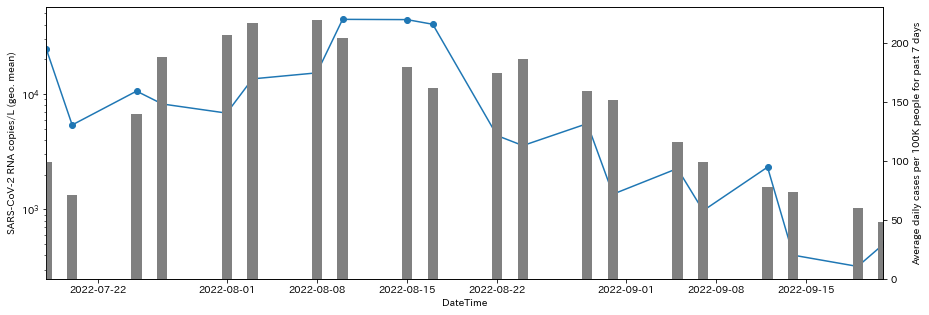

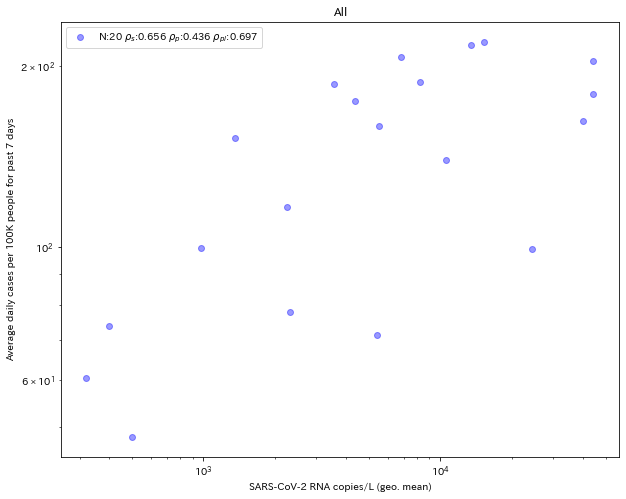

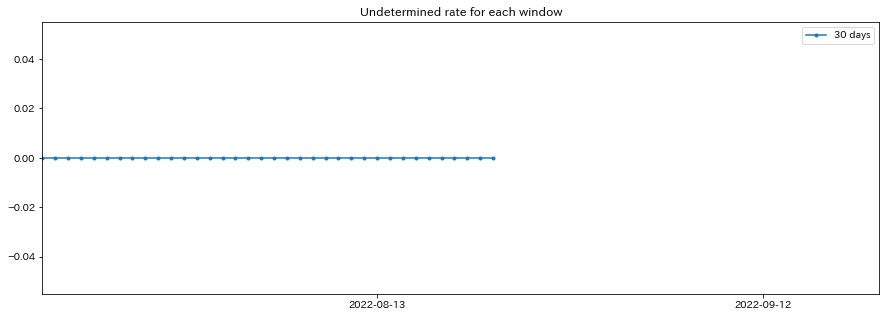

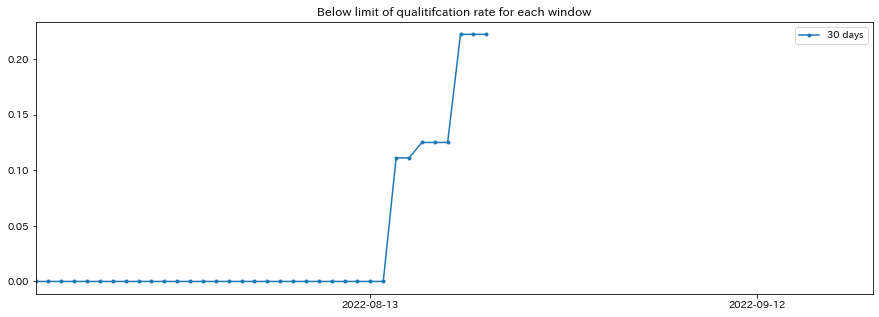

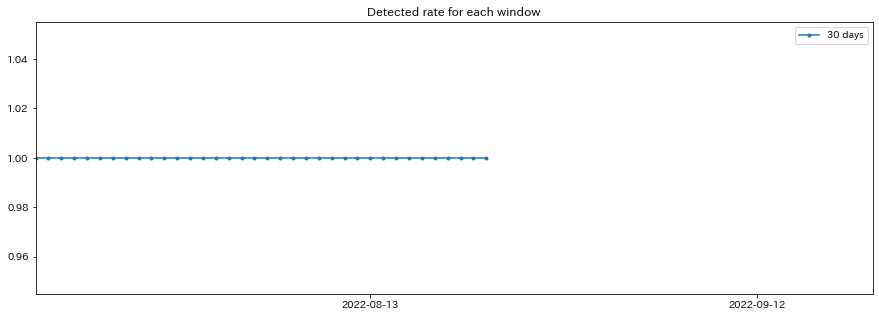

...

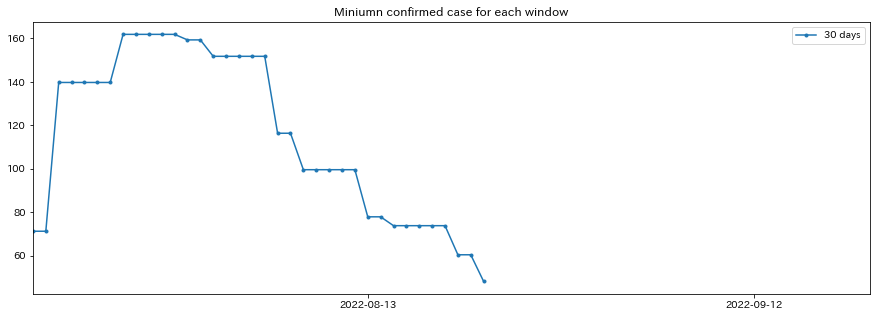

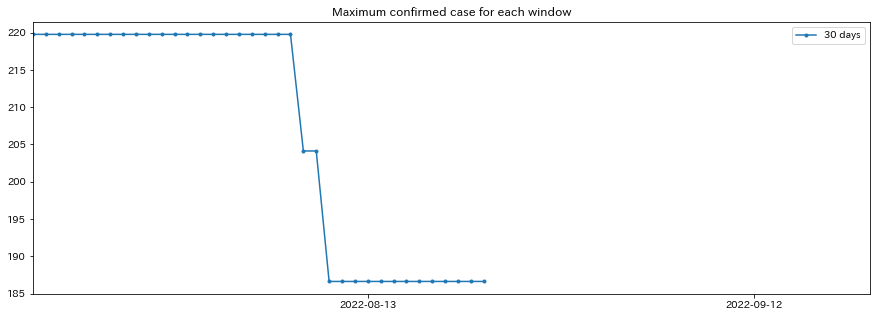

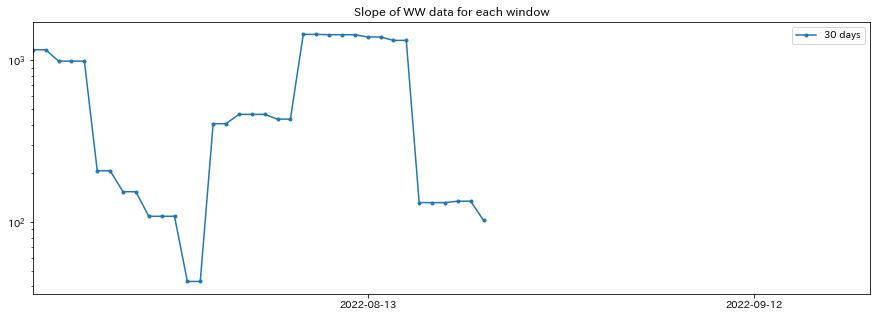

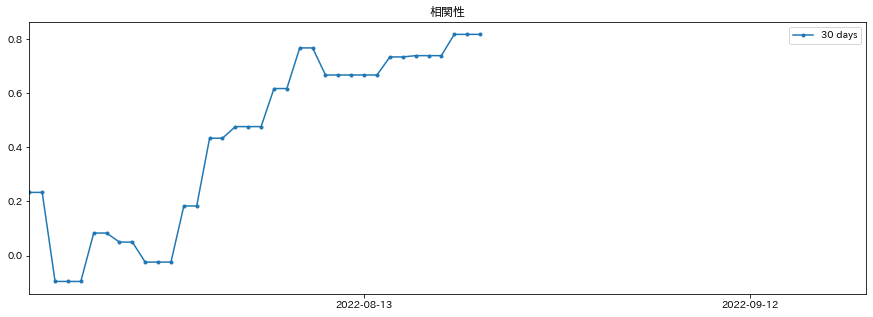

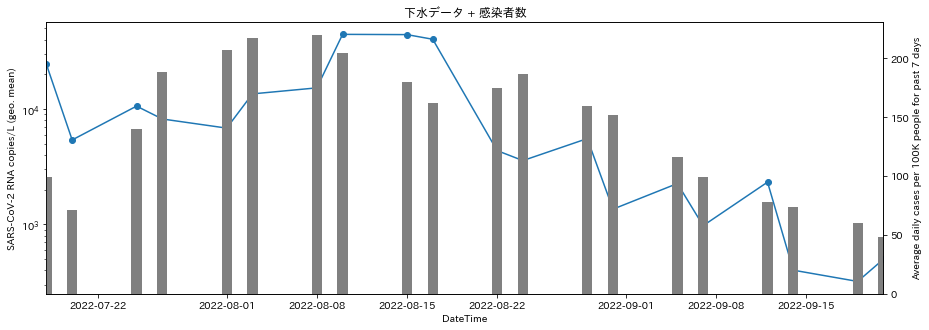

{}

In [336]:
# Analysis for time dependence of the data
df_tgt = df_geom_src_id_0[df_geom_src_id_0["geom_id_0"]==1].copy()
df_tgt = df_tgt[df_tgt["lab_id"]!="RBI"].copy()
df_tgt["dateTime"] = pd.to_datetime(df_tgt["sampling_date"],format="%Y/%m/%d")
#df_tgt = df_tgt[df_tgt["dateTime"]>"2022/06/25"]
#df_tgt = df_tgt[df_tgt["dateTime"]<"2022/09/1"]
mean_idx = "geo_mean_usemeas"
mean_idx = "geo_mean_usetloq"
mean_idx = "geo_mean_uselloq"
#mean_idx = "geo_mean_normalized_usemeas"
phd_idx = "val_7_d_conf_report_10"
#hd_idx = "val_7_d_conf_report"



s_date=df_tgt.head(1)["dateTime"].iloc[0]
e_date=df_tgt.tail(1)["dateTime"].iloc[0]
print(s_date,e_date,type(s_date))
this_date = s_date
next_date = s_date + datetime.timedelta(days=30)

plot_time_series(df_tgt,"phd_date",mean_idx,z_idx=phd_idx,log=True,interpolate=False, min_lim_x=s_date,max_lim_x=e_date)

plot_scatter(df_tgt,mean_idx,phd_idx, draw=True, title="All", figure_size=(10,8),legend=True)

window_list = [30]
#window_list = [30,60]
df_compare = pd.DataFrame()
for iwindow in window_list:
    # Loop over windows
    gr_x_sp = []
    gr_y_sp = []
    gr_y_lp = []
    gr_min_conf = []
    gr_mean_conf = []
    gr_max_conf = []
    gr_ud_rate = [] #定性以上率
    gr_blq_rate = [] #定性以上率
    gr_det_rate = [] #定性以上率
    gr_qua_rate = [] #定量化率
    gr_slope_ww = []
    best_df = pd.DataFrame()
    best_sp = -1
    i=0
    while(True):
        this_date=s_date+datetime.timedelta(days=i)
        next_date=s_date+datetime.timedelta(days=i + iwindow)
        if next_date>e_date:
            break
        # time cut
        df_tmp = df_tgt[df_tgt["dateTime"]>this_date]
        df_tmp = df_tmp[df_tmp["dateTime"]<=next_date]
        # Get columns
        df_monthly = df_tmp[["dateTime",phd_idx,mean_idx]]        
        # Plot correlations
        if(len(df_monthly)>1):
            rlts = plot_scatter(df_monthly,mean_idx,phd_idx, draw=False, title="Monthly"+str(this_date), figure_size=(10,8),legend=True)
            gr_x_sp.append(this_date)
            gr_y_sp.append(rlts["spearman"][0])
            gr_y_lp.append(rlts["pearson"][0])
            if(rlts["spearman"][0]>best_sp):
                best_df = df_monthly.copy()
            # Get min/max
            gr_min_conf.append(df_monthly[phd_idx].min())
            gr_max_conf.append(df_monthly[phd_idx].max())
            gr_mean_conf.append(df_monthly[phd_idx].mean())
            # Slope in the window
            slope_ww = (df_monthly.tail(1)[mean_idx].max()-df_monthly.head(1)[mean_idx].max())/iwindow
            gr_slope_ww.append(np.abs(slope_ww))
            # Get rates
            ud_rate = len(df_tmp[df_tmp[mean_idx]<=1])/len(df_tmp)
            blq_rate = len(df_tmp[df_tmp[mean_idx]<=431])/len(df_tmp) - ud_rate
            qua_rate = 1 - ud_rate - blq_rate
            gr_ud_rate.append(ud_rate)
            gr_blq_rate.append(blq_rate+ud_rate)
            gr_det_rate.append(qua_rate+blq_rate)
            gr_qua_rate.append(qua_rate)

        i=i+1
    
    # Plot best
    #plot_scatter(best_df,"covn_1_tbl","val_7_d_conf_report_p10m", draw=True, title="Best Monthly:"+str(iwindow), figure_size=(10,8),legend=False)
    
    # Creating a dictionary
    d = {'corSp':gr_y_sp,
         'dateTime':gr_x_sp,
         'min_conf':gr_min_conf,
         'max_conf':gr_max_conf,
         'mean_conf':gr_mean_conf,
         'ud_rate':gr_ud_rate,
         'blq_rate':gr_blq_rate,
         'det_rate':gr_det_rate,
         'qua_rate':gr_qua_rate,
         'slope_ww':gr_slope_ww,
         'window':[ str(iwindow)+" days" for i in gr_x_sp]}
    
    # Creating dataframe
    df_cor = pd.DataFrame(d)
    # Append data frame
    df_compare = df_compare.append(df_cor)

plot_time_series(df_compare, "dateTime", "ud_rate", break_idx="window",subplot=False,log=False, marker=".",title="Undetermined rate for each window", min_lim_x=s_date,max_lim_x=e_date)
plot_time_series(df_compare, "dateTime", "blq_rate", break_idx="window",subplot=False,log=False, marker=".",title="Below limit of qualitifcation rate for each window", min_lim_x=s_date,max_lim_x=e_date)
plot_time_series(df_compare, "dateTime", "det_rate", break_idx="window",subplot=False,log=False, marker=".",title="Detected rate for each window", min_lim_x=s_date,max_lim_x=e_date)
plot_time_series(df_compare, "dateTime", "qua_rate", break_idx="window",subplot=False,log=False, marker=".",title="Quantity rate for each window", min_lim_x=s_date,max_lim_x=e_date)
plot_time_series(df_compare, "dateTime", "mean_conf", break_idx="window",subplot=False,log=False, marker=".",title="Mean confirmed case for each window", min_lim_x=s_date,max_lim_x=e_date)
plot_time_series(df_compare, "dateTime", "min_conf", break_idx="window",subplot=False,log=False, marker=".",title="Miniumn confirmed case for each window", min_lim_x=s_date,max_lim_x=e_date)
plot_time_series(df_compare, "dateTime", "max_conf", break_idx="window",subplot=False,log=False, marker=".",title="Maximum confirmed case for each window", min_lim_x=s_date,max_lim_x=e_date)
plot_time_series(df_compare, "dateTime", "slope_ww", break_idx="window",subplot=False,log=True, marker=".",title="Slope of WW data for each window", min_lim_x=s_date,max_lim_x=e_date)
plot_time_series(df_compare, "dateTime", "corSp", break_idx="window",subplot=False,log=False, marker=".",title="相関性", min_lim_x=s_date,max_lim_x=e_date)
plot_time_series(df_tgt, "phd_date",mean_idx,z_idx=phd_idx, subplot=False, log=True,title="下水データ + 感染者数", min_lim_x=s_date,max_lim_x=e_date)


In [93]:
df_tmp = df_star_rbi[df_star_rbi["covn_1_tbl_star"].notna()]
df_tmp = df_tmp[df_tmp["covn_1_tbl_rbi"].notna()]
df_tmp

,pmmov_tbl_peg,covn_1_tbl_peg,site_id,sampling_date,pmmov_tbl_star,covn_1_tbl_star,pmmov_tbl_rbi,covn_1_tbl_rbi,covn_1_to_pmmov_rbi,covn_1_to_pmmov_star,covn_1_to_pmmov_peg
0,NaN,NaN,f00031,2022-07-19,2470000.0,21800.0,60000000.0,2205.882353,0.000037,0.008826,NaN
1,NaN,NaN,f00031,2022-07-22,2570000.0,12400.0,74300000.0,55300.000000,0.000744,0.004825,NaN
2,NaN,NaN,f00031,2022-07-26,4180000.0,18600.0,193000000.0,142000.000000,0.000736,0.004450,NaN
3,NaN,NaN,f00031,2022-07-29,4040000.0,65700.0,178000000.0,169000.000000,0.000949,0.016262,NaN
4,NaN,NaN,f00031,2022-08-02,2080000.0,18000.0,171000000.0,197000.000000,0.001152,0.008654,NaN
5,NaN,NaN,f00031,2022-08-05,2830000.0,23500.0,54000000.0,48600.000000,0.000900,0.008304,NaN
6,NaN,NaN,f00031,2022-08-09,3570000.0,19600.0,85100000.0,93300.000000,0.001096,0.005490,NaN
7,NaN,NaN,f00031,2022-08-19,4240000.0,13200.0,49100000.0,59600.000000,0.001214,0.003113,NaN
8,NaN,NaN,f00031,2022-08-23,3300000.0,4250.0,185000000.0,129000.000000,0.000697,0.001288,NaN
9,NaN,NaN,f00031,2022-08-26,2280000.0,4310.0,124000000.0,47800.000000,0.000385,0.001890,NaN


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


EPISENS: (0.3605949393995843, 1.5749420303910117e-06)
COPMAN: (0.5804432753308136, 0.0046232041252573875)


ValueError: x and y must have length at least 2.

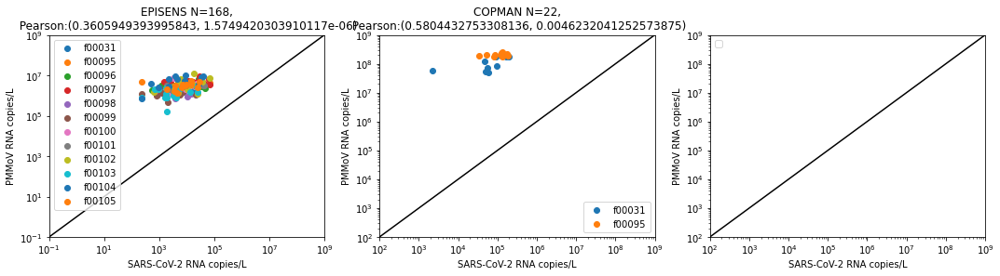

In [94]:
# Plot covn pmmov correlation
fig = plt.figure(figsize=(18, 4))
#fig.suptitle("SARS-CoV-2 (N1) vs PMMoV \n\n")
ax1 = fig.add_subplot(131)
ax1.set_ylabel(label_dicts["pmmov_tbl"])
ax1.set_xlabel(label_dicts["covn_1_tbl"])
ax1.set_xlim(1e-1,1e9)
ax1.set_ylim(1e-1,1e9)
ax1.set_xscale('log')
ax1.set_yscale('log')
x = np.linspace(1e-1,1e9,100)
y1 = x
ax1.plot(x,y1,color="black")
df_tmp = df_star_rbi[["covn_1_tbl_star","pmmov_tbl_star","site_id"]].dropna()
#plt.scatter(x=df_tmp["covn_1_tbl_star"], y=df_tmp["pmmov_tbl_star"])
plot_scatter(df_tmp,x_idx="covn_1_tbl_star", y_idx="pmmov_tbl_star", break_idx="site_id")

rlts = stats.pearsonr(df_tmp["covn_1_tbl_star"],df_tmp["pmmov_tbl_star"])
print("EPISENS:",rlts)
ax1.title.set_text("EPISENS N=" + str(len(df_tmp)) + ",\n Pearson:" + str(rlts))

ax1 = fig.add_subplot(132)
ax1.set_ylabel(label_dicts["pmmov_tbl"])
ax1.set_xlabel(label_dicts["covn_1_tbl"])
ax1.set_xlim(1e2,1e9)
ax1.set_ylim(1e2,1e9)
ax1.set_xscale('log')
ax1.set_yscale('log')
x = np.linspace(1e2,1e9,100)
y1 = x
ax1.plot(x,y1,color="black")
df_tmp = df_star_rbi[["covn_1_tbl_rbi","pmmov_tbl_rbi","site_id"]].dropna()
#plt.scatter(x=df_tmp["covn_1_tbl_rbi"], y=df_tmp["pmmov_tbl_rbi"])
plot_scatter(df_tmp,x_idx="covn_1_tbl_rbi", y_idx="pmmov_tbl_rbi", break_idx="site_id")
rlts = stats.pearsonr(df_tmp["covn_1_tbl_rbi"],df_tmp["pmmov_tbl_rbi"])
print("COPMAN:",rlts)
ax1.title.set_text("COPMAN N=" + str(len(df_tmp)) + ",\n Pearson:" + str(rlts))

ax1 = fig.add_subplot(133)
ax1.set_ylabel(label_dicts["pmmov_tbl"])
ax1.set_xlabel(label_dicts["covn_1_tbl"])
ax1.set_xlim(1e2,1e9)
ax1.set_ylim(1e2,1e9)
ax1.set_xscale('log')
ax1.set_yscale('log')
x = np.linspace(1e2,1e9,100)
y1 = x
ax1.plot(x,y1,color="black")
df_tmp = df_star_rbi[["covn_1_tbl_peg","pmmov_tbl_peg","site_id"]].dropna()
#plt.scatter(x=df_tmp["covn_1_tbl_peg"], y=df_tmp["pmmov_tbl_peg"])
plot_scatter(df_tmp,x_idx="covn_1_tbl_peg", y_idx="pmmov_tbl_peg", break_idx="site_id")
rlts = stats.pearsonr(df_tmp["covn_1_tbl_peg"],df_tmp["pmmov_tbl_peg"])
print("PEG:",rlts)
ax1.title.set_text("PEG N=" + str(len(df_tmp)) + ",\n Pearson:" + str(rlts))

Index(['sample_id', 'event_name', 'lab_id', 'original_file_name', 'group_id',
       'group_type', 'polygon_id_x', 'site_id', 'site_name_x',
       'registerd_name', 'geo_coor', 'quality_flag', 'covn_1', 'pmmov',
       'covn_1_d', 'covn_1_ud', 'covn_1_blq', 'pmmov_d', 'pmmov_ud',
       'pmmov_blq', 'covn_1_pmmov', 'covn_1_tbl', 'pmmov_tbl', 'covn1_tloq',
       'covn1_lloq', 'pmmov_tloq', 'pmmov_lloq', 'assay_method', 'rmk_covn_1',
       'rmk_pmmov', 'unit', 'collection', 'sample_type', 'sampler',
       'sampling_date', 'polygon_name', 'pop_1000', 'pmmov_tbl_p10m',
       'covn_1_tbl_p10m', 'covn_1_pmmov_1e4', 'covn_1_pmmov_1e4_p10m',
       'covn_1_blq_tloq', 'geom_id', '_fivetran_deleted', '_fivetran_synced',
       'confirmed_case_oper', 'geom_id_0', 'geom_id_1', 'geom_id_2',
       'polygon_id_y', 'site_name_y', 'datetime', 'val_conf_report',
       'val_7_d_conf_report'],
      dtype='object')

In [96]:
# Set according lab
df_rbi = df_geom_id_2[df_geom_id_2["lab_id"]=="RBI"]
df_star = df_geom_id_2[df_geom_id_2["assay_method"]=="HS"]
df_peg = df_geom_id_2[df_geom_id_2["assay_method"]=="PEG"]
df_rbi[["sampling_date","covn_1_tbl","pmmov_tbl","val_7_d_conf_report"]]

,sampling_date,covn_1_tbl,pmmov_tbl,val_7_d_conf_report
1,2022-07-19,2205.882353,60000000.0,962.000000
3,2022-07-22,55300.000000,74300000.0,2908.250000
5,2022-07-26,142000.000000,193000000.0,3604.000000
7,2022-07-29,169000.000000,178000000.0,3964.714286
9,2022-08-02,197000.000000,171000000.0,3982.428571
11,2022-08-05,48600.000000,54000000.0,4088.285714
13,2022-08-09,93300.000000,85100000.0,3964.571429
15,2022-08-19,59600.000000,49100000.0,2974.285714
17,2022-08-23,129000.000000,185000000.0,3313.428571
19,2022-08-26,47800.000000,124000000.0,3027.714286


In [97]:
def draw_scatter(df_rbi, df_star, title_suf="", x_label="",y_label="",alpha=0.5):
    df_check_blq = df_star[df_star["covn_1_tbl"]<300]
    # Plot phd vs virus results
    fig = plt.figure(figsize=(12, 4))
    fig.suptitle( x_label + " vs " + y_label + " Public Health Data VS Virus in WW "+title_suf)
    # Before normalised
    ax1 = fig.add_subplot(121)
    ax1.title.set_text("Before Normalised")
    ax1.set_xlabel(label_dicts["covn_1_tbl"])
    ax1.set_ylabel(label_dicts["val_7_d_conf_report"])
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    #ax1.set_xlim(1e2,1e6)
    #ax1.set_ylim(1,1e5)
    if len(df_rbi)!=0:
        ax1.scatter(x=df_rbi["covn_1_tbl"], y=df_rbi["val_7_d_conf_report"],marker=".",color="blue", label=x_label)
    if len(df_star)!=0:
        ax1.scatter(x=df_star["covn_1_tbl"], y=df_star["val_7_d_conf_report"],marker=".",color="red", label=y_label,alpha=alpha)
        ax1.scatter(x=df_check_blq["covn_1_tbl"], y=df_check_blq["val_7_d_conf_report"],marker=".",color="green", label=y_label+" (check BLQ)",alpha=alpha)
    ax1.legend()

    # PMMoV normalised
    ax1 = fig.add_subplot(122)
    ax1.title.set_text("PMMoV Normalised")
    ax1.set_xlabel(label_dicts["covn_1_pmmov_1e4"])
    ax1.set_ylabel(label_dicts["val_7_d_conf_report"])
    ax1.set_xscale('log')
    ax1.set_yscale('log')
    #ax1.set_xlim(1e-2,1e4)
    #ax1.set_ylim(1,1e5)
    gx_1 = df_rbi["covn_1_tbl"]/df_rbi["pmmov_tbl"]
    #gx_1 = df_rbi["covn_1_pmmov"]
    gx_2 = df_star["covn_1_tbl"]/df_star["pmmov_tbl"]
    #gx_2 = df_star["covn_1_pmmov"]
    if len(df_rbi)!=0:
        ax1.scatter(x=gx_1, y=df_rbi["val_7_d_conf_report"],marker=".",color="blue", label=x_label)
    if len(df_star)!=0:
        ax1.scatter(x=gx_2, y=df_star["val_7_d_conf_report"],marker=".",color="red", label=y_label,alpha=alpha)
        # Check bql
        gx_2 = df_check_blq["covn_1_tbl"]/df_check_blq["pmmov_tbl"]
        ax1.scatter(x=gx_2, y=df_check_blq["val_7_d_conf_report"],marker=".",color="green", label=y_label+" (check BLQ)",alpha=alpha)
    ax1.legend()

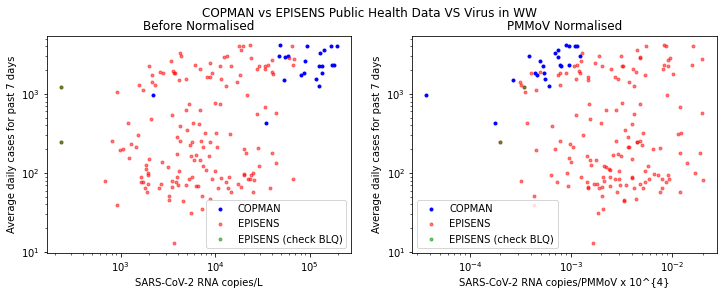

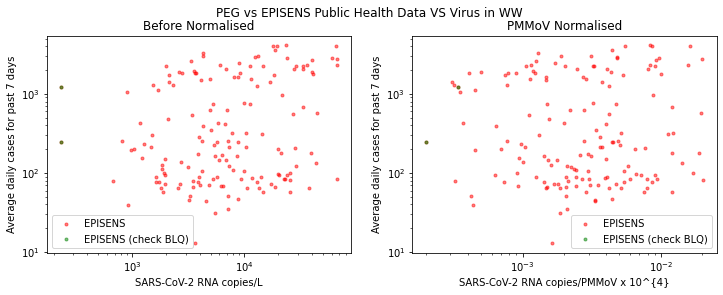

In [98]:
draw_scatter(df_rbi, df_star,x_label="COPMAN",y_label="EPISENS")
draw_scatter(df_peg, df_star,x_label="PEG",y_label="EPISENS")

Star:
159 168


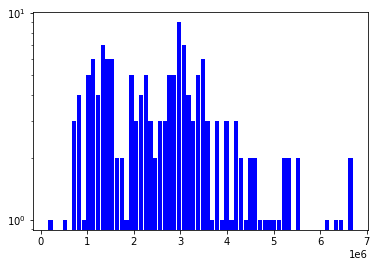

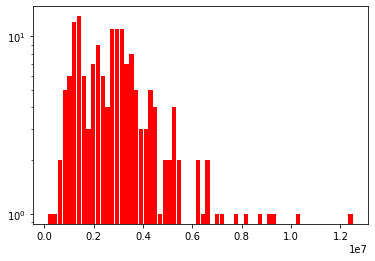

RBI:
20 22


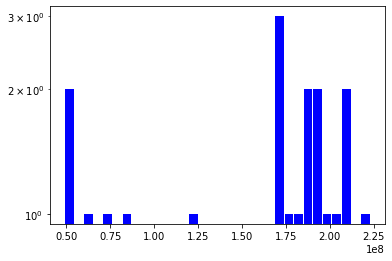

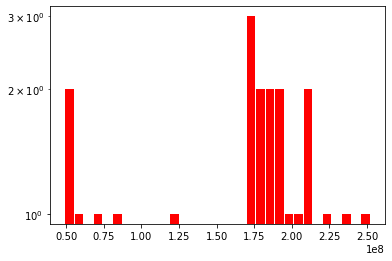

In [99]:
percentile = 95
# Drop 99 % of percentile
print("Star:")
s = df_star["pmmov_tbl"].dropna()
t = s[s <= np.percentile(s, percentile)]

print(len(t),len(s))
t.hist( bins=64, grid=False, rwidth=.9, color='blue', log=True)
plt.show()
s.hist( bins=64, grid=False, rwidth=.9, color='red', log=True)
plt.show()
# Drop 99 % of percentile
print("RBI:")
s = df_rbi["pmmov_tbl"].dropna()
t = s[s <= np.percentile(s, percentile)]
print(len(t),len(s))
t.hist( bins=32, grid=False, rwidth=.9, color='blue', log=True)
plt.show()
s.hist( bins=32, grid=False, rwidth=.9, color='red', log=True)
plt.show()

['f00031' 'f00095' 'f00096' 'f00097' 'f00098' 'f00099' 'f00100' 'f00101'
 'f00102' 'f00103' 'f00104' 'f00105']
f00031
f00095
f00096
f00097
f00098
f00099
f00100
f00101
f00102
f00103
f00104
f00105


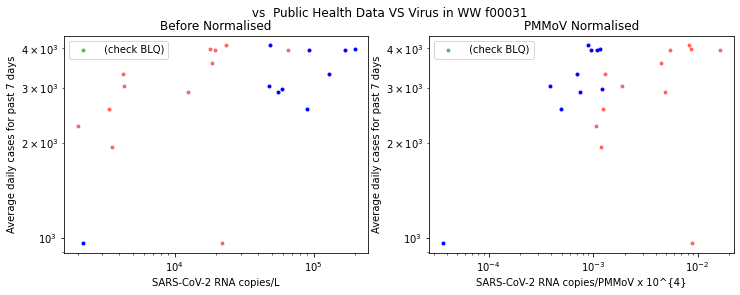

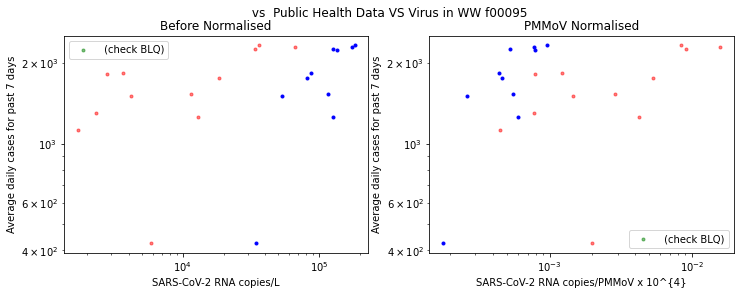

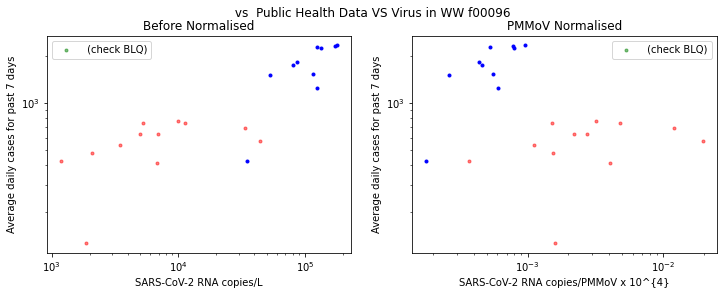

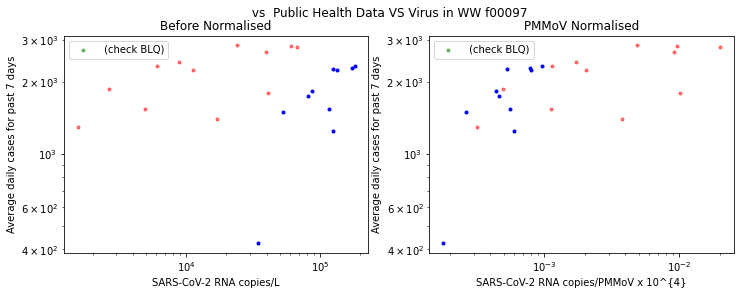

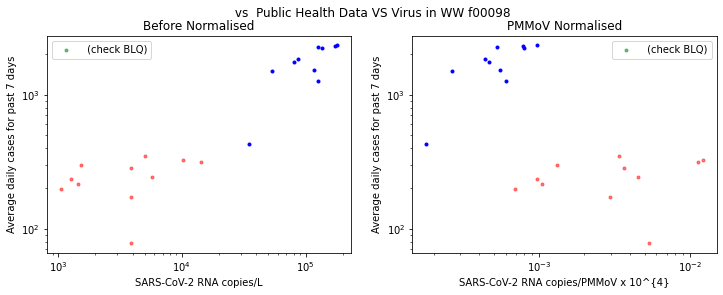

...

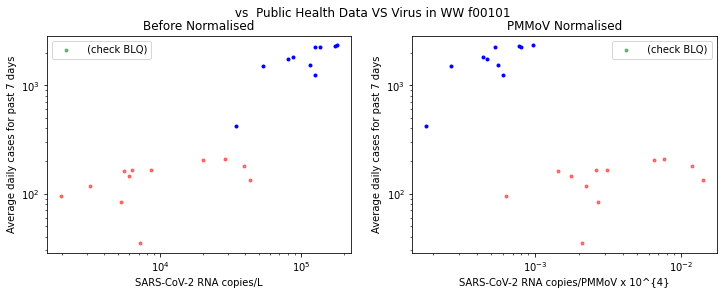

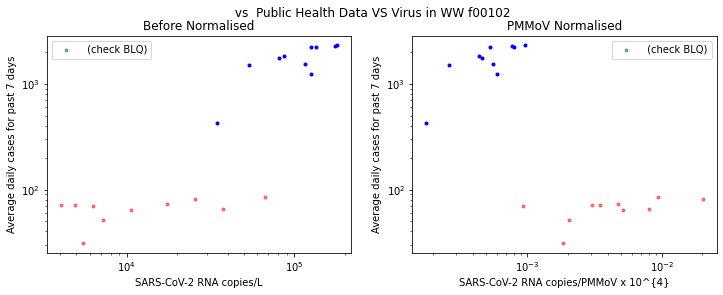

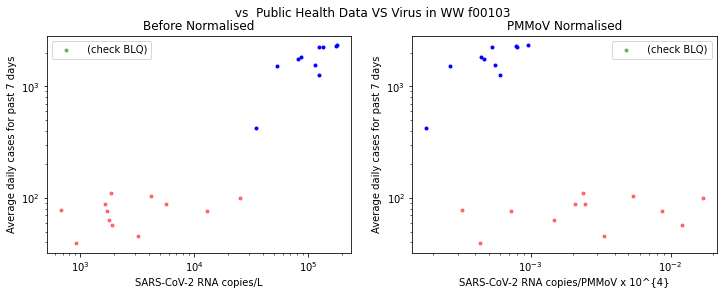

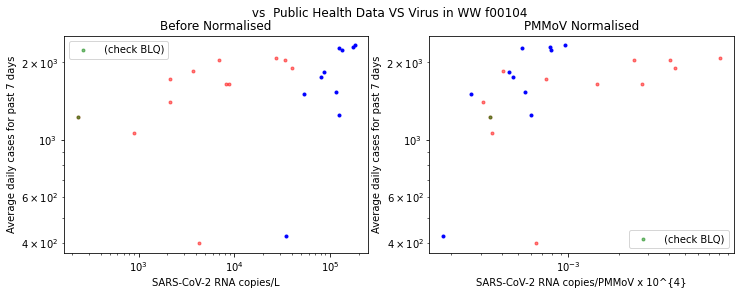

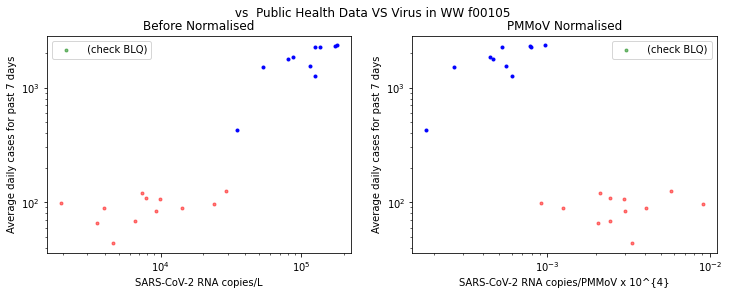

In [100]:
sites = df_star["site_id"].unique()
print(sites)
for isite in sites:
    df_star_site = df_star[df_star["site_id"]==isite].copy()
    df_rbi_site = df_rbi[df_rbi["site_id"]==isite].copy()
    
    if len(df_star_site) !=0:
        s = df_star_site["pmmov_tbl"]
        cut = np.percentile(s, percentile)
        t_star = df_star_site[ df_star_site["pmmov_tbl"] <cut]
    if len(df_rbi_site) !=0:
        s = df_rbi_site["pmmov_tbl"]
        cut = np.percentile(s, percentile)
        t_rbi = df_rbi_site[ df_rbi_site["pmmov_tbl"]  < cut]
    
    draw_scatter(t_rbi, t_star, title_suf=isite)
    print(isite)